In [ ]:
import csv
import pandas as pd
import heapq
import numpy as np
import math
np.set_printoptions(threshold=np.inf, linewidth=150, edgeitems=10)
import itertools
import scipy
from scipy.spatial.distance import pdist, squareform
import matplotlib.pyplot as plt
from os import listdir
from os.path import isfile, join
import matplotlib.patches as mpatches
import statsmodels.api as sm
import seaborn as sns

In [ ]:
!pip install statsmodels pandas

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
cd /content/drive/MyDrive/trajectory_analysis

/content/drive/MyDrive/trajectory_analysis


# **Extracting Trajectories with the Navigation Data**

In [ ]:
# Path to data
main_file_path = '/content/drive/MyDrive/trajectory_analysis/OnlineNavigation/navigation.csv'
record_file_path = '/content/drive/MyDrive/trajectory_analysis/OnlineNavigation/recordscore.csv'

# Read the CSV files
main_data = pd.read_csv(main_file_path)
record_data = pd.read_csv(record_file_path)

# Ensure the necessary columns are present in the main data
required_columns = ['participantid', 'trialnum', 'timerecorded', 'x', 'y', 'rotx', 'roty']
if not all(column in main_data.columns for column in required_columns):
    raise ValueError("Input CSV does not contain all required columns")

# Ensure the necessary columns are present in the record data
required_record_columns = ['participantid', 'freerecallscore']
if not all(column in record_data.columns for column in required_record_columns):
    raise ValueError("Recordscore CSV does not contain all required columns")

# Filter participants with 'freerecallscore' greater than 1
valid_participants = record_data[record_data['freerecallscore'] > 1]['participantid'].unique()

# Filter the main data to include only valid participants
filtered_main_data = main_data[main_data['participantid'].isin(valid_participants)]

# Identify participants who have all trials from 1 to 8
trial_counts = filtered_main_data[filtered_main_data['trialnum'].between(1, 8)].groupby('participantid')['trialnum'].nunique()
participants_with_all_trials = trial_counts[trial_counts == 8].index

# Further filter the data for participants who have all required trials
final_filtered_data = filtered_main_data[filtered_main_data['participantid'].isin(participants_with_all_trials)]

# Get unique participant IDs from the final filtered data
participant_ids = final_filtered_data['participantid'].unique()

# Separate data by participant ID and write to separate CSV files
for participant_id in participant_ids:
    participant_data = final_filtered_data[final_filtered_data['participantid'] == participant_id]
    # Sort by trialnum and then by timestamp
    participant_data = participant_data.sort_values(by=['trialnum', 'timerecorded'])
    output_file = f'/content/drive/MyDrive/trajectory_analysis/OnlineNavigation/Navigation/participant_{participant_id}.csv'
    participant_data.to_csv(output_file, index=False)
    print(f'Data for participant {participant_id} written to {output_file}')

print(f"Total number of participants processed: {len(participant_ids)}")


Data for participant 6643d35c8bbc62751f1c746c written to /content/drive/MyDrive/trajectory_analysis/OnlineNavigation/Navigation/participant_6643d35c8bbc62751f1c746c.csv
Data for participant 668d655ff5755515179cd089 written to /content/drive/MyDrive/trajectory_analysis/OnlineNavigation/Navigation/participant_668d655ff5755515179cd089.csv
Data for participant 661e74ab1c19b177f9c5bb14 written to /content/drive/MyDrive/trajectory_analysis/OnlineNavigation/Navigation/participant_661e74ab1c19b177f9c5bb14.csv
Data for participant 65fb031e18b57d13b4e9e647 written to /content/drive/MyDrive/trajectory_analysis/OnlineNavigation/Navigation/participant_65fb031e18b57d13b4e9e647.csv
Data for participant 601b28841ca7bb2f8edaa293 written to /content/drive/MyDrive/trajectory_analysis/OnlineNavigation/Navigation/participant_601b28841ca7bb2f8edaa293.csv
Data for participant 667838be776b27f8705b6c3c written to /content/drive/MyDrive/trajectory_analysis/OnlineNavigation/Navigation/participant_667838be776b27f

In [ ]:
#put coordinate data for each trial in its own array
def trials(file):
    trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = [], [], [], [], [], [], [], []

    with open(file, newline='') as navigation_data:
        read = csv.reader(navigation_data, delimiter=',', quotechar='|')
        #first_line = csv.reader(navigation_data)
        headers = next(read)
        for row in read:
            if row[1] == '1':
                trial1.append((float(row[3]), float(row[4])))
            elif row[1] == '2':
                trial2.append((float(row[3]), float(row[4])))
            elif row[1] == '3':
                trial3.append((float(row[3]), float(row[4])))
            elif row[1] == '4':
                trial4.append((float(row[3]), float(row[4])))
            elif row[1] == '5':
                trial5.append((float(row[3]), float(row[4])))
            elif row[1] == '6':
                trial6.append((float(row[3]), float(row[4])))
            elif row[1] == '7':
                trial7.append((float(row[3]), float(row[4])))
            elif row[1] == '8':
                trial8.append((float(row[3]), float(row[4])))

    return trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8

In [ ]:
def plot_grid_with_buildings():
    plt.figure(figsize=(10, 10))

    # Set up the grid
    x_min, x_max = -60, 70
    y_min, y_max = -70, 70
    grid_size = 10

    plt.xlim(x_min, x_max)
    plt.ylim(y_min, y_max)

    plt.xticks(range(x_min, x_max + 1, grid_size))
    plt.yticks(range(y_min, y_max + 1, grid_size))
    plt.grid(True)

    # Define building coordinates (center of the cells)
    building_coords = {
        1: (-55, -55), 2: (-55, 5), 3: (-55, 35), 4: (-55, 65),
        5: (-35, -35), 6: (-35, 25), 7: (-5, -65), 8: (-15, 55),
        9: (15, 55), 10: (-5, 15), 11: (-5, -15), 12: (15, 25),
        13: (35, 25), 14: (55, 25), 15: (55, -15), 16: (25, -55),
        17: (45, -55), 18: (65, -65), 19: (55, 55)
    }

    # Define store front coordinates (assumed to correspond to building numbers)
    store_front_coords = {
        1: (-50, -55), 2: (-50, 5), 3: (-50, 35), 4: (-50, 65),
        5: (-30, -35), 6: (-30, 25), 7: (-5, -60), 8: (-15, 60),
        9: (20, 55), 10: (-10, 15), 11: (0, -15), 12: (10, 25),
        13: (30, 25), 14: (60, 25), 15: (60, -15), 16: (25, -50),
        17: (45, -50), 18: (60, -65), 19: (60, 55)
    }

    # Read the walls data from the CSV file
    walls_data = pd.read_csv('/content/drive/MyDrive/trajectory_analysis/OnlineNavigation/walls.csv')

    # Extract the X_origin and Z_origin columns
    x_origins = walls_data['X_origin']
    z_origins = walls_data['Z_origin']

    # Determine wall cells by calculating their centers
    wall_cells = set()
    for x_origin, z_origin in zip(x_origins, z_origins):
        x_center = round((x_origin // grid_size) * grid_size + grid_size / 2)
        y_center = round((z_origin // grid_size) * grid_size + grid_size / 2)
        wall_cells.add((x_center, y_center))

    # Remove wall cells that are also building cells to ensure buildings take precedence
    building_cells = set(building_coords.values())
    wall_cells = wall_cells - building_cells

    # Shade wall cells in gray
    for coord in wall_cells:
        x_center, y_center = coord
        # Calculate bottom-left corner of the cell
        x = x_center - grid_size / 2
        y = y_center - grid_size / 2
        plt.fill_betweenx([y, y + grid_size], x, x + grid_size, color='gray', alpha=0.3)
        # Optional: Remove or comment out the following line if you don't want wall markers
        # plt.plot(x_center, y_center, 'bs')  # Blue square at center

    # Shade the grid cells with buildings and number them
    for number, coord in building_coords.items():
        x_center, y_center = coord
        # Calculate bottom-left corner of the cell
        x = x_center - grid_size / 2
        y = y_center - grid_size / 2
        plt.fill_betweenx([y, y + grid_size], x, x + grid_size, color='red', alpha=0.3)
        # Removed the following line to avoid plotting red dots at building centers
        # plt.plot(x_center, y_center, 'ro')  # Red dot at center
        # Add the building number
        plt.text(x_center, y_center, str(number), color='white', fontsize=12,
                 ha='center', va='center', fontweight='bold')

    # Plot store front edges
    for number, sf_coord in store_front_coords.items():
        building_center = building_coords.get(number)
        if not building_center:
            print(f"Warning: Building number {number} not found in building_coords.")
            continue

        sf_x, sf_y = sf_coord
        b_x, b_y = building_center
        dx = sf_x - b_x
        dz = sf_y - b_y

        # Determine which edge the store front is on
        if dx == grid_size / 2 and dz == 0:
            # Right edge
            x = b_x + grid_size / 2
            y1 = b_y - grid_size / 2
            y2 = b_y + grid_size / 2
            plt.plot([x, x], [y1, y2], color='darkred', linewidth=2)
        elif dx == -grid_size / 2 and dz == 0:
            # Left edge
            x = b_x - grid_size / 2
            y1 = b_y - grid_size / 2
            y2 = b_y + grid_size / 2
            plt.plot([x, x], [y1, y2], color='darkred', linewidth=2)
        elif dz == grid_size / 2 and dx == 0:
            # Top edge
            y = b_y + grid_size / 2
            x1 = b_x - grid_size / 2
            x2 = b_x + grid_size / 2
            plt.plot([x1, x2], [y, y], color='darkred', linewidth=2)
        elif dz == -grid_size / 2 and dx == 0:
            # Bottom edge (not present in current data)
            y = b_y - grid_size / 2
            x1 = b_x - grid_size / 2
            x2 = b_x + grid_size / 2
            plt.plot([x1, x2], [y, y], color='darkred', linewidth=2)
        else:
            print(f"Warning: Store front coordinate {sf_coord} for building {number} does not align with expected edges.")

    # Create legend patches
    building_patch = mpatches.Patch(color='red', alpha=0.3, label='Building')
    wall_patch = mpatches.Patch(color='gray', alpha=0.3, label='Wall')
    store_front_patch = mpatches.Patch(color='darkred', label='Store Front Edge')  # Updated color

    plt.legend(handles=[building_patch, wall_patch, store_front_patch], loc='upper right')

    plt.xlabel('X Coordinate')
    plt.ylabel('Y Coordinate')
    plt.title('Top-Down Environment with Store Fronts')

    plt.show()

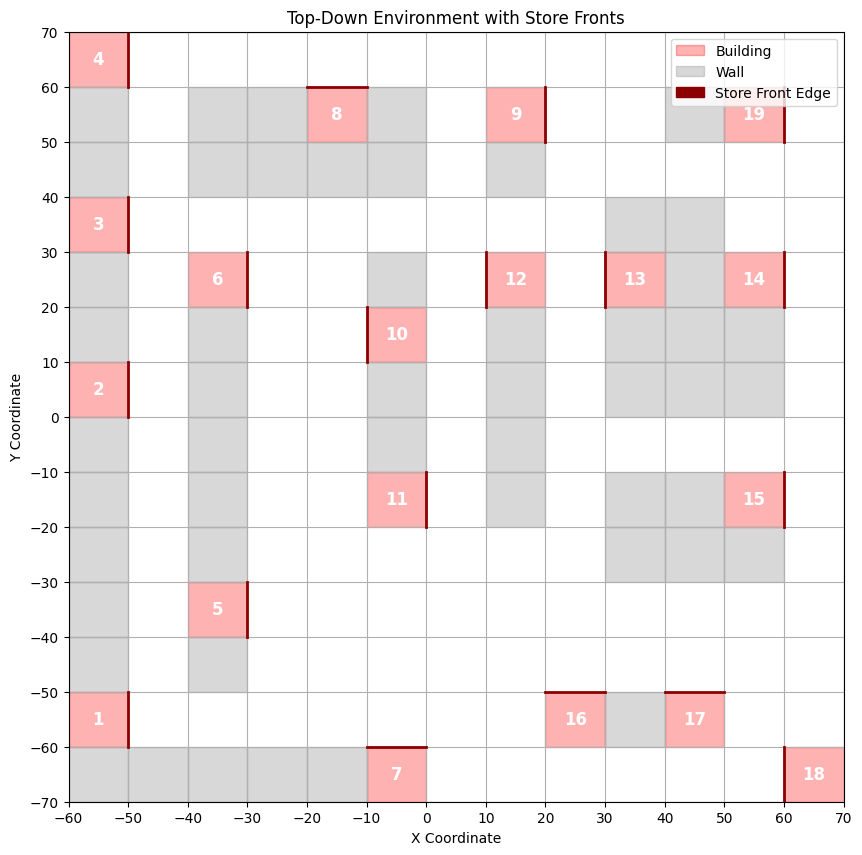

In [ ]:
plot_grid_with_buildings()

In [ ]:
import numpy as np
from matplotlib.patches import Arrow, PathPatch
from matplotlib.collections import PatchCollection
import matplotlib.pyplot as plt
import pandas as pd

#Add points between two points
def interpolate_points(point1, point2, interval=10):
    x1, y1 = point1
    x2, y2 = point2

    # Calculate the number of segments needed
    dx = x2 - x1
    dy = y2 - y1
    distance = np.sqrt(dx**2 + dy**2)
    num_segments = int(distance / interval)

    if num_segments <= 1:
        return [point1, point2]

    # Create interpolated points
    x_points = np.linspace(x1, x2, num_segments + 1)
    y_points = np.linspace(y1, y2, num_segments + 1)

    return list(zip(x_points, y_points))

#Create a trajectory with interpolated points
def create_interpolated_trajectory(discrete_trial, interval=10):
    interpolated_trajectory = []

    for i in range(len(discrete_trial) - 1):
        point1 = discrete_trial[i]
        point2 = discrete_trial[i + 1]

        # Get interpolated points between current pair of points
        points = interpolate_points(point1, point2, interval)

        # Add all points except the last one (to avoid duplicates)
        interpolated_trajectory.extend(points[:-1])

    # Add the final point
    interpolated_trajectory.append(discrete_trial[-1])
    return interpolated_trajectory

def graph_data_normal(trial):
    discrete_trial = convert_to_discrete(trial)

    # Create interpolated trajectory
    interpolated_trajectory = create_interpolated_trajectory(discrete_trial, interval=10)
    route_x, route_z = zip(*interpolated_trajectory)

    plt.figure(figsize=(10, 10))

    # Grid limits
    x_min, x_max = -60, 70
    y_min, y_max = -70, 70
    grid_size = 10

    plt.xlim(x_min, x_max)
    plt.ylim(y_min, y_max)

    plt.xticks(range(x_min, x_max + 1, grid_size))
    plt.yticks(range(y_min, y_max + 1, grid_size))
    plt.grid(True)

    # Center of shop coordinates
    building_coords = {
        1: (-55, -55), 2: (-55, 5), 3: (-55, 35), 4: (-55, 65),
        5: (-35, -35), 6: (-35, 25), 7: (-5, -65), 8: (-15, 55),
        9: (15, 55), 10: (-5, 15), 11: (-5, -15), 12: (15, 25),
        13: (35, 25), 14: (55, 25), 15: (55, -15), 16: (25, -55),
        17: (45, -55), 18: (65, -65), 19: (55, 55)
    }

    # Shade the grid cells with buildings and place red dots at the center
    for coord in building_coords.values():
        x_center, y_center = coord
        x = x_center - grid_size / 2
        y = y_center - grid_size / 2
        plt.fill_betweenx([y, y + grid_size], x, x + grid_size, color='red', alpha=0.3)
        plt.plot(x_center, y_center, 'ro')

    # Read the walls data
    walls_data = pd.read_csv("/content/drive/MyDrive/trajectory_analysis/OnlineNavigation/walls.csv")

    # Extract the coordinates of walls data
    x_origins = walls_data['X_origin']
    z_origins = walls_data['Z_origin']

    # Shade the grid cells and plot the points for walls
    for x_origin, z_origin in zip(x_origins, z_origins):
        x_center = round((x_origin // grid_size) * grid_size + grid_size / 2)
        y_center = round((z_origin // grid_size) * grid_size + grid_size / 2)
        x = x_center - grid_size / 2
        y = y_center - grid_size / 2
        plt.fill_betweenx([y, y + grid_size], x, x + grid_size, color='gray', alpha=0.5)
        plt.plot(x_origin, z_origin, 'ko')

    # Create a collection of arrows for the trajectory
    arrows = []
    for i in range(len(interpolated_trajectory) - 1):
        x1, y1 = interpolated_trajectory[i]
        x2, y2 = interpolated_trajectory[i + 1]

        # Calculate arrow properties
        dx = x2 - x1
        dy = y2 - y1

        # Create arrow patch
        arrow = Arrow(x1, y1, dx, dy, width=1.5)
        arrows.append(arrow)

    # Create a collection of arrows with blending for overlaps
    arrow_collection = PatchCollection(arrows,
                                     color='blue',
                                     alpha=0.3,  # Base transparency
                                     zorder=2)    # Ensure arrows are drawn on top of grid

    # Add the arrow collection to the plot
    plt.gca().add_collection(arrow_collection)

    # Add a second layer of arrows with lower alpha to create darker overlaps
    arrow_collection_overlay = PatchCollection(arrows,
                                             color='blue',
                                             alpha=0.1,  # Additional layer for overlaps
                                             zorder=3)
    plt.gca().add_collection(arrow_collection_overlay)

    plt.xlabel('X Coordinate')
    plt.ylabel('Y Coordinate')
    plt.title('Trajectory')
    plt.show()

In [ ]:
#Create 2D plot of raw trajectory and discretized trajectory
def graph_data(trial):
    # Preserve the raw trial data
    raw_trial = trial.copy()

    # Convert the trial data to discrete
    discrete_trial = convert_to_discrete(trial)

    # Extract raw route data
    raw_route_x, raw_route_z = zip(*raw_trial)

    # Extract discretized route data
    discrete_route_x, discrete_route_z = zip(*discrete_trial)

    plt.figure(figsize=(10, 10))

    # Grid limits
    x_min, x_max = -60, 70
    y_min, y_max = -70, 70
    grid_size = 10

    plt.xlim(x_min, x_max)
    plt.ylim(y_min, y_max)

    plt.xticks(range(x_min, x_max + 1, grid_size))
    plt.yticks(range(y_min, y_max + 1, grid_size))
    plt.grid(True)

    # Center of shop coordinates
    building_coords = {
        1: (-55, -55), 2: (-55, 5), 3: (-55, 35), 4: (-55, 65),
        5: (-35, -35), 6: (-35, 25), 7: (-5, -65), 8: (-15, 55),
        9: (15, 55), 10: (-5, 15), 11: (-5, -15), 12: (15, 25),
        13: (35, 25), 14: (55, 25), 15: (55, -15), 16: (25, -55),
        17: (45, -55), 18: (65, -65), 19: (55, 55)
    }

    # Shade the grid cells with buildings and place red dots at the center
    for coord in building_coords.values():
        x_center, y_center = coord
        # Calculate bottom-left corner of the cell
        x = x_center - grid_size / 2
        y = y_center - grid_size / 2
        plt.fill_betweenx([y, y + grid_size], x, x + grid_size, color='red', alpha=0.3)
        plt.plot(x_center, y_center, 'ro')  # Plot red dots at the center

    # Plot the discretized navigation route in green
    plt.plot(
        discrete_route_x,
        discrete_route_z,
        'go-',  # 'go-' creates a green line with circle markers
        label='Discretized Trajectory',
        linewidth=2,
        markersize=5
    )

    # Plot the raw navigation route in red
    plt.plot(
        raw_route_x,
        raw_route_z,
        'ro-',  # 'ro-' creates a red line with circle markers
        label='Raw Trajectory',
        alpha=0.7,
        linewidth=1,
        markersize=3
    )

    # Read the walls data
    walls_data = pd.read_csv("/content/drive/MyDrive/trajectory_analysis/OnlineNavigation/walls.csv")

    # Extract the coordinates of walls data
    x_origins = walls_data['X_origin']
    z_origins = walls_data['Z_origin']

    # Shade the grid cells and plot the points for walls
    for x_origin, z_origin in zip(x_origins, z_origins):
        # Find the center of the cell containing the point
        x_center = round((x_origin // grid_size) * grid_size + grid_size / 2)
        y_center = round((z_origin // grid_size) * grid_size + grid_size / 2)

        # Calculate bottom-left corner of the cell
        x = x_center - grid_size / 2
        y = y_center - grid_size / 2

        # Shade the cell in gray
        plt.fill_betweenx([y, y + grid_size], x, x + grid_size, color='gray', alpha=0.5)

        # Plot the point at the actual coordinates
        plt.plot(x_origin, z_origin, 'ko')  # 'ko' creates black dots for the points

    # Add labels and title
    plt.xlabel('X Coordinate')
    plt.ylabel('Z Coordinate')
    plt.title('Real and Discretized Trajectories')

    # Add a legend to differentiate the trajectories
    plt.legend(
        loc='upper right',          # Position the legend at the upper right
        bbox_to_anchor=(1, 1),      # Anchor the legend to the top right
        framealpha=0.9,             # Slightly transparent background
        fontsize='medium'           # Adjust font size as needed
    )

    # Display the plot
    plt.show()

In [ ]:
#Visualize the discretized navigation route of a given trial
def graph_data_discrete(trial):
    trial = convert_to_discrete(trial)

    # Extract route data
    route_x, route_z = zip(*trial)

    plt.figure(figsize=(10, 10))

    # Grid limits
    x_min, x_max = -60, 70
    y_min, y_max = -70, 70
    grid_size = 10

    plt.xlim(x_min, x_max)
    plt.ylim(y_min, y_max)

    plt.xticks(range(x_min, x_max + 1, grid_size))
    plt.yticks(range(y_min, y_max + 1, grid_size))
    plt.grid(True)

    # Center of shop coordinates
    building_coords = {
        1: (-55, -55), 2: (-55, 5), 3: (-55, 35), 4: (-55, 65),
        5: (-35, -35), 6: (-35, 25), 7: (-5, -65), 8: (-15, 55),
        9: (15, 55), 10: (-5, 15), 11: (-5, -15), 12: (15, 25),
        13: (35, 25), 14: (55, 25), 15: (55, -15), 16: (25, -55),
        17: (45, -55), 18: (65, -65), 19: (55, 55)
    }

    # Shade the grid cells with buildings and place red dots at the center
    for coord in building_coords.values():
        x_center, y_center = coord
        # Calculate bottom-left corner of the cell
        x = x_center - grid_size / 2
        y = y_center - grid_size / 2
        plt.fill_betweenx([y, y + grid_size], x, x + grid_size, color='red', alpha=0.3)
        plt.plot(x_center, y_center, 'ro')  # Plot red dots at the center

    # Plot the navigation route
    for i in range(len(route_x) - 1):
        plt.plot([route_x[i], route_x[i+1]], [route_z[i], route_z[i+1]], 'bo-', alpha=0.1)  # 'bo-' creates a blue line with dot markers

    # Read the walls data
    walls_data = pd.read_csv("/content/drive/MyDrive/trajectory_analysis/OnlineNavigation/walls.csv")

    # Extract the coordinates of walls data
    x_origins = walls_data['X_origin']
    z_origins = walls_data['Z_origin']

    # Shade the grid cells and plot the points for walls
    for x_origin, z_origin in zip(x_origins, z_origins):
        # Find the center of the cell containing the point
        x_center = round((x_origin // grid_size) * grid_size + grid_size / 2)
        y_center = round((z_origin // grid_size) * grid_size + grid_size / 2)

        # Calculate bottom-left corner of the cell
        x = x_center - grid_size / 2
        y = y_center - grid_size / 2

        # Shade the cell in gray
        plt.fill_betweenx([y, y + grid_size], x, x + grid_size, color='gray', alpha=0.5)

        # Plot the point at the actual coordinates
        plt.plot(x_origin, z_origin, 'ko')  # 'ko' creates black dots for the points

    plt.xlabel('X Coordinate')
    plt.ylabel('Z Coordinate')
    plt.title('Real Trajectory with Walls')
    plt.show()

In [ ]:
#plot total distance of each trial
def graph_distances(distances):
    plt.figure(figsize=(10, 10))
    x = np.array([1, 2, 3, 4, 5, 6, 7, 8])
    plt.plot(x, distances, 'bo-')

    plt.xlabel('Trial')
    plt.ylabel('Total Distance')
    plt.title('Total Distance vs Trial')
    plt.grid(True)
    plt.show()

In [ ]:
#calculate the total distance of the trajectory in a given trial
def distance(trial):
    route_x, route_z = zip(*trial)
    total_distance = 0;
    for i in range(1, len(route_x)):
        distance = np.sqrt((route_x[i-1] - route_x[i])**2 + (route_z[i-1] - route_z[i])**2)
        total_distance += distance
    return total_distance

In [ ]:
# Load the walls.csv file once at the beginning
walls_df = pd.read_csv('/content/drive/MyDrive/trajectory_analysis/OnlineNavigation/walls.csv')
blocked_tiles = set()

for index, row in walls_df.iterrows():
    x_center = row['X_origin']
    y_center = row['Z_origin']
    blocked_tiles.add((x_center, y_center))  # Center point of the blocked tile

def get_closest_unblocked_tile(point, xgrid, ygrid):
    for i in range(len(xgrid) - 1):
        for j in range(len(ygrid) - 1):
            if (xgrid[i] <= point[0] <= xgrid[i + 1]) and (ygrid[j] <= point[1] <= ygrid[j + 1]):
                x = (xgrid[i] + xgrid[i + 1]) / 2
                y = (ygrid[j] + ygrid[j + 1]) / 2
                if (x, y) not in blocked_tiles:
                    return (x, y)
    return (-99, 99)

def insert_intermediate_points(discrete_trajectory):
    i = 0
    while i < len(discrete_trajectory) - 1:
        point, next_point = discrete_trajectory[i], discrete_trajectory[i + 1]
        if (point[0] != next_point[0]) and (point[1] != next_point[1]):
            # Attempt to insert both possible intermediate points
            intermediate1 = (point[0], next_point[1])
            intermediate2 = (next_point[0], point[1])
            if intermediate1 not in blocked_tiles and intermediate2 in blocked_tiles:
                intermediate = intermediate1
            elif intermediate2 not in blocked_tiles and intermediate1 in blocked_tiles:
                intermediate = intermediate2
            elif intermediate1 not in blocked_tiles:
                intermediate = intermediate1
            elif intermediate2 not in blocked_tiles:
                intermediate = intermediate2
            else:
                intermediate = None

            if intermediate:
                discrete_trajectory.insert(i + 1, intermediate)
        i += 1
    return discrete_trajectory

def add_additional_points(discrete_trajectory, additional_points):
    def euclidean_distance(p1, p2):
        return math.sqrt((p1[0] - p2[0])**2 + (p1[1] - p2[1])**2)

    for new_point in additional_points:
        if new_point not in discrete_trajectory and new_point not in blocked_tiles:
            distances = [euclidean_distance(new_point, point) for point in discrete_trajectory]
            closest_index = distances.index(min(distances))
            discrete_trajectory.insert(closest_index, new_point)

    return discrete_trajectory

def convert_to_discrete(trajectory, apply_intermediate=True, apply_additional=True):
    additional_points = [(-45, 5), (-45, 35), (-45, 65), (-45, -55), (-25, -35), (-25, 25), (-15, 65), (-15, 15), (-5, -55),
                         (5, -15), (5, 25), (25, 55), (25, 25), (25, -45), (45, -45), (55, -65), (65, -15), (65, 25), (65, 55)]
    xgrid = [-60, -50, -40, -30, -20, -10, 0, 10, 20, 30, 40, 50, 60, 70]
    ygrid = [-70, -60, -50, -40, -30, -20, -10, 0, 10, 20, 30, 40, 50, 60, 70]

    # Convert trajectory points to integers to maintain consistency
    trajectory = [(int(round(point[0])), int(round(point[1]))) for point in trajectory]

    # Check if trajectory is already discrete
    discrete_trajectory = [get_closest_unblocked_tile(point, xgrid, ygrid) for point in trajectory]
    if discrete_trajectory == trajectory:
        # Return trajectory if already discrete and no additional processing is needed
        return discrete_trajectory

    # Optionally insert intermediate points to prevent diagonal moves
    if apply_intermediate:
        discrete_trajectory = insert_intermediate_points(discrete_trajectory)
        while any(discrete_trajectory[i][0] != discrete_trajectory[i + 1][0] and
                  discrete_trajectory[i][1] != discrete_trajectory[i + 1][1]
                  for i in range(len(discrete_trajectory) - 1)):
            discrete_trajectory = insert_intermediate_points(discrete_trajectory)

    # Optionally add additional points to ensure comprehensive discretization
    if apply_additional:
        discrete_trajectory = add_additional_points(discrete_trajectory, additional_points)
        discrete_trajectory = insert_intermediate_points(discrete_trajectory)

        # Final check for diagonal moves after adding additional points
        while any(discrete_trajectory[i][0] != discrete_trajectory[i + 1][0] and
                  discrete_trajectory[i][1] != discrete_trajectory[i + 1][1]
                  for i in range(len(discrete_trajectory) - 1)):
            discrete_trajectory = insert_intermediate_points(discrete_trajectory)

    # Convert all points in the final discrete trajectory to integers
    discrete_trajectory = [(int(round(point[0])), int(round(point[1]))) for point in discrete_trajectory]

    # Replace a starting sequence of (-45, -5) with (-45, 5) at the end of processing
    for i in range(len(discrete_trajectory)):
        if discrete_trajectory[i] == (-45, -5):
            discrete_trajectory[i] = (-45, 5)
        else:
            break

    return discrete_trajectory


In [ ]:
#Returns Frechet distance between two trajectories
def frechet(trajectory1, trajectory2):
    def point_distance(p1, p2):
        #Euclidean distance
        return np.sqrt(np.sum((np.array(p1) - np.array(p2)) ** 2))

    # Convert input trajectories to NumPy arrays for efficient computation
    traj1 = np.array(trajectory1)
    traj2 = np.array(trajectory2)

    # Create and initialize the dynamic programming matrix
    n, m = len(traj1), len(traj2)
    ca = np.full((n, m), np.inf)

    # Initialize the first cell
    ca[0, 0] = point_distance(traj1[0], traj2[0])

    # Fill the first row
    for j in range(1, m):
        ca[0, j] = max(ca[0, j-1], point_distance(traj1[0], traj2[j]))

    # Fill the first column
    for i in range(1, n):
        ca[i, 0] = max(ca[i-1, 0], point_distance(traj1[i], traj2[0]))

    # Fill the rest of the matrix
    for i in range(1, n):
        for j in range(1, m):
            direct_dist = point_distance(traj1[i], traj2[j])
            min_prev = min(ca[i-1, j], ca[i, j-1], ca[i-1, j-1])
            ca[i, j] = max(min_prev, direct_dist)

    return float(ca[n-1, m-1])

In [ ]:
#visualize trials
def visualize_trials():
    files = [f for f in listdir('OnlineNavigation/Navigation') if isfile(join('OnlineNavigation/Navigation', f))]

    x = [1, 2, 3, 4, 5, 6, 7, 8]

    trial1_distances, trial2_distances, trial3_distances, trial4_distances, trial5_distances, trial6_distances, trial7_distances, trial8_distances = [], [], [], [], [], [], [], []
    errors = []

    for file in files:
        trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = trials(f'OnlineNavigation/Navigation/{file}')
        trial1_discrete, trial2_discrete, trial3_discrete, trial4_discrete, trial5_discrete, trial6_discrete, trial7_discrete, trial8_discrete = convert_to_discrete(trial1), convert_to_discrete(trial2), convert_to_discrete(trial3), convert_to_discrete(trial4), convert_to_discrete(trial5), convert_to_discrete(trial6), convert_to_discrete(trial7), convert_to_discrete(trial8)

        print(file)

        print('trial 1')
        graph_data(trial1)
        print(distance(trial1))

        print('trial 2')
        graph_data(trial2)
        print(distance(trial2))

        print('trial 3')
        graph_data(trial3)
        print(distance(trial3))

        print('trial 4')
        graph_data(trial4)
        print(distance(trial4))

        print('trial 5')
        graph_data(trial5)
        print(distance(trial5))

        print('trial 6')
        graph_data(trial6)
        print(distance(trial6))

        print('trial 7')
        graph_data(trial7)
        print(distance(trial7))

        print('trial 8')
        graph_data(trial8)
        print(distance(trial8))

In [ ]:
#visualize_trials()

In [ ]:
#find a participant's best trial
def best_trial(trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8):
    best_trial = []
    best_distance = math.inf

    trials = [trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8]
    for trial in trials:
        cur_distance = distance(trial)
        if cur_distance < best_distance:
            best_distance = cur_distance
            best_trial = trial

    return best_trial

In [ ]:
# find a participant's worst trial
def worst_trial(trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8):
    worst_trial = []
    worst_distance = 0

    trials = [trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8]
    for trial in trials:
        cur_distance = distance(trial)
        if cur_distance > worst_distance:
            worst_distance = cur_distance
            worst_trial = trial

    return worst_trial

In [ ]:
#graph total distance vs trial num
def graph_total_distances():
    files = [f for f in listdir('OnlineNavigation/Navigation') if isfile(join('OnlineNavigation/Navigation', f))]

    x = [1, 2, 3, 4, 5, 6, 7, 8]

    trial1_distances, trial2_distances, trial3_distances, trial4_distances, trial5_distances, trial6_distances, trial7_distances, trial8_distances = [], [], [], [], [], [], [], []
    errors = []

    for file in files:
        trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = trials(f'OnlineNavigation/Navigation/{file}')
        trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = convert_to_discrete(trial1), convert_to_discrete(trial2), convert_to_discrete(trial3), convert_to_discrete(trial4), convert_to_discrete(trial5), convert_to_discrete(trial6), convert_to_discrete(trial7), convert_to_discrete(trial8)
        distance1, distance2, distance3, distance4, distance5, distance6, distance7, distance8 = distance(trial1), distance(trial2), distance(trial3), distance(trial4), distance(trial5), distance(trial6), distance(trial7), distance(trial8)
        distances = np.array([distance1, distance2, distance3, distance4, distance5, distance6, distance7, distance8])
        trial1_distances.append(distance1)
        trial2_distances.append(distance2)
        trial3_distances.append(distance3)
        trial4_distances.append(distance4)
        trial5_distances.append(distance5)
        trial6_distances.append(distance6)
        trial7_distances.append(distance7)
        trial8_distances.append(distance8)
        plt.plot(x, distances, 'bo-', alpha=0.4)

    average1 = np.average(trial1_distances)
    average2 = np.average(trial2_distances)
    average3 = np.average(trial3_distances)
    average4 = np.average(trial4_distances)
    average5 = np.average(trial5_distances)
    average6 = np.average(trial6_distances)
    average7 = np.average(trial7_distances)
    average8 = np.average(trial8_distances)
    averages = [average1, average2, average3, average4, average5, average6, average7, average8]

    err1 = np.std(trial1_distances)/math.sqrt(8)
    err2 = np.std(trial2_distances)/math.sqrt(8)
    err3 = np.std(trial3_distances)/math.sqrt(8)
    err4 = np.std(trial4_distances)/math.sqrt(8)
    err5 = np.std(trial5_distances)/math.sqrt(8)
    err6 = np.std(trial6_distances)/math.sqrt(8)
    err7 = np.std(trial7_distances)/math.sqrt(8)
    err8 = np.std(trial8_distances)/math.sqrt(8)
    standard_errors = [err1, err2, err3, err4, err5, err6, err7, err8]

    plt.plot(x, averages, 'ro-')
    plt.errorbar(x, averages, yerr=standard_errors, fmt='ko')
    plt.ylim(bottom=500)
    plt.xlabel('Trial')
    plt.ylabel('Total Distance')
    plt.title('Total Distance vs Trial')
    plt.grid(True)
    plt.axhline(y=700, color='g', linestyle='-', label="optimal distance")
    fig = plt.figure(figsize =(10, 10))
    plt.show()

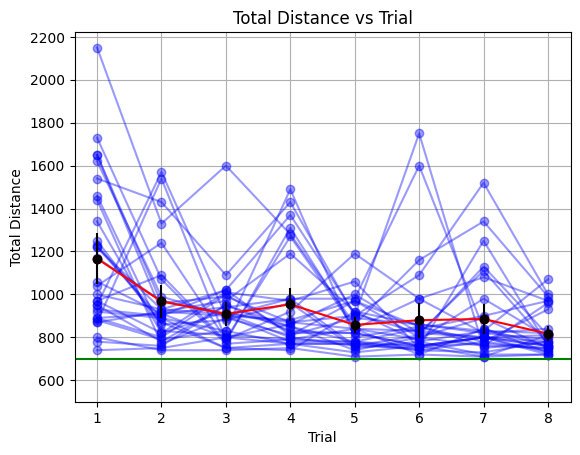

<Figure size 1000x1000 with 0 Axes>

In [ ]:
graph_total_distances()

In [ ]:
#boxplot of trial distances
def graph_boxplot_distances():
    files = [f for f in listdir('OnlineNavigation/Navigation') if isfile(join('OnlineNavigation/Navigation', f))]

    x = [1, 2, 3, 4, 5, 6, 7, 8]

    trial1_distances, trial2_distances, trial3_distances, trial4_distances, trial5_distances, trial6_distances, trial7_distances, trial8_distances = [], [], [], [], [], [], [], []
    errors = []

    for file in files:
        trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = trials(f'OnlineNavigation/Navigation/{file}')
        trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = convert_to_discrete(trial1), convert_to_discrete(trial2), convert_to_discrete(trial3), convert_to_discrete(trial4), convert_to_discrete(trial5), convert_to_discrete(trial6), convert_to_discrete(trial7), convert_to_discrete(trial8)
        distance1, distance2, distance3, distance4, distance5, distance6, distance7, distance8 = distance(trial1), distance(trial2), distance(trial3), distance(trial4), distance(trial5), distance(trial6), distance(trial7), distance(trial8)
        distances = np.array([distance1, distance2, distance3, distance4, distance5, distance6, distance7, distance8])
        trial1_distances.append(distance1)
        trial2_distances.append(distance2)
        trial3_distances.append(distance3)
        trial4_distances.append(distance4)
        trial5_distances.append(distance5)
        trial6_distances.append(distance6)
        trial7_distances.append(distance7)
        trial8_distances.append(distance8)


    plt.xlabel('Trial')
    plt.ylabel('Total Distance')
    plt.title('Boxplot of total distances for each trial')
    plt.boxplot([trial1_distances, trial2_distances, trial3_distances, trial4_distances, trial5_distances, trial6_distances, trial7_distances, trial8_distances])
    plt.axhline(y=700, color='b', linestyle='-', label="optimal distance")
    plt.legend()


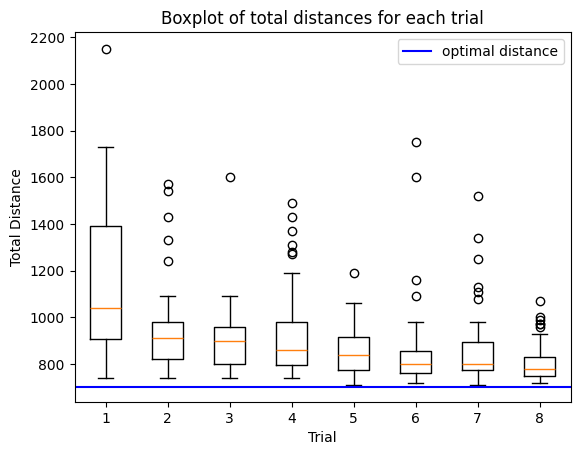

In [ ]:
graph_boxplot_distances()

In [ ]:
#compares participants' solution to the global optimal using frechet
def graph_frechet_optimal(optimal):
    files = [f for f in listdir('OnlineNavigation/Navigation') if isfile(join('OnlineNavigation/Navigation', f))]

    x = [1, 2, 3, 4, 5, 6, 7, 8]

    trial1_frechet, trial2_frechet, trial3_frechet, trial4_frechet, trial5_frechet, trial6_frechet, trial7_frechet, trial8_frechet = [], [], [], [], [], [], [], []

    for file in files:
        trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = trials(f'OnlineNavigation/Navigation/{file}')
        frechet1 = frechet(convert_to_discrete(trial1), optimal)
        frechet2 = frechet(convert_to_discrete(trial2), optimal)
        frechet3 = frechet(convert_to_discrete(trial3), optimal)
        frechet4 = frechet(convert_to_discrete(trial4), optimal)
        frechet5 = frechet(convert_to_discrete(trial5), optimal)
        frechet6 = frechet(convert_to_discrete(trial6), optimal)
        frechet7 = frechet(convert_to_discrete(trial7), optimal)
        frechet8 = frechet(convert_to_discrete(trial8), optimal)
        frechet_list = np.array([frechet1, frechet2, frechet3, frechet4, frechet5, frechet6, frechet7, frechet8])

        trial1_frechet.append(frechet1)
        trial2_frechet.append(frechet2)
        trial3_frechet.append(frechet3)
        trial4_frechet.append(frechet4)
        trial5_frechet.append(frechet5)
        trial6_frechet.append(frechet6)
        trial7_frechet.append(frechet7)
        trial8_frechet.append(frechet8)

        plt.plot(x, frechet_list, 'bo-', alpha=0.4)

    average1 = np.average(trial1_frechet)
    average2 = np.average(trial2_frechet)
    average3 = np.average(trial3_frechet)
    average4 = np.average(trial4_frechet)
    average5 = np.average(trial5_frechet)
    average6 = np.average(trial6_frechet)
    average7 = np.average(trial7_frechet)
    average8 = np.average(trial8_frechet)
    averages = [average1, average2, average3, average4, average5, average6, average7, average8]

    err1 = np.std(trial1_frechet)/math.sqrt(8)
    err2 = np.std(trial2_frechet)/math.sqrt(8)
    err3 = np.std(trial3_frechet)/math.sqrt(8)
    err4 = np.std(trial4_frechet)/math.sqrt(8)
    err5 = np.std(trial5_frechet)/math.sqrt(8)
    err6 = np.std(trial6_frechet)/math.sqrt(8)
    err7 = np.std(trial7_frechet)/math.sqrt(8)
    err8 = np.std(trial8_frechet)/math.sqrt(8)
    standard_errors = [err1, err2, err3, err4, err5, err6, err7, err8]

    plt.plot(x, averages, 'ro-')
    plt.errorbar(x, averages, yerr=standard_errors, fmt='ko')

    plt.xlabel('Trial')
    plt.ylabel('Frechet Distance with optimal')
    plt.title('Frechet Distance of trial and optimal solution')
    plt.grid(True)
    fig = plt.figure(figsize =(10, 10))
    plt.show()

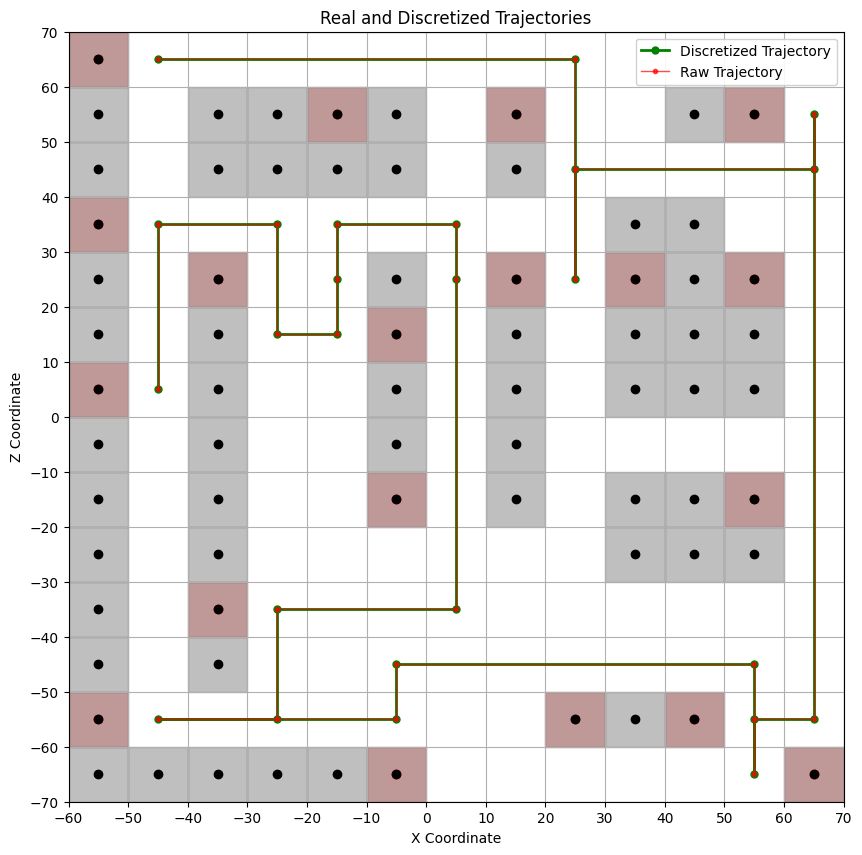

700.0


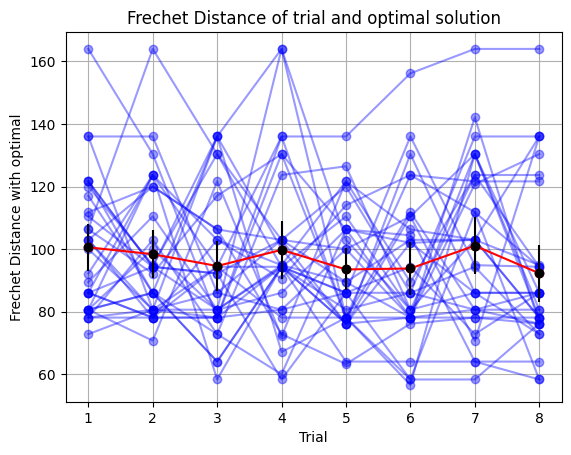

<Figure size 1000x1000 with 0 Axes>

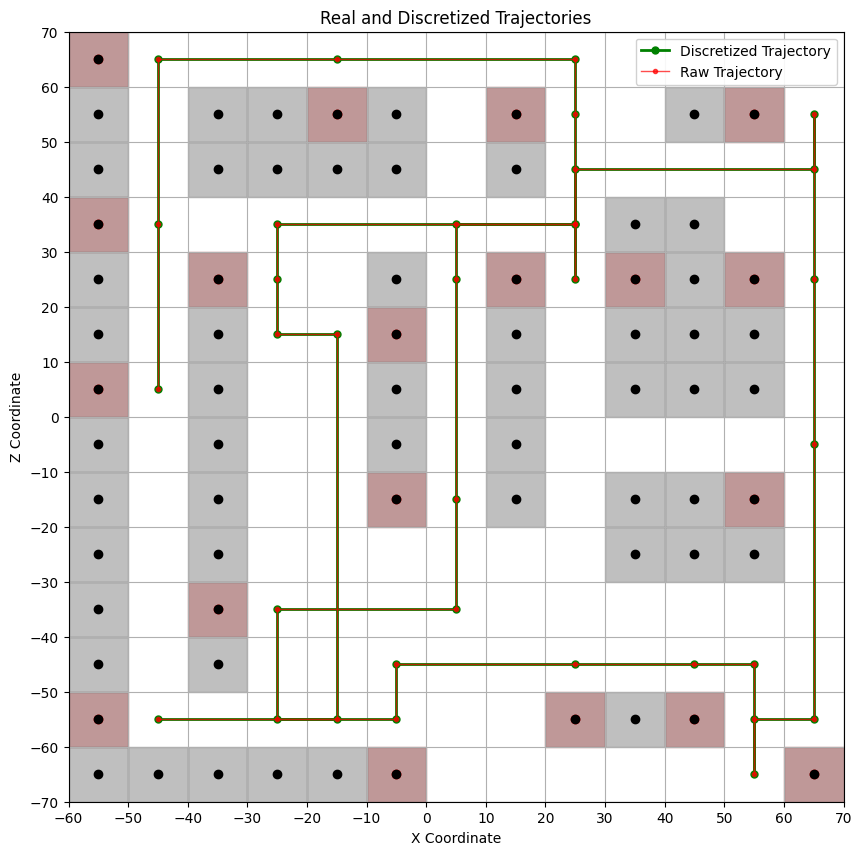

800.0


In [ ]:
optimal_solution = []
optimal_solution.append((-45, 5))
optimal_solution.append((-45, 35))
optimal_solution.append((-25, 35))
optimal_solution.append((-25, 15))
optimal_solution.append((-15, 15))
optimal_solution.append((-15, 25))
optimal_solution.append((-15, 35))
optimal_solution.append((5, 35))
optimal_solution.append((5, 25))
optimal_solution.append((5, -35))
optimal_solution.append((-25, -35))
optimal_solution.append((-25, -55))
optimal_solution.append((-45, -55))
optimal_solution.append((-5, -55))
optimal_solution.append((-5, -45))
optimal_solution.append((55, -45))
optimal_solution.append((55, -65))
optimal_solution.append((55, -55))
optimal_solution.append((65, -55))
optimal_solution.append((65, 55))
optimal_solution.append((65, 45))
optimal_solution.append((25, 45))
optimal_solution.append((25, 25))
optimal_solution.append((25, 65))
optimal_solution.append((-45, 65))

nearest_neighbor_solution = []
nearest_neighbor_solution.append((-45, 5))
nearest_neighbor_solution.append((-45, 35))
nearest_neighbor_solution.append((-45, 65))
nearest_neighbor_solution.append((-15, 65))
nearest_neighbor_solution.append((25, 65))
nearest_neighbor_solution.append((25, 55))
nearest_neighbor_solution.append((25, 25))
nearest_neighbor_solution.append((25, 35))
nearest_neighbor_solution.append((5, 35))
nearest_neighbor_solution.append((5, 25))
nearest_neighbor_solution.append((5, -15))
nearest_neighbor_solution.append((5, -35))
nearest_neighbor_solution.append((-25, -35))
nearest_neighbor_solution.append((-25, -55))
nearest_neighbor_solution.append((-5, -55))
nearest_neighbor_solution.append((-5, -45))
nearest_neighbor_solution.append((25, -45))
nearest_neighbor_solution.append((45, -45))
nearest_neighbor_solution.append((55, -45))
nearest_neighbor_solution.append((55, -65))
nearest_neighbor_solution.append((55, -55))
nearest_neighbor_solution.append((65, -55))
nearest_neighbor_solution.append((65, -5))
nearest_neighbor_solution.append((65, 25))
nearest_neighbor_solution.append((65, 55))
nearest_neighbor_solution.append((65, 45))
nearest_neighbor_solution.append((25, 45))
nearest_neighbor_solution.append((25, 35))
nearest_neighbor_solution.append((-25, 35))
nearest_neighbor_solution.append((-25, 25))
nearest_neighbor_solution.append((-25, 15))
nearest_neighbor_solution.append((-15, 15))
nearest_neighbor_solution.append((-15, -55))
nearest_neighbor_solution.append((-45, -55))

graph_data(optimal_solution)
print(distance(optimal_solution))
graph_frechet_optimal(optimal_solution)

graph_data(nearest_neighbor_solution)
print(distance(nearest_neighbor_solution))

In [ ]:
#compares participants' solution to the global optimal using frechet
def graph_frechet_heuristic(optimal):
    files = [f for f in listdir('OnlineNavigation/Navigation') if isfile(join('OnlineNavigation/Navigation', f))]

    x = [1, 2, 3, 4, 5, 6, 7, 8]

    trial1_frechet, trial2_frechet, trial3_frechet, trial4_frechet, trial5_frechet, trial6_frechet, trial7_frechet, trial8_frechet = [], [], [], [], [], [], [], []

    for file in files:
        trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = trials(f'OnlineNavigation/Navigation/{file}')
        frechet1 = frechet(convert_to_discrete(trial1), optimal)
        frechet2 = frechet(convert_to_discrete(trial2), optimal)
        frechet3 = frechet(convert_to_discrete(trial3), optimal)
        frechet4 = frechet(convert_to_discrete(trial4), optimal)
        frechet5 = frechet(convert_to_discrete(trial5), optimal)
        frechet6 = frechet(convert_to_discrete(trial6), optimal)
        frechet7 = frechet(convert_to_discrete(trial7), optimal)
        frechet8 = frechet(convert_to_discrete(trial8), optimal)
        frechet_list = np.array([frechet1, frechet2, frechet3, frechet4, frechet5, frechet6, frechet7, frechet8])

        trial1_frechet.append(frechet1)
        trial2_frechet.append(frechet2)
        trial3_frechet.append(frechet3)
        trial4_frechet.append(frechet4)
        trial5_frechet.append(frechet5)
        trial6_frechet.append(frechet6)
        trial7_frechet.append(frechet7)
        trial8_frechet.append(frechet8)

        plt.plot(x, frechet_list, 'bo-', alpha=0.4)

    average1 = np.average(trial1_frechet)
    average2 = np.average(trial2_frechet)
    average3 = np.average(trial3_frechet)
    average4 = np.average(trial4_frechet)
    average5 = np.average(trial5_frechet)
    average6 = np.average(trial6_frechet)
    average7 = np.average(trial7_frechet)
    average8 = np.average(trial8_frechet)
    averages = [average1, average2, average3, average4, average5, average6, average7, average8]

    err1 = np.std(trial1_frechet)/math.sqrt(8)
    err2 = np.std(trial2_frechet)/math.sqrt(8)
    err3 = np.std(trial3_frechet)/math.sqrt(8)
    err4 = np.std(trial4_frechet)/math.sqrt(8)
    err5 = np.std(trial5_frechet)/math.sqrt(8)
    err6 = np.std(trial6_frechet)/math.sqrt(8)
    err7 = np.std(trial7_frechet)/math.sqrt(8)
    err8 = np.std(trial8_frechet)/math.sqrt(8)
    standard_errors = [err1, err2, err3, err4, err5, err6, err7, err8]

    plt.plot(x, averages, 'ro-')
    plt.errorbar(x, averages, yerr=standard_errors, fmt='ko')

    plt.xlabel('Trial')
    plt.ylabel('Frechet Distance with Nearest Neighbors Solution')
    plt.title('Frechet Distance of trial and Nearest Neighbors Solution')
    plt.grid(True)
    fig = plt.figure(figsize =(10, 10))
    plt.show()

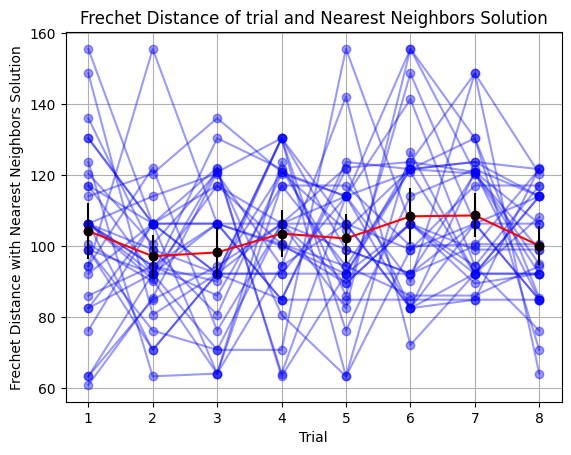

<Figure size 1000x1000 with 0 Axes>

In [ ]:
graph_frechet_heuristic(nearest_neighbor_solution)

In [ ]:
def graph_frechet_heuristic_boxplot(optimal):
    files = [f for f in listdir('OnlineNavigation/Navigation') if isfile(join('OnlineNavigation/Navigation', f))]

    # Initialize lists to store the Fréchet distances for each trial
    trial_frechet_dists = [[] for _ in range(8)]  # One list for each trial

    for file in files:
        # Load all trials and compute Fréchet distances for each
        trials_list = trials(f'OnlineNavigation/Navigation/{file}')

        for i in range(8):  # Loop over each trial (trial1 to trial8)
            frechet_dist = frechet(convert_to_discrete(trials_list[i]), optimal)
            trial_frechet_dists[i].append(frechet_dist)  # Store the distance for the respective trial

    # Create a boxplot for the Fréchet distances for all trials
    plt.figure(figsize=(10, 10))
    plt.boxplot(trial_frechet_dists, positions=range(1, 9))  # One boxplot per trial

    # Overlay individual data points with jitter for each trial
    for i in range(8):
        jitter = np.random.normal(0, 0.04, size=len(trial_frechet_dists[i]))  # Adding jitter for each trial
        x_values = np.ones(len(trial_frechet_dists[i])) * (i + 1) + jitter  # Add jitter to the trial number (x-axis)
        plt.scatter(x_values, trial_frechet_dists[i], color='red', alpha=0.6)

    # Labeling the plot
    plt.xlabel('Trial Number')
    plt.ylabel('Frechet Distance with NN Solution')
    plt.title('Boxplot of Frechet Distance between Trials and NN Solution')
    plt.xticks(range(1, 9), labels=[f'Trial {i+1}' for i in range(8)])  # Set trial numbers as x-ticks

    # Add grid and show the plot
    plt.grid(True)
    plt.show()


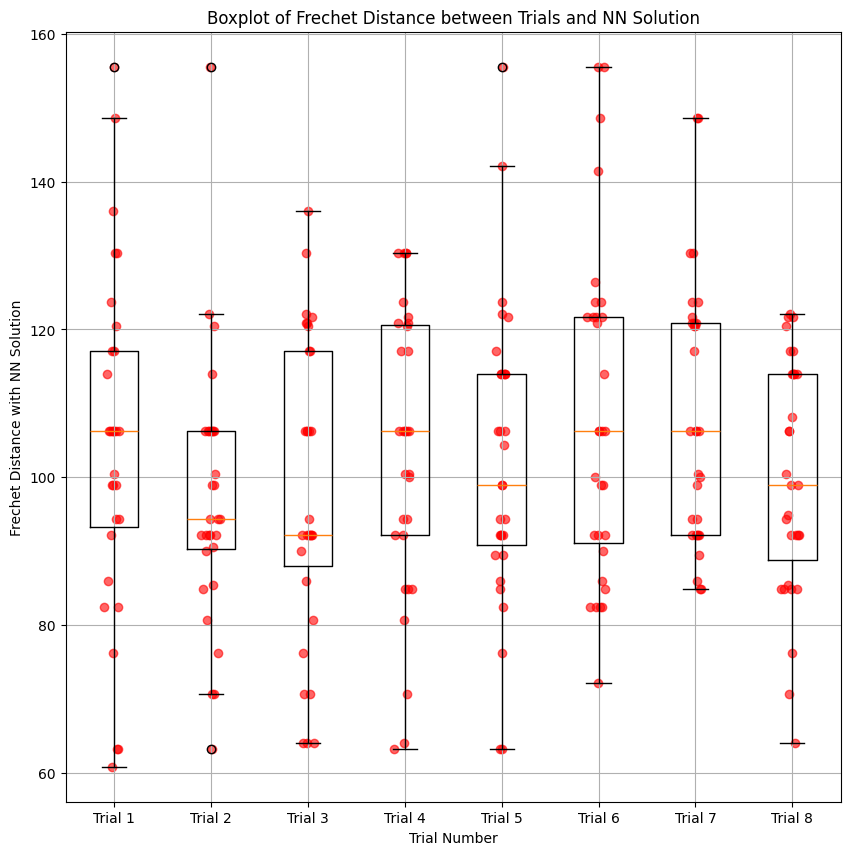

In [ ]:
graph_frechet_heuristic_boxplot(nearest_neighbor_solution)

In [ ]:
#creates boxplot for frechet distances between optimal trajectories
def box_plot_frechet():
    files = [f for f in listdir('OnlineNavigation/Navigation') if isfile(join('OnlineNavigation/Navigation', f))]
    frechet_distances = []

    for i in range(len(files)-1):
        for j in range(i+1, len(files)):
            trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = trials(f'OnlineNavigation/Navigation/{files[i]}')
            trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = convert_to_discrete(trial1), convert_to_discrete(trial2), convert_to_discrete(trial3), convert_to_discrete(trial4), convert_to_discrete(trial5), convert_to_discrete(trial6), convert_to_discrete(trial7), convert_to_discrete(trial8)
            nexttrial1, nexttrial2, nexttrial3, nexttrial4, nexttrial5, nexttrial6, nexttrial7, nexttrial8 = trials(f'OnlineNavigation/Navigation/{files[j]}')
            nexttrial1, nexttrial2, nexttrial3, nexttrial4, nexttrial5, nexttrial6, nexttrial7, nexttrial8 = convert_to_discrete(nexttrial1), convert_to_discrete(nexttrial2), convert_to_discrete(nexttrial3), convert_to_discrete(nexttrial4), convert_to_discrete(nexttrial5), convert_to_discrete(nexttrial6), convert_to_discrete(nexttrial7), convert_to_discrete(nexttrial8)

            best1 = best_trial(trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8)
            best2 = best_trial(nexttrial1, nexttrial2, nexttrial3, nexttrial4, nexttrial5, nexttrial6, nexttrial7, nexttrial8)

            frechet_dist = frechet(best1, best2)
            frechet_distances.append(frechet_dist)

    fig = plt.figure(figsize =(6, 6))
    plt.ylim(0, 140)
    plt.ylabel('Frechet Distance')
    plt.title('Comparison between optimal trajectories')
    plt.boxplot(frechet_distances)

    x = np.random.normal(1, 0.04, size=len(frechet_distances))
    plt.plot(x, frechet_distances, 'r.', alpha=0.2)
    plt.show()

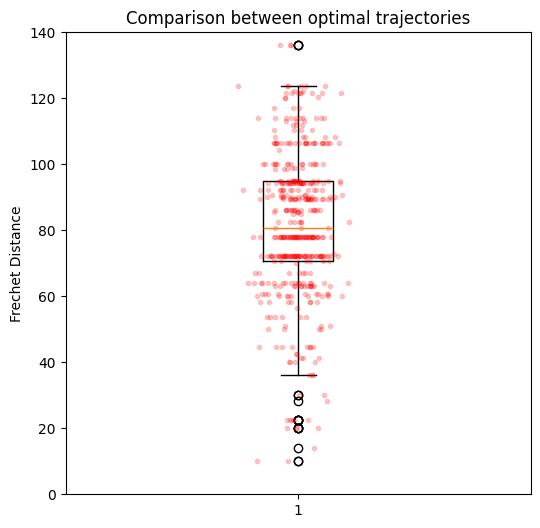

In [ ]:
box_plot_frechet()

In [ ]:
def graph_best_trials():
    files = [f for f in listdir('OnlineNavigation/Navigation') if isfile(join('OnlineNavigation/Navigation', f))]
    best_trial_distances = []
    for file in files:
        print(file)
        trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = trials(f'OnlineNavigation/Navigation/{file}')
        trial1_discrete, trial2_discrete, trial3_discrete, trial4_discrete, trial5_discrete, trial6_discrete, trial7_discrete, trial8_discrete = convert_to_discrete(trial1), convert_to_discrete(trial2), convert_to_discrete(trial3), convert_to_discrete(trial4), convert_to_discrete(trial5), convert_to_discrete(trial6), convert_to_discrete(trial7), convert_to_discrete(trial8)
        #trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = convert_to_discrete(trial1), convert_to_discrete(trial2), convert_to_discrete(trial3), convert_to_discrete(trial4), convert_to_discrete(trial5), convert_to_discrete(trial6), convert_to_discrete(trial7), convert_to_discrete(trial8)
        best = best_trial(trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8)
        if best == trial1:
            print('trial 1')
        elif best == trial2:
            print('trial2')
        elif best == trial3:
            print('trial3')
        elif best == trial4:
            print('trial4')
        elif best == trial5:
            print('trial5')
        elif best == trial6:
            print('trial6')
        elif best == trial7:
            print('trial7')
        elif best == trial8:
            print('trial8')
        #print('Real Distance: ', distance(best))
        #graph_data(best)

        best_discrete = best_trial(trial1_discrete, trial2_discrete, trial3_discrete, trial4_discrete, trial5_discrete, trial6_discrete, trial7_discrete, trial8_discrete)
        print("Discrete Distance: ", distance(best_discrete))
        graph_data(best)

        best_distance = distance(best_discrete)
        best_trial_distances.append(best_distance)

    plt.figure(figsize=(10, 6))
    bins = np.arange(700, 901, 20)  # Creates bins from 700 to 900 with a width of 20
    plt.hist(best_trial_distances, bins=bins, color='skyblue', alpha=0.7, edgecolor='black')
    plt.title('Distribution of Best Trial Distances Across Participants')
    plt.xlabel('Distance of Best Trial')
    plt.ylabel('Number of Participants')
    plt.xlim(700, 900)
    plt.xticks(bins)
    plt.grid(axis='y', linestyle='--', linewidth=0.7)
    plt.show()

In [ ]:
graph_best_trials()

In [ ]:
def frechet_best_trials():
    files = [f for f in listdir('OnlineNavigation/Navigation') if isfile(join('OnlineNavigation/Navigation', f))]
    best_trial_distances = []
    bests = []
    bests_discrete = []
    for file in files:
        print(file)
        trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = trials(f'OnlineNavigation/Navigation/{file}')
        trial1_discrete, trial2_discrete, trial3_discrete, trial4_discrete, trial5_discrete, trial6_discrete, trial7_discrete, trial8_discrete = convert_to_discrete(trial1), convert_to_discrete(trial2), convert_to_discrete(trial3), convert_to_discrete(trial4), convert_to_discrete(trial5), convert_to_discrete(trial6), convert_to_discrete(trial7), convert_to_discrete(trial8)
        #trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = convert_to_discrete(trial1), convert_to_discrete(trial2), convert_to_discrete(trial3), convert_to_discrete(trial4), convert_to_discrete(trial5), convert_to_discrete(trial6), convert_to_discrete(trial7), convert_to_discrete(trial8)
        best = best_trial(trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8)
        if best == trial1:
            print('trial 1')
        elif best == trial2:
            print('trial2')
        elif best == trial3:
            print('trial3')
        elif best == trial4:
            print('trial4')
        elif best == trial5:
            print('trial5')
        elif best == trial6:
            print('trial6')
        elif best == trial7:
            print('trial7')
        elif best == trial8:
            print('trial8')
        #print('Real Distance: ', distance(best))
        #graph_data(best)

        best_discrete = best_trial(trial1_discrete, trial2_discrete, trial3_discrete, trial4_discrete, trial5_discrete, trial6_discrete, trial7_discrete, trial8_discrete)
        #graph_data(best)
        bests.append(best)
        bests_discrete.append(best_discrete)

    for i in range(1, len(bests)):
        graph_data(bests[0])
        graph_data(bests[i])
        print(frechet(bests_discrete[0], bests_discrete[i]))

frechet_best_trials()

In [ ]:
def graph_worst_trials():
    files = [f for f in listdir('OnlineNavigation/Navigation') if isfile(join('OnlineNavigation/Navigation', f))]
    for file in files:
        print(file)
        trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = trials(f'OnlineNavigation/Navigation/{file}')
        trial1_discrete, trial2_discrete, trial3_discrete, trial4_discrete, trial5_discrete, trial6_discrete, trial7_discrete, trial8_discrete = convert_to_discrete(trial1), convert_to_discrete(trial2), convert_to_discrete(trial3), convert_to_discrete(trial4), convert_to_discrete(trial5), convert_to_discrete(trial6), convert_to_discrete(trial7), convert_to_discrete(trial8)
        #trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = convert_to_discrete(trial1), convert_to_discrete(trial2), convert_to_discrete(trial3), convert_to_discrete(trial4), convert_to_discrete(trial5), convert_to_discrete(trial6), convert_to_discrete(trial7), convert_to_discrete(trial8)
        worst = worst_trial(trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8)
        if worst == trial1:
            print('trial 1')
        elif worst == trial2:
            print('trial2')
        elif worst == trial3:
            print('trial3')
        elif worst == trial4:
            print('trial4')
        elif worst == trial5:
            print('trial5')
        elif worst == trial6:
            print('trial6')
        elif worst == trial7:
            print('trial7')
        elif worst == trial8:
            print('trial8')
        #print('Real Distance: ', distance(best))
        #graph_data(best)

        worst_discrete = worst_trial(trial1_discrete, trial2_discrete, trial3_discrete, trial4_discrete, trial5_discrete, trial6_discrete, trial7_discrete, trial8_discrete)
        print("Discrete Distance: ", distance(worst_discrete))
        graph_data(worst)

In [ ]:
graph_worst_trials()

In [ ]:
#graphs the variance of the last 4 trials
def correlation_analysis(optimal):
    files = [f for f in listdir('OnlineNavigation/Navigation') if isfile(join('OnlineNavigation/Navigation', f))]
    variances = []
    distances = []
    frechet_distances = []
    for file in files:
      trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = trials(f'OnlineNavigation/Navigation/{file}')
      trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = convert_to_discrete(trial1), convert_to_discrete(trial2), convert_to_discrete(trial3), convert_to_discrete(trial4), convert_to_discrete(trial5), convert_to_discrete(trial6), convert_to_discrete(trial7), convert_to_discrete(trial8)
      best = best_trial(trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8)
      variance = np.std([distance(trial1), distance(trial2), distance(trial3), distance(trial4), distance(trial5), distance(trial6), distance(trial7), distance(trial8)])
      variances.append(variance)
      distances.append(distance(best))
      #frechet1 = frechet(trial6, trial7)
      #frechet2 = frechet(trial6, trial8)
      #frechet3 = frechet(trial7, trial8)

      #variances.append(np.average([frechet1, frechet2, frechet3]))
      #distances.append(distance(best))

    """
    plt.boxplot(variances)
    x = np.random.normal(1, 0.04, size=len(variances))
    plt.plot(x, variances, 'b.', alpha=0.2)
    plt.ylabel('Variance of Frechet Distance of Last 3 trials')
    """

    plt.plot(variances, distances, 'bo')
    plt.title('Distance of best trial vs std')
    plt.xlabel('Std of Distances for all trials')
    plt.ylabel('Distance of best trial')
    plt.grid(True)

    fig = plt.figure(figsize =(10, 10))
    plt.show()

    print(scipy.stats.pearsonr(variances, distances))

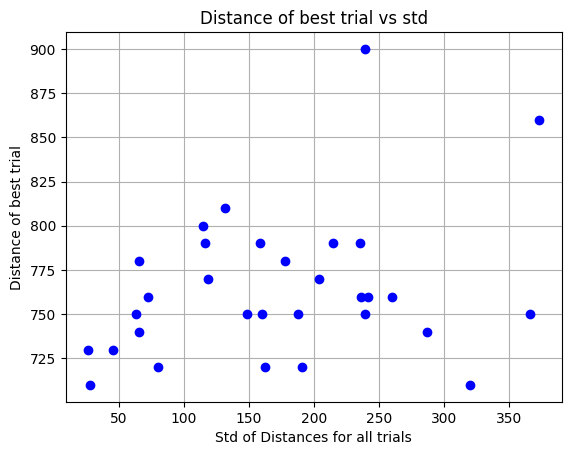

<Figure size 1000x1000 with 0 Axes>

PearsonRResult(statistic=0.29019034442626707, pvalue=0.11328290433602946)


In [ ]:
correlation_analysis(optimal_solution)

In [ ]:
#Plots PAO against global optimal solution
def graph_trials_Optimal(optimal):
    files = [f for f in listdir('OnlineNavigation/Navigation') if isfile(join('OnlineNavigation/Navigation', f))]
    trialnums = [1, 2, 3, 4, 5, 6, 7, 8]
    trial1_distances, trial2_distances, trial3_distances, trial4_distances, trial5_distances, trial6_distances, trial7_distances, trial8_distances = [], [], [], [], [], [], [], []
    for file in files:
        distances = []
        trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = trials(f'OnlineNavigation/Navigation/{file}')
        trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = convert_to_discrete(trial1), convert_to_discrete(trial2), convert_to_discrete(trial3), convert_to_discrete(trial4), convert_to_discrete(trial5), convert_to_discrete(trial6), convert_to_discrete(trial7), convert_to_discrete(trial8)

        dist1 = ((distance(trial1)/distance(optimal))-1)*100
        distances.append(dist1)

        dist2 = ((distance(trial2)/distance(optimal))-1)*100
        distances.append(dist2)

        dist3 = ((distance(trial3)/distance(optimal))-1)*100
        distances.append(dist3)

        dist4 = ((distance(trial4)/distance(optimal))-1)*100
        distances.append(dist4)

        dist5 = ((distance(trial5)/distance(optimal))-1)*100
        distances.append(dist5)

        dist6 = ((distance(trial6)/distance(optimal))-1)*100
        distances.append(dist6)

        dist7 = ((distance(trial7)/distance(optimal))-1)*100
        distances.append(dist7)

        dist8 = ((distance(trial8)/distance(optimal))-1)*100
        distances.append(dist8)

        trial1_distances.append(dist1)
        trial2_distances.append(dist2)
        trial3_distances.append(dist3)
        trial4_distances.append(dist4)
        trial5_distances.append(dist5)
        trial6_distances.append(dist6)
        trial7_distances.append(dist7)
        trial8_distances.append(dist8)

        plt.plot(trialnums, distances, 'bo-', alpha=0.2)


    average1 = np.average(trial1_distances)
    average2 = np.average(trial2_distances)
    average3 = np.average(trial3_distances)
    average4 = np.average(trial4_distances)
    average5 = np.average(trial5_distances)
    average6 = np.average(trial6_distances)
    average7 = np.average(trial7_distances)
    average8 = np.average(trial8_distances)
    averages = [average1, average2, average3, average4, average5, average6, average7, average8]

    err1 = np.std(trial1_distances)/math.sqrt(8)
    err2 = np.std(trial2_distances)/math.sqrt(8)
    err3 = np.std(trial3_distances)/math.sqrt(8)
    err4 = np.std(trial4_distances)/math.sqrt(8)
    err5 = np.std(trial5_distances)/math.sqrt(8)
    err6 = np.std(trial6_distances)/math.sqrt(8)
    err7 = np.std(trial7_distances)/math.sqrt(8)
    err8 = np.std(trial8_distances)/math.sqrt(8)
    standard_errors = [err1, err2, err3, err4, err5, err6, err7, err8]

    plt.plot(trialnums, averages, 'ro-')
    plt.errorbar(trialnums, averages, yerr=standard_errors, fmt='ko')

    plt.xlabel('trial')
    plt.ylabel('Percentage above Optimal')
    plt.title('PAO for each trial')
    plt.grid(True)
    fig = plt.figure(figsize =(10, 10))
    plt.show()

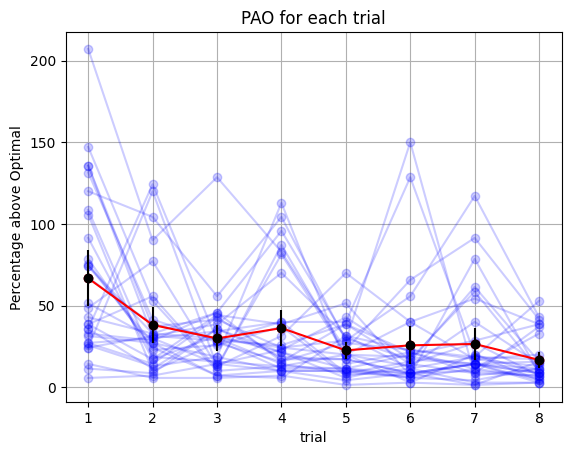

<Figure size 1000x1000 with 0 Axes>

In [ ]:
graph_trials_Optimal(optimal_solution)

In [ ]:
#Plots PAO against nn solution
def graph_trials_Heuristic(heuristic):
    files = [f for f in listdir('OnlineNavigation/Navigation') if isfile(join('OnlineNavigation/Navigation', f))]
    trialnums = [1, 2, 3, 4, 5, 6, 7, 8]
    trial1_distances, trial2_distances, trial3_distances, trial4_distances, trial5_distances, trial6_distances, trial7_distances, trial8_distances = [], [], [], [], [], [], [], []
    for file in files:
        distances = []
        trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = trials(f'OnlineNavigation/Navigation/{file}')
        trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = convert_to_discrete(trial1), convert_to_discrete(trial2), convert_to_discrete(trial3), convert_to_discrete(trial4), convert_to_discrete(trial5), convert_to_discrete(trial6), convert_to_discrete(trial7), convert_to_discrete(trial8)

        dist1 = ((distance(trial1)/distance(heuristic))-1) * 100
        distances.append(dist1)

        dist2 = ((distance(trial2)/distance(heuristic))-1) * 100
        distances.append(dist2)

        dist3 = ((distance(trial3)/distance(heuristic))-1) * 100
        distances.append(dist3)

        dist4 = ((distance(trial4)/distance(heuristic))-1) * 100
        distances.append(dist4)

        dist5 = ((distance(trial5)/distance(heuristic))-1) * 100
        distances.append(dist5)

        dist6 = ((distance(trial6)/distance(heuristic))-1) * 100
        distances.append(dist6)

        dist7 = ((distance(trial7)/distance(heuristic))-1) * 100
        distances.append(dist7)

        dist8 = ((distance(trial8)/distance(heuristic))-1) * 100
        distances.append(dist8)

        trial1_distances.append(dist1)
        trial2_distances.append(dist2)
        trial3_distances.append(dist3)
        trial4_distances.append(dist4)
        trial5_distances.append(dist5)
        trial6_distances.append(dist6)
        trial7_distances.append(dist7)
        trial8_distances.append(dist8)

        plt.plot(trialnums, distances, 'bo-', alpha=0.2)


    average1 = np.average(trial1_distances)
    average2 = np.average(trial2_distances)
    average3 = np.average(trial3_distances)
    average4 = np.average(trial4_distances)
    average5 = np.average(trial5_distances)
    average6 = np.average(trial6_distances)
    average7 = np.average(trial7_distances)
    average8 = np.average(trial8_distances)
    averages = [average1, average2, average3, average4, average5, average6, average7, average8]

    err1 = np.std(trial1_distances)/math.sqrt(8)
    err2 = np.std(trial2_distances)/math.sqrt(8)
    err3 = np.std(trial3_distances)/math.sqrt(8)
    err4 = np.std(trial4_distances)/math.sqrt(8)
    err5 = np.std(trial5_distances)/math.sqrt(8)
    err6 = np.std(trial6_distances)/math.sqrt(8)
    err7 = np.std(trial7_distances)/math.sqrt(8)
    err8 = np.std(trial8_distances)/math.sqrt(8)
    standard_errors = [err1, err2, err3, err4, err5, err6, err7, err8]

    plt.plot(trialnums, averages, 'ro-')
    plt.errorbar(trialnums, averages, yerr=standard_errors, fmt='ko')

    plt.xlabel('trial')
    plt.ylabel('Percentage above Optimal')
    plt.title('PAO for each trial')
    plt.grid(True)
    fig = plt.figure(figsize =(10, 10))
    plt.show()

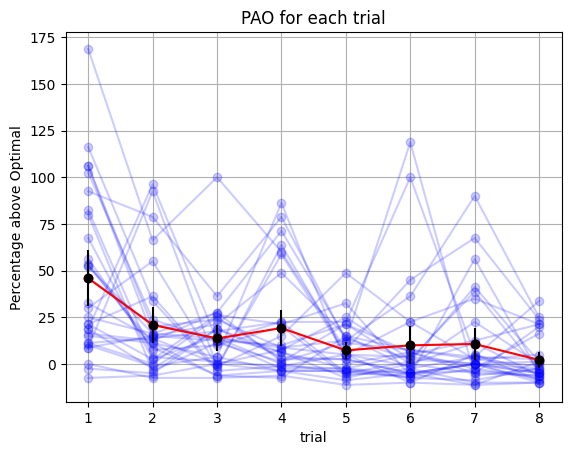

<Figure size 1000x1000 with 0 Axes>

In [ ]:
graph_trials_Heuristic(nearest_neighbor_solution)

# **Data using buildingvisitedorder.csv and randomizedbuildings.csv**

In [ ]:
# Paths to data
file_path = '/content/drive/MyDrive/trajectory_analysis/OnlineNavigation/buildingvisitedorder.csv'
record_file_path = '/content/drive/MyDrive/trajectory_analysis/OnlineNavigation/recordscore.csv'  # Path to the recordstore.csv file

# Read the CSV files
data = pd.read_csv(file_path)
record_data = pd.read_csv(record_file_path)

# Ensure the necessary columns are present in the main data
required_columns = ['participantid', 'trialnum', 'timerecorded', 'buildingname']
if not all(column in data.columns for column in required_columns):
    raise ValueError("Input CSV does not contain all required columns")

# Ensure the necessary column is present in the record data
if 'participantid' not in record_data.columns:
    raise ValueError("Recordstore CSV does not contain the 'participantid' column")

# Get the list of participants from the recordstore CSV
valid_participants = record_data[record_data['freerecallscore'] > 1]['participantid'].unique()

# Filter the main data to include only participants in the recordstore CSV
filtered_main_data = data[data['participantid'].isin(valid_participants)]

# Identify participants who have all trials from 1 to 8
trial_counts = filtered_main_data[filtered_main_data['trialnum'].between(1, 8)].groupby('participantid')['trialnum'].nunique()
participants_with_all_trials = trial_counts[trial_counts == 8].index

# Further filter the data for participants who have all required trials
final_filtered_data = filtered_main_data[filtered_main_data['participantid'].isin(participants_with_all_trials)]

# Get unique participant IDs from the final filtered data
participant_ids = final_filtered_data['participantid'].unique()

# Separate data by participant ID and write to separate CSV files
for participant_id in participant_ids:
    participant_data = final_filtered_data[final_filtered_data['participantid'] == participant_id]
    # Sort by trialnum and then by timestamp
    participant_data = participant_data.sort_values(by=['trialnum', 'timerecorded'])
    output_file = f'/content/drive/MyDrive/trajectory_analysis/OnlineNavigation/BuildingVisitedOrder/participant_{participant_id}.csv'
    participant_data.to_csv(output_file, index=False)
    print(f'Data for participant {participant_id} written to {output_file}')


Data for participant 6643d35c8bbc62751f1c746c written to /content/drive/MyDrive/trajectory_analysis/OnlineNavigation/BuildingVisitedOrder/participant_6643d35c8bbc62751f1c746c.csv
Data for participant 668d655ff5755515179cd089 written to /content/drive/MyDrive/trajectory_analysis/OnlineNavigation/BuildingVisitedOrder/participant_668d655ff5755515179cd089.csv
Data for participant 661e74ab1c19b177f9c5bb14 written to /content/drive/MyDrive/trajectory_analysis/OnlineNavigation/BuildingVisitedOrder/participant_661e74ab1c19b177f9c5bb14.csv
Data for participant 65fb031e18b57d13b4e9e647 written to /content/drive/MyDrive/trajectory_analysis/OnlineNavigation/BuildingVisitedOrder/participant_65fb031e18b57d13b4e9e647.csv
Data for participant 601b28841ca7bb2f8edaa293 written to /content/drive/MyDrive/trajectory_analysis/OnlineNavigation/BuildingVisitedOrder/participant_601b28841ca7bb2f8edaa293.csv
Data for participant 667838be776b27f8705b6c3c written to /content/drive/MyDrive/trajectory_analysis/Onlin

In [ ]:
# Paths to data
file_path = '/content/drive/MyDrive/trajectory_analysis/OnlineNavigation/randomizedbuildings.csv'
record_file_path = '/content/drive/MyDrive/trajectory_analysis/OnlineNavigation/recordscore.csv'  # Path to the recordstore.csv file

# Read the CSV files
data = pd.read_csv(file_path)
record_data = pd.read_csv(record_file_path)

# Ensure the necessary columns are present in the main data
required_columns = ['participantid', 'ordernumber', 'buildingname']
if not all(column in data.columns for column in required_columns):
    raise ValueError("Input CSV does not contain all required columns")

# Ensure the necessary column is present in the record data
if 'participantid' not in record_data.columns:
    raise ValueError("Recordstore CSV does not contain the 'participantid' column")

# Get the list of participants from the recordstore CSV
valid_participants = record_data[record_data['freerecallscore'] > 1]['participantid'].unique()

# Filter the main data to include only participants in the recordstore CSV
filtered_data = data[data['participantid'].isin(valid_participants)]

# Get unique participant IDs from the filtered data
participant_ids = filtered_data['participantid'].unique()

# Separate data by participant ID and write to separate CSV files
for participant_id in participant_ids:
    participant_data = filtered_data[filtered_data['participantid'] == participant_id]
    output_file = f'/content/drive/MyDrive/trajectory_analysis/OnlineNavigation/RandomizedBuildings/participant_{participant_id}.csv'
    participant_data.to_csv(output_file, index=False)
    print(f'Data for participant {participant_id} written to {output_file}')


Data for participant 6643d35c8bbc62751f1c746c written to /content/drive/MyDrive/trajectory_analysis/OnlineNavigation/RandomizedBuildings/participant_6643d35c8bbc62751f1c746c.csv
Data for participant 668d655ff5755515179cd089 written to /content/drive/MyDrive/trajectory_analysis/OnlineNavigation/RandomizedBuildings/participant_668d655ff5755515179cd089.csv
Data for participant 661e74ab1c19b177f9c5bb14 written to /content/drive/MyDrive/trajectory_analysis/OnlineNavigation/RandomizedBuildings/participant_661e74ab1c19b177f9c5bb14.csv
Data for participant 65fb031e18b57d13b4e9e647 written to /content/drive/MyDrive/trajectory_analysis/OnlineNavigation/RandomizedBuildings/participant_65fb031e18b57d13b4e9e647.csv
Data for participant 601b28841ca7bb2f8edaa293 written to /content/drive/MyDrive/trajectory_analysis/OnlineNavigation/RandomizedBuildings/participant_601b28841ca7bb2f8edaa293.csv
Data for participant 667838be776b27f8705b6c3c written to /content/drive/MyDrive/trajectory_analysis/OnlineNavi

# **Visited Order of Optimal Solutions**

In [ ]:
optimal_visited1 = [2, 3, 6, 10, 12, 11, 5, 1, 7, 16, 17, 18, 15, 14, 19, 13, 9, 8, 4]
optimal_visited2 = [2, 3, 4, 8, 9, 13, 19, 14, 15, 18, 17, 16, 7, 1, 5, 11, 12, 10, 6]
optimal_visited3 = [2, 3, 4, 8, 9, 13, 19, 14, 15, 18, 17, 16, 7, 1, 5, 11, 12, 6, 10]
optimal_visited4 = [2, 3, 4, 8, 9, 13, 12, 11, 10, 6, 5, 1, 7, 16, 17, 18, 15, 14, 19]
optimal_visited5 = [2, 3, 4, 8, 9, 13, 12, 6, 10, 11, 5, 1, 7, 16, 17, 18, 15, 14, 19]
optimal_visited6 = [2, 3, 4, 8, 9, 13, 10, 6, 12, 11, 5, 1, 7, 16, 17, 18, 15, 14, 19]
optimal_visited7 = [2, 3, 4, 8, 9, 13, 6, 10, 12, 11, 5, 1, 7, 16, 17, 18, 15, 14, 19]
optimal_visited8 = [2, 10, 6, 3, 4, 8, 9, 13, 12, 11, 5, 1, 7, 16, 17, 18, 15, 14, 19]
optimal_visited9 = [2, 6, 10, 3, 4, 8, 9, 13, 12, 11, 5, 1, 7, 16, 17, 18, 15, 14, 19]
optimal_visited10 = [2, 3, 10, 6, 4, 8, 9, 13, 12, 11, 5, 1, 7, 16, 17, 18, 15, 14, 19]
optimal_visited11 = [2, 3, 6, 10, 4, 8, 9, 13, 12, 11, 5, 1, 7, 16, 17, 18, 15, 14, 19]
optimal_visited12 = [2, 3, 4, 8, 9, 13, 12, 10, 6, 5, 1, 7, 11, 16, 17, 18, 15, 14, 19]
optimal_visited13 = [2, 3, 4, 8, 9, 13, 12, 6, 10, 5, 1, 7, 11, 16, 17, 18, 15, 14, 19]
optimal_visited14 = [2, 1, 5, 10, 6, 3, 4, 8, 9, 13, 12, 11, 7, 16, 17, 18, 15, 14, 19]
optimal_visited15 = [2, 1, 7, 5, 10, 6, 3, 4, 8, 9, 13, 12, 11, 16, 17, 18, 15, 14, 19]

nn_visited = [2, 3, 4, 8, 9, 13, 12, 11, 5, 1, 7, 16, 17, 18, 15, 14, 19, 6, 10]
lk_visited = [2, 3, 4, 8, 9, 19, 14, 15, 13, 12, 10, 6, 5, 11, 16, 17, 18, 7, 1]
ch_cheapest_visited = [2, 3, 4, 8, 6, 5, 1, 7, 16, 17, 18, 15, 11, 10, 12, 13, 14, 9, 19]
ch_angle_visited = [2, 5, 1, 7, 16, 17, 18, 15, 11, 10, 12, 13, 14, 19, 9, 8, 6, 4, 3]
nn_reverse_visited = [2, 1, 5, 7, 16, 17, 18, 15, 14, 19, 9, 13, 12, 11, 10, 6, 3, 4, 8]
ch_counterclockwise_cheapest_visited = [2, 1, 5, 11, 7, 16, 17, 18, 15, 14, 19, 13, 9, 8, 12, 10, 6, 4, 3]

optimal_solution_visited = [optimal_visited1, optimal_visited2, optimal_visited3, optimal_visited4, optimal_visited5, optimal_visited6, optimal_visited7, optimal_visited8, optimal_visited9, optimal_visited10, optimal_visited11, optimal_visited12, optimal_visited13, optimal_visited14, optimal_visited15]
heuristic_solution_visited = [nn_visited, lk_visited, ch_cheapest_visited, ch_angle_visited, nn_reverse_visited, ch_counterclockwise_cheapest_visited]

# **Trajectory Vector Field**

In [ ]:
#put building order visited data timestamps for each trial in its own array
def visited_order(file):
    trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = [], [], [], [], [], [], [], []

    with open(file, newline='') as visited_order_data:
            read = csv.reader(visited_order_data, delimiter=',', quotechar='|')
            #first_line = csv.reader(visited_order_data)
            headers = next(read)
            for row in read:
                if row[1] == '1':
                    trial1.append(float(row[2]))
                elif row[1] == '2':
                    trial2.append(float(row[2]))
                elif row[1] == '3':
                    trial3.append(float(row[2]))
                elif row[1] == '4':
                    trial4.append(float(row[2]))
                elif row[1] == '5':
                    trial5.append(float(row[2]))
                elif row[1] == '6':
                    trial6.append(float(row[2]))
                elif row[1] == '7':
                    trial7.append(float(row[2]))
                elif row[1] == '8':
                    trial8.append(float(row[2]))

    return trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8

In [ ]:
#put building order visited data timestamps for each trial in its own array
def extended_trials(file):
    trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = [], [], [], [], [], [], [], []

    with open(file, newline='') as visited_order_data:
            read = csv.reader(visited_order_data, delimiter=',', quotechar='|')
            #first_line = csv.reader(visited_order_data)
            headers = next(read)
            for row in read:
                if row[1] == '1':
                    trial1.append((float(row[2]), float(row[3]), float(row[4])))
                elif row[1] == '2':
                    trial2.append((float(row[2]), float(row[3]), float(row[4])))
                elif row[1] == '3':
                    trial3.append((float(row[2]), float(row[3]), float(row[4])))
                elif row[1] == '4':
                    trial4.append((float(row[2]), float(row[3]), float(row[4])))
                elif row[1] == '5':
                    trial5.append((float(row[2]), float(row[3]), float(row[4])))
                elif row[1] == '6':
                    trial6.append((float(row[2]), float(row[3]), float(row[4])))
                elif row[1] == '7':
                    trial7.append((float(row[2]), float(row[3]), float(row[4])))
                elif row[1] == '8':
                    trial8.append((float(row[2]), float(row[3]), float(row[4])))

    return trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8

# **Visualize Trajectory**

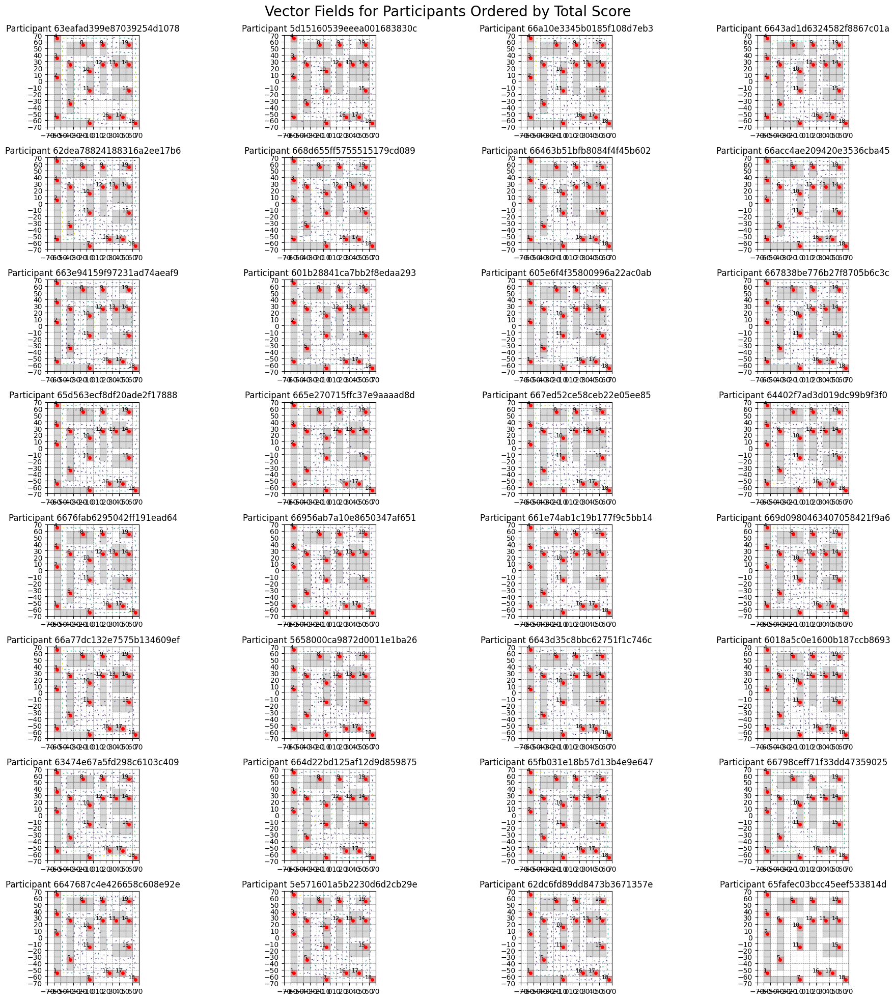

Processing complete. Vector field plots for all participants have been displayed.


In [ ]:
#Visualize the trajectories of each participant

import seaborn as sns
import os

def read_navigation_data(folder_path):
    all_data = []
    for filename in os.listdir(folder_path):
        if filename.endswith('.csv') and filename != 'recordscore.csv':  # Exclude the scores file
            df = pd.read_csv(os.path.join(folder_path, filename))
            all_data.append(df)
    return pd.concat(all_data, ignore_index=True)

def create_vector_field(data, grid_size=5):
    x_bins = np.linspace(data['x'].min(), data['x'].max(), grid_size)
    y_bins = np.linspace(data['y'].min(), data['y'].max(), grid_size)

    grid_x, grid_y = np.meshgrid(x_bins[:-1] + np.diff(x_bins)/2,
                                 y_bins[:-1] + np.diff(y_bins)/2)

    u = np.zeros_like(grid_x)
    v = np.zeros_like(grid_y)

    for _, group in data.groupby(['participantid', 'trialnum']):
        for i in range(len(group) - 1):
            x, y = group['x'].iloc[i], group['y'].iloc[i]
            dx = group['x'].iloc[i+1] - x
            dy = group['y'].iloc[i+1] - y

            x_idx = np.digitize(x, x_bins) - 1
            y_idx = np.digitize(y, y_bins) - 1

            if 0 <= x_idx < grid_size-1 and 0 <= y_idx < grid_size-1:
                u[y_idx, x_idx] += dx
                v[y_idx, x_idx] += dy

    magnitude = np.sqrt(u**2 + v**2)
    u = np.divide(u, magnitude, out=np.zeros_like(u), where=magnitude!=0)
    v = np.divide(v, magnitude, out=np.zeros_like(v), where=magnitude!=0)

    return grid_x, grid_y, u, v, magnitude

def plot_vector_fields_for_participants(nav_data, sorted_participants):
    num_participants = len(sorted_participants)
    cols = 4
    rows = (num_participants + cols - 1) // cols  # Calculate rows needed

    fig, axes = plt.subplots(rows, cols, figsize=(20, 20))
    fig.suptitle('Vector Fields for Participants Ordered by Total Score', fontsize=20)

    # Flatten axes array for easy iteration
    axes = axes.flatten()

    # Building and wall coordinates
    building_coords = {
        1: (-55, -55), 2: (-55, 5), 3: (-55, 35), 4: (-55, 65), 5: (-35, -35),
        6: (-35, 25), 7: (-5, -65), 8: (-15, 55), 9: (15, 55), 10: (-5, 15),
        11: (-5, -15), 12: (15, 25), 13: (35, 25), 14: (55, 25), 15: (55, -15),
        16: (25, -55), 17: (45, -55), 18: (65, -65), 19: (55, 55)
    }
    walls_data = pd.read_csv("/content/drive/MyDrive/trajectory_analysis/OnlineNavigation/walls.csv")
    x_origins = walls_data['X_origin']
    z_origins = walls_data['Z_origin']

    walls_coords = [(x, y) for x, y in zip(x_origins, z_origins)]  # Replace with actual wall coordinates

    for ax, participant_id in zip(axes, sorted_participants):
        participant_data = nav_data[nav_data['participantid'] == participant_id]

        # Create vector field
        grid_x, grid_y, u, v, magnitude = create_vector_field(participant_data, grid_size=20)

        # Plot vector field with shorter arrows
        quiver = ax.quiver(grid_x, grid_y, u, v, magnitude,
                           cmap='viridis', scale=40, width=0.003,
                           headwidth=4, headlength=5, headaxislength=4.5)
        ax.set_title(f'Participant {participant_id}')

        # Plot building locations
        for building, (x, y) in building_coords.items():
            ax.plot(x, y, 'ro', markersize=4)
            ax.text(x, y, str(building), fontsize=8, ha='right', va='bottom')

        # Shade grid cells for buildings and walls
        grid_size = 10
        for (bx, by) in building_coords.values():
            ax.fill_betweenx([by - grid_size / 2, by + grid_size / 2], bx - grid_size / 2, bx + grid_size / 2, color='red', alpha=0.3)
        for (wx, wy) in walls_coords:
            ax.fill_betweenx([wy - grid_size / 2, wy + grid_size / 2], wx - grid_size / 2, wx + grid_size / 2, color='gray', alpha=0.3)

        ax.set_xlim(-70, 70)
        ax.set_ylim(-70, 70)
        ax.set_aspect('equal', 'box')
        ax.set_xticks(np.arange(-70, 71, 10))
        ax.set_yticks(np.arange(-70, 71, 10))
        ax.grid(True, which='both', color='gray', linestyle='--', linewidth=0.5)

    # Remove empty subplots
    for ax in axes[num_participants:]:
        fig.delaxes(ax)

    plt.tight_layout()
    plt.subplots_adjust(top=0.95)
    plt.show()

def main():
    # Specify the directory (adjust this path to match your mounted Drive structure)
    nav_data_dir = 'OnlineNavigation/Navigation'

    # Read data
    nav_data = read_navigation_data(nav_data_dir)

    # Read and sort participants by totalscore
    score_df = pd.read_csv(os.path.join(nav_data_dir, '/content/drive/MyDrive/trajectory_analysis/OnlineNavigation/recordscore.csv'))
    sorted_participants = score_df.sort_values(by='totalscore', ascending=False)['participantid'].tolist()

    # Plot vector fields for participants
    plot_vector_fields_for_participants(nav_data, sorted_participants)

    print("Processing complete. Vector field plots for all participants have been displayed.")

if __name__ == "__main__":
    main()


# **Create Distance Matrix**

---



In [ ]:
map_scale = 10.0
def load_landmarks(file_name):
  landmarks = {}
  with open(file_name, encoding="utf8", errors='ignore') as csvfile:
    reader = csv.reader(csvfile)
    next(reader)
    for row in reader:
      obj=(row[0],int(row[3]),int(row[4]))
      landmarks[obj[0]]=(obj[1],obj[2])

  print("landmarks: Loaded {} landmarks".format(len(landmarks)))
  return landmarks

In [ ]:
landmarks = load_landmarks("/content/drive/MyDrive/trajectory_analysis/OnlineNavigation/landmarks.csv")

landmarks: Loaded 19 landmarks


In [ ]:
landmarks

{'one': (1, 2),
 'two': (1, 8),
 'three': (1, 11),
 'four': (1, 14),
 'five': (3, 4),
 'six': (3, 10),
 'seven': (5, 2),
 'eight': (4, 14),
 'nine': (8, 13),
 'ten': (4, 9),
 'eleven': (6, 6),
 'twelve': (6, 10),
 'thirteen': (8, 10),
 'fourteen': (12, 10),
 'fifteen': (12, 6),
 'sixteen': (8, 3),
 'seventeen': (10, 3),
 'eighteen': (11, 1),
 'nineteen': (12, 13)}

In [ ]:
grid_x = [i for i in range(15)]
print(grid_x)
grid_y = [i for i in range(17)]
print(grid_y)
map_width = len(grid_x)-1
print(map_width)
map_height = len(grid_y)-1
print(map_height)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]
14
16


In [ ]:
def coord_to_index(coord):
  x, y = coord
  if x > map_width or x < 0 or y > map_height or y < 0:
    raise ValueError("Coord out of bounds")
  return int(x + y*map_width)

def index_to_coord(index):
  x = index % map_width
  y = (index - x) // map_width
  return x, y

In [ ]:
def get_tile_map(grid_x,grid_y):
  tile_map = [[np.zeros(2) for _ in range(len(grid_x) - 1)] for _ in range(len(grid_y)-1)]
  for col in range(len(grid_x) - 1):
    for row in range(len(grid_y) - 1):
      x = (grid_x[col] + grid_x[col+1]) / 2
      y = (grid_y[row] + grid_y[row+1]) / 2
      tile_map[row][col] = np.array([x,y])

  return tile_map

In [ ]:
tile_map = get_tile_map(grid_x,grid_y)

In [ ]:
def generate_connectivity_matrix(map_width, map_height, tile_map):
  matrix = np.zeros((map_width * map_height, map_width * map_height))

  for row in range(map_height):
    for col in range(map_width):
      current_index = row * map_width + col
      current_center = tile_map[row][col]
      if row < map_height-1: # connect to block above
        above_index = (row + 1) * map_width + col
        above_center = tile_map[row+1][col]
        matrix[current_index][above_index] = np.linalg.norm(current_center - above_center)
      if row > 0:  # connect to block below
          below_index = (row - 1) * map_width + col
          below_center = tile_map[row - 1][col]
          matrix[current_index][below_index] = np.linalg.norm(current_center - below_center)
      if col > 0:  # connect to block to the left
          left_index = row * map_width + (col - 1)
          left_center = tile_map[row][col - 1]
          matrix[current_index][left_index] = np.linalg.norm(current_center - left_center)
      if col < map_width-1:  # connect to block to the right
          right_index = row * map_width + (col + 1)
          right_center = tile_map[row][col + 1]
          matrix[current_index][right_index] = np.linalg.norm(current_center - right_center)
      # connect to current block
      matrix[current_index][current_index] = 999

  return matrix

In [ ]:
conn_matrix  = generate_connectivity_matrix(map_width, map_height, tile_map)

In [ ]:
def load_walls(file_name):
  walls = []
    # read walls and transform them into the index space for the connectivity maps
  with open(file_name,"r") as csv_file:
      reader = csv.reader(csv_file)
      next(reader)
      for row in reader:
        x, y = int(row[2]), int(row[3])
        walls.append((x,y))
  return walls

In [ ]:
walls = load_walls("/content/drive/MyDrive/trajectory_analysis/OnlineNavigation/walls.csv")

In [ ]:
walls

[(0, 1),
 (1, 1),
 (2, 1),
 (3, 1),
 (4, 1),
 (5, 1),
 (12, 1),
 (0, 2),
 (8, 2),
 (9, 2),
 (10, 2),
 (0, 3),
 (2, 3),
 (0, 4),
 (2, 4),
 (0, 5),
 (2, 5),
 (9, 5),
 (10, 5),
 (11, 5),
 (0, 6),
 (2, 6),
 (5, 6),
 (7, 6),
 (9, 6),
 (10, 6),
 (11, 6),
 (0, 7),
 (2, 7),
 (5, 7),
 (7, 7),
 (0, 8),
 (2, 8),
 (5, 8),
 (7, 8),
 (9, 8),
 (10, 8),
 (11, 8),
 (0, 9),
 (2, 9),
 (5, 9),
 (7, 9),
 (9, 9),
 (10, 9),
 (11, 9),
 (0, 10),
 (2, 10),
 (5, 10),
 (7, 10),
 (9, 10),
 (10, 10),
 (11, 10),
 (0, 11),
 (9, 11),
 (10, 11),
 (0, 12),
 (2, 12),
 (3, 12),
 (4, 12),
 (5, 12),
 (7, 12),
 (0, 13),
 (2, 13),
 (3, 13),
 (4, 13),
 (5, 13),
 (7, 13),
 (10, 13),
 (11, 13),
 (0, 14),
 (6, 0),
 (7, 0),
 (8, 0),
 (9, 0),
 (10, 0),
 (11, 0),
 (13, 2),
 (13, 3),
 (13, 4),
 (13, 5),
 (13, 6),
 (13, 7),
 (13, 8),
 (13, 9),
 (13, 10),
 (13, 11),
 (13, 12),
 (13, 13),
 (13, 14),
 (12, 15),
 (11, 15),
 (10, 15),
 (9, 15),
 (8, 15),
 (7, 15),
 (6, 15),
 (5, 15),
 (4, 15),
 (3, 15),
 (2, 15),
 (1, 15)]

In [ ]:
def load_walls_to_connectivity_matrix(walls, conn_matrix):
  for i in range(len(walls)):
    x, y = int(walls[i][0]), int(walls[i][1])
    #print("x: {}, y: {}".format(x,y))
    current_index = coord_to_index((x,y))
    t = index_to_coord(current_index)
    print("X: {}, Y: {}, Index: {}, t: {}".format(x, y, current_index, t))
    # set current block and neighboring blocks to 0
    conn_matrix[current_index][current_index] = 0
    if x > 0:  # set block left to 0
        left_index = coord_to_index((x - 1, y))
        conn_matrix[current_index][left_index] = 0
        conn_matrix[left_index][current_index] = 0
    if x < map_width-1 :  # set block right to 0
        right_index = coord_to_index((x + 1, y))
        conn_matrix[current_index][right_index] = 0
        conn_matrix[right_index][current_index] = 0
    if y > 0:  # set block to the below to 0
        below_index = coord_to_index((x, y - 1))
        conn_matrix[current_index][below_index] = 0
        conn_matrix[below_index][current_index] = 0
    if y < map_height-1 :  # set block to the above to 0
        above_index = coord_to_index((x, y + 1))
        conn_matrix[current_index][above_index] = 0
        conn_matrix[above_index][current_index] = 0
  return conn_matrix

In [ ]:
conn_matrix = load_walls_to_connectivity_matrix(walls,conn_matrix)

X: 0, Y: 1, Index: 14, t: (0, 1)
X: 1, Y: 1, Index: 15, t: (1, 1)
X: 2, Y: 1, Index: 16, t: (2, 1)
X: 3, Y: 1, Index: 17, t: (3, 1)
X: 4, Y: 1, Index: 18, t: (4, 1)
X: 5, Y: 1, Index: 19, t: (5, 1)
X: 12, Y: 1, Index: 26, t: (12, 1)
X: 0, Y: 2, Index: 28, t: (0, 2)
X: 8, Y: 2, Index: 36, t: (8, 2)
X: 9, Y: 2, Index: 37, t: (9, 2)
X: 10, Y: 2, Index: 38, t: (10, 2)
X: 0, Y: 3, Index: 42, t: (0, 3)
X: 2, Y: 3, Index: 44, t: (2, 3)
X: 0, Y: 4, Index: 56, t: (0, 4)
X: 2, Y: 4, Index: 58, t: (2, 4)
X: 0, Y: 5, Index: 70, t: (0, 5)
X: 2, Y: 5, Index: 72, t: (2, 5)
X: 9, Y: 5, Index: 79, t: (9, 5)
X: 10, Y: 5, Index: 80, t: (10, 5)
X: 11, Y: 5, Index: 81, t: (11, 5)
X: 0, Y: 6, Index: 84, t: (0, 6)
X: 2, Y: 6, Index: 86, t: (2, 6)
X: 5, Y: 6, Index: 89, t: (5, 6)
X: 7, Y: 6, Index: 91, t: (7, 6)
X: 9, Y: 6, Index: 93, t: (9, 6)
X: 10, Y: 6, Index: 94, t: (10, 6)
X: 11, Y: 6, Index: 95, t: (11, 6)
X: 0, Y: 7, Index: 98, t: (0, 7)
X: 2, Y: 7, Index: 100, t: (2, 7)
X: 5, Y: 7, Index: 103, t: (5,

In [ ]:
def dijkstra(conn_matrix,start):
  n = len(conn_matrix)
  distances = [float('inf')] * n
  distances[start] = 0
  heap = [(0,start)]
  prev = [None] * n

  while heap:
    current_distance, current_node = heapq.heappop(heap)
    if current_distance > distances[current_node]:
      continue

    for neighbor in range(n):
      weight = conn_matrix[current_node][neighbor]
      if weight > 0:
        distance = current_distance + weight
        if distance < distances[neighbor]:
          distances[neighbor] = distance
          prev[neighbor] = current_node
          heapq.heappush(heap, (distance,neighbor))

  return distances, prev

In [ ]:
def reconstruct_path(prev, end, coord=False):
  path = []
  current = end
  while current is not None:
    path.append(current)
    current = prev[current]
  path.reverse()
  if coord:
    return [index_to_coord(index) for index in path]
  return path

In [ ]:
def access_landmark(x,y):
  steps = []
  if (x>0) and ((x-1,y) not in walls):
    steps.append((x-1,y))
  if (x<map_width-1) and ((x+1,y) not in walls):
    steps.append((x+1,y))
  if (y>1) and ((x,y-1) not in walls):
    steps.append((x,y-1))
  if (y<map_height-1) and ((x,y+1)not in walls):
    steps.append((x,y+1))
  return steps

In [ ]:
def calculate_shortest_paths(conn_matrix, landmarks):
  shortest_paths = {}
  landmarkIDs = list(landmarks.keys())
  for i in range(len(landmarkIDs)):
    for j in range(i+1, len(landmarkIDs)):
      start_ID =  landmarkIDs[i]
      end_ID = landmarkIDs[j]
      start_obj = landmarks[start_ID]
      end_obj = landmarks[end_ID]
      start_steps = access_landmark(start_obj[0],start_obj[1])
      end_steps = access_landmark(end_obj[0],end_obj[1])
      shortest_dist = None


      for s in range(len(start_steps)):
        for e in range(len(end_steps)):
          start_index = coord_to_index(start_steps[s])
          end_index = coord_to_index(end_steps[e])
          distances, prev = dijkstra(conn_matrix, start_index)
          distance = distances[end_index]
          if shortest_dist is None:
            shortest_prev = prev
            shortest_dist = distance+1
            start = start_index
            end = end_index
          elif distance+1 < shortest_dist:
            shortest_prev = prev
            shortest_dist = distance+1
            start = start_index
            end = end_index


      #store the path trajectory
      # print('the shortcut prev for {} to {} is {}, and the distance is {}'.format(start,end,shortest_prev,shortest_dist))
      path = reconstruct_path(shortest_prev, end, coord=True)
      nested_dict = {end_ID: (shortest_dist, path)}
      if start_ID in shortest_paths:
        shortest_paths[start_ID].update(nested_dict)
      else:
        shortest_paths[start_ID] = nested_dict

  return shortest_paths

In [ ]:
shortest_paths = calculate_shortest_paths(conn_matrix,landmarks)

In [ ]:
for start_ID in shortest_paths.keys():
  for end_ID in shortest_paths[start_ID].keys():
    start_obj = landmarks[start_ID]
    end_obj = landmarks[end_ID]
    shortest_distance, path = shortest_paths[start_ID][end_ID]
    path = "->".join([str(coord) for coord in path])
    print("start: {}, end: {}, distance: {}, path: {}".format(start_ID, end_ID,shortest_distance, path))

start: one, end: two, distance: 5.0, path: (1, 3)->(1, 4)->(1, 5)->(1, 6)->(1, 7)
start: one, end: three, distance: 8.0, path: (1, 3)->(1, 4)->(1, 5)->(1, 6)->(1, 7)->(1, 8)->(1, 9)->(1, 10)
start: one, end: four, distance: 11.0, path: (1, 3)->(1, 4)->(1, 5)->(1, 6)->(1, 7)->(1, 8)->(1, 9)->(1, 10)->(1, 11)->(1, 12)->(1, 13)
start: one, end: five, distance: 3.0, path: (2, 2)->(3, 2)->(3, 3)
start: one, end: six, distance: 9.0, path: (2, 2)->(3, 2)->(3, 3)->(3, 4)->(3, 5)->(3, 6)->(3, 7)->(3, 8)->(3, 9)
start: one, end: seven, distance: 3.0, path: (2, 2)->(3, 2)->(4, 2)
start: one, end: eight, distance: 14.0, path: (1, 3)->(1, 4)->(1, 5)->(1, 6)->(1, 7)->(1, 8)->(1, 9)->(1, 10)->(1, 11)->(1, 12)->(1, 13)->(1, 14)->(2, 14)->(3, 14)
start: one, end: nine, distance: 17.0, path: (2, 2)->(3, 2)->(4, 2)->(5, 2)->(6, 2)->(7, 2)->(7, 3)->(8, 3)->(8, 4)->(8, 5)->(8, 6)->(8, 7)->(8, 8)->(8, 9)->(8, 10)->(8, 11)->(8, 12)
start: one, end: ten, distance: 9.0, path: (2, 2)->(3, 2)->(3, 3)->(3, 4)->(3

In [ ]:
def save_shortest_distances(file_name,paths):
  with open(file_name, "w", newline="") as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(
        ["Landmark1","Landmark1_X","Landmark1_Z","Landmark2","Landmark2_X","Landmark2_Z","Shortest_Distance","Path"]
    )

    for start_ID in paths.keys():
      for end_ID in paths[start_ID].keys():
        start_obj = landmarks[start_ID]
        end_obj = landmarks[end_ID]
        shortest_distance, path = paths[start_ID][end_ID]
        path = "->".join([str(coord) for coord in path])
        writer.writerow(
            [start_ID, start_obj[0], start_obj[1], end_ID, end_obj[0], end_obj[1],shortest_distance, path]
        )
save_shortest_distances("shortest_distances.csv",shortest_paths)

In [ ]:
shortest_path  = pd.read_csv("shortest_distances.csv")
shortest_path.head()

,Landmark1,Landmark1_X,Landmark1_Z,Landmark2,Landmark2_X,Landmark2_Z,Shortest_Distance,Path
0,one,1,2,two,1,8,5.0,"(1, 3)->(1, 4)->(1, 5)->(1, 6)->(1, 7)"
1,one,1,2,three,1,11,8.0,"(1, 3)->(1, 4)->(1, 5)->(1, 6)->(1, 7)->(1, 8)..."
2,one,1,2,four,1,14,11.0,"(1, 3)->(1, 4)->(1, 5)->(1, 6)->(1, 7)->(1, 8)..."
3,one,1,2,five,3,4,3.0,"(2, 2)->(3, 2)->(3, 3)"
4,one,1,2,six,3,10,9.0,"(2, 2)->(3, 2)->(3, 3)->(3, 4)->(3, 5)->(3, 6)..."


In [ ]:
matrix = shortest_path.pivot(index='Landmark1', columns='Landmark2', values='Shortest_Distance')

# Define the desired order for rows and columns
places = ['one', 'two', 'three', 'four', 'five',
          'six', 'seven', 'eight', 'nine', 'ten',
          'eleven', 'twelve', 'thirteen', 'fourteen', 'fifteen',
          'sixteen', 'seventeen', 'eighteen', 'nineteen']

# Reorder rows and columns based on the desired order
matrix = matrix.reindex(index=places, columns=places)

# Fill the upper triangle of the matrix
for i in range(matrix.shape[0]):
    for j in range(i+1, matrix.shape[1]):
        if np.isnan(matrix.iloc[i, j]) and not np.isnan(matrix.iloc[j, i]):
            matrix.iloc[i, j] = matrix.iloc[j, i]
        elif np.isnan(matrix.iloc[j, i]) and not np.isnan(matrix.iloc[i, j]):
            matrix.iloc[j, i] = matrix.iloc[i, j]

# Make the matrix symmetric
matrix = np.maximum(matrix, matrix.T)

# Set diagonal to 0
np.fill_diagonal(matrix.values, 0)

In [ ]:
matrix.values

array([[ 0.,  5.,  8., 11.,  3.,  9.,  3., 14., 17.,  9.,  8., 12., 14., 18., 14.,  7.,  9., 10., 21.],
       [ 5.,  0.,  2.,  5.,  9.,  5.,  9.,  8., 11.,  7., 12.,  8., 10., 16., 18., 13., 15., 16., 15.],
       [ 8.,  2.,  0.,  2.,  8.,  2., 12.,  5.,  8.,  4.,  9.,  5.,  7., 13., 15., 14., 16., 19., 12.],
       [11.,  5.,  2.,  0., 11.,  5., 15.,  2.,  7.,  7., 12.,  8., 10., 14., 18., 17., 19., 22., 11.],
       [ 3.,  9.,  8., 11.,  0.,  5.,  3., 14., 13.,  5.,  4.,  8., 10., 14., 10.,  5.,  7., 10., 17.],
       [ 9.,  5.,  2.,  5.,  5.,  0.,  9.,  8.,  7.,  1.,  8.,  4.,  6., 12., 14., 11., 13., 16., 11.],
       [ 3.,  9., 12., 15.,  3.,  9.,  0., 14., 13.,  7.,  4.,  8., 10., 14., 10.,  3.,  5.,  6., 17.],
       [14.,  8.,  5.,  2., 14.,  8., 14.,  0.,  4.,  8.,  9.,  5.,  7., 11., 15., 14., 16., 19.,  8.],
       [17., 11.,  8.,  7., 13.,  7., 13.,  4.,  0.,  7.,  8.,  4.,  2.,  6., 10.,  9., 11., 14.,  5.],
       [ 9.,  7.,  4.,  7.,  5.,  1.,  7.,  8.,  7.,  0.,  6.,  

In [ ]:
distance_matrix = np.array(matrix)
rows, cols = distance_matrix.shape
for i in range(rows):
  for j in range(cols):
    if i != j:
      distance_matrix[i, j] += 1
distance_matrix = distance_matrix * 10
np.fill_diagonal(matrix.values, 0)

In [ ]:
distance_matrix.astype(int)
distance_matrix
distance_matrix.flags.writeable = False

# **Extract Building Visited Order**

In [ ]:
#Create dictionary with building name and building number
def random_buildings_indices(file):
    building_keys = {}

    with open(file, newline='') as random_building_data:
        read = csv.reader(random_building_data, delimiter=',', quotechar='|')
        for row in read:
            building_keys[row[2]] = row[1]
    return building_keys

In [ ]:
#Puts the visiting order of each trial into its own array
def visited_buildings(file, building_file):
    trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = [], [], [], [], [], [], [], []

    building_keys = random_buildings_indices(building_file)

    with open(file, newline='') as visited_data:
        read = csv.reader(visited_data, delimiter=',', quotechar='|')
        for row in read:
            #print(row)
            if row[1] == '1':
                trial1.append(int(building_keys[row[3]]))
            elif row[1] == '2':
                trial2.append(int(building_keys[row[3]]))
            elif row[1] == '3':
                trial3.append(int(building_keys[row[3]]))
            elif row[1] == '4':
                trial4.append(int(building_keys[row[3]]))
            elif row[1] == '5':
                trial5.append(int(building_keys[row[3]]))
            elif row[1] == '6':
                trial6.append(int(building_keys[row[3]]))
            elif row[1] == '7':
                trial7.append(int(building_keys[row[3]]))
            elif row[1] == '8':
                trial8.append(int(building_keys[row[3]]))

    return trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8

In [ ]:
#Create dictionary with building number and building name
def random_buildings_indices_reversed(file):
    building_keys = {}

    with open(file, newline='') as random_building_data:
        read = csv.reader(random_building_data, delimiter=',', quotechar='|')
        next(read)
        for row in read:
            building_keys[int(row[1])] = row[2]
    return building_keys

# **Viewing Order**

In [ ]:
#Record the viewing order for all participants in viewingorder.csv
def save_viewing_order():
    # Coordinate for store front
    store_front_coords = {
        1: (-50, -55), 2: (-50, 5), 3: (-50, 35), 4: (-50, 65),
        5: (-30, -35), 6: (-30, 25), 7: (-5, -60), 8: (-15, 60),
        9: (20, 55), 10: (-10, 15), 11: (0, -15), 12: (10, 25),
        13: (30, 25), 14: (60, 25), 15: (60, -15), 16: (25, -50),
        17: (45, -50), 18: (60, -65), 19: (60, 55)
    }

    # Radius of circle
    circular_range = 10

    # Navigation data files
    files = [f for f in listdir('OnlineNavigation/Navigation') if isfile(join('OnlineNavigation/Navigation', f))]

    # Function to check if a point is inside a circle
    def is_inside_circle(point, center, radius):
        return math.sqrt((point[0] - center[0])**2 + (point[1] - center[1])**2) <= radius

    # Prepare output file
    with open('/content/drive/MyDrive/trajectory_analysis/OnlineNavigation/viewingorder.csv', 'w', newline='') as csvfile:
        csvwriter = csv.writer(csvfile)
        csvwriter.writerow(['participantid', 'trialnum', 'buildingname', 'buildingorder'])

        for file in files:
            building_keys = random_buildings_indices_reversed(f'OnlineNavigation/RandomizedBuildings/{file}')

            participantid = file.replace("participant_", "").replace(".csv", "")

            # Load all 8 trials for the participant
            trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = trials(f'OnlineNavigation/Navigation/{file}')
            trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = convert_to_discrete(trial1), convert_to_discrete(trial2), convert_to_discrete(trial3), convert_to_discrete(trial4), convert_to_discrete(trial5), convert_to_discrete(trial6), convert_to_discrete(trial7), convert_to_discrete(trial8)
            all_trials = [trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8]

            # Loop through each trial
            for trial_num, trial in enumerate(all_trials, 1):
                viewing_order = []
                currently_viewing = set()

                # Check the first point in the trial
                first_point = trial[0]
                for building, coord in store_front_coords.items():
                    if is_inside_circle(first_point, coord, circular_range):
                        currently_viewing.add(building)
                        viewing_order.append(building)

                # Iterate through each point in the trial
                for i in range(len(trial) - 1):
                    current_point = trial[i]
                    next_point = trial[i + 1]

                    for building, coord in store_front_coords.items():
                        # Check if we've entered a new circle
                        if (not is_inside_circle(current_point, coord, circular_range) and is_inside_circle(next_point, coord, circular_range)):
                            currently_viewing.add(building)
                            viewing_order.append(building)  # Append building to viewing order in the exact sequence

                        # Check if we've left a circle
                        elif (is_inside_circle(current_point, coord, circular_range) and not is_inside_circle(next_point, coord, circular_range)):
                            if building in currently_viewing:
                                currently_viewing.remove(building)

                # Check the last point in the trial
                last_point = trial[-1]
                for building, coord in store_front_coords.items():
                    if is_inside_circle(last_point, coord, circular_range) and building not in viewing_order:
                        viewing_order.append(building)

                # Write the final viewing order for the trial to the CSV
                for idx, building in enumerate(viewing_order, 1):
                    csvwriter.writerow([participantid, trial_num, building_keys[building], building])



In [ ]:
save_viewing_order()

In [ ]:
#Saves viewing order data for each participant

main_file_path = '/content/drive/MyDrive/trajectory_analysis/OnlineNavigation/viewingorder.csv'

# Read the CSV file
main_data = pd.read_csv(main_file_path)

# Ensure the necessary columns are present in the main data
required_columns = ['participantid', 'trialnum', 'buildingname']
if not all(column in main_data.columns for column in required_columns):
    raise ValueError("Input CSV does not contain all required columns")

# Filter the main data to include only valid participants
participant_ids = main_data['participantid'].unique()

# Separate data by participant ID and write to separate CSV files
for participant_id in participant_ids:
    # Filter data for the current participant without altering the original order
    participant_data = main_data[main_data['participantid'] == participant_id]

    # Write the data to a separate CSV file, maintaining the original order
    output_file = f'/content/drive/MyDrive/trajectory_analysis/OnlineNavigation/BuildingViewingOrder/participant_{participant_id}.csv'
    participant_data.to_csv(output_file, index=False)
    print(f'Data for participant {participant_id} written to {output_file}')


Data for participant 6643d35c8bbc62751f1c746c written to /content/drive/MyDrive/trajectory_analysis/OnlineNavigation/BuildingViewingOrder/participant_6643d35c8bbc62751f1c746c.csv
Data for participant 661e74ab1c19b177f9c5bb14 written to /content/drive/MyDrive/trajectory_analysis/OnlineNavigation/BuildingViewingOrder/participant_661e74ab1c19b177f9c5bb14.csv
Data for participant 668d655ff5755515179cd089 written to /content/drive/MyDrive/trajectory_analysis/OnlineNavigation/BuildingViewingOrder/participant_668d655ff5755515179cd089.csv
Data for participant 601b28841ca7bb2f8edaa293 written to /content/drive/MyDrive/trajectory_analysis/OnlineNavigation/BuildingViewingOrder/participant_601b28841ca7bb2f8edaa293.csv
Data for participant 667838be776b27f8705b6c3c written to /content/drive/MyDrive/trajectory_analysis/OnlineNavigation/BuildingViewingOrder/participant_667838be776b27f8705b6c3c.csv
Data for participant 65fb031e18b57d13b4e9e647 written to /content/drive/MyDrive/trajectory_analysis/Onlin

In [ ]:
#Create an array for each trial of the all the buildings viewed
def visited_buildings_viewing(file, building_file):
    trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = [], [], [], [], [], [], [], []

    building_keys = random_buildings_indices(building_file)

    with open(file, newline='') as visited_data:
        read = csv.reader(visited_data, delimiter=',', quotechar='|')
        for row in read:
            #print(row)
            if row[1] == '1':
                trial1.append(int(building_keys[row[2]]))
            elif row[1] == '2':
                trial2.append(int(building_keys[row[2]]))
            elif row[1] == '3':
                trial3.append(int(building_keys[row[2]]))
            elif row[1] == '4':
                trial4.append(int(building_keys[row[2]]))
            elif row[1] == '5':
                trial5.append(int(building_keys[row[2]]))
            elif row[1] == '6':
                trial6.append(int(building_keys[row[2]]))
            elif row[1] == '7':
                trial7.append(int(building_keys[row[2]]))
            elif row[1] == '8':
                trial8.append(int(building_keys[row[2]]))

    return trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8

In [ ]:
def optimal_path_distance_viewing():
    files = [f for f in listdir('OnlineNavigation/BuildingVisitedOrder') if isfile(join('OnlineNavigation/BuildingVisitedOrder', f))]
    distance1, distance2, distance3, distance4, distance5, distance6, distance7, distance8 = 0, 0, 0, 0, 0, 0, 0, 0
    diff1, diff2, diff3, diff4, diff5, diff6, diff7, diff8 = [], [], [], [], [], [], [], []
    counter = 1

    for file in files:

        counter += 1

        trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = visited_buildings_viewing(f'OnlineNavigation/BuildingViewingOrder/{file}', f'OnlineNavigation/RandomizedBuildings/{file}')
        trial1_real, trial2_real, trial3_real, trial4_real, trial5_real, trial6_real, trial7_real, trial8_real = trials(f'OnlineNavigation/Navigation/{file}')
        trial1_real, trial2_real, trial3_real, trial4_real, trial5_real, trial6_real, trial7_real, trial8_real = convert_to_discrete(trial1_real), convert_to_discrete(trial2_real), convert_to_discrete(trial3_real), convert_to_discrete(trial4_real), convert_to_discrete(trial5_real), convert_to_discrete(trial6_real), convert_to_discrete(trial7_real), convert_to_discrete(trial8_real)

        for i in range(len(trial1)-1):
            distance1 += distance_matrix[trial1[i]-1][trial1[i+1]-1]

        for i in range(len(trial2)-1):
            distance2 += distance_matrix[trial2[i]-1][trial2[i+1]-1]

        for i in range(len(trial3)-1):
            distance3 += distance_matrix[trial3[i]-1][trial3[i+1]-1]

        for i in range(len(trial4)-1):
            distance4 += distance_matrix[trial4[i]-1][trial4[i+1]-1]

        for i in range(len(trial5)-1):
            distance5 += distance_matrix[trial5[i]-1][trial5[i+1]-1]

        for i in range(len(trial6)-1):
            distance6 += distance_matrix[trial6[i]-1][trial6[i+1]-1]

        for i in range(len(trial7)-1):
            distance7 += distance_matrix[trial7[i]-1][trial7[i+1]-1]

        for i in range(len(trial8)-1):
            distance8 += distance_matrix[trial8[i]-1][trial8[i+1]-1]

        diff1.append(distance(trial1_real) - distance1)
        diff2.append(distance(trial2_real) - distance2)
        diff3.append(distance(trial3_real) - distance3)
        diff4.append(distance(trial4_real) - distance4)
        diff5.append(distance(trial5_real) - distance5)
        diff6.append(distance(trial6_real) - distance6)
        diff7.append(distance(trial7_real) - distance7)
        diff8.append(distance(trial8_real) - distance8)

        print('index 1')
        print(distance(trial1_real) - distance1)

        print('index 2')
        print(distance(trial2_real) - distance2)

        print('index 3')
        print(distance(trial3_real) - distance3)

        print('index 4')
        print(distance(trial4_real) - distance4)

        print('index 5')
        print(distance(trial5_real) - distance5)

        print('index 6')
        print(distance(trial6_real) - distance6)

        print('index 7')
        print(distance(trial7_real) - distance7)

        print('index 8')
        print(distance(trial8_real) - distance8)

        print()

        distance1, distance2, distance3, distance4, distance5, distance6, distance7, distance8 = 0, 0, 0, 0, 0, 0, 0, 0

    arrays = [diff1, diff2, diff3, diff4, diff5, diff6, diff7, diff8]
    # Plot each trial
    plt.figure(figsize=(10, 10))
    cmap = plt.get_cmap('viridis')
    for trial_num, arr in enumerate(arrays):
        x = np.full(len(arr), trial_num + 1)  # X values are the trial numbers (1-based)
        y = arr
        colors = np.linspace(0, 1, len(arr))  # Color by position in the array
        plt.scatter(x, y, c=colors, cmap=cmap, s=100, edgecolor='k', label=f'Trial {trial_num + 1}')

    # Add a colorbar
    norm = plt.Normalize(vmin=0, vmax=len(diff1) - 1)
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    plt.colorbar(sm, ticks=range(1, len(diff1)+1), label='Participant')

    # Label the axes
    plt.xlabel('Trial number')
    plt.ylabel('Revisiting Index')
    plt.xticks(ticks=np.arange(1, 9), labels=[f'Trial {i}' for i in range(1, 9)])  # Set x-axis labels to trial numbers


In [ ]:
#plots a boxplot for each trial of the revisiting index using the viewing order
def revisiting_index_boxplot_viewing():
    files = [f for f in listdir('OnlineNavigation/BuildingVisitedOrder') if isfile(join('OnlineNavigation/BuildingVisitedOrder', f))]
    distance1, distance2, distance3, distance4, distance5, distance6, distance7, distance8 = 0, 0, 0, 0, 0, 0, 0, 0
    diff1, diff2, diff3, diff4, diff5, diff6, diff7, diff8 = 0, 0, 0, 0, 0, 0, 0, 0
    mean1, mean2, mean3, mean4, mean5, mean6, mean7, mean8 = [], [], [], [], [], [], [], []

    x = [1, 2, 3, 4, 5, 6, 7, 8]

    for file in files:
        trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = visited_buildings_viewing(f'OnlineNavigation/BuildingViewingOrder/{file}', f'OnlineNavigation/RandomizedBuildings/{file}')
        trial1_real, trial2_real, trial3_real, trial4_real, trial5_real, trial6_real, trial7_real, trial8_real = trials(f'OnlineNavigation/Navigation/{file}')
        trial1_real, trial2_real, trial3_real, trial4_real, trial5_real, trial6_real, trial7_real, trial8_real = convert_to_discrete(trial1_real), convert_to_discrete(trial2_real), convert_to_discrete(trial3_real), convert_to_discrete(trial4_real), convert_to_discrete(trial5_real), convert_to_discrete(trial6_real), convert_to_discrete(trial7_real), convert_to_discrete(trial8_real)

        for i in range(len(trial1)-1):
            distance1 += distance_matrix[trial1[i]-1][trial1[i+1]-1]

        for i in range(len(trial2)-1):
            distance2 += distance_matrix[trial2[i]-1][trial2[i+1]-1]

        for i in range(len(trial3)-1):
            distance3 += distance_matrix[trial3[i]-1][trial3[i+1]-1]

        for i in range(len(trial4)-1):
            distance4 += distance_matrix[trial4[i]-1][trial4[i+1]-1]

        for i in range(len(trial5)-1):
            distance5 += distance_matrix[trial5[i]-1][trial5[i+1]-1]

        for i in range(len(trial6)-1):
            distance6 += distance_matrix[trial6[i]-1][trial6[i+1]-1]

        for i in range(len(trial7)-1):
            distance7 += distance_matrix[trial7[i]-1][trial7[i+1]-1]

        for i in range(len(trial8)-1):
            distance8 += distance_matrix[trial8[i]-1][trial8[i+1]-1]

        diff1 = distance(trial1_real) - distance1
        diff2 = distance(trial2_real) - distance2
        diff3 = distance(trial3_real) - distance3
        diff4 = distance(trial4_real) - distance4
        diff5 = distance(trial5_real) - distance5
        diff6 = distance(trial6_real) - distance6
        diff7 = distance(trial7_real) - distance7
        diff8 = distance(trial8_real) - distance8

        mean1.append(diff1)
        mean2.append(diff2)
        mean3.append(diff3)
        mean4.append(diff4)
        mean5.append(diff5)
        mean6.append(diff6)
        mean7.append(diff7)
        mean8.append(diff8)

        distance1, distance2, distance3, distance4, distance5, distance6, distance7, distance8 = 0, 0, 0, 0, 0, 0, 0, 0


    plt.xlabel('Trial')
    plt.ylabel('Revisiting Index')
    plt.title('Boxplot of revisiting index using viewing order')
    plt.boxplot([mean1, mean2, mean3, mean4, mean5, mean6, mean7, mean8])


    # Calculate the mean of each boxplot
    boxplot_means = [np.mean(mean) for mean in [mean1, mean2, mean3, mean4, mean5, mean6, mean7, mean8]]

    # Add horizon line for each boxplot mean
    for i, mean in enumerate(boxplot_means, start=1):
        plt.hlines(mean, i-0.5, i+0.5, colors='green', linestyles='dashed', label='Boxplot mean' if i == 1 else '')


    x = np.random.normal(1, 0.04, size=len(mean1))
    plt.plot(x, mean1, 'r.', alpha=0.2)

    x = np.random.normal(2, 0.04, size=len(mean2))
    plt.plot(x, mean2, 'r.', alpha=0.2)

    x = np.random.normal(3, 0.04, size=len(mean3))
    plt.plot(x, mean3, 'r.', alpha=0.2)

    x = np.random.normal(4, 0.04, size=len(mean4))
    plt.plot(x, mean4, 'r.', alpha=0.2)

    x = np.random.normal(5, 0.04, size=len(mean5))
    plt.plot(x, mean5, 'r.', alpha=0.2)

    x = np.random.normal(6, 0.04, size=len(mean6))
    plt.plot(x, mean6, 'r.', alpha=0.2)

    x = np.random.normal(7, 0.04, size=len(mean7))
    plt.plot(x, mean7, 'r.', alpha=0.2)

    x = np.random.normal(8, 0.04, size=len(mean8))
    plt.plot(x, mean8, 'r.', alpha=0.2)

    means = [np.mean(mean1), np.mean(mean2), np.mean(mean3), np.mean(mean4), np.mean(mean5), np.mean(mean6), np.mean(mean7), np.mean(mean8)]
    print(means)
    plt.axhline(y=np.mean(means), color='b', linestyle='-', label="Overall mean")

    plt.legend()
    plt.show()

[140.0, 63.87096774193548, 59.354838709677416, 57.096774193548384, 32.25806451612903, 50.32258064516129, 41.29032258064516, 41.935483870967744]


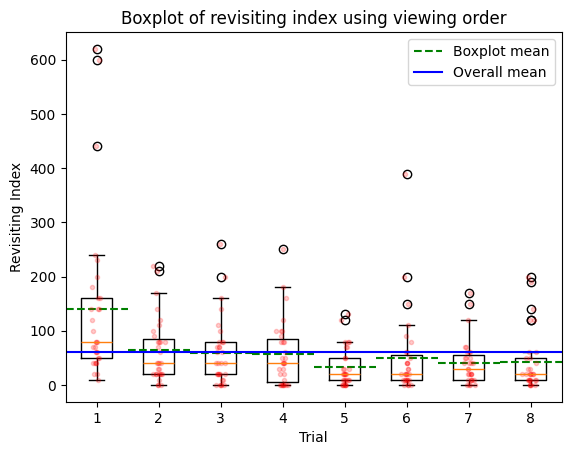

In [ ]:
revisiting_index_boxplot_viewing()

In [ ]:
#plots a graph for the revisiting index using the viewing order
def revisiting_index_line_viewing():
    files = [f for f in listdir('OnlineNavigation/BuildingVisitedOrder') if isfile(join('OnlineNavigation/BuildingVisitedOrder', f))]
    distance1, distance2, distance3, distance4, distance5, distance6, distance7, distance8 = 0, 0, 0, 0, 0, 0, 0, 0
    diff1, diff2, diff3, diff4, diff5, diff6, diff7, diff8 = 0, 0, 0, 0, 0, 0, 0, 0
    mean1, mean2, mean3, mean4, mean5, mean6, mean7, mean8 = [], [], [], [], [], [], [], []

    plt.figure(figsize=(10, 10))
    plt.title('Revisiting Index using Viewing Order')
    plt.xlabel('Trial number')
    plt.ylabel('Revisiting Index')
    plt.xticks(ticks=np.arange(1, 9), labels=[f'Trial {i}' for i in range(1, 9)])  # Set x-axis labels to trial numbers

    for file in files:
        trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = visited_buildings_viewing(f'OnlineNavigation/BuildingViewingOrder/{file}', f'OnlineNavigation/RandomizedBuildings/{file}')
        trial1_real, trial2_real, trial3_real, trial4_real, trial5_real, trial6_real, trial7_real, trial8_real = trials(f'OnlineNavigation/Navigation/{file}')
        trial1_real, trial2_real, trial3_real, trial4_real, trial5_real, trial6_real, trial7_real, trial8_real = convert_to_discrete(trial1_real), convert_to_discrete(trial2_real), convert_to_discrete(trial3_real), convert_to_discrete(trial4_real), convert_to_discrete(trial5_real), convert_to_discrete(trial6_real), convert_to_discrete(trial7_real), convert_to_discrete(trial8_real)

        for i in range(len(trial1)-1):
            distance1 += distance_matrix[trial1[i]-1][trial1[i+1]-1]

        for i in range(len(trial2)-1):
            distance2 += distance_matrix[trial2[i]-1][trial2[i+1]-1]

        for i in range(len(trial3)-1):
            distance3 += distance_matrix[trial3[i]-1][trial3[i+1]-1]

        for i in range(len(trial4)-1):
            distance4 += distance_matrix[trial4[i]-1][trial4[i+1]-1]

        for i in range(len(trial5)-1):
            distance5 += distance_matrix[trial5[i]-1][trial5[i+1]-1]

        for i in range(len(trial6)-1):
            distance6 += distance_matrix[trial6[i]-1][trial6[i+1]-1]

        for i in range(len(trial7)-1):
            distance7 += distance_matrix[trial7[i]-1][trial7[i+1]-1]

        for i in range(len(trial8)-1):
            distance8 += distance_matrix[trial8[i]-1][trial8[i+1]-1]

        diff1 = distance(trial1_real) - distance1
        diff2 = distance(trial2_real) - distance2
        diff3 = distance(trial3_real) - distance3
        diff4 = distance(trial4_real) - distance4
        diff5 = distance(trial5_real) - distance5
        diff6 = distance(trial6_real) - distance6
        diff7 = distance(trial7_real) - distance7
        diff8 = distance(trial8_real) - distance8

        mean1.append(diff1)
        mean2.append(diff2)
        mean3.append(diff3)
        mean4.append(diff4)
        mean5.append(diff5)
        mean6.append(diff6)
        mean7.append(diff7)
        mean8.append(diff8)

        x = [1, 2, 3, 4, 5, 6, 7, 8]
        y = [diff1, diff2, diff3, diff4, diff5, diff6, diff7, diff8]
        plt.plot(x, y, 'bo-', alpha = 0.2)

        distance1, distance2, distance3, distance4, distance5, distance6, distance7, distance8 = 0, 0, 0, 0, 0, 0, 0, 0

    x = [1, 2, 3, 4, 5, 6, 7, 8]
    y_mean = [np.mean(mean1), np.mean(mean2), np.mean(mean3), np.mean(mean4), np.mean(mean5), np.mean(mean6), np.mean(mean7), np.mean(mean8)]
    plt.plot(x, y_mean, 'ro-')

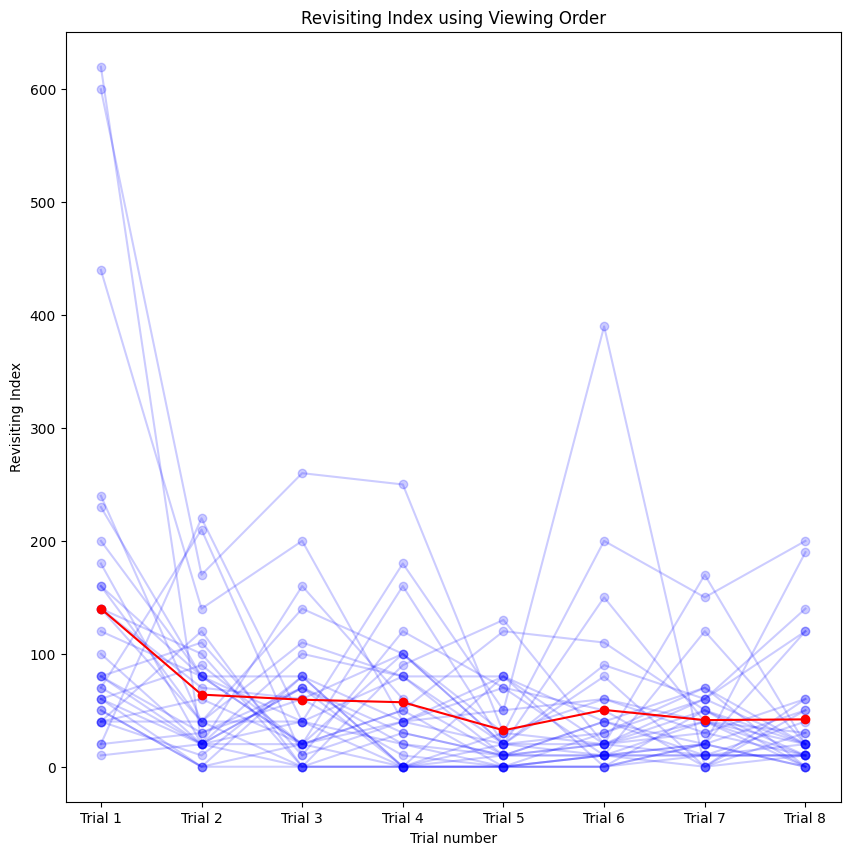

In [ ]:
revisiting_index_line_viewing()

# **Efficiency Data Table**

In [ ]:
#put viewing order data for each trial in its own array
def trials_viewing_order(file):
    trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = [], [], [], [], [], [], [], []

    with open(file, newline='') as viewing_order_data:
            read = csv.reader(viewing_order_data, delimiter=',', quotechar='|')
            #first_line = csv.reader(navigation_data)
            headers = next(read)
            for row in read:
                if row[1] == '1':
                    trial1.append(int(row[3]))
                elif row[1] == '2':
                    trial2.append(int(row[3]))
                elif row[1] == '3':
                    trial3.append(int(row[3]))
                elif row[1] == '4':
                    trial4.append(int(row[3]))
                elif row[1] == '5':
                    trial5.append(int(row[3]))
                elif row[1] == '6':
                    trial6.append(int(row[3]))
                elif row[1] == '7':
                    trial7.append(int(row[3]))
                elif row[1] == '8':
                    trial8.append(int(row[3]))

    return trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8

In [ ]:
#Returns an array of revisiting lags for a single trajectory
def revisited_lag(viewing_order):
    visited = {}
    lag = []
    for i in range(len(viewing_order)):
        if viewing_order[i] not in visited:
            visited[viewing_order[i]] = i
        else:
            lag.append(i - visited[viewing_order[i]])
            visited[viewing_order[i]] = i
    if not lag:
        return 0
    return lag

In [ ]:
#writes exploration efficiency data to desired file
def exploration_efficiency():
    files = [f for f in listdir('OnlineNavigation/Navigation') if isfile(join('OnlineNavigation/Navigation', f))]

    # visited order distances
    distance1, distance2, distance3, distance4, distance5, distance6, distance7, distance8 = 0, 0, 0, 0, 0, 0, 0, 0

    # viewing order distances
    view_distance1, view_distance2, view_distance3, view_distance4, view_distance5, view_distance6, view_distance7, view_distance8 = 0, 0, 0, 0, 0, 0, 0, 0

    # write data to file
    with open('/content/drive/MyDrive/trajectory_analysis/OnlineNavigation/explorationefficiency.csv', 'w', newline='') as csvfile:
        csvwriter = csv.writer(csvfile)
        csvwriter.writerow(['participant_id', 'trial_num', 'num_buildings_revisited', 'average_lag of_revisited_buildings', 'raw_dist', 'discretize_dist', 'ee_shortest', 'ee_visit', 'ee_view', 'frechet_last'])

        for file in files:
            #trajectory data for all 8 trials
            trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = trials(f'OnlineNavigation/Navigation/{file}')

            #viewing order for all 8 trials
            viewing_order1, viewing_order2, viewing_order3, viewing_order4, viewing_order5, viewing_order6, viewing_order7, viewing_order8 = trials_viewing_order(f'OnlineNavigation/BuildingViewingOrder/{file}')

            #visiting order for all 8 trials
            visited_order1, visited_order2, visited_order3, visited_order4, visited_order5, visited_order6, visited_order7, visited_order8 = visited_buildings(f'OnlineNavigation/BuildingVisitedOrder/{file}', f'OnlineNavigation/RandomizedBuildings/{file}')

            #indices of randomized buildings
            building_keys = random_buildings_indices_reversed(f'OnlineNavigation/RandomizedBuildings/{file}')

            participantid = file.replace("participant_", "").replace(".csv", "")

            #number of revisited buildings for each trial
            num_revisited1 = len(viewing_order1) - 19
            num_revisited2 = len(viewing_order2) - 19
            num_revisited3 = len(viewing_order3) - 19
            num_revisited4 = len(viewing_order4) - 19
            num_revisited5 = len(viewing_order5) - 19
            num_revisited6 = len(viewing_order6) - 19
            num_revisited7 = len(viewing_order7) - 19
            num_revisited8 = len(viewing_order8) - 19

            #array of revisiting lags for all 8 trials
            lag1, lag2, lag3, lag4, lag5, lag6, lag7, lag8 = revisited_lag(viewing_order1), revisited_lag(viewing_order2), revisited_lag(viewing_order3), revisited_lag(viewing_order4), revisited_lag(viewing_order5), revisited_lag(viewing_order6), revisited_lag(viewing_order7), revisited_lag(viewing_order8)

            #find optimal distance according to visiting order
            for i in range(len(visited_order1)-1):
                distance1 += distance_matrix[visited_order1[i]-1][visited_order1[i+1]-1]

            for i in range(len(visited_order2)-1):
                distance2 += distance_matrix[visited_order2[i]-1][visited_order2[i+1]-1]

            for i in range(len(visited_order3)-1):
                distance3 += distance_matrix[visited_order3[i]-1][visited_order3[i+1]-1]

            for i in range(len(visited_order4)-1):
                distance4 += distance_matrix[visited_order4[i]-1][visited_order4[i+1]-1]

            for i in range(len(visited_order5)-1):
                distance5 += distance_matrix[visited_order5[i]-1][visited_order5[i+1]-1]

            for i in range(len(visited_order6)-1):
                distance6 += distance_matrix[visited_order6[i]-1][visited_order6[i+1]-1]

            for i in range(len(visited_order7)-1):
                distance7 += distance_matrix[visited_order7[i]-1][visited_order7[i+1]-1]

            for i in range(len(visited_order8)-1):
                distance8 += distance_matrix[visited_order8[i]-1][visited_order8[i+1]-1]

            #exploration efficiency using visiting order
            ee_visit1 = distance(convert_to_discrete(trial1)) - distance1
            ee_visit2 = distance(convert_to_discrete(trial2)) - distance2
            ee_visit3 = distance(convert_to_discrete(trial3)) - distance3
            ee_visit4 = distance(convert_to_discrete(trial4)) - distance4
            ee_visit5 = distance(convert_to_discrete(trial5)) - distance5
            ee_visit6 = distance(convert_to_discrete(trial6)) - distance6
            ee_visit7 = distance(convert_to_discrete(trial7)) - distance7
            ee_visit8 = distance(convert_to_discrete(trial8)) - distance8

            #exploration efficiency using optimal distance
            ee_shortest1 = distance(convert_to_discrete(trial1)) - 700
            ee_shortest2 = distance(convert_to_discrete(trial2)) - 700
            ee_shortest3 = distance(convert_to_discrete(trial3)) - 700
            ee_shortest4 = distance(convert_to_discrete(trial4)) - 700
            ee_shortest5 = distance(convert_to_discrete(trial5)) - 700
            ee_shortest6 = distance(convert_to_discrete(trial6)) - 700
            ee_shortest7 = distance(convert_to_discrete(trial7)) - 700
            ee_shortest8 = distance(convert_to_discrete(trial8)) - 700

            #find optimal building according to viewing order
            for i in range(len(viewing_order1)-1):
                view_distance1 += distance_matrix[viewing_order1[i]-1][viewing_order1[i+1]-1]

            for i in range(len(viewing_order2)-1):
                view_distance2 += distance_matrix[viewing_order2[i]-1][viewing_order2[i+1]-1]

            for i in range(len(viewing_order3)-1):
                view_distance3 += distance_matrix[viewing_order3[i]-1][viewing_order3[i+1]-1]

            for i in range(len(viewing_order4)-1):
                view_distance4 += distance_matrix[viewing_order4[i]-1][viewing_order4[i+1]-1]

            for i in range(len(viewing_order5)-1):
                view_distance5 += distance_matrix[viewing_order5[i]-1][viewing_order5[i+1]-1]

            for i in range(len(viewing_order6)-1):
                view_distance6 += distance_matrix[viewing_order6[i]-1][viewing_order6[i+1]-1]

            for i in range(len(viewing_order7)-1):
                view_distance7 += distance_matrix[viewing_order7[i]-1][viewing_order7[i+1]-1]

            for i in range(len(viewing_order8)-1):
                view_distance8 += distance_matrix[viewing_order8[i]-1][viewing_order8[i+1]-1]

            #convert trials to discrete
            discrete_trial1 = convert_to_discrete(trial1)
            discrete_trial2 = convert_to_discrete(trial2)
            discrete_trial3 = convert_to_discrete(trial3)
            discrete_trial4 = convert_to_discrete(trial4)
            discrete_trial5 = convert_to_discrete(trial5)
            discrete_trial6 = convert_to_discrete(trial6)
            discrete_trial7 = convert_to_discrete(trial7)
            discrete_trial8 = convert_to_discrete(trial8)

            ee_view1 = distance(discrete_trial1) - view_distance1
            ee_view2 = distance(discrete_trial2) - view_distance2
            ee_view3 = distance(discrete_trial3) - view_distance3
            ee_view4 = distance(discrete_trial4) - view_distance4
            ee_view5 = distance(discrete_trial5) - view_distance5
            ee_view6 = distance(discrete_trial6) - view_distance6
            ee_view7 = distance(discrete_trial7) - view_distance7
            ee_view8 = distance(discrete_trial8) - view_distance8

            distance1, distance2, distance3, distance4, distance5, distance6, distance7, distance8 = 0, 0, 0, 0, 0, 0, 0, 0
            view_distance1, view_distance2, view_distance3, view_distance4, view_distance5, view_distance6, view_distance7, view_distance8 = 0, 0, 0, 0, 0, 0, 0, 0

            #write data
            csvwriter.writerow([participantid, 1, num_revisited1, np.mean(lag1), distance(trial1), distance(convert_to_discrete(trial1)), ee_shortest1, ee_visit1, ee_view1, frechet(discrete_trial1, discrete_trial8)])
            csvwriter.writerow([participantid, 2, num_revisited2, np.mean(lag2), distance(trial2), distance(convert_to_discrete(trial2)), ee_shortest2, ee_visit2, ee_view2, frechet(discrete_trial2, discrete_trial8)])
            csvwriter.writerow([participantid, 3, num_revisited3, np.mean(lag3), distance(trial3), distance(convert_to_discrete(trial3)), ee_shortest3, ee_visit3, ee_view3, frechet(discrete_trial3, discrete_trial8)])
            csvwriter.writerow([participantid, 4, num_revisited4, np.mean(lag4), distance(trial4), distance(convert_to_discrete(trial4)), ee_shortest4, ee_visit4, ee_view4, frechet(discrete_trial4, discrete_trial8)])
            csvwriter.writerow([participantid, 5, num_revisited5, np.mean(lag5), distance(trial5), distance(convert_to_discrete(trial5)), ee_shortest5, ee_visit5, ee_view5, frechet(discrete_trial5, discrete_trial8)])
            csvwriter.writerow([participantid, 6, num_revisited6, np.mean(lag6), distance(trial6), distance(convert_to_discrete(trial6)), ee_shortest6, ee_visit6, ee_view6, frechet(discrete_trial6, discrete_trial8)])
            csvwriter.writerow([participantid, 7, num_revisited7, np.mean(lag7), distance(trial7), distance(convert_to_discrete(trial7)), ee_shortest7, ee_visit7, ee_view7, frechet(discrete_trial7, discrete_trial8)])
            csvwriter.writerow([participantid, 8, num_revisited8, np.mean(lag8), distance(trial8), distance(convert_to_discrete(trial8)), ee_shortest8, ee_visit8, ee_view8, frechet(discrete_trial8, discrete_trial8)])

        print("Completed writing exploration efficiency data")

In [ ]:
exploration_efficiency()

Completed writing exploration efficiency data


In [ ]:
#Separate explorationefficiency.csv data for each participant

# Path to data
main_file_path = '/content/drive/MyDrive/trajectory_analysis/OnlineNavigation/explorationefficiency.csv'

# Read the CSV file
main_data = pd.read_csv(main_file_path)

# Filter the main data to include only valid participants
participant_ids = main_data['participant_id'].unique()

# Separate data by participant ID and write to separate CSV files
for participant_id in participant_ids:
    # Filter data for the current participant without altering the original order
    participant_data = main_data[main_data['participant_id'] == participant_id]

    # Write the data to a separate CSV file, maintaining the original order
    output_file = f'/content/drive/MyDrive/trajectory_analysis/OnlineNavigation/ExplorationEfficiency/participant_{participant_id}.csv'
    participant_data.to_csv(output_file, index=False)
    print(f'Data for participant {participant_id} written to {output_file}')

Data for participant 6643d35c8bbc62751f1c746c written to /content/drive/MyDrive/trajectory_analysis/OnlineNavigation/ExplorationEfficiency/participant_6643d35c8bbc62751f1c746c.csv
Data for participant 661e74ab1c19b177f9c5bb14 written to /content/drive/MyDrive/trajectory_analysis/OnlineNavigation/ExplorationEfficiency/participant_661e74ab1c19b177f9c5bb14.csv
Data for participant 668d655ff5755515179cd089 written to /content/drive/MyDrive/trajectory_analysis/OnlineNavigation/ExplorationEfficiency/participant_668d655ff5755515179cd089.csv
Data for participant 601b28841ca7bb2f8edaa293 written to /content/drive/MyDrive/trajectory_analysis/OnlineNavigation/ExplorationEfficiency/participant_601b28841ca7bb2f8edaa293.csv
Data for participant 667838be776b27f8705b6c3c written to /content/drive/MyDrive/trajectory_analysis/OnlineNavigation/ExplorationEfficiency/participant_667838be776b27f8705b6c3c.csv
Data for participant 65fb031e18b57d13b4e9e647 written to /content/drive/MyDrive/trajectory_analysis/

In [ ]:
#put coordinate data for each trial in its own array
def trials_numrevisited(file):
    trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = 0, 0, 0, 0, 0, 0, 0, 0

    with open(file, newline='') as navigation_data:
            read = csv.reader(navigation_data, delimiter=',', quotechar='|')
            headers = next(read)
            for row in read:
                if row[1] == '1':
                    trial1 = float(row[2])
                elif row[1] == '2':
                    trial2 = float(row[2])
                elif row[1] == '3':
                    trial3 = float(row[2])
                elif row[1] == '4':
                    trial4 = float(row[2])
                elif row[1] == '5':
                    trial5 = float(row[2])
                elif row[1] == '6':
                    trial6 = float(row[2])
                elif row[1] == '7':
                    trial7 = float(row[2])
                elif row[1] == '8':
                    trial8 = float(row[2])

    return trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8

In [ ]:
#boxplot for number of revisits
def numrevisited_boxplot():
    files = [f for f in listdir('OnlineNavigation/ExplorationEfficiency') if isfile(join('OnlineNavigation/ExplorationEfficiency', f))]
    visited1, visited2, visited3, visited4, visited5, visited6, visited7, visited8 = [], [], [], [], [], [], [], []
    x = [1, 2, 3, 4, 5, 6, 7, 8]

    for file in files:
        trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = trials_numrevisited(f'OnlineNavigation/ExplorationEfficiency/{file}')

        visited1.append(trial1)
        visited2.append(trial2)
        visited3.append(trial3)
        visited4.append(trial4)
        visited5.append(trial5)
        visited6.append(trial6)
        visited7.append(trial7)
        visited8.append(trial8)

    plt.figure(figsize=(10, 10))
    plt.xlabel('Trial')
    plt.ylabel('Number of Revisited Buildings')
    plt.title('Boxplot of number of revisited buildings for each trial')
    plt.boxplot([visited1, visited2, visited3, visited4, visited5, visited6, visited7, visited8])

     # Calculate the mean of each boxplot
    boxplot_means = [np.mean(visited) for visited in [visited1, visited2, visited3, visited4, visited5, visited6, visited7, visited8]]

    # Add horizon line for each boxplot mean
    for i, mean in enumerate(boxplot_means, start=1):
        plt.hlines(mean, i-0.5, i+0.5, colors='green', linestyles='dashed', label='Boxplot mean' if i == 1 else '')


    x = np.random.normal(1, 0.04, size=len(visited1))
    plt.plot(x, visited1, 'r.', alpha=0.2)

    x = np.random.normal(2, 0.04, size=len(visited2))
    plt.plot(x, visited2, 'r.', alpha=0.2)

    x = np.random.normal(3, 0.04, size=len(visited3))
    plt.plot(x, visited3, 'r.', alpha=0.2)

    x = np.random.normal(4, 0.04, size=len(visited4))
    plt.plot(x, visited4, 'r.', alpha=0.2)

    x = np.random.normal(5, 0.04, size=len(visited5))
    plt.plot(x, visited5, 'r.', alpha=0.2)

    x = np.random.normal(6, 0.04, size=len(visited6))
    plt.plot(x, visited6, 'r.', alpha=0.2)

    x = np.random.normal(7, 0.04, size=len(visited7))
    plt.plot(x, visited7, 'r.', alpha=0.2)

    x = np.random.normal(8, 0.04, size=len(visited8))
    plt.plot(x, visited8, 'r.', alpha=0.2)

    means = [np.mean(visited1), np.mean(visited2), np.mean(visited3), np.mean(visited4), np.mean(visited5), np.mean(visited6), np.mean(visited7), np.mean(visited8)]
    print(means)
    plt.axhline(y=np.mean(means), color='b', linestyle='-', label="Overall mean")

    plt.legend()
    plt.show()

[7.0, 3.5161290322580645, 1.967741935483871, 3.5161290322580645, 1.5483870967741935, 1.7419354838709677, 2.161290322580645, 1.1290322580645162]


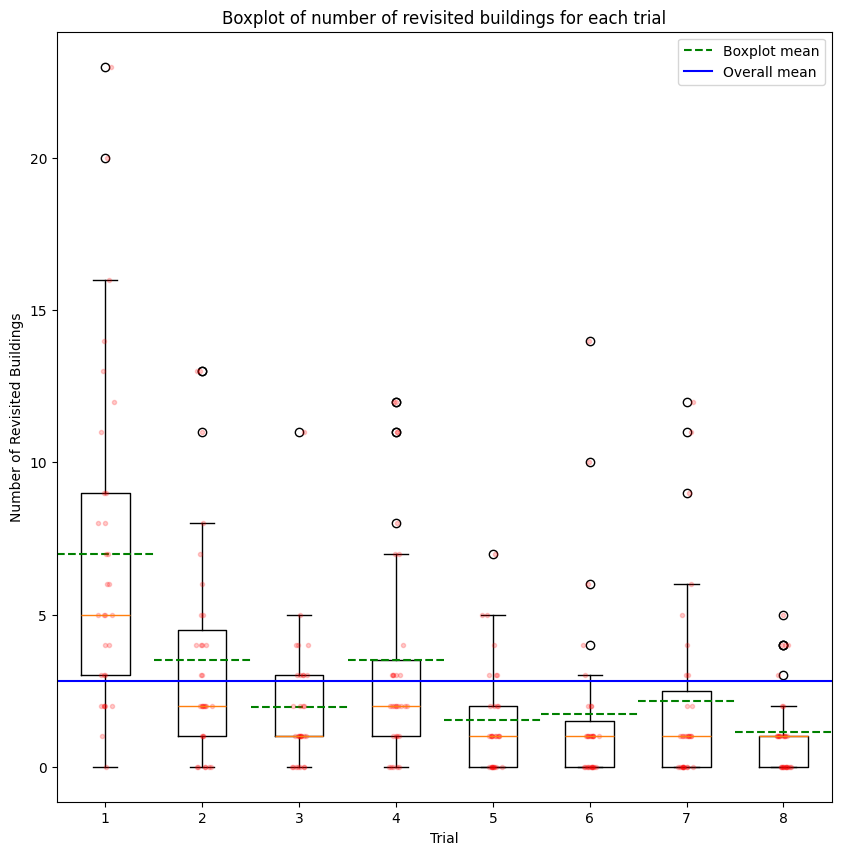

In [ ]:
numrevisited_boxplot()

In [ ]:
def numrevisited_boxplot_by_spatial_group_trials():
    # Load the spatial group classification
    spatial_group_df = pd.read_csv('/content/drive/MyDrive/trajectory_analysis/OnlineNavigation/sub_sum.csv')

    # Initialize lists for storing revisited numbers by spatial group
    high_spatial_visited = [[] for _ in range(8)]
    low_spatial_visited = [[] for _ in range(8)]

    # List all files in the directory
    files = [f for f in listdir('OnlineNavigation/ExplorationEfficiency') if isfile(join('OnlineNavigation/ExplorationEfficiency', f))]

    # Process each file
    for file in files:
        participant_id = file.replace("participant_", "").replace(".csv", "")

        # Check if participant_id is in spatial_group_df
        if not spatial_group_df['ID'].str.contains(participant_id).any():
            continue

        # Get revisited data for each trial
        trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = trials_numrevisited(f'OnlineNavigation/ExplorationEfficiency/{file}')

        # Find spatial group for the current participant
        spatial_group = spatial_group_df.loc[spatial_group_df['ID'] == participant_id, 'Spatial Group'].values[0]

        # Append revisited data to the corresponding list based on spatial group
        if spatial_group == 'High Spatial':
            high_spatial_visited[0].append(trial1)
            high_spatial_visited[1].append(trial2)
            high_spatial_visited[2].append(trial3)
            high_spatial_visited[3].append(trial4)
            high_spatial_visited[4].append(trial5)
            high_spatial_visited[5].append(trial6)
            high_spatial_visited[6].append(trial7)
            high_spatial_visited[7].append(trial8)
        else:
            low_spatial_visited[0].append(trial1)
            low_spatial_visited[1].append(trial2)
            low_spatial_visited[2].append(trial3)
            low_spatial_visited[3].append(trial4)
            low_spatial_visited[4].append(trial5)
            low_spatial_visited[5].append(trial6)
            low_spatial_visited[6].append(trial7)
            low_spatial_visited[7].append(trial8)

    # Plot the boxplot for High Spatial Group
    plt.figure(figsize=(15, 7))
    plt.subplot(1, 2, 1)
    plt.boxplot(high_spatial_visited, labels=[f'Trial {i+1}' for i in range(8)])
    plt.xlabel('Trial')
    plt.ylabel('Number of Revisited Buildings')
    plt.title('High Spatial Group: Number of Revisited Buildings')

    # Add jittered points for High Spatial Group
    for i in range(8):
        x_jittered = np.random.normal(i + 1, 0.04, size=len(high_spatial_visited[i]))
        plt.scatter(x_jittered, high_spatial_visited[i], color='blue', alpha=0.6)

    # Plot the boxplot for Low Spatial Group
    plt.subplot(1, 2, 2)
    plt.boxplot(low_spatial_visited, labels=[f'Trial {i+1}' for i in range(8)])
    plt.xlabel('Trial')
    plt.ylabel('Number of Revisited Buildings')
    plt.title('Low Spatial Group: Number of Revisited Buildings')

    # Add jittered points for Low Spatial Group
    for i in range(8):
        x_jittered = np.random.normal(i + 1, 0.04, size=len(low_spatial_visited[i]))
        plt.scatter(x_jittered, low_spatial_visited[i], color='red', alpha=0.6)

    plt.tight_layout()
    plt.show()

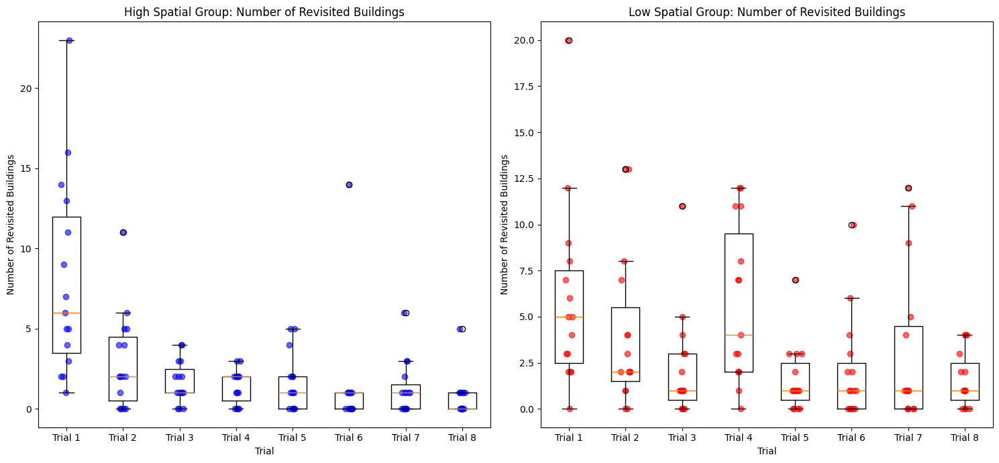

In [ ]:
numrevisited_boxplot_by_spatial_group_trials()

In [ ]:
def numrevisited_boxplot_by_spatial_group_mean_early():
    # Load the spatial group classification
    spatial_group_df = pd.read_csv('/content/drive/MyDrive/trajectory_analysis/OnlineNavigation/sub_sum.csv')

    # Initialize lists for storing mean revisited numbers by spatial group
    high_spatial_means = []
    low_spatial_means = []

    # List all files in the directory
    files = [f for f in listdir('OnlineNavigation/ExplorationEfficiency') if isfile(join('OnlineNavigation/ExplorationEfficiency', f))]

    # Process each file
    for file in files:
        participant_id = file.replace("participant_", "").replace(".csv", "")

        # Check if participant_id is in spatial_group_df
        if not spatial_group_df['ID'].str.contains(participant_id).any():
            continue

        # Get revisited data for each trial
        trial1, trial2, trial3, trial4, trial5, _, _, _ = trials_numrevisited(f'OnlineNavigation/ExplorationEfficiency/{file}')

        # Calculate mean number of revisited buildings across all trials
        mean_revisited = np.mean([trial1, trial2, trial3, trial4, trial5])

        # Find spatial group for the current participant
        spatial_group = spatial_group_df.loc[spatial_group_df['ID'] == participant_id, 'Spatial Group'].values[0]

        # Append mean revisited number to the corresponding list based on spatial group
        if spatial_group == 'High Spatial':
            high_spatial_means.append(mean_revisited)
        else:
            low_spatial_means.append(mean_revisited)

    # Plot the boxplot for mean revisited buildings by spatial group
    plt.figure(figsize=(10, 10))
    plt.boxplot([high_spatial_means, low_spatial_means], labels=['High Spatial', 'Low Spatial'])
    plt.xlabel('Spatial Group')
    plt.ylabel('Mean Number of Revisited Buildings')
    plt.title('Mean Number of Revisited Buildings in the first 5 trials by Spatial Group')

    # Add jittered points to the boxplot
    x_high = np.random.normal(1, 0.04, size=len(high_spatial_means))
    x_low = np.random.normal(2, 0.04, size=len(low_spatial_means))

    plt.scatter(x_high, high_spatial_means, color='blue', alpha=0.6, label='High Spatial')
    plt.scatter(x_low, low_spatial_means, color='red', alpha=0.6, label='Low Spatial')

    plt.legend()
    plt.show()

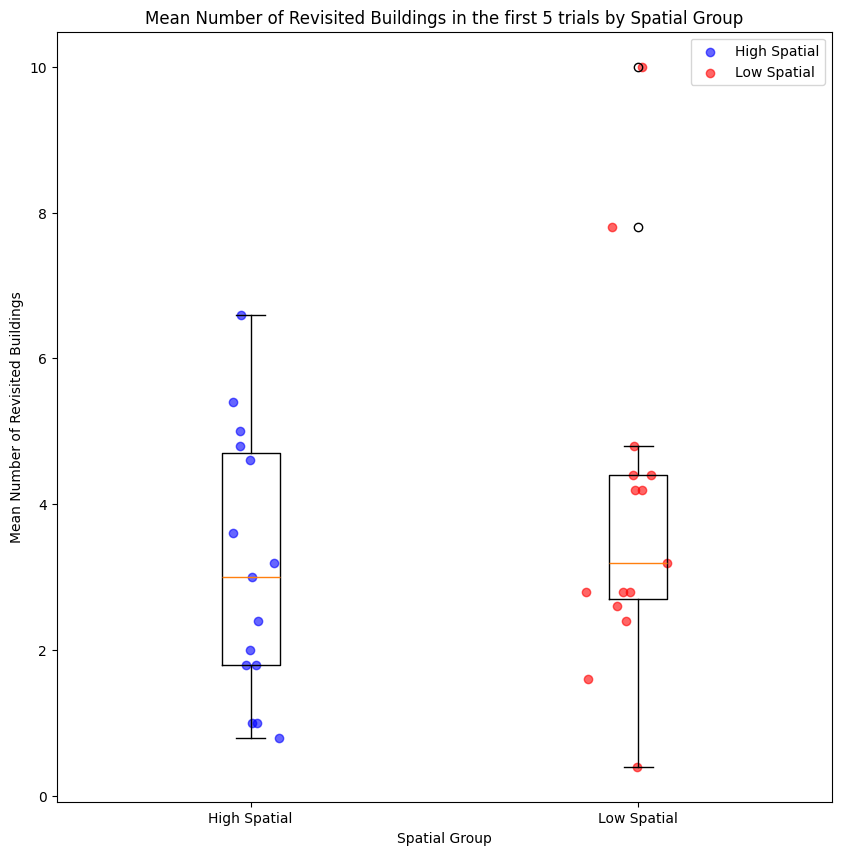

In [ ]:
numrevisited_boxplot_by_spatial_group_mean_early()

In [ ]:
def numrevisited_boxplot_by_spatial_group_mean_later():
    # Load the spatial group classification
    spatial_group_df = pd.read_csv('/content/drive/MyDrive/trajectory_analysis/OnlineNavigation/sub_sum.csv')

    # Initialize lists for storing mean revisited numbers by spatial group
    high_spatial_means = []
    low_spatial_means = []

    # List all files in the directory
    files = [f for f in listdir('OnlineNavigation/ExplorationEfficiency') if isfile(join('OnlineNavigation/ExplorationEfficiency', f))]

    # Process each file
    for file in files:
        participant_id = file.replace("participant_", "").replace(".csv", "")

        # Check if participant_id is in spatial_group_df
        if not spatial_group_df['ID'].str.contains(participant_id).any():
            continue

        # Get revisited data for each trial
        _, _, _, _, _, trial6, trial7, trial8 = trials_numrevisited(f'OnlineNavigation/ExplorationEfficiency/{file}')

        # Calculate mean number of revisited buildings across all trials
        mean_revisited = np.mean([trial6, trial7, trial8])

        # Find spatial group for the current participant
        spatial_group = spatial_group_df.loc[spatial_group_df['ID'] == participant_id, 'Spatial Group'].values[0]

        # Append mean revisited number to the corresponding list based on spatial group
        if spatial_group == 'High Spatial':
            high_spatial_means.append(mean_revisited)
        else:
            low_spatial_means.append(mean_revisited)

    # Plot the boxplot for mean revisited buildings by spatial group
    plt.figure(figsize=(10, 10))
    plt.boxplot([high_spatial_means, low_spatial_means], labels=['High Spatial', 'Low Spatial'])
    plt.xlabel('Spatial Group')
    plt.ylabel('Mean Number of Revisited Buildings')
    plt.title('Mean Number of Revisited Buildings in the last 3 trials by Spatial Group')

    # Add jittered points to the boxplot
    x_high = np.random.normal(1, 0.04, size=len(high_spatial_means))
    x_low = np.random.normal(2, 0.04, size=len(low_spatial_means))

    plt.scatter(x_high, high_spatial_means, color='blue', alpha=0.6, label='High Spatial')
    plt.scatter(x_low, low_spatial_means, color='red', alpha=0.6, label='Low Spatial')

    plt.legend()
    plt.show()

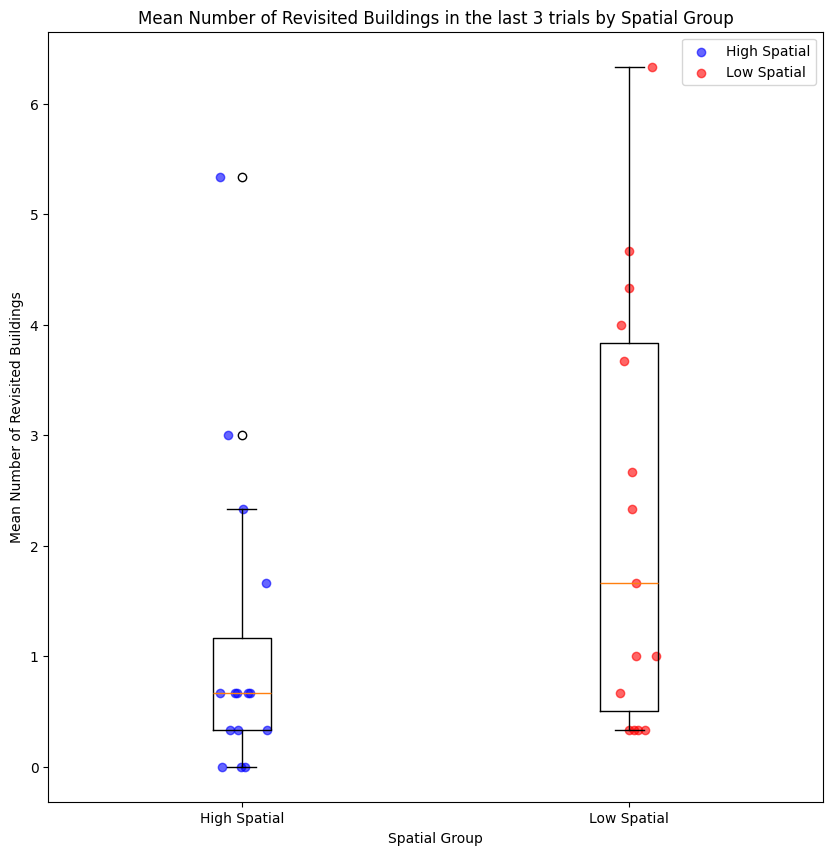

In [ ]:
numrevisited_boxplot_by_spatial_group_mean_later()

In [ ]:
#plots the number of buildings revisited building vs exploration efficiency
def efficiency_plot():

    # Load the CSV file
    file_path = '/content/drive/MyDrive/trajectory_analysis/OnlineNavigation/explorationefficiency.csv'  # Update this with the correct path to your file
    data = pd.read_csv(file_path)

    # Create a colormap with distinct colors for each trial
    cmap = plt.get_cmap('tab10')  # 'tab10' provides 10 distinct colors, suitable for your 8 trials
    colors = cmap(np.linspace(0, 1, 8))

    # Plot each trial separately
    plt.figure(figsize=(10, 10))
    for i, trial_num in enumerate(data['trial_num'].unique()):
        trial_data = data[data['trial_num'] == trial_num]
        plt.scatter(trial_data['num_buildings_revisited'], trial_data['ee_shortest'],
                    color=colors[i], label=f'Trial {trial_num}', alpha=0.5)

    plt.xlabel('Number of Buildings Revisited')
    plt.ylabel('Exploration Efficiency (Shortest)')
    plt.title('Number of Revisits vs Exploration Efficiency')
    plt.legend(title='Trial Number')
    plt.grid(True)
    plt.show()


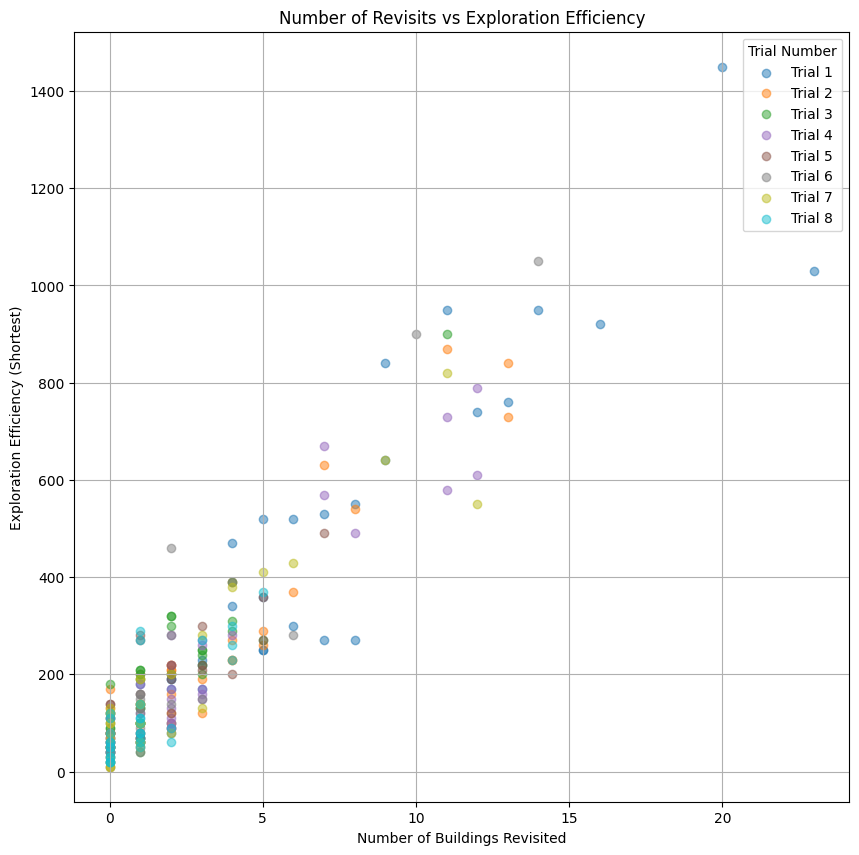

In [ ]:
efficiency_plot()

In [ ]:
#plots the number of buildings revisited building vs exploration efficiency
def frechet_revisited_plot():

    # Load the CSV file
    file_path = '/content/drive/MyDrive/trajectory_analysis/OnlineNavigation/explorationefficiency.csv'  # Update this with the correct path to your file
    data = pd.read_csv(file_path)

    # Create a colormap with distinct colors for each trial
    cmap = plt.get_cmap('tab10')  # 'tab10' provides 10 distinct colors, suitable for your 8 trials
    colors = cmap(np.linspace(0, 1, 8))

    # Plot each trial separately
    plt.figure(figsize=(10, 10))
    for i, trial_num in enumerate(data['trial_num'].unique()):
        trial_data = data[data['trial_num'] == trial_num]
        plt.scatter(trial_data['num_buildings_revisited'], trial_data['frechet_last'],
                    color=colors[i], label=f'Trial {trial_num}', alpha=0.5)

    plt.xlabel('Number of Buildings Revisited')
    plt.ylabel('Frechet Distance with Last Trial')
    plt.title('Number of Buildings Revisited vs Frechet Distance')
    plt.legend(title='Trial Number')
    plt.grid(True)
    plt.show()


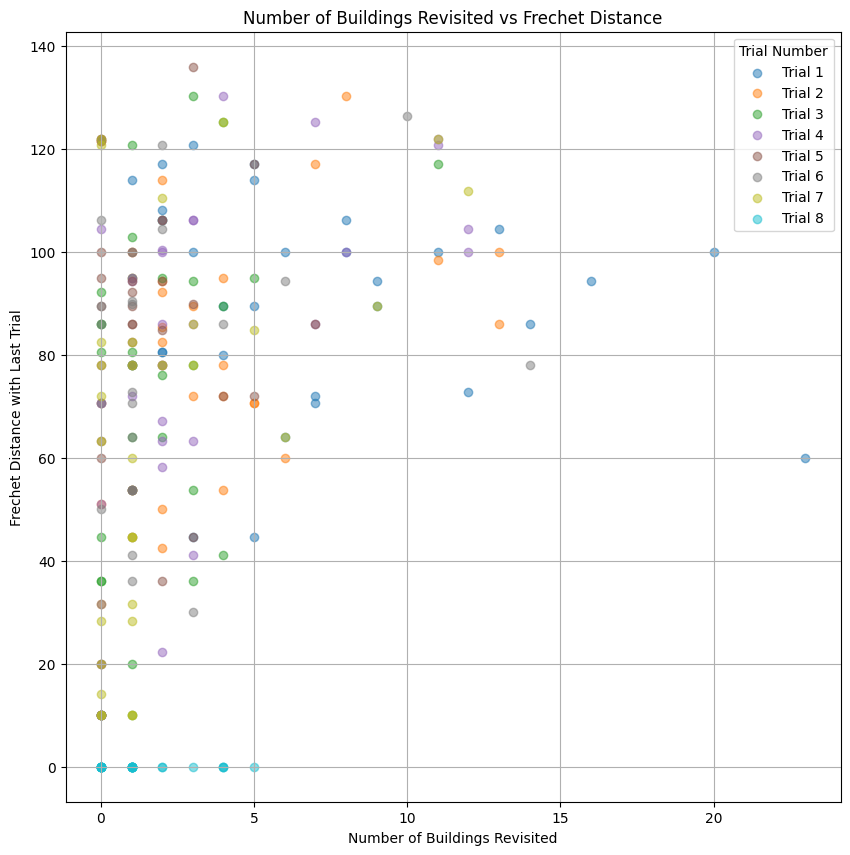

In [ ]:
frechet_revisited_plot()

In [ ]:
#boxplot for frechet distance with last trial
def frechet_boxplot():
    files = [f for f in listdir('OnlineNavigation/Navigation') if isfile(join('OnlineNavigation/Navigation', f))]
    frechet1, frechet2, frechet3, frechet4, frechet5, frechet6, frechet7 = [], [], [], [], [], [], []
    x = [1, 2, 3, 4, 5, 6, 7]

    for file in files:
        trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = trials(f'OnlineNavigation/Navigation/{file}')

        discrete1, discrete2, discrete3, discrete4, discrete5, discrete6, discrete7, discrete8 = convert_to_discrete(trial1), convert_to_discrete(trial2), convert_to_discrete(trial3), convert_to_discrete(trial4), convert_to_discrete(trial5), convert_to_discrete(trial6), convert_to_discrete(trial7), convert_to_discrete(trial8)

        frechet1.append(frechet(discrete1, discrete8))
        frechet2.append(frechet(discrete2, discrete8))
        frechet3.append(frechet(discrete3, discrete8))
        frechet4.append(frechet(discrete4, discrete8))
        frechet5.append(frechet(discrete5, discrete8))
        frechet6.append(frechet(discrete6, discrete8))
        frechet7.append(frechet(discrete7, discrete8))

    plt.figure(figsize=(10, 10))
    plt.xlabel('Trial')
    plt.ylabel('Number of Revisited Buildings')
    plt.title('Frechet Distance with Last Trial')
    plt.boxplot([frechet1, frechet2, frechet3, frechet4, frechet5, frechet6, frechet7])

     # Calculate the mean of each boxplot
    boxplot_means = [np.mean(visited) for visited in [frechet1, frechet2, frechet3, frechet4, frechet5, frechet6, frechet7]]

    # Add horizon line for each boxplot mean
    for i, mean in enumerate(boxplot_means, start=1):
        plt.hlines(mean, i-0.5, i+0.5, colors='green', linestyles='dashed', label='Boxplot mean' if i == 1 else '')


    x = np.random.normal(1, 0.04, size=len(frechet1))
    plt.plot(x, frechet1, 'r.', alpha=0.2)

    x = np.random.normal(2, 0.04, size=len(frechet2))
    plt.plot(x, frechet2, 'r.', alpha=0.2)

    x = np.random.normal(3, 0.04, size=len(frechet3))
    plt.plot(x, frechet3, 'r.', alpha=0.2)

    x = np.random.normal(4, 0.04, size=len(frechet4))
    plt.plot(x, frechet4, 'r.', alpha=0.2)

    x = np.random.normal(5, 0.04, size=len(frechet5))
    plt.plot(x, frechet5, 'r.', alpha=0.2)

    x = np.random.normal(6, 0.04, size=len(frechet6))
    plt.plot(x, frechet6, 'r.', alpha=0.2)

    x = np.random.normal(7, 0.04, size=len(frechet7))
    plt.plot(x, frechet7, 'r.', alpha=0.2)

    means = [np.mean(frechet1), np.mean(frechet2), np.mean(frechet3), np.mean(frechet4), np.mean(frechet5), np.mean(frechet6), np.mean(frechet7)]
    print(means)
    plt.axhline(y=np.mean(means), color='b', linestyle='-', label="Overall mean")

    plt.legend()
    plt.show()

[88.1130649725951, 80.26417612370156, 76.35624155995389, 83.77057092484014, 81.15034065513132, 66.94316311757146, 64.71150238677345]


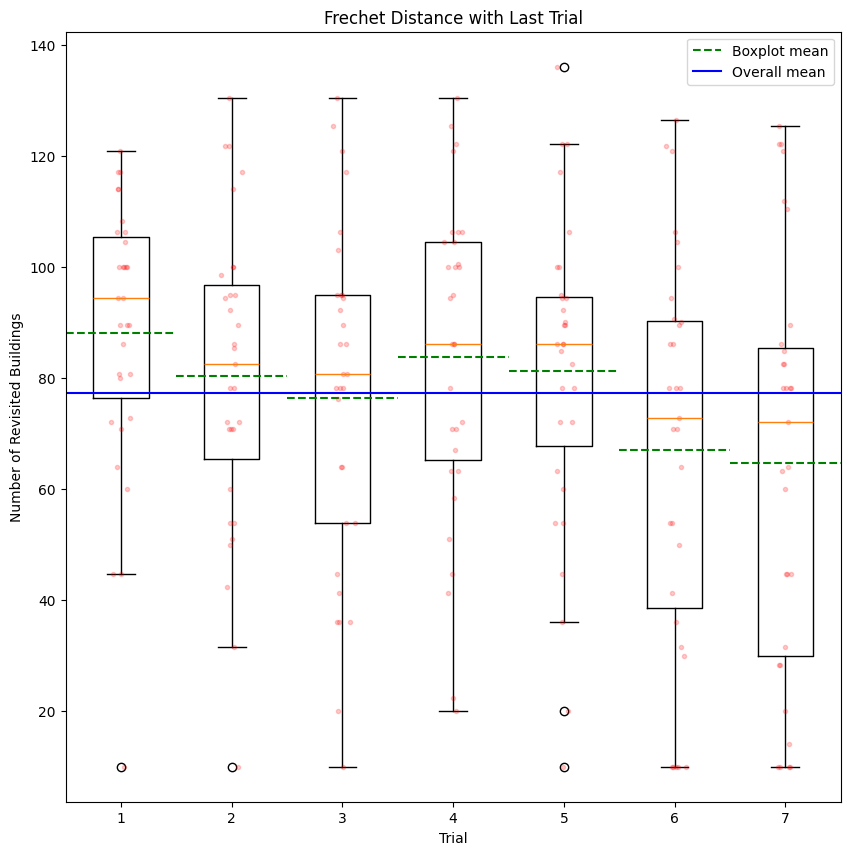

In [ ]:
frechet_boxplot()

In [ ]:
def ee_view_boxplot():
    # Load the CSV file into a DataFrame
    file_path = '/content/drive/MyDrive/trajectory_analysis/OnlineNavigation/explorationefficiency.csv'  # Replace with your CSV file path
    df = pd.read_csv(file_path)

    # Create a boxplot of 'ee_view' for each 'trial_num'
    plt.figure(figsize=(10, 10))
    df.boxplot(column='ee_view', by='trial_num', grid=False)

    # Set the plot title and labels
    plt.title('Boxplot of ee_view for Each Trial')
    plt.suptitle('')  # Remove the default suptitle to clean up the plot
    plt.xlabel('Trial Number')
    plt.ylabel('ee_view')

    # Show the plot
    plt.show()

<Figure size 1000x1000 with 0 Axes>

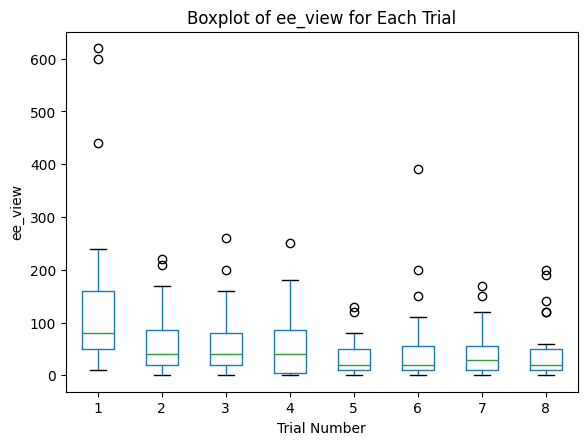

In [ ]:
ee_view_boxplot()

In [ ]:
def ee_view_line():
    # Load the CSV files into DataFrames
    file_path = '/content/drive/MyDrive/trajectory_analysis/OnlineNavigation/explorationefficiency.csv'
    df = pd.read_csv(file_path)
    spatial_group_df = pd.read_csv('/content/drive/MyDrive/trajectory_analysis/OnlineNavigation/sub_sum.csv')

    # Merge the dataframes on 'ID' to include spatial group information
    df = pd.merge(df, spatial_group_df[['ID', 'Spatial Group']], left_on='participant_id', right_on='ID', how='left')

    # Sort the DataFrame by participant_id and trial_num to ensure correct plotting order
    df.sort_values(by=['participant_id', 'trial_num'], inplace=True)

    # Create a dictionary to map spatial groups to colors
    color_map = {'High Spatial': 'blue', 'Low Spatial': 'red'}

    # Plot a line chart for each participant's progression of ee_view by trial_num
    plt.figure(figsize=(10, 10))

    # Loop through each participant and plot their ee_view progression
    for participant_id, group in df.groupby('participant_id'):
        spatial_group = group['Spatial Group'].iloc[0]

        if pd.isna(spatial_group):
            # Skip participants with missing spatial group
            continue

        color = color_map.get(spatial_group, 'grey')  # Default to 'grey' if group not found in color_map

        plt.plot(group['trial_num'], group['ee_view'], marker='o', color=color, label=f'Participant {participant_id} ({spatial_group})')

    # Set the plot title and labels
    plt.title('Progression of ee_view for Each Participant by Trial Number')
    plt.xlabel('Trial Number')
    plt.ylabel('ee_view')

    # Create a legend for spatial groups
    handles = [plt.Line2D([0], [0], color=color_map[sg], lw=2, label=sg) for sg in color_map]
    plt.legend(handles=handles, title='Spatial Group')

    # Show the plot
    plt.tight_layout()
    plt.show()

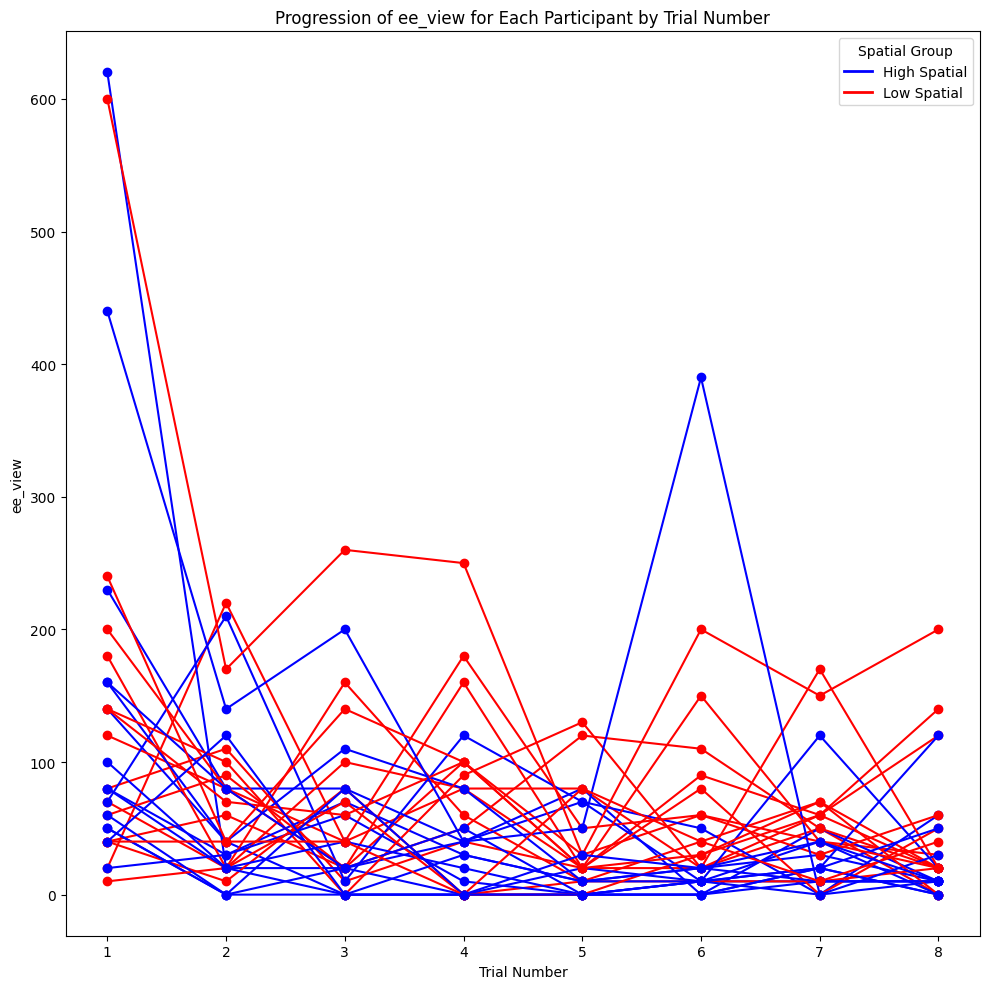

In [ ]:
ee_view_line()

# **Entropy**

In [ ]:
from collections import Counter

#Calculate entropy given list of probabilities
def calculate_entropy(probabilities):
    return -sum(p * math.log2(p) for p in probabilities if p > 0)

#Returns nearest grid cell for a point
def map_to_grid(x, y, grid_size, x_bounds, y_bounds):
    x_index = int((x - x_bounds[0]) // grid_size)
    y_index = int((y - y_bounds[0]) // grid_size)
    return (x_index, y_index)

#Returns entropy of a trajectory
def entropy(trial):
    # Hard-coded grid size and environment bounds
    grid_size = 10
    x_bounds = (-70, 70)
    y_bounds = (-70, 70)

    # Map each (x, y) position to a grid cell
    grid_cells = [map_to_grid(x, y, grid_size, x_bounds, y_bounds) for x, y in trial]

    # Count the visits to each grid cell
    cell_counts = Counter(grid_cells)
    total_visits = sum(cell_counts.values())

    # Calculate the probability for each grid cell
    probabilities = [count / total_visits for count in cell_counts.values()]

    # Calculate entropy for the trial
    return calculate_entropy(probabilities)

In [ ]:
#boxplot for frechet distance with last trial
def entropy_boxplot():
    files = [f for f in listdir('OnlineNavigation/Navigation') if isfile(join('OnlineNavigation/Navigation', f))]
    entropy1, entropy2, entropy3, entropy4, entropy5, entropy6, entropy7, entropy8 = [], [], [], [], [], [], [], []
    x = [1, 2, 3, 4, 5, 6, 7, 8]

    for file in files:
        trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = trials(f'OnlineNavigation/Navigation/{file}')

        discrete1, discrete2, discrete3, discrete4, discrete5, discrete6, discrete7, discrete8 = convert_to_discrete(trial1), convert_to_discrete(trial2), convert_to_discrete(trial3), convert_to_discrete(trial4), convert_to_discrete(trial5), convert_to_discrete(trial6), convert_to_discrete(trial7), convert_to_discrete(trial8)

        entropy1.append(entropy(discrete1))
        entropy2.append(entropy(discrete2))
        entropy3.append(entropy(discrete3))
        entropy4.append(entropy(discrete4))
        entropy5.append(entropy(discrete5))
        entropy6.append(entropy(discrete6))
        entropy7.append(entropy(discrete7))
        entropy8.append(entropy(discrete8))

    plt.figure(figsize=(10, 10))
    plt.xlabel('Trial Num')
    plt.ylabel('Entropy')
    plt.title('Entropy for each trial')
    plt.boxplot([entropy1, entropy2, entropy3, entropy4, entropy5, entropy6, entropy7, entropy8])

     # Calculate the mean of each boxplot
    boxplot_means = [np.mean(visited) for visited in [entropy1, entropy2, entropy3, entropy4, entropy5, entropy6, entropy7, entropy8]]

    # Add horizon line for each boxplot mean
    for i, mean in enumerate(boxplot_means, start=1):
        plt.hlines(mean, i-0.5, i+0.5, colors='green', linestyles='dashed', label='Boxplot mean' if i == 1 else '')


    x = np.random.normal(1, 0.04, size=len(entropy1))
    plt.plot(x, entropy1, 'r.', alpha=0.2)

    x = np.random.normal(2, 0.04, size=len(entropy2))
    plt.plot(x, entropy2, 'r.', alpha=0.2)

    x = np.random.normal(3, 0.04, size=len(entropy3))
    plt.plot(x, entropy3, 'r.', alpha=0.2)

    x = np.random.normal(4, 0.04, size=len(entropy4))
    plt.plot(x, entropy4, 'r.', alpha=0.2)

    x = np.random.normal(5, 0.04, size=len(entropy5))
    plt.plot(x, entropy5, 'r.', alpha=0.2)

    x = np.random.normal(6, 0.04, size=len(entropy6))
    plt.plot(x, entropy6, 'r.', alpha=0.2)

    x = np.random.normal(7, 0.04, size=len(entropy7))
    plt.plot(x, entropy7, 'r.', alpha=0.2)

    x = np.random.normal(8, 0.04, size=len(entropy8))
    plt.plot(x, entropy8, 'r.', alpha=0.2)

    means = [np.mean(entropy1), np.mean(entropy2), np.mean(entropy3), np.mean(entropy4), np.mean(entropy5), np.mean(entropy6), np.mean(entropy7), np.mean(entropy8)]
    print(means)
    plt.axhline(y=np.mean(means), color='b', linestyle='-', label="Overall mean")

    plt.legend()
    plt.show()

[6.029426919822272, 6.038431289048714, 6.04130616149308, 6.018786279648645, 5.887348922804216, 5.996982119477696, 5.953918664996058, 5.930082118878256]


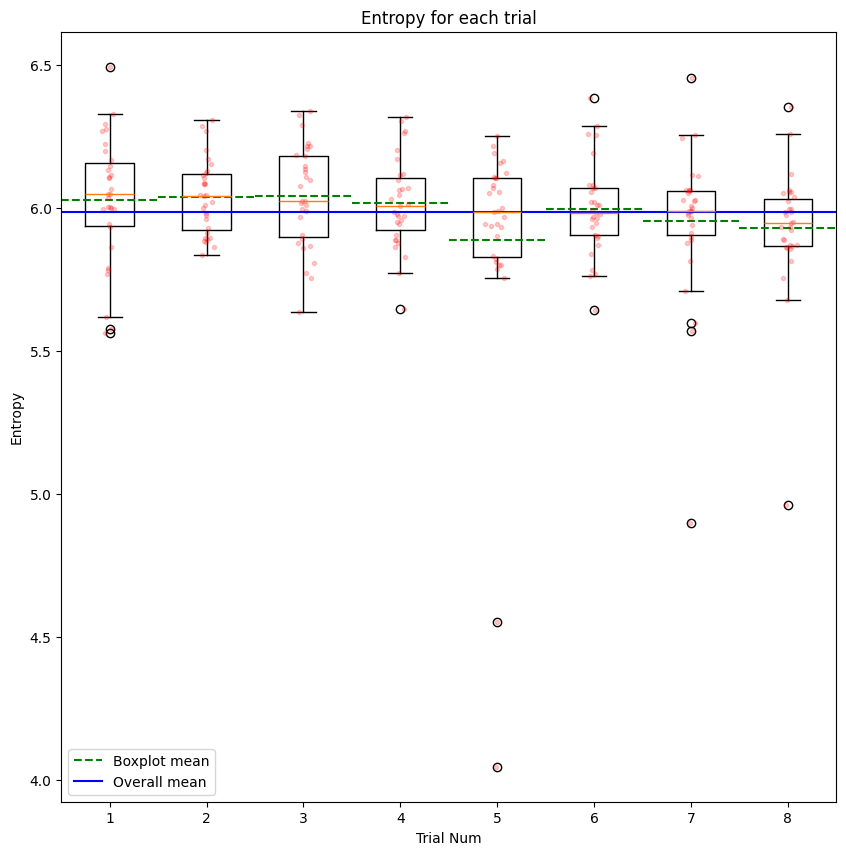

In [ ]:
entropy_boxplot()

In [ ]:
def entropy_lineplot():
    # Load the spatial group classification
    spatial_group_df = pd.read_csv('/content/drive/MyDrive/trajectory_analysis/OnlineNavigation/sub_sum.csv')

    files = [f for f in listdir('OnlineNavigation/Navigation') if isfile(join('OnlineNavigation/Navigation', f))]
    trial_nums = [1, 2, 3, 4, 5, 6, 7, 8]  # x-axis: trial numbers

    # Create a dictionary to map spatial groups to colors
    color_map = {'High Spatial': 'blue', 'Low Spatial': 'red'}

    # Plotting setup
    plt.figure(figsize=(10, 10))

    # Read data and calculate entropy for each participant
    for file in files:
        participant_id = file.replace("participant_", "").replace(".csv", "")

        # Check if participant_id is in spatial_group_df
        if not spatial_group_df['ID'].str.contains(participant_id).any():
            continue

        # Get trials data
        trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = trials(f'OnlineNavigation/Navigation/{file}')

        # Convert trials to discrete format
        discrete1, discrete2, discrete3, discrete4, discrete5, discrete6, discrete7, discrete8 = (
            convert_to_discrete(trial1), convert_to_discrete(trial2), convert_to_discrete(trial3),
            convert_to_discrete(trial4), convert_to_discrete(trial5), convert_to_discrete(trial6),
            convert_to_discrete(trial7), convert_to_discrete(trial8)
        )

        # Collect entropy values for this participant across trials
        entropies = [
            entropy(discrete1), entropy(discrete2), entropy(discrete3), entropy(discrete4),
            entropy(discrete5), entropy(discrete6), entropy(discrete7), entropy(discrete8)
        ]

        # Find spatial group for the current participant using 'ID' column
        spatial_group = spatial_group_df.loc[spatial_group_df['ID'] == participant_id, 'Spatial Group'].values[0]
        color = color_map[spatial_group]

        # Plot each participant's entropy values
        plt.plot(trial_nums, entropies, marker='o', color=color, label=f'Participant {participant_id} ({spatial_group})')

    # Customize plot
    plt.xlabel('Trial Number')
    plt.ylabel('Entropy')
    plt.title('Entropy Progression for Each Participant')
    plt.grid(True)

    # Create a legend for spatial groups
    handles = [plt.Line2D([0], [0], color=color_map[sg], lw=2, label=sg) for sg in color_map]
    plt.legend(handles=handles, title='Spatial Group')

    plt.tight_layout()  # Adjust layout
    plt.show()

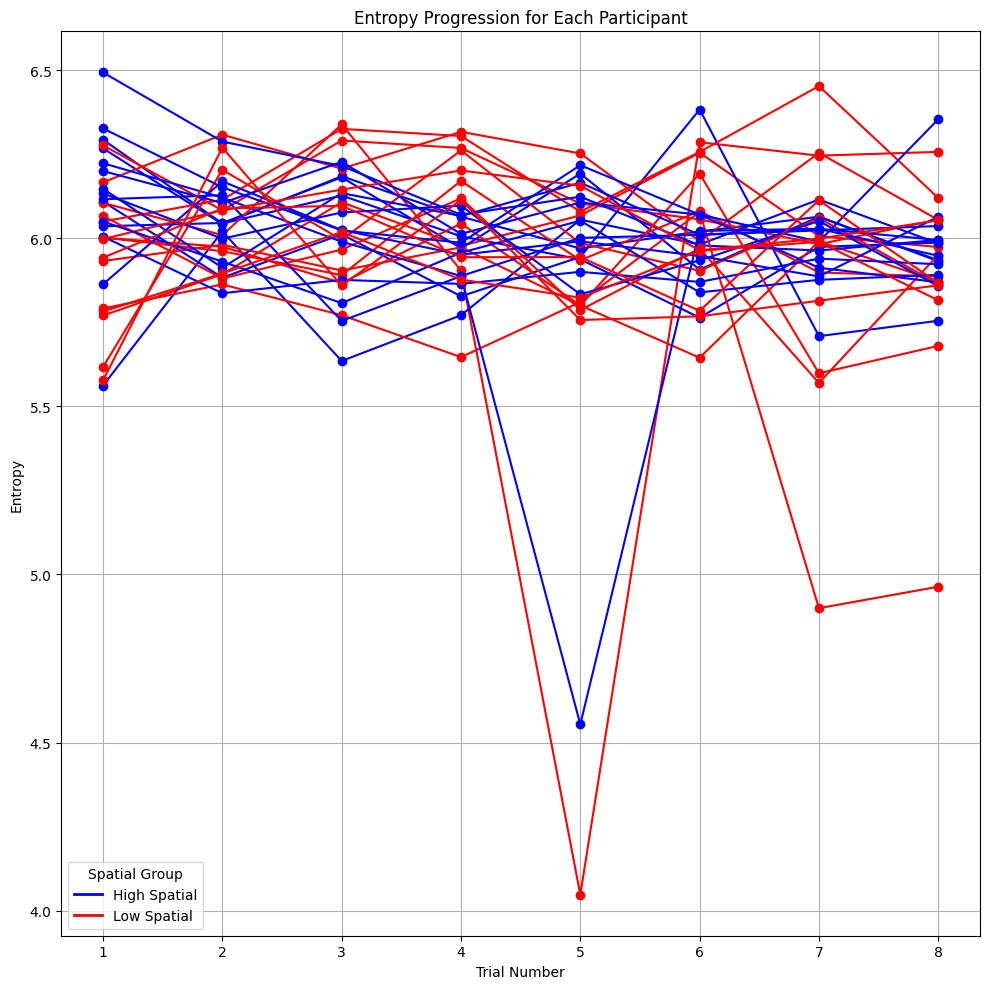

In [ ]:
entropy_lineplot()

In [ ]:
def entropy_boxplot_by_spatial_group_early():
    # Load the spatial group classification
    spatial_group_df = pd.read_csv('/content/drive/MyDrive/trajectory_analysis/OnlineNavigation/sub_sum.csv')

    # Initialize lists for storing mean entropies
    high_spatial_entropy = []
    low_spatial_entropy = []

    # List all files in the directory
    files = [f for f in listdir('OnlineNavigation/Navigation') if isfile(join('OnlineNavigation/Navigation', f))]

    # Process each file
    for file in files:
        participant_id = file.replace("participant_", "").replace(".csv", "")

        # Check if participant_id is in spatial_group_df
        if not spatial_group_df['ID'].str.contains(participant_id).any():
            continue

        # Get trials data
        trial1, trial2, trial3, trial4, trial5, _, _, _ = trials(f'OnlineNavigation/Navigation/{file}')

        # Convert trials to discrete format
        discrete1, discrete2, discrete3, discrete4, discrete5 = (
            convert_to_discrete(trial1), convert_to_discrete(trial2), convert_to_discrete(trial3),
            convert_to_discrete(trial4), convert_to_discrete(trial5)
        )

        # Calculate entropies
        entropies = [entropy(discrete1), entropy(discrete2), entropy(discrete3), entropy(discrete4), entropy(discrete5)]

        # Calculate mean entropy of the first 5 trials
        mean_entropy = np.mean(entropies)

        # Find spatial group for the current participant
        spatial_group = spatial_group_df.loc[spatial_group_df['ID'] == participant_id, 'Spatial Group'].values[0]

        # Append mean entropy to corresponding list
        if spatial_group == 'High Spatial':
            high_spatial_entropy.append(mean_entropy)
        else:
            low_spatial_entropy.append(mean_entropy)

    # Plot the boxplot
    plt.figure(figsize=(10, 10))
    plt.boxplot([high_spatial_entropy, low_spatial_entropy], labels=['High Spatial', 'Low Spatial'])
    plt.xlabel('Spatial Group')
    plt.ylabel('Mean Entropy')
    plt.title('Mean Entropy of First 5 Trials by Spatial Group')

    # Add jittered points to the boxplot
    x_high = np.random.normal(1, 0.025, size=len(high_spatial_entropy))
    x_low = np.random.normal(2, 0.025, size=len(low_spatial_entropy))

    plt.scatter(x_high, high_spatial_entropy, color='blue', alpha=0.6, label='High Spatial Data Points')
    plt.scatter(x_low, low_spatial_entropy, color='red', alpha=0.6, label='Low Spatial Data Points')

    plt.legend()
    plt.show()

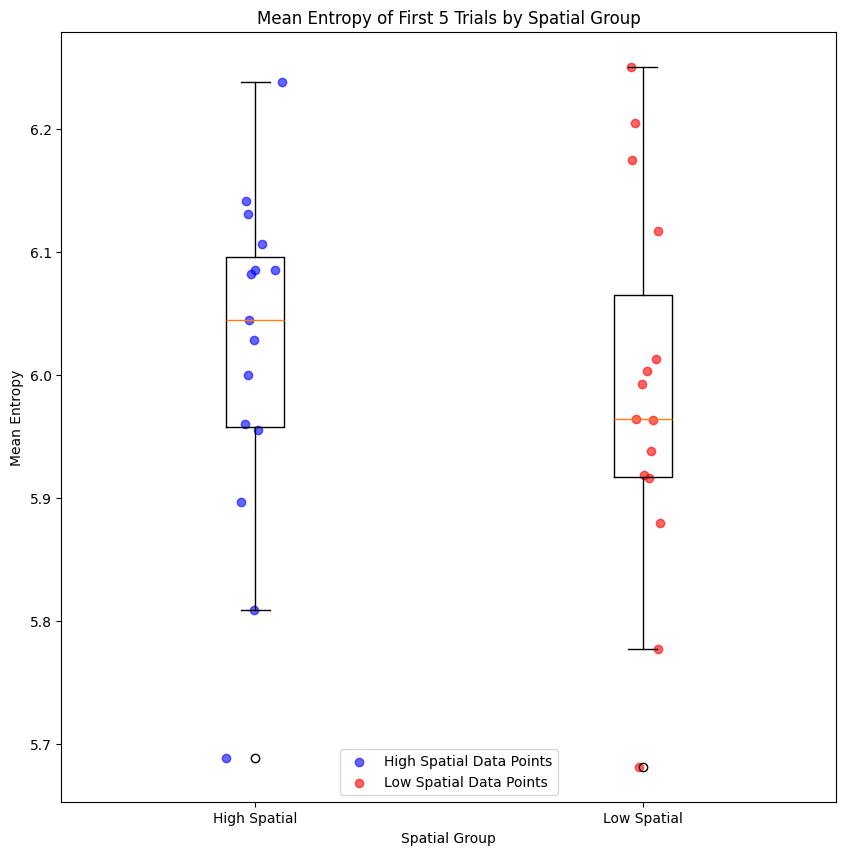

In [ ]:
entropy_boxplot_by_spatial_group_early()

In [ ]:
# Function to plot entropy boxplot by spatial group
def entropy_boxplot_by_spatial_group_later():
    # Load the spatial group classification
    spatial_group_df = pd.read_csv('/content/drive/MyDrive/trajectory_analysis/OnlineNavigation/sub_sum.csv')

    # Initialize lists for storing mean entropies
    high_spatial_entropy = []
    low_spatial_entropy = []

    # List all files in the directory
    files = [f for f in listdir('OnlineNavigation/Navigation') if isfile(join('OnlineNavigation/Navigation', f))]

    # Process each file
    for file in files:
        participant_id = file.replace("participant_", "").replace(".csv", "")

        # Check if participant_id is in spatial_group_df
        if not spatial_group_df['ID'].str.contains(participant_id).any():
            continue

        # Get trials data
        _, _, _, _, _, trial6, trial7, trial8 = trials(f'OnlineNavigation/Navigation/{file}')

        # Convert trials to discrete format
        discrete6, discrete7, discrete8 = convert_to_discrete(trial6), convert_to_discrete(trial7), convert_to_discrete(trial8)

        # Calculate entropies
        entropies = [entropy(discrete6), entropy(discrete7), entropy(discrete8)]

        # Calculate mean entropy of the first 5 trials
        mean_entropy = np.mean(entropies)

        # Find spatial group for the current participant
        spatial_group = spatial_group_df.loc[spatial_group_df['ID'] == participant_id, 'Spatial Group'].values[0]

        # Append mean entropy to corresponding list
        if spatial_group == 'High Spatial':
            high_spatial_entropy.append(mean_entropy)
        else:
            low_spatial_entropy.append(mean_entropy)

    # Plot the boxplot
    plt.figure(figsize=(10, 10))
    plt.boxplot([high_spatial_entropy, low_spatial_entropy], labels=['High Spatial', 'Low Spatial'])
    plt.xlabel('Spatial Group')
    plt.ylabel('Mean Entropy')
    plt.title('Mean Entropy of Last 3 Trials by Spatial Group')

    # Add jittered points to the boxplot
    x_high = np.random.normal(1, 0.025, size=len(high_spatial_entropy))
    x_low = np.random.normal(2, 0.025, size=len(low_spatial_entropy))

    plt.scatter(x_high, high_spatial_entropy, color='blue', alpha=0.6, label='High Spatial Data Points')
    plt.scatter(x_low, low_spatial_entropy, color='red', alpha=0.6, label='Low Spatial Data Points')

    plt.legend()
    plt.show()

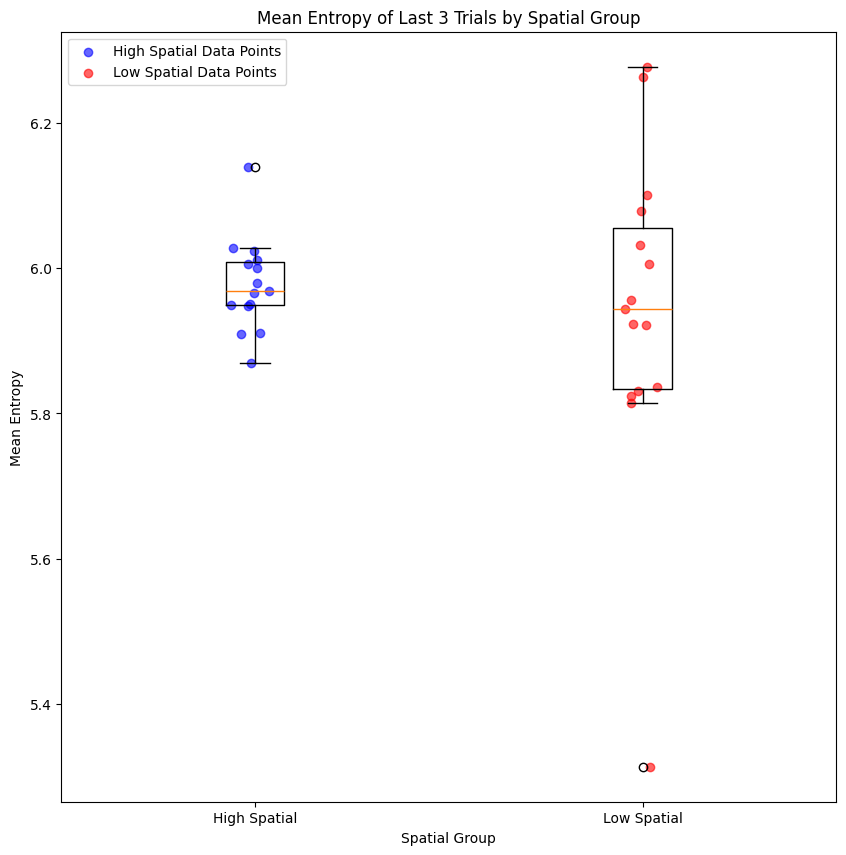

In [ ]:
entropy_boxplot_by_spatial_group_later()

# **Miscellaneous**

In [ ]:
coordinates_map = {1: (-55, -55), 2: (-55, 5), 3: (-55, 35), 4: (-55, 65), 5: (-35, -35), 6: (-35, 25), 7: (-5, -65),
                   8: (-15, 55), 9: (15, 55), 10: (-5, 15), 11: (-5, -15), 12: (15, 25), 13: (35, 25), 14: (55, 25),
                   15: (55, -15), 16: (25, -55), 17: (45, -55), 18: (65, -65), 19: (55, 55)}

solution1 = [coordinates_map[2], coordinates_map[3], coordinates_map[6], coordinates_map[10], coordinates_map[12], coordinates_map[11], coordinates_map[5], coordinates_map[1], coordinates_map[7],
             coordinates_map[16], coordinates_map[17], coordinates_map[18], coordinates_map[15], coordinates_map[14], coordinates_map[19], coordinates_map[13], coordinates_map[9], coordinates_map[9],
             coordinates_map[4]]

solution2 = [coordinates_map[2], coordinates_map[3], coordinates_map[4], coordinates_map[8], coordinates_map[9], coordinates_map[13], coordinates_map[19], coordinates_map[14], coordinates_map[15],
             coordinates_map[18], coordinates_map[17], coordinates_map[16], coordinates_map[7], coordinates_map[1], coordinates_map[5], coordinates_map[11], coordinates_map[12], coordinates_map[10],
             coordinates_map[6]]

solution3 = [coordinates_map[2], coordinates_map[3], coordinates_map[4], coordinates_map[8], coordinates_map[9], coordinates_map[13], coordinates_map[19], coordinates_map[14], coordinates_map[15],
             coordinates_map[18], coordinates_map[17], coordinates_map[16], coordinates_map[7], coordinates_map[1], coordinates_map[5], coordinates_map[11], coordinates_map[12], coordinates_map[6],
             coordinates_map[10]]

solution4 = [coordinates_map[2], coordinates_map[3], coordinates_map[4], coordinates_map[8], coordinates_map[9], coordinates_map[13], coordinates_map[12], coordinates_map[11], coordinates_map[10],
             coordinates_map[6], coordinates_map[5], coordinates_map[1], coordinates_map[7], coordinates_map[16], coordinates_map[17], coordinates_map[18], coordinates_map[15], coordinates_map[14],
             coordinates_map[19]]

solution5 = [coordinates_map[2], coordinates_map[3], coordinates_map[4], coordinates_map[8], coordinates_map[9], coordinates_map[13], coordinates_map[12], coordinates_map[6], coordinates_map[10],
             coordinates_map[11], coordinates_map[5], coordinates_map[1], coordinates_map[7], coordinates_map[16], coordinates_map[17], coordinates_map[18], coordinates_map[15], coordinates_map[14],
             coordinates_map[19]]

solution6 = [coordinates_map[2], coordinates_map[3], coordinates_map[4], coordinates_map[8], coordinates_map[9], coordinates_map[13], coordinates_map[10], coordinates_map[6], coordinates_map[12],
             coordinates_map[11], coordinates_map[5], coordinates_map[1], coordinates_map[7], coordinates_map[16], coordinates_map[17], coordinates_map[18], coordinates_map[15], coordinates_map[14],
             coordinates_map[19]]

solution7 = [coordinates_map[2], coordinates_map[3], coordinates_map[4], coordinates_map[8], coordinates_map[9], coordinates_map[13], coordinates_map[6], coordinates_map[10], coordinates_map[12],
             coordinates_map[11], coordinates_map[5], coordinates_map[1], coordinates_map[7], coordinates_map[16], coordinates_map[17], coordinates_map[18], coordinates_map[15], coordinates_map[14],
             coordinates_map[19]]

solution8 = [coordinates_map[2], coordinates_map[10], coordinates_map[6], coordinates_map[3], coordinates_map[4], coordinates_map[8], coordinates_map[9], coordinates_map[13], coordinates_map[12],
             coordinates_map[11], coordinates_map[5], coordinates_map[1], coordinates_map[7], coordinates_map[16], coordinates_map[17], coordinates_map[18], coordinates_map[15], coordinates_map[14],
             coordinates_map[19]]

solution9 = [coordinates_map[2], coordinates_map[6], coordinates_map[10], coordinates_map[3], coordinates_map[4], coordinates_map[8], coordinates_map[9], coordinates_map[13], coordinates_map[12],
             coordinates_map[11], coordinates_map[5], coordinates_map[1], coordinates_map[7], coordinates_map[16], coordinates_map[17], coordinates_map[18], coordinates_map[15], coordinates_map[14],
             coordinates_map[19]]

solution10 = [coordinates_map[2], coordinates_map[3], coordinates_map[10], coordinates_map[6], coordinates_map[4], coordinates_map[8], coordinates_map[9], coordinates_map[13], coordinates_map[12],
             coordinates_map[11], coordinates_map[5], coordinates_map[1], coordinates_map[7], coordinates_map[16], coordinates_map[17], coordinates_map[18], coordinates_map[15], coordinates_map[14],
             coordinates_map[19]]

solution11 = [coordinates_map[2], coordinates_map[3], coordinates_map[6], coordinates_map[10], coordinates_map[4], coordinates_map[8], coordinates_map[9], coordinates_map[13], coordinates_map[12],
             coordinates_map[11], coordinates_map[5], coordinates_map[1], coordinates_map[7], coordinates_map[16], coordinates_map[17], coordinates_map[18], coordinates_map[15], coordinates_map[14],
             coordinates_map[19]]

solution12 = [coordinates_map[2], coordinates_map[1], coordinates_map[5], coordinates_map[10], coordinates_map[6], coordinates_map[3], coordinates_map[4], coordinates_map[8], coordinates_map[9],
             coordinates_map[13], coordinates_map[12], coordinates_map[11], coordinates_map[7], coordinates_map[16], coordinates_map[17], coordinates_map[18], coordinates_map[15], coordinates_map[14],
             coordinates_map[19]]

solution13 = [coordinates_map[2], coordinates_map[3], coordinates_map[4], coordinates_map[8], coordinates_map[9], coordinates_map[13], coordinates_map[12], coordinates_map[10], coordinates_map[6],
             coordinates_map[5], coordinates_map[1], coordinates_map[7], coordinates_map[11], coordinates_map[16], coordinates_map[17], coordinates_map[18], coordinates_map[15], coordinates_map[14],
             coordinates_map[19]]

solution14 = [coordinates_map[2], coordinates_map[3], coordinates_map[4], coordinates_map[8], coordinates_map[9], coordinates_map[13], coordinates_map[12], coordinates_map[6], coordinates_map[10],
             coordinates_map[5], coordinates_map[1], coordinates_map[7], coordinates_map[11], coordinates_map[16], coordinates_map[17], coordinates_map[18], coordinates_map[15], coordinates_map[14],
             coordinates_map[19]]

solution15 = [coordinates_map[2], coordinates_map[1], coordinates_map[7], coordinates_map[5], coordinates_map[10], coordinates_map[6], coordinates_map[3], coordinates_map[4], coordinates_map[8],
             coordinates_map[9], coordinates_map[13], coordinates_map[12], coordinates_map[11], coordinates_map[16], coordinates_map[17], coordinates_map[18], coordinates_map[15], coordinates_map[14],
             coordinates_map[19]]

solutions = [solution1, solution2, solution3, solution4, solution5, solution6, solution7, solution8, solution9, solution10, solution11, solution12, solution13, solution14, solution15]

# **Similarity between human solutions**

In [ ]:
def most_similar_frechet(solutions):
    # Initialize a list to store Fréchet distances for each solution
    frechet_dists = [[] for _ in range(len(solutions))]

    # Get list of files
    files = [f for f in listdir('OnlineNavigation/Navigation') if isfile(join('OnlineNavigation/Navigation', f))]

    for file in files:
        # Load trials from the file
        trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = trials(f'OnlineNavigation/Navigation/{file}')
        trial8 = convert_to_discrete(trial8)

        # Compute Fréchet distance between trial8 and each solution
        for i, solution in enumerate(solutions):
            frechet_dist = frechet(trial8, solution)
            frechet_dists[i].append(frechet_dist)

    # Create the boxplot
    plt.figure(figsize=(10, 10))
    bp = plt.boxplot(frechet_dists, positions=range(1, len(solutions)+1))


    # Overlay individual data points
    for i, y in enumerate(frechet_dists):
        x = np.random.normal(i+1, 0.04, size=len(y))  # Add jitter to the x-axis
        plt.plot(x, y, 'r.', alpha=0.6)

    plt.xlabel('Optimal Solution Number')
    plt.ylabel('Frechet Distance')
    plt.title('Frechet Distance between Optimal Solution and Last Trial')
    plt.xticks(range(1, len(solutions)+1))  # Set x-ticks to match solution numbers
    plt.show()

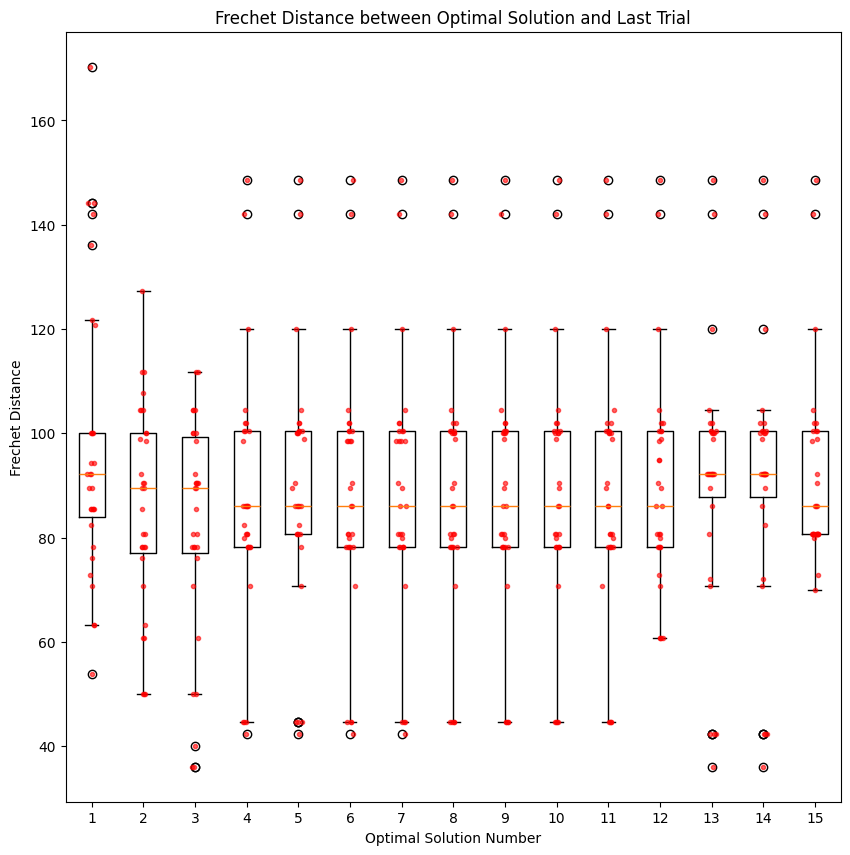

In [ ]:
most_similar_frechet(solutions)

In [ ]:
def most_similar_frechet_spatial(solutions):
    # Initialize a list to store Fréchet distances for each solution
    frechet_dists = [[] for _ in range(len(solutions))]
    # List to store spatial groups for each data point
    spatial_groups = [[] for _ in range(len(solutions))]

    # Read the spatial group data
    sub_sum_df = pd.read_csv('/content/drive/MyDrive/trajectory_analysis/OnlineNavigation/sub_sum.csv')
    participant_group_dict = dict(zip(sub_sum_df['ID'], sub_sum_df['Spatial Group']))

    # Get list of participant files
    files = [f for f in listdir('OnlineNavigation/Navigation') if isfile(join('OnlineNavigation/Navigation', f))]

    for file in files:
        # Extract participant ID from filename (assuming format 'participantid.csv')
        participant_id = file.replace('.csv', '').replace('participant_',  '')

        if participant_id not in participant_group_dict:
            continue

        # Get the spatial group for this participant
        spatial_group = participant_group_dict.get(participant_id, 'Unknown')


        # Load trials from the file
        trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = trials(f'OnlineNavigation/Navigation/{file}')
        trial8 = convert_to_discrete(trial8)

        # Compute Fréchet distance between trial8 and each solution
        for i, solution in enumerate(solutions):
            frechet_dist = frechet(trial8, solution)
            frechet_dists[i].append(frechet_dist)
            spatial_groups[i].append(spatial_group)

    # Create the boxplot
    plt.figure(figsize=(10, 10))
    bp = plt.boxplot(frechet_dists, positions=range(1, len(solutions)+1))

    # Define colors for spatial groups
    group_colors = {'High Spatial': 'dodgerblue', 'Low Spatial': 'indianred'}

    # Overlay individual data points with colors based on spatial group
    for i, (y, groups) in enumerate(zip(frechet_dists, spatial_groups)):
        x = np.random.normal(i+1, 0.04, size=len(y))  # Add jitter to the x-axis
        colors = [group_colors.get(g, 'gray') for g in groups]
        plt.scatter(x, y, c=colors, alpha=0.6)

    # Create custom legend
    handles = [plt.Line2D([0], [0], marker='o', color='w', label='High Spatial', markerfacecolor='dodgerblue', markersize=8),
               plt.Line2D([0], [0], marker='o', color='w', label='Low Spatial', markerfacecolor='indianred', markersize=8)]
    plt.legend(handles=handles, title='Spatial Group')

    plt.xlabel('Optimal Solution Number')
    plt.ylabel('Frechet Distance')
    plt.title('Frechet Distance between Optimal Solution and Last Trial')
    plt.xticks(range(1, len(solutions)+1))  # Set x-ticks to match solution numbers
    plt.show()

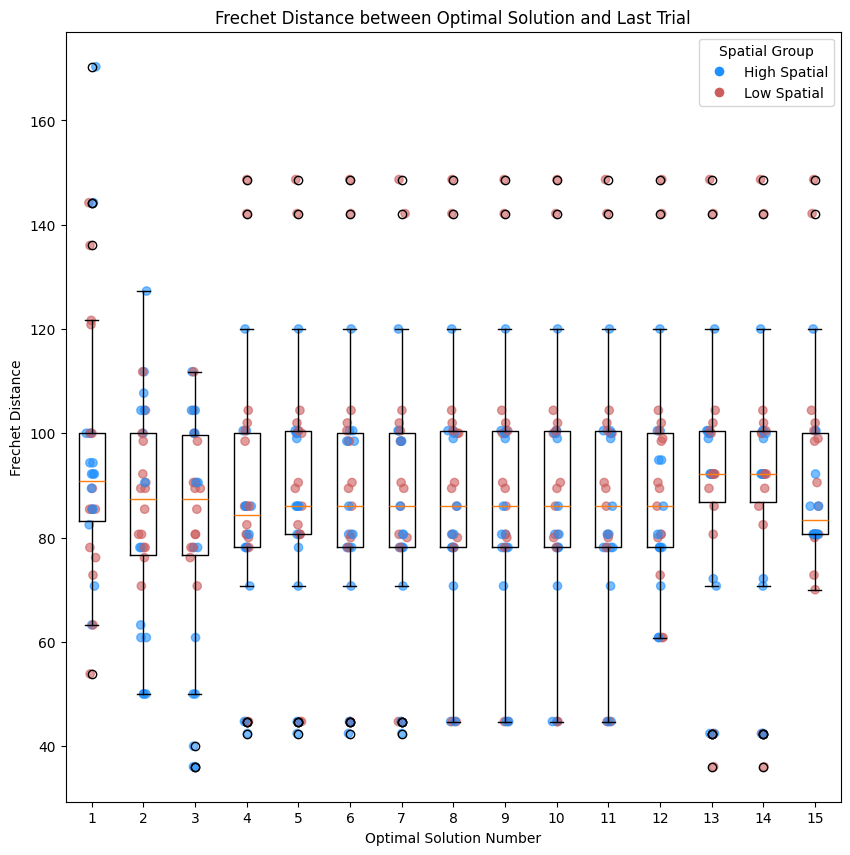

In [ ]:
most_similar_frechet_spatial(solutions)

In [ ]:
def plot_boxplots_by_spatial_group(solutions):
    # Initialize dictionaries to store Fréchet distances for High and Low Spatial participants
    frechet_dists = {
        'High Spatial': [[] for _ in range(len(solutions))],
        'Low Spatial': [[] for _ in range(len(solutions))]
    }

    # Read the spatial group data from sub_sum.csv
    sub_sum_df = pd.read_csv('/content/drive/MyDrive/trajectory_analysis/OnlineNavigation/sub_sum.csv')
    sub_sum_df['ID'] = sub_sum_df['ID'].astype(str)  # Ensure participant IDs are strings
    participant_group_dict = dict(zip(sub_sum_df['ID'], sub_sum_df['Spatial Group']))

    # Get list of files
    files = [f for f in listdir('OnlineNavigation/Navigation') if isfile(join('OnlineNavigation/Navigation', f))]

    for file in files:
        # Extract participant ID from the filename (assuming format 'participant_{participant_id}.csv')
        if file.startswith("participant_"):
            participant_id = file.replace('participant_', '').replace('.csv', '')
        else:
            continue  # Skip files not following the correct naming convention

        # Get the spatial group for this participant
        spatial_group = participant_group_dict.get(participant_id)
        if spatial_group not in ['High Spatial', 'Low Spatial']:
            continue  # Only process High and Low Spatial participants

        # Load trials from the file
        trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = trials(f'OnlineNavigation/Navigation/{file}')
        trial8 = convert_to_discrete(trial8)

        # Compute Fréchet distance between trial8 and each solution
        for i, solution in enumerate(solutions):
            frechet_dist = frechet(trial8, solution)
            frechet_dists[spatial_group][i].append(frechet_dist)

    # Create two boxplots: one for High Spatial and one for Low Spatial
    fig, axs = plt.subplots(1, 2, figsize=(16, 8))

    # Colors for points
    colors = {'High Spatial': 'dodgerblue', 'Low Spatial': 'indianred'}

    # Boxplot for High Spatial
    axs[0].boxplot(frechet_dists['High Spatial'], positions=range(1, len(solutions)+1))
    axs[0].set_title('High Spatial Group')
    axs[0].set_xlabel('Optimal Solution Number')
    axs[0].set_ylabel('Frechet Distance')
    axs[0].set_xticks(range(1, len(solutions)+1))

    # Overlay High Spatial points with dodgerblue color
    for i, y in enumerate(frechet_dists['High Spatial']):
        x = np.random.normal(i+1, 0.04, size=len(y))  # Add jitter to the x-axis
        axs[0].scatter(x, y, c=colors['High Spatial'], alpha=0.6, edgecolor='black', linewidth=0.5)

    # Boxplot for Low Spatial
    axs[1].boxplot(frechet_dists['Low Spatial'], positions=range(1, len(solutions)+1))
    axs[1].set_title('Low Spatial Group')
    axs[1].set_xlabel('Optimal Solution Number')
    axs[1].set_ylabel('Frechet Distance')
    axs[1].set_xticks(range(1, len(solutions)+1))

    # Overlay Low Spatial points with indianred color
    for i, y in enumerate(frechet_dists['Low Spatial']):
        x = np.random.normal(i+1, 0.04, size=len(y))  # Add jitter to the x-axis
        axs[1].scatter(x, y, c=colors['Low Spatial'], alpha=0.6, edgecolor='black', linewidth=0.5)

    # Adjust layout
    plt.tight_layout()
    plt.show()

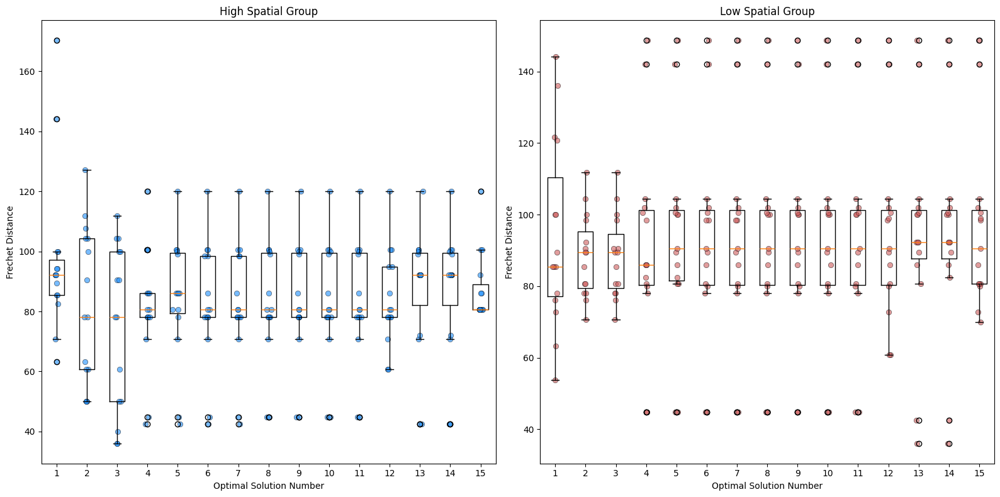

In [ ]:
plot_boxplots_by_spatial_group(solutions)

In [ ]:
def plot_solution_frequency(solutions):
    # Initialize a count for each solution
    solution_counts = [0] * len(solutions)  # List to keep track of counts

    # Get list of participant files
    files = [f for f in listdir('OnlineNavigation/Navigation') if isfile(join('OnlineNavigation/Navigation', f))]

    for file in files:
        # Load trials from the file
        trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = trials(f'OnlineNavigation/Navigation/{file}')
        trial8 = convert_to_discrete(trial8)

        # Compute Fréchet distances between trial8 and each solution
        frechet_dists = []
        for solution in solutions:
            frechet_dist = frechet(trial8, solution)
            frechet_dists.append(frechet_dist)

        # Find the index of the solution with the minimum Fréchet distance
        min_index = frechet_dists.index(min(frechet_dists))
        # Increment the count for this solution
        solution_counts[min_index] += 1

    # Now, solution_counts contains the frequency that each solution is the closest to trial8

    # Create the bar plot
    plt.figure(figsize=(10, 6))
    plt.bar(range(1, len(solutions)+1), solution_counts, color='skyblue', edgecolor='black')
    plt.xlabel('Optimal Solution Number')
    plt.ylabel('Frequency')
    plt.title('Frequency of Closest Optimal Solutions')
    plt.xticks(range(1, len(solutions)+1))  # Set x-ticks to match solution numbers
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.ylim((0, 8))
    plt.show()

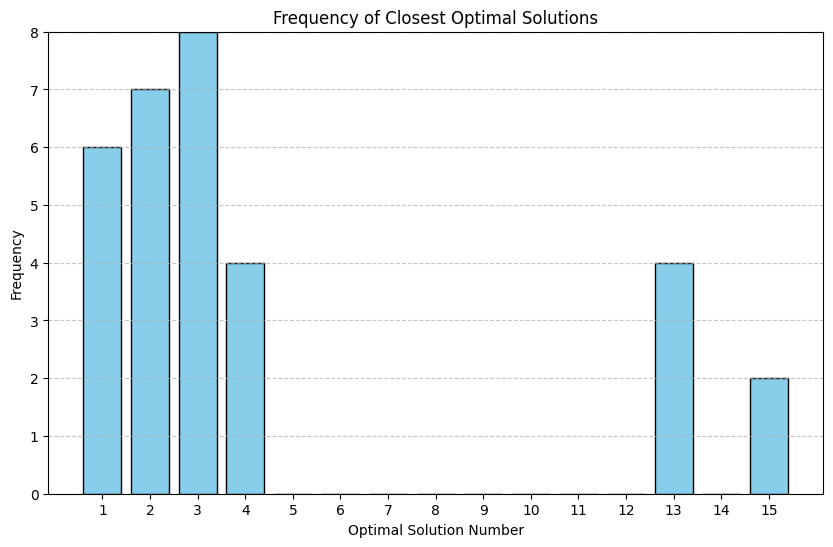

In [ ]:
plot_solution_frequency(solutions)

In [ ]:
def plot_solution_frequency_spatial(solutions):
    # Initialize counts for each solution and spatial group
    spatial_groups_list = ['High Spatial', 'Low Spatial']
    solution_counts = {group: [0] * len(solutions) for group in spatial_groups_list}

    # Read the spatial group data
    sub_sum_df = pd.read_csv('/content/drive/MyDrive/trajectory_analysis/OnlineNavigation/sub_sum.csv')
    participant_group_dict = dict(zip(sub_sum_df['ID'], sub_sum_df['Spatial Group']))

    # Get list of participant files
    files = [f for f in listdir('OnlineNavigation/Navigation') if isfile(join('OnlineNavigation/Navigation', f))]

    for file in files:
        # Extract participant ID from filename (assuming format 'participant_{participant_id}.csv')
        participant_id = file.replace('participant_', '').replace('.csv', '')
        # Get the spatial group for this participant
        spatial_group = participant_group_dict.get(participant_id, 'Unknown')
        if spatial_group not in spatial_groups_list:
            continue  # Skip if spatial group is not 'High Spatial' or 'Low Spatial'

        # Load trials from the file
        trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = trials(f'OnlineNavigation/Navigation/{file}')
        trial8 = convert_to_discrete(trial8)

        # Compute Fréchet distances between trial8 and each solution
        frechet_dists = []
        for solution in solutions:
            frechet_dist = frechet(trial8, solution)
            frechet_dists.append(frechet_dist)

        # Find the index of the solution with the minimum Fréchet distance
        min_index = frechet_dists.index(min(frechet_dists))
        # Increment the count for this solution and spatial group
        solution_counts[spatial_group][min_index] += 1

    # Create the stacked bar plot
    x = np.arange(len(solutions))  # the label locations

    fig, ax = plt.subplots(figsize=(10, 6))

    # Define colors for spatial groups
    group_colors = {'High Spatial': 'dodgerblue', 'Low Spatial': 'indianred'}

    # Plot High Spatial bars
    rects1 = ax.bar(x, solution_counts['High Spatial'], label='High Spatial', color=group_colors['High Spatial'])

    # Plot Low Spatial bars on top of High Spatial bars
    rects2 = ax.bar(x, solution_counts['Low Spatial'], bottom=solution_counts['High Spatial'], label='Low Spatial', color=group_colors['Low Spatial'])

    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_xlabel('Optimal Solution Number')
    ax.set_ylabel('Frequency')
    ax.set_title('Frequency of Closest Optimal Solutions by Spatial Group')
    ax.set_xticks(x)
    ax.set_xticklabels(range(1, len(solutions)+1))
    ax.legend()

    plt.ylim((0, 8))
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()

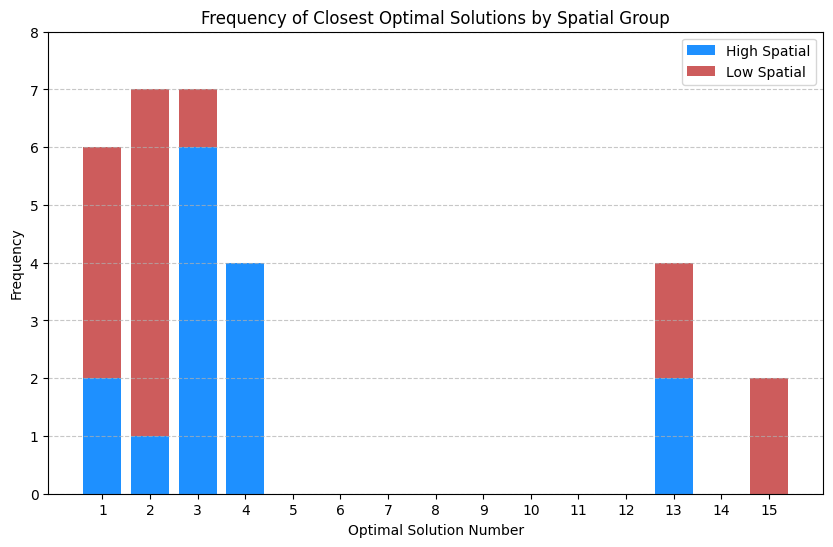

In [ ]:
plot_solution_frequency_spatial(solutions)

# **Heuristic Solutions**

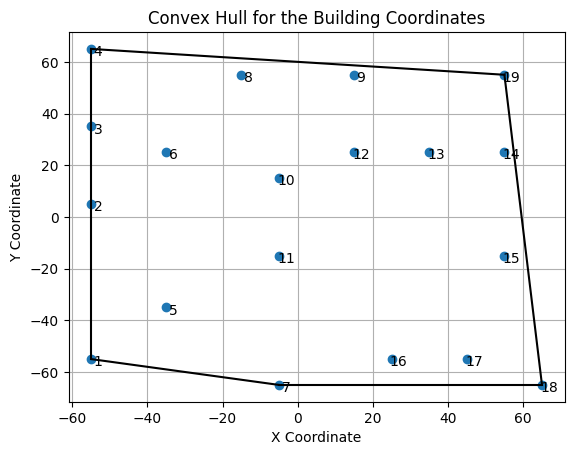

Open TSP Tour Visiting All Buildings Starting at Building 2: [2, 3, 4, 8, 6, 5, 1, 7, 16, 17, 18, 15, 11, 10, 12, 13, 14, 9, 19]
Path Length: 940.0


In [ ]:
import numpy as np
from scipy.spatial import ConvexHull
import matplotlib.pyplot as plt

def convex_hull():
    # Building coordinates
    building_coords = {
        1: (-55, -55), 2: (-55, 5), 3: (-55, 35), 4: (-55, 65),
        5: (-35, -35), 6: (-35, 25), 7: (-5, -65), 8: (-15, 55),
        9: (15, 55), 10: (-5, 15), 11: (-5, -15), 12: (15, 25),
        13: (35, 25), 14: (55, 25), 15: (55, -15), 16: (25, -55),
        17: (45, -55), 18: (65, -65), 19: (55, 55)
    }

    # Convert dictionary to list of coordinates
    coords = np.array(list(building_coords.values()))

    # Step 1: Compute the convex hull
    hull = ConvexHull(coords)

    # Step 2: Plot the convex hull
    plt.plot(coords[:, 0], coords[:, 1], 'o')
    for simplex in hull.simplices:
        plt.plot(coords[simplex, 0], coords[simplex, 1], 'k-')

    # Label the buildings
    for i, txt in building_coords.items():
        plt.annotate(i, (txt[0], txt[1]), textcoords="offset points", xytext=(5,-5), ha='center')

    plt.title("Convex Hull for the Building Coordinates")
    plt.xlabel("X Coordinate")
    plt.ylabel("Y Coordinate")
    plt.grid(True)
    plt.show()

    # Step 3: Get the points on the convex hull
    hull_points = list(hull.vertices)  # Indices of the points on the convex hull

    # Step 4: Ensure the tour starts at building 2
    start_building = 2
    start_idx = list(building_coords.keys()).index(start_building)  # Index of building 2 in building_coords

    # Find where building 2 is in the convex hull and rotate the tour
    if start_idx in hull_points:
        start_position = hull_points.index(start_idx)
        convex_hull_tour = hull_points[start_position:] + hull_points[:start_position]  # Rotate tour to start at building 2
    else:
        # If building 2 is not on the convex hull, manually insert it
        convex_hull_tour = [start_idx] + hull_points

    # Step 5: Insert inner cities using Cheapest Insertion Heuristic
    remaining_cities = [i for i in range(len(building_coords)) if i not in convex_hull_tour]
    for city in remaining_cities:
        # Insert city at the position in the tour that minimizes the increase in distance
        best_position = -1
        min_increase = float('inf')
        for i in range(len(convex_hull_tour) - 1):
            j = (i + 1) % len(convex_hull_tour)
            # Calculate the increase in distance by inserting the city between convex_hull_tour[i] and convex_hull_tour[j]
            increase = (
                np.linalg.norm(coords[convex_hull_tour[i]] - coords[city]) +
                np.linalg.norm(coords[city] - coords[convex_hull_tour[j]]) -
                np.linalg.norm(coords[convex_hull_tour[i]] - coords[convex_hull_tour[j]])
            )
            if increase < min_increase:
                min_increase = increase
                best_position = i + 1
        # Insert the city at the best position found
        convex_hull_tour.insert(best_position, city)

    # Convert indices back to building numbers
    convex_hull_solution = [list(building_coords.keys())[i] for i in convex_hull_tour]

    path_length = 0
    for i in range(len(convex_hull_solution)-1):
        path_length += distance_matrix[convex_hull_solution[i]-1][convex_hull_solution[i+1]-1]

    return convex_hull_solution, path_length

# Print the suboptimal open TSP solution (tour visiting all buildings exactly once)
convex_hull_solution, path_length = convex_hull()
print("Open TSP Tour Visiting All Buildings Starting at Building 2:", convex_hull_solution)
print("Path Length:", path_length)

In [ ]:
# Function to calculate the total tour length
def calculate_tour_length(tour, distance_matrix):
    total_distance = 0
    for i in range(len(tour) - 1):
        total_distance += distance_matrix[tour[i] - 1][tour[i + 1] - 1]  # Adjust for 1-based indexing
    return total_distance

# 2-opt Swap
def two_opt_swap(tour, i, j):
    # Reverses the tour segment between i and j
    return tour[:i] + tour[i:j][::-1] + tour[j:]

# Function to apply Lin-Kernighan algorithm
def lin_kernighan(distance_matrix, initial_tour):
    best_tour = initial_tour
    best_distance = calculate_tour_length(best_tour, distance_matrix)
    improved = True

    while improved:
        improved = False

        # Try different swaps of edges
        for i in range(1, len(best_tour) - 1):
            for j in range(i + 1, len(best_tour)):
                if j - i == 1:  # Ignore adjacent edges
                    continue

                new_tour = two_opt_swap(best_tour, i, j)
                new_distance = calculate_tour_length(new_tour, distance_matrix)

                if new_distance < best_distance:
                    best_tour = new_tour
                    best_distance = new_distance
                    improved = True

    return best_tour, best_distance

# Example tour (starting at building 2)
initial_tour = [2, 3, 4, 8, 9, 19, 14, 13, 12, 10, 6, 5, 11, 7, 16, 17, 18, 15, 1]

# Apply Lin-Kernighan algorithm to find a better solution
lin_kernighan_solution, best_distance = lin_kernighan(distance_matrix, initial_tour)

# Output the results
print("Lin Kernighan Solution:", lin_kernighan_solution)
print("Path Length:", best_distance)

Lin Kernighan Solution: [2, 3, 4, 8, 9, 19, 14, 15, 13, 12, 10, 6, 5, 11, 16, 17, 18, 7, 1]
Path Length: 780.0


In [ ]:
def nearest_neighbor_open_tsp(distance_matrix, start_building):
    n_buildings = len(distance_matrix)
    unvisited = set(range(n_buildings))
    tour = []

    current_building = start_building - 1  # Adjusting for 0-based index
    tour.append(current_building + 1)      # Store building numbers starting from 1
    unvisited.remove(current_building)

    while unvisited:
        # Find the nearest unvisited neighbor
        nearest_building = min(
            unvisited,
            key=lambda x: distance_matrix[current_building][x]
        )
        tour.append(nearest_building + 1)  # Adjust back to 1-based index for building numbers
        unvisited.remove(nearest_building)
        current_building = nearest_building

    return tour

def calculate_tour_length(tour, distance_matrix):
    total_distance = 0
    for i in range(len(tour) - 1):
        from_building = tour[i] - 1  # Adjusting for 0-based index
        to_building = tour[i + 1] - 1
        total_distance += distance_matrix[from_building][to_building]
    return total_distance

# Example usage:
start_building = 2
tour = nearest_neighbor_open_tsp(distance_matrix, start_building)
print("Nearest Neighbor Open TSP Tour Starting at Building {}: {}".format(start_building, tour))

# Calculate the total path length
total_distance = calculate_tour_length(tour, distance_matrix)
print("Total Path Length:", total_distance)

Nearest Neighbor Open TSP Tour Starting at Building 2: [2, 3, 4, 8, 9, 13, 12, 11, 5, 1, 7, 16, 17, 18, 15, 14, 19, 6, 10]
Total Path Length: 740.0


In [ ]:
import random

def nearest_neighbors_stochastic(distance_matrix, start_building):
    n_buildings = len(distance_matrix)
    unvisited = set(range(n_buildings))
    tour = []

    current_building = start_building - 1  # Adjusting for 0-based index
    tour.append(current_building + 1)      # Store building numbers starting from 1
    unvisited.remove(current_building)

    while unvisited:
        # Find the distance to each unvisited neighbor
        distances = [(neighbor, distance_matrix[current_building][neighbor]) for neighbor in unvisited]

        # Find the minimum distance
        min_distance = min(distances, key=lambda x: x[1])[1]

        # Get all neighbors at the minimum distance
        nearest_buildings = [neighbor for neighbor, dist in distances if dist == min_distance]

        # Choose one neighbor randomly if there is a tie
        nearest_building = random.choice(nearest_buildings)

        # Update the tour and current building
        tour.append(nearest_building + 1)  # Adjust back to 1-based index for building numbers
        unvisited.remove(nearest_building)
        current_building = nearest_building

    return tour

# Example usage:
start_building = 2
tour = nearest_neighbors_stochastic(distance_matrix, start_building)
print("Nearest Neighbor Stochastic Open TSP Tour Starting at Building {}: {}".format(start_building, tour))

# Calculate the total path length using the same function as before
total_distance = calculate_tour_length(tour, distance_matrix)
print("Total Path Length:", total_distance)


Nearest Neighbor Stochastic Open TSP Tour Starting at Building 2: [2, 3, 6, 10, 12, 11, 16, 17, 18, 15, 14, 19, 9, 13, 8, 4, 5, 7, 1]
Total Path Length: 800.0


In [ ]:
import random

def nearest_neighbors_stochastic(distance_matrix, start_building):
    n_buildings = len(distance_matrix)
    unvisited = set(range(n_buildings))
    tour = []

    current_building = start_building - 1  # Adjusting for 0-based index
    tour.append(current_building + 1)      # Store building numbers starting from 1
    unvisited.remove(current_building)

    while unvisited:
        # Find the distance to each unvisited neighbor
        distances = [(neighbor, distance_matrix[current_building][neighbor]) for neighbor in unvisited]

        # Find the minimum distance
        min_distance = min(distances, key=lambda x: x[1])[1]

        # Get all neighbors at the minimum distance
        nearest_buildings = [neighbor for neighbor, dist in distances if dist == min_distance]

        # Choose one neighbor randomly if there is a tie
        nearest_building = random.choice(nearest_buildings)

        # Update the tour and current building
        tour.append(nearest_building + 1)  # Adjust back to 1-based index for building numbers
        unvisited.remove(nearest_building)
        current_building = nearest_building

    return tour

def calculate_tour_length(tour, distance_matrix):
    total_distance = 0
    for i in range(len(tour) - 1):
        from_building = tour[i] - 1  # Adjusting for 0-based index
        to_building = tour[i + 1] - 1
        total_distance += distance_matrix[from_building][to_building]
    return total_distance

def find_all_stochastic_tours(distance_matrix, start_building, num_trials=1000):
    unique_tours = {}
    all_tours = []

    for _ in range(num_trials):
        # Get a tour using the stochastic nearest neighbors approach
        tour = tuple(nearest_neighbors_stochastic(distance_matrix, start_building))

        if tour not in unique_tours:
            # Calculate the path length of the tour
            path_length = calculate_tour_length(tour, distance_matrix)
            # Store the tour and its path length
            unique_tours[tour] = path_length
            all_tours.append((list(tour), path_length))

    # Sort the tours by path length in increasing order
    sorted_tours = sorted(all_tours, key=lambda x: x[1])

    return sorted_tours

# Example usage:
start_building = 2
all_possible_tours = find_all_stochastic_tours(distance_matrix, start_building, num_trials=5000)
print("Number of tours:", len(all_possible_tours))
print("All Possible Nearest Neighbor Stochastic Tours from Building {}:".format(start_building))

# Numbering each tour from 1 to the number of solutions
for idx, (tour, path_length) in enumerate(all_possible_tours, start=1):
    print("Tour Number:", idx)
    print("Tour:", tour)
    print("Path Length:", round(path_length))
    print("---")


Number of tours: 38
All Possible Nearest Neighbor Stochastic Tours from Building 2:
Tour Number: 1
Tour: [2, 3, 6, 10, 12, 11, 5, 1, 7, 16, 17, 18, 15, 14, 19, 9, 13, 8, 4]
Path Length: 720
---
Tour Number: 2
Tour: [2, 3, 4, 8, 9, 13, 12, 11, 5, 1, 7, 16, 17, 18, 15, 14, 19, 6, 10]
Path Length: 740
---
Tour Number: 3
Tour: [2, 3, 4, 8, 9, 13, 12, 11, 7, 1, 5, 6, 10, 16, 17, 18, 15, 14, 19]
Path Length: 740
---
Tour Number: 4
Tour: [2, 3, 6, 10, 12, 11, 7, 1, 5, 16, 17, 18, 15, 14, 19, 9, 13, 8, 4]
Path Length: 740
---
Tour Number: 5
Tour: [2, 3, 4, 8, 9, 13, 12, 11, 5, 1, 7, 16, 17, 18, 15, 14, 19, 10, 6]
Path Length: 740
---
Tour Number: 6
Tour: [2, 3, 4, 8, 9, 13, 12, 11, 7, 16, 17, 18, 15, 14, 19, 6, 10, 5, 1]
Path Length: 760
---
Tour Number: 7
Tour: [2, 3, 4, 8, 9, 13, 12, 11, 7, 16, 17, 18, 15, 14, 19, 10, 6, 5, 1]
Path Length: 760
---
Tour Number: 8
Tour: [2, 3, 4, 8, 9, 13, 12, 11, 16, 17, 18, 15, 14, 19, 10, 6, 5, 7, 1]
Path Length: 760
---
Tour Number: 9
Tour: [2, 3, 4, 8, 9,

In [ ]:
#Path distance = 720
nearest_neighbors1 = [(-45, 5), (-45, 35), (-25, 35), (-25, 25), (-25, 15), (-15, 15), (-15, 35), (5, 35), (5, 25), (5, -15), (5, -35), (-25, -35), (-25, -55), (-45, -55),
                      (-5, -55), (-5, -45), (25, -45), (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 65), (25, 65), (25, 55),
                      (25, 25), (25, 65), (-15, 65), (-45, 65)]

#Path distance = 740
nearest_neighbors2 = [(-45, 5), (-45, 35), (-45, 65), (-15, 65), (25, 65), (25, 55), (25, 25), (25, 35), (5, 35), (5, 25), (5, -15), (5, -35), (-25, -35), (-25, -55),
                      (-45, -55), (-5, -55), (-5, -45), (25, -45), (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 45), (25, 45),
                      (25, 35), (-15, 35), (-15, 15), (-25, 15), (-25, 25)]

nearest_neighbors3 = [(-45, 5), (-45, 35), (-45, 65), (-15, 65), (25, 65), (25, 55), (25, 25), (25, 35), (5, 35), (5, 25), (5, -15), (5, -35), (-25, -35), (-25, -55),
                      (-45, -55), (-5, -55), (-5, -45), (25, -45), (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 45), (25, 45),
                      (25, 35), (-25, 35), (-25, 25), (-25, 15), (-15, 15)]

nearest_neighbors4 = [(-45, 5), (-45, 35), (-25, 35), (-25, 25), (-25, 15), (-15, 15), (-15, 35), (5, 35), (5, 25), (5, -15), (5, -35), (-5, -35), (-5, -55), (-45, -55),
                      (-25, -55), (-25, -35), (5, -35), (5, -45), (25, -45), (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 65),
                      (25, 65), (25, 55), (25, 25), (25, 65), (-15, 65), (-45, 65)]

nearest_neighbors5 = [(-45, 5), (-45, 35), (-45, 65), (-15, 65), (25, 65), (25, 55), (25, 25), (25, 35), (5, 35), (5, 25), (5, -15), (5, -35), (-5, -35), (-5, -55), (-45, -55),
                      (-25, -55), (-25, -35), (-25, 25), (-15, 25), (-15, 15), (-15, -45), (25, -45), (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55)]

#Path distance = 760
nearest_neighbors6 = [(-45, 5), (-45, 35), (-45, 65), (-15, 65), (25, 65), (25, 55), (25, 25), (25, 35), (5, 35), (5, 25), (5, -15), (5, -35), (-5, -35), (-5, -55), (-45, -55),
                      (-25, -55), (-25, -35), (-25, -5), (-15, -5), (-15, 15), (-25, 15), (-25, 25), (-25, -35), (25, -35), (25, -45), (45, -45), (55, -45), (55, -65), (55, -55),
                      (65, -55), (65, -15), (65, 25), (65, 55)]

nearest_neighbors7 = [(-45, 5), (-45, 35), (-45, 65), (-15, 65), (25, 65), (25, 55), (25, 25), (25, 35), (5, 35), (5, 25), (5, -15), (5, -35), (-5, -35), (-5, -55), (-45, -55),
                      (-25, -55), (-25, -35), (5, -35), (5, -45), (25, -45), (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 45), (25, 45),
                      (25, 35), (-15, 35), (-15, 15), (-25, 15), (-25, 25)]

nearest_neighbors8 = [(-45, 5), (-45, 35), (-45, 65), (-15, 65), (25, 65), (25, 55), (25, 25), (25, 35), (5, 35), (5, 25), (5, -15), (5, -35), (-5, -35), (-5, -55), (-45, -55),
                      (-25, -55), (-25, -35), (5, -35), (5, -45), (25, -45), (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 45), (25, 45),
                      (25, 35), (-25, 35), (-25, 25), (-25, 15), (-15, 15)]

nearest_neighbors9 = [(-45, 5), (-45, 35), (-45, 65), (-15, 65), (25, 65), (25, 55), (25, 25), (25, 35), (5, 35), (5, 25), (5, -15), (5, -45), (25, -45), (45, -45), (55, -45),
                      (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 45), (25, 45), (25, 35), (-15, 35), (-15, 15), (-25, 15), (-25, 25), (-25, -35),
                      (-5, -35), (-5, -55), (-45, -55)]

nearest_neighbors10 = [(-45, 5), (-45, 35), (-45, 65), (-15, 65), (25, 65), (25, 55), (25, 25), (25, 35), (5, 35), (5, 25), (5, -15), (5, -35), (-5, -35), (-5, -55), (-5, -45), (25, -45),
                       (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 45), (25, 45), (25, 35), (-15, 35), (-15, 15), (-25, 15), (-25, 25),
                       (-25, -35), (-25, -55), (-45, -55)]

nearest_neighbors11 = [(-45, 5), (-45, 35), (-25, 35), (-25, 25), (-25, 15), (-15, 15), (-15, 35), (5, 35), (5, 25), (5, -15), (5, -35), (-5, -35), (-5, -55), (-5, -35), (-25, -35), (-25, -55),
                       (-45, -55), (-5, -55), (-5, -45), (25, -45), (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 65), (25, 65), (25, 55), (25, 25),
                       (25, 65), (-15, 65), (-45, 65)]

nearest_neighbors12 = [(-45, 5), (-45, 35), (-45, 65), (-15, 65), (25, 65), (25, 55), (25, 25), (25, 35), (5, 35), (5, 25), (5, -15), (5, -35), (-5, -35), (-5, -55), (-5, -45), (25, -45),
                       (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 45), (25, 45), (25, 35), (-25, 35), (-25, 25), (-25, 15), (-15, 15), (-15, -35),
                       (-25, -35), (-25, -55), (-45, -55)]

nearest_neighbors13 = [(-45, 5), (-45, 35), (-45, 65), (-15, 65), (25, 65), (25, 55), (25, 25), (25, 35), (5, 35), (5, 25), (5, -15), (5, -45), (25, -45), (45, -45), (55, -45),
                       (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 45), (25, 45), (25, 35), (-15, 35), (-15, 15), (-25, 15), (-25, 25), (-25, -35),
                       (-25, -55), (-45, -55), (-5, -55)]

nearest_neighbors14 = [(-45, 5), (-45, 35), (-45, 65), (-15, 65), (25, 65), (25, 55), (25, 25), (25, 35), (5, 35), (5, 25), (5, -15), (5, -45), (25, -45), (45, -45), (55, -45),
                       (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 45), (25, 45), (25, 35), (-25, 35), (-25, 25), (-25, 15), (-15, 15), (-15, -35),
                       (-25, -35), (-25, -55), (-5, -55), (-45, -55)]

nearest_neighbors15 = [(-45, 5), (-45, 35), (-45, 65), (-15, 65), (25, 65), (25, 55), (25, 25), (25, 35), (5, 35), (5, 25), (5, -15), (5, -45), (25, -45), (45, -45), (55, -45),
                       (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 45), (25, 45), (25, 35), (-25, 35), (-25, 25), (-25, 15), (-15, 15), (-15, -35),
                       (-25, -35), (-25, -55), (-45, -55), (-5, -55)]

nearest_neighbors16 = [(-45, 5), (-45, 35), (-25, 35), (-25, 25), (-25, 15), (-15, 15), (-15, 35), (5, 35), (5, 25), (5, 35), (25, 35), (25, 25), (25, 55), (25, 65), (-15, 65),
                       (-45, 65), (-45, -55), (-5, -55), (-5, -35), (-25, -35), (5, -35), (5, -15), (5, -45), (25, -45), (45, -45), (55, -45), (55, -65), (55, -55),
                       (65, -55), (65, -15), (65, 25), (65, 55)]

nearest_neighbors17 = [(-45, 5), (-45, 35), (-25, 35), (-25, 25), (-25, 15), (-15, 15), (-15, 35), (5, 35), (5, 25), (5, -15), (5, -35), (-25, -35), (-25, -55), (-5, -55), (-45, -55),
                       (-5, -55), (-5, -45), (25, -45), (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 65), (25, 65), (25, 55), (25, 25),
                       (25, 65), (-15, 65), (-45, 65)]

#Path distance = 770
nearest_neighbors18 = [(-45, 5), (-45, 35), (-45, 65), (-15, 65), (25, 65), (25, 55), (25, 25), (25, 35), (5, 35), (5, 25), (5, -15), (5, -35), (-5, -35), (-5, -55), (-45, -55),
                       (-25, -55), (-25, -35), (-25, -5), (-15, -5), (-15, 15), (-25, 15), (-25, 25), (-25, 35), (25, 35), (25, 45), (65, 45), (65, 55), (65, 25), (65, -15),
                       (65, -45), (45, -45), (25, -45), (55, -45), (55, -65)]

#Path distance = 780
nearest_neighbors19 = [(-45, 5), (-45, 35), (-45, 65), (-15, 65), (25, 65), (25, 55), (25, 25), (25, 35), (5, 35), (5, 25), (5, -15), (5, -35), (-5, -35), (-5, -55), (-25, -55),
                       (-25, -35), (-25, -55), (-45, -55), (-5, -55), (-5, -45), (25, -45), (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55),
                       (65, 45), (25, 45), (25, 35), (-15, 35), (-15, 15), (-25, 15), (-25, 25)]

nearest_neighbors20 = [(-45, 5), (-45, 35), (-45, 65), (-15, 65), (25, 65), (25, 55), (25, 25), (25, 35), (5, 35), (5, 25), (5, -15), (5, -35), (-5, -35), (-5, -55), (-25, -55),
                       (-25, -35), (-25, -55), (-45, -55), (-5, -55), (-5, -45), (25, -45), (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55),
                       (65, 45), (25, 45), (25, 35), (-25, 35), (-25, 25), (-25, 15), (-15, 15)]

nearest_neighbors21 = [(-45, 5), (-45, 35), (-45, 65), (-15, 65), (25, 65), (25, 55), (25, 25), (25, 35), (5, 35), (5, 25), (5, -15), (5, -35), (-25, -35), (-25, -55), (-5, -55), (-45, -55),
                       (-5, -55), (-5, -45), (25, -45), (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 45), (25, 45), (25, 35), (-25, 35),
                       (-25, 25), (-25, 15), (-15, 15)]

nearest_neighbors22 = [(-45, 5), (-45, 35), (-45, 65), (-15, 65), (25, 65), (25, 55), (25, 25), (25, 35), (5, 35), (5, 25), (5, -15), (5, -35), (-25, -35), (-25, -55), (-5, -55), (-45, -55),
                       (-5, -55), (-5, -45), (25, -45), (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 45), (25, 45), (25, 35), (-15, 35),
                       (-15, 15), (-25, 15), (-25, 25)]

#Path distance = 800
nearest_neighbors23 = [(-45, 5), (-45, 35), (-25, 35), (-25, 25), (-25, 15), (-15, 15), (-15, 35), (5, 35), (5, 25), (5, -15), (5, -45), (25, -45), (45, -45), (55, -45), (55, -65),
                       (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 65), (25, 65), (25, 55), (25, 25), (25, 65), (-15, 65), (-45, 65), (-45, 35), (-25, 35), (-25, -35),
                       (-25, -55), (-5, -55), (-45, -55)]

nearest_neighbors24 = [(-45, 5), (-45, 35), (-25, 35), (-25, 25), (-25, 15), (-15, 15), (-15, 35), (5, 35), (5, 25), (5, -15), (5, -35), (-25, -35), (-25, -55), (-5, -55), (-5, -45),
                       (25, -45), (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 65), (25, 65), (25, 55), (25, 25), (25, 65), (-15, 65),
                       (-45, 65), (-45, -55)]

nearest_neighbors25 = [(-45, 5), (-45, 35), (-45, 65), (-15, 65), (25, 65), (25, 55), (25, 25), (25, 35), (5, 35), (5, 25), (5, -15), (5, -35), (-25, -35), (-25, -55), (-5, -55), (-5, -45),
                       (25, -45), (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 45), (25, 45), (25, 35), (-15, 35), (-15, 15), (-25, 15),
                       (-25, 25), (-25, -55), (-45, -55)]

nearest_neighbors26 = [(-45, 5), (-45, 35), (-25, 35), (-25, 25), (-25, 15), (-15, 15), (-15, 35), (5, 35), (5, 25), (5, -15), (5, -45), (25, -45), (45, -45), (55, -45), (55, -65),
                       (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 65), (25, 65), (25, 55), (25, 25), (25, 65), (-15, 65), (-45, 65), (-45, -55), (-25, -55), (-25, -35),
                       (-25, -55), (-5, -55)]

nearest_neighbors27 = [(-45, 5), (-45, 35), (-45, 65), (-15, 65), (25, 65), (25, 55), (25, 25), (25, 35), (5, 35), (5, 25), (5, -15), (5, -35), (-25, -35), (-25, -55), (-5, -55),
                       (-5, -45), (25, -45), (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 45), (25, 45), (25, 35), (-25, 35), (-25, 25),
                       (-25, 15), (-15, 15), (-15, -55), (-45, -55)]

nearest_neighbors28 = [(-45, 5), (-45, 35), (-25, 35), (-25, 25), (-25, 15), (-15, 15), (-15, 35), (5, 35), (5, 25), (5, -15), (5, -45), (25, -45), (45, -45), (55, -45), (55, -65),
                       (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 65), (25, 65), (25, 55), (25, 25), (25, 65), (-15, 65), (-45, 65), (-45, -55), (-5, -55),
                       (-25, -55), (-25, -35)]

nearest_neighbors29 = [(-45, 5), (-45, 35), (-25, 35), (-25, 25), (-25, 15), (-15, 15), (-15, 35), (5, 35), (5, 25), (5, -15), (5, -45), (25, -45), (45, -45), (55, -45), (55, -65),
                       (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 65), (25, 65), (25, 55), (25, 25), (25, 65), (-15, 65), (-45, 65), (-45, 35), (-25, 35), (-25, -35),
                       (-25, -55), (-45, -55), (-5, -55)]

nearest_neighbors30 = [(-45, 5), (-45, 35), (-25, 35), (-25, 25), (-25, 15), (-15, 15), (-15, 35), (5, 35), (5, 25), (5, -15), (5, -35), (-5, -35), (-5, -55), (-5, -45), (25, -45),
                       (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 65), (25, 65), (25, 55), (25, 25), (25, 65), (-15, 65), (-45, 65),
                       (-45, -55), (-25, -55), (-25, -35)]

nearest_neighbors31 = [(-45, 5), (-45, 35), (-25, 35), (-25, 25), (-25, 15), (-15, 15), (-15, 35), (5, 35), (5, 25), (5, -15), (5, -35), (-5, -35), (-5, -55), (-5, -45), (25, -45),
                       (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 65), (25, 65), (25, 55), (25, 25), (25, 65), (-15, 65), (-45, 65),
                       (-45, 35), (-25, 35), (-25, -35), (-25, -55), (-45, -55)]

#Path distance = 810
nearest_neighbors32 = [(-45, 5), (-45, 35), (-25, 35), (-25, 25), (-25, 15), (-15, 15), (-15, 35), (5, 35), (5, 25), (5, 35), (25, 35), (25, 25), (25, 55), (25, 65), (-15, 65),
                       (-45, 65), (65, 65), (65, 55), (65, 25), (65, -15), (65, -45), (45, -45), (25, -45), (-5, -45), (-5, -55), (-45, -55), (-25, -55), (-25, -35), (5, -35),
                       (5, -15), (5, -65), (55, -65)]

#Path distance = 830
nearest_neighbors33 = [(-45, 5), (-45, 35), (-25, 35), (-25, 25), (-25, 15), (-15, 15), (-15, 35), (5, 35), (5, 25), (5, 35), (25, 35), (25, 25), (25, 55), (25, 65), (-15, 65),
                       (-45, 65), (-45, -55), (-25, -55), (-25, -35), (-25, -55), (-5, -55), (-5, -45), (25, -45), (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15),
                       (65, 25), (65, 55), (65, 45), (25, 45), (25, 35), (5, 35), (5, -15)]

nearest_neighbors34 = [(-45, 5), (-45, 35), (-25, 35), (-25, 25), (-25, 15), (-15, 15), (-15, 35), (5, 35), (5, 25), (5, 35), (25, 35), (25, 25), (25, 55), (25, 65), (-15, 65),
                       (-45, 65), (-45, 35), (-25, 35), (-25, -35), (-25, -55), (-45, -55), (-5, -55), (-5, -45), (25, -45), (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15),
                       (65, 25), (65, 55), (65, 45), (25, 45), (25, 35), (5, 35), (5, -15)]

#Path distance = 840
nearest_neighbors35 = [(-45, 5), (-45, 35), (-25, 35), (-25, 25), (-25, 15), (-15, 15), (-15, 35), (5, 35), (5, 25), (5, 35), (25, 35), (25, 25), (25, 55), (25, 65), (-15, 65),
                       (-45, 65), (-45, -55), (-5, -55), (-5, -45), (25, -45), (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 45), (25, 45), (25, 35),
                        (5, 35), (5, -15), (5, -35), (-25, -35)]

#Path distance = 850
nearest_neighbors36 = [(-45, 5), (-45, 35), (-25, 35), (-25, 25), (-25, 15), (-15, 15), (-15, 35), (5, 35), (5, 25), (5, 35), (25, 35), (25, 25), (25, 55), (25, 65), (-15, 65),
                       (-45, 65), (65, 65), (65, 55), (65, 25), (65, -15), (65, -45), (45, -45), (25, -45), (-5, -45), (-5, -55), (-25, -55), (-25, -35), (-25, -55), (-45, -55), (-5, -55),
                       (-5, -35), (5, -35),  (5, -15), (5, -65), (55, -65)]

#Path distance = 870
nearest_neighbors37 = [(-45, 5), (-45, 35), (-25, 35), (-25, 25), (-25, 15), (-15, 15), (-15, 35), (5, 35), (5, 25), (5, 35), (25, 35), (25, 25), (25, 55), (25, 65), (-15, 65),
                       (-45, 65), (-45, 35), (-25, 35), (-25, -35), (-25, -55), (-5, -55), (-45, -55), (-5, -55), (-5, -45), (25, -45), (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15),
                       (65, 25), (65, 55), (65, 45), (25, 45), (25, 35), (5, 35), (5, -15)]

#Path distance = 880
nearest_neighbors38 = [(-45, 5), (-45, 35), (-25, 35), (-25, 25), (-25, 15), (-15, 15), (-15, 35), (5, 35), (5, 25), (5, 35), (25, 35), (25, 25), (25, 55), (25, 65), (-15, 65), (-45, 65),
                       (-45, 35), (-25, 35), (-25, -35), (-25, -55), (-5, -55), (-5, -45), (25, -45), (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55),
                       (65, 45), (25, 45), (25, 35), (5, 35), (5, -15), (5, -55), (-45, -55)]

#Path distance = 710
nearest_neighbors_reverse1 = [(-45, 5), (-45, -55), (-25, -55), (-25, -35), (-25, -55), (-5, -55), (-5, -45), (25, -45), (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15),
                              (65, 25), (65, 55), (65, 65), (25, 65), (25, 55), (25, 25), (25, 35), (5, 35), (5, 25), (5, -15), (5, -25), (-15, -25), (-15, 15), (-25, 15), (-25, 25),
                              (-25, 35), (-45, 35), (-45, 65), (-15, 65)]

nearest_neighbors_reverse2 = [(-45, 5), (-45, -55), (-5, -55), (-5, -45), (25, -45), (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 65), (25, 65),
                              (25, 55), (25, 25), (25, 35), (5, 35), (5, 25), (5, -15), (5, -35), (-25, -35), (-25, -5), (-15, -5), (-15, 15), (-25, 15), (-25, 25), (-25, 35), (-45, 35),
                              (-45, 65), (-15, 65)]

#Path distance = 730
nearest_neighbors_reverse3 = [(-45, 5), (-45, -55), (-5, -55), (-5, -45), (25, -45), (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 65), (25, 65),
                              (25, 55), (25, 25), (25, 35), (5, 35), (5, 25), (5, -15), (5, -35), (-25, -35), (-25, 25), (-15, 25), (-15, 15), (-15, 35), (-45, 35), (-45, 65), (-15, 65)]


#Path distance = 740
nearest_neighbors_reverse4 = [(-45, 5), (-45, -55), (-5, -55), (-25, -55), (-25, -35), (5, -35), (5, -15), (5, 25), (5, 35), (25, 35), (25, 25), (25, 55), (25, 65), (-15, 65), (-45, 65),
                              (-45, 35), (-25, 35), (-25, 25), (-25, 15), (-15, 15), (-15, -45), (25, -45), (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55)]

nn_solutions = [
    nearest_neighbors1, nearest_neighbors2, nearest_neighbors3, nearest_neighbors4, nearest_neighbors5,
    nearest_neighbors6, nearest_neighbors7, nearest_neighbors8, nearest_neighbors9, nearest_neighbors10,
    nearest_neighbors11, nearest_neighbors12, nearest_neighbors13, nearest_neighbors14, nearest_neighbors15,
    nearest_neighbors16, nearest_neighbors17, nearest_neighbors18, nearest_neighbors19, nearest_neighbors20,
    nearest_neighbors21, nearest_neighbors22, nearest_neighbors23, nearest_neighbors24, nearest_neighbors25,
    nearest_neighbors26, nearest_neighbors27, nearest_neighbors28, nearest_neighbors29, nearest_neighbors30,
    nearest_neighbors31, nearest_neighbors32, nearest_neighbors33, nearest_neighbors34, nearest_neighbors35,
    nearest_neighbors36, nearest_neighbors37, nearest_neighbors38, nearest_neighbors_reverse1, nearest_neighbors_reverse2,
    nearest_neighbors_reverse3, nearest_neighbors_reverse4
]


In [ ]:
def nearest_neighbor_open_tsp_with_initial(distance_matrix, start_building, second_building):
    n_buildings = len(distance_matrix)
    unvisited = set(range(n_buildings))
    tour = []

    # Adjust building numbers for 0-based index
    current_building = start_building - 1
    tour.append(current_building + 1)  # Append building number starting from 1
    unvisited.remove(current_building)

    # Move to the second building
    next_building = second_building - 1
    if next_building in unvisited:
        tour.append(next_building + 1)
        unvisited.remove(next_building)
        current_building = next_building
    else:
        print("Second building already visited or does not exist.")
        return tour

    # Continue with the nearest neighbor heuristic
    while unvisited:
        # Find the nearest unvisited neighbor
        nearest_building = min(
            unvisited,
            key=lambda x: distance_matrix[current_building][x]
        )
        tour.append(nearest_building + 1)  # Adjust back to building number
        unvisited.remove(nearest_building)
        current_building = nearest_building

    return tour

def calculate_tour_length(tour, distance_matrix):
    total_distance = 0
    for i in range(len(tour) - 1):
        from_building = tour[i] - 1  # Adjusting for 0-based index
        to_building = tour[i + 1] - 1
        total_distance += distance_matrix[from_building][to_building]
    return total_distance

# Example usage:
start_building = 2
second_building = 1

# Assuming 'distance_matrix' is already defined and available in your environment
tour = nearest_neighbor_open_tsp_with_initial(distance_matrix, start_building, second_building)
print("Nearest Neighbor Open TSP Tour Starting at Building {} and then Building {}: {}".format(start_building, second_building, tour))

# Calculate the total path length
total_distance = calculate_tour_length(tour, distance_matrix)
print("Total Path Length:", total_distance)

Nearest Neighbor Open TSP Tour Starting at Building 2 and then Building 1: [2, 1, 5, 7, 16, 17, 18, 15, 14, 19, 9, 13, 12, 11, 10, 6, 3, 4, 8]
Total Path Length: 710.0


In [ ]:
import random

def nearest_neighbor_stochastic_with_initial(distance_matrix, start_building, second_building):
    n_buildings = len(distance_matrix)
    unvisited = set(range(n_buildings))
    tour = []

    # Adjust building numbers for 0-based index
    current_building = start_building - 1
    tour.append(current_building + 1)  # Append building number starting from 1
    unvisited.remove(current_building)

    # Move to the second building
    next_building = second_building - 1
    if next_building in unvisited:
        tour.append(next_building + 1)
        unvisited.remove(next_building)
        current_building = next_building
    else:
        print("Second building already visited or does not exist.")
        return tour

    # Continue with the nearest neighbor heuristic
    while unvisited:
        # Find the distance to each unvisited neighbor
        distances = [(neighbor, distance_matrix[current_building][neighbor]) for neighbor in unvisited]

        # Find the minimum distance
        min_distance = min(distances, key=lambda x: x[1])[1]

        # Get all neighbors at the minimum distance
        nearest_buildings = [neighbor for neighbor, dist in distances if dist == min_distance]

        # Choose one neighbor randomly if there is a tie
        nearest_building = random.choice(nearest_buildings)

        # Update the tour and current building
        tour.append(nearest_building + 1)  # Adjust back to 1-based index for building numbers
        unvisited.remove(nearest_building)
        current_building = nearest_building

    return tour

# Example usage:
start_building = 2
second_building = 1

# Assuming 'distance_matrix' is already defined and available in your environment
tour = nearest_neighbor_stochastic_with_initial(distance_matrix, start_building, second_building)
print("Nearest Neighbor Stochastic Open TSP Tour Starting at Building {} and then Building {}: {}".format(start_building, second_building, tour))

# Calculate the total path length
total_distance = calculate_tour_length(tour, distance_matrix)
print("Total Path Length:", total_distance)


Nearest Neighbor Stochastic Open TSP Tour Starting at Building 2 and then Building 1: [2, 1, 7, 16, 17, 18, 15, 14, 19, 9, 13, 12, 11, 5, 6, 10, 3, 4, 8]
Total Path Length: 730.0


In [ ]:
import random

def nearest_neighbor_stochastic_with_initial(distance_matrix, start_building, second_building):
    n_buildings = len(distance_matrix)
    unvisited = set(range(n_buildings))
    tour = []

    # Adjust building numbers for 0-based index
    current_building = start_building - 1
    tour.append(current_building + 1)  # Append building number starting from 1
    unvisited.remove(current_building)

    # Move to the second building
    next_building = second_building - 1
    if next_building in unvisited:
        tour.append(next_building + 1)
        unvisited.remove(next_building)
        current_building = next_building
    else:
        print("Second building already visited or does not exist.")
        return tour

    # Continue with the nearest neighbor heuristic
    while unvisited:
        # Find the distance to each unvisited neighbor
        distances = [(neighbor, distance_matrix[current_building][neighbor]) for neighbor in unvisited]

        # Find the minimum distance
        min_distance = min(distances, key=lambda x: x[1])[1]

        # Get all neighbors at the minimum distance
        nearest_buildings = [neighbor for neighbor, dist in distances if dist == min_distance]

        # Choose one neighbor randomly if there is a tie
        nearest_building = random.choice(nearest_buildings)

        # Update the tour and current building
        tour.append(nearest_building + 1)  # Adjust back to 1-based index for building numbers
        unvisited.remove(nearest_building)
        current_building = nearest_building

    return tour

def find_all_stochastic_tours_with_initial(distance_matrix, start_building, second_building, num_trials=1000):
    unique_tours = set()
    all_tours = []

    for _ in range(num_trials):
        # Get a tour using the stochastic nearest neighbors approach with initial buildings
        tour = tuple(nearest_neighbor_stochastic_with_initial(distance_matrix, start_building, second_building))

        # Add to the set if it's unique
        if tour not in unique_tours:
            unique_tours.add(tour)
            all_tours.append(list(tour))  # Store the tour in list format for easier processing later

    return all_tours

# Example usage:
start_building = 2
second_building = 1

# Assuming 'distance_matrix' is already defined and available in your environment
all_possible_tours = find_all_stochastic_tours_with_initial(distance_matrix, start_building, second_building, num_trials=1000)
print("Number of tours", len(all_possible_tours))
print("All Possible nn_reverse Tours Starting at Building {} and then Building {}:".format(start_building, second_building))
for tour in all_possible_tours:
    print(tour)
    print("Path Length:", calculate_tour_length(tour, distance_matrix))

Number of tours 4
All Possible nn_reverse Tours Starting at Building 2 and then Building 1:
[2, 1, 7, 5, 11, 12, 13, 9, 8, 4, 3, 6, 10, 16, 17, 18, 15, 14, 19]
Path Length: 740.0
[2, 1, 5, 7, 16, 17, 18, 15, 14, 19, 9, 13, 12, 11, 10, 6, 3, 4, 8]
Path Length: 710.0
[2, 1, 7, 16, 17, 18, 15, 14, 19, 9, 13, 12, 11, 5, 10, 6, 3, 4, 8]
Path Length: 710.0
[2, 1, 7, 16, 17, 18, 15, 14, 19, 9, 13, 12, 11, 5, 6, 10, 3, 4, 8]
Path Length: 730.0


In [ ]:
import numpy as np
from scipy.spatial import ConvexHull
import matplotlib.pyplot as plt

# Building coordinates (provided)
building_coords = {
    1: (-55, -55), 2: (-55, 5), 3: (-55, 35), 4: (-55, 65),
    5: (-35, -35), 6: (-35, 25), 7: (-5, -65), 8: (-15, 55),
    9: (15, 55), 10: (-5, 15), 11: (-5, -15), 12: (15, 25),
    13: (35, 25), 14: (55, 25), 15: (55, -15), 16: (25, -55),
    17: (45, -55), 18: (65, -65), 19: (55, 55)
}

# Convert building coordinates to numpy array and list
coords = np.array(list(building_coords.values()))
building_numbers = list(building_coords.keys())

# Compute the convex hull
hull = ConvexHull(coords)
hull_indices = hull.vertices.tolist()  # Indices of convex hull points

# Set the starting point (Building 2)
start_building = 2
start_index = building_numbers.index(start_building)

# Rotate convex hull tour to start at the starting building
if start_index in hull_indices:
    start_pos = hull_indices.index(start_index)
    convex_hull_tour_indices = hull_indices[start_pos:] + hull_indices[:start_pos]
else:
    # Insert starting building if not on convex hull
    convex_hull_tour_indices = [start_index] + hull_indices

# Identify inner buildings to insert
all_indices = set(range(len(building_numbers)))
inner_indices = list(all_indices - set(convex_hull_tour_indices))

# Function to calculate insertion cost
def insertion_cost(tour, city, position):
    prev_city = tour[position - 1]
    next_city = tour[position % len(tour)]
    added_distance = (
        distance_matrix[prev_city][city] +
        distance_matrix[city][next_city] -
        distance_matrix[prev_city][next_city]
    )
    return added_distance

# Apply the cheapest insertion heuristic
tour_indices = convex_hull_tour_indices.copy()
for city in inner_indices:
    min_increase = float('inf')
    best_position = None
    for position in range(1, len(tour_indices) + 1):
        increase = insertion_cost(tour_indices, city, position)
        if increase < min_increase:
            min_increase = increase
            best_position = position
    tour_indices.insert(best_position, city)

# Convert indices back to building numbers
convex_hull_cheap_insertion = [building_numbers[i] for i in tour_indices]

def calculate_tour_length(tour, distance_matrix):
    total_distance = 0
    for i in range(len(tour) - 1):
        from_building = tour[i] - 1  # Adjusting for 0-based index
        to_building = tour[i + 1] - 1
        total_distance += distance_matrix[from_building][to_building]
    return total_distance

total_distance = calculate_tour_length(convex_hull_cheap_insertion, distance_matrix)

# Output the final tour and total distance
print("Convex Hull(cheap insertion) Solution", convex_hull_cheap_insertion)
print("Total Tour Length: ", total_distance)

Convex Hull(cheap insertion) Solution [2, 3, 4, 6, 10, 12, 11, 5, 1, 7, 16, 17, 18, 15, 14, 19, 13, 9, 8]
Total Tour Length:  730.0


In [ ]:
# Convex Hull + Cheapest Insertion (Counterclockwise)

import numpy as np
from scipy.spatial import ConvexHull
import matplotlib.pyplot as plt

def convex_hull_cheapest_insertion_counterclockwise():
    # Building coordinates (provided)
    building_coords = {
        1: (-55, -55), 2: (-55, 5), 3: (-55, 35), 4: (-55, 65),
        5: (-35, -35), 6: (-35, 25), 7: (-5, -65), 8: (-15, 55),
        9: (15, 55), 10: (-5, 15), 11: (-5, -15), 12: (15, 25),
        13: (35, 25), 14: (55, 25), 15: (55, -15), 16: (25, -55),
        17: (45, -55), 18: (65, -65), 19: (55, 55)
    }

    # Convert building coordinates to numpy array and list
    coords = np.array(list(building_coords.values()))
    building_numbers = list(building_coords.keys())

    # Compute the convex hull
    hull = ConvexHull(coords)
    hull_indices = hull.vertices.tolist()  # Indices of convex hull points

    # Ensure the convex hull points are ordered counterclockwise
    hull_points = coords[hull_indices]
    # Compute the centroid of the convex hull points
    centroid = np.mean(hull_points, axis=0)

    # Compute the angle of each hull point with respect to the centroid
    angles = np.arctan2(hull_points[:, 1] - centroid[1], hull_points[:, 0] - centroid[0])

    # Sort the hull indices based on the angles to get counterclockwise order
    sorted_indices = np.argsort(angles)
    hull_indices_ccw = [hull_indices[i] for i in sorted_indices]

    # Set the starting point (Building 2)
    start_building = 2
    start_index = building_numbers.index(start_building)

    # Rotate convex hull tour to start at the starting building
    if start_index in hull_indices_ccw:
        start_pos = hull_indices_ccw.index(start_index)
        convex_hull_tour_indices = hull_indices_ccw[start_pos:] + hull_indices_ccw[:start_pos]
    else:
        # Insert starting building if not on convex hull
        convex_hull_tour_indices = [start_index] + hull_indices_ccw

    # Identify inner buildings to insert
    all_indices = set(range(len(building_numbers)))
    inner_indices = list(all_indices - set(convex_hull_tour_indices))

    # Function to calculate insertion cost
    def insertion_cost(tour, city, position):
        prev_city = tour[position - 1]
        next_city = tour[position % len(tour)]
        added_distance = (
            distance_matrix[prev_city][city] +
            distance_matrix[city][next_city] -
            distance_matrix[prev_city][next_city]
        )
        return added_distance

    # Apply the cheapest insertion heuristic
    tour_indices = convex_hull_tour_indices.copy()
    for city in inner_indices:
        min_increase = float('inf')
        best_position = None
        for position in range(1, len(tour_indices) + 1):
            increase = insertion_cost(tour_indices, city, position)
            if increase < min_increase:
                min_increase = increase
                best_position = position
        tour_indices.insert(best_position, city)

    # Convert indices back to building numbers
    convex_hull_cheap_insertion = [building_numbers[i] for i in tour_indices]
    return convex_hull_cheap_insertion

def calculate_tour_length(tour, distance_matrix):
    total_distance = 0
    for i in range(len(tour) - 1):
        from_building = tour[i] - 1  # Adjusting for 0-based index
        to_building = tour[i + 1] - 1
        total_distance += distance_matrix[from_building][to_building]
    return total_distance

convex_hull_cheap_insertion = convex_hull_cheapest_insertion_counterclockwise()
total_distance = calculate_tour_length(convex_hull_cheap_insertion, distance_matrix)

# Output the final tour and total distance
print("Counterclockwise Convex Hull (Cheapest Insertion) Solution:", convex_hull_cheap_insertion)
print("Total Tour Length:", total_distance)

Counterclockwise Convex Hull (Cheapest Insertion) Solution: [2, 1, 5, 11, 7, 16, 17, 18, 15, 14, 19, 13, 9, 8, 12, 10, 6, 4, 3]
Total Tour Length: 790.0


In [ ]:
def convex_hull_largest_interior_angle_counterclockwise():
    # Building coordinates (provided)
    building_coords = {
        1: (-55, -55), 2: (-55, 5), 3: (-55, 35), 4: (-55, 65),
        5: (-35, -35), 6: (-35, 25), 7: (-5, -65), 8: (-15, 55),
        9: (15, 55), 10: (-5, 15), 11: (-5, -15), 12: (15, 25),
        13: (35, 25), 14: (55, 25), 15: (55, -15), 16: (25, -55),
        17: (45, -55), 18: (65, -65), 19: (55, 55)
    }

    # Convert building coordinates to numpy array and list
    coords = np.array(list(building_coords.values()))
    building_numbers = list(building_coords.keys())

    # Compute the convex hull
    hull = ConvexHull(coords)
    hull_indices = hull.vertices.tolist()  # Indices of convex hull points

    # Ensure the convex hull points are ordered counterclockwise
    hull_points = coords[hull_indices]
    # Compute the centroid of the convex hull points
    centroid = np.mean(hull_points, axis=0)

    # Compute the angle of each hull point with respect to the centroid
    angles = np.arctan2(hull_points[:, 1] - centroid[1], hull_points[:, 0] - centroid[0])

    # Sort the hull indices based on the angles to get counterclockwise order
    sorted_indices = np.argsort(angles)
    hull_indices_ccw = [hull_indices[i] for i in sorted_indices]

    # Set the starting point (Building 2)
    start_building = 2
    start_index = building_numbers.index(start_building)

    # Rotate convex hull tour to start at the starting building
    if start_index in hull_indices_ccw:
        start_pos = hull_indices_ccw.index(start_index)
        convex_hull_tour_indices = hull_indices_ccw[start_pos:] + hull_indices_ccw[:start_pos]
    else:
        # Insert starting building if not on convex hull
        convex_hull_tour_indices = [start_index] + hull_indices_ccw

    # Identify inner buildings to insert
    all_indices = set(range(len(building_numbers)))
    inner_indices = list(all_indices - set(convex_hull_tour_indices))

    # Function to compute the interior angle at the inner building
    def compute_interior_angle(prev_city, inner_city, next_city):
        # Vectors from inner city to prev and next cities
        vector1 = coords[prev_city] - coords[inner_city]
        vector2 = coords[next_city] - coords[inner_city]
        # Normalize vectors
        norm1 = np.linalg.norm(vector1)
        norm2 = np.linalg.norm(vector2)
        if norm1 == 0 or norm2 == 0:
            return 0  # Avoid division by zero
        # Compute the cosine of the angle
        cos_theta = np.dot(vector1, vector2) / (norm1 * norm2)
        # Numerical stability
        cos_theta = np.clip(cos_theta, -1.0, 1.0)
        # Compute the angle in radians
        angle = np.arccos(cos_theta)
        return angle

    # Apply the largest interior angle heuristic
    tour_indices = convex_hull_tour_indices.copy()
    for city in inner_indices:
        max_angle = -1
        best_position = None
        for position in range(1, len(tour_indices) + 1):
            prev_city = tour_indices[position - 1]
            next_city = tour_indices[position % len(tour_indices)]
            angle = compute_interior_angle(prev_city, city, next_city)
            if angle > max_angle:
                max_angle = angle
                best_position = position
        tour_indices.insert(best_position, city)

    # Convert indices back to building numbers
    convex_hull_largest_angle = [building_numbers[i] for i in tour_indices]
    return convex_hull_largest_angle

def calculate_tour_length(tour, distance_matrix):
    total_distance = 0
    for i in range(len(tour) - 1):
        from_building = tour[i] - 1  # Adjusting for 0-based index
        to_building = tour[i + 1] - 1
        total_distance += distance_matrix[from_building][to_building]
    return total_distance

# Compute the tour using the largest interior angle heuristic
convex_hull_largest_angle = convex_hull_largest_interior_angle_counterclockwise()

# Calculate the total tour length
total_distance = calculate_tour_length(convex_hull_largest_angle, distance_matrix)

# Output the final tour and total distance
print("Counterclockwise Convex Hull (Largest Interior Angle) Solution:", convex_hull_largest_angle)
print("Total Tour Length:", total_distance)

Counterclockwise Convex Hull (Largest Interior Angle) Solution: [2, 5, 1, 7, 16, 17, 18, 15, 11, 10, 12, 13, 14, 19, 9, 8, 6, 4, 3]
Total Tour Length: 990.0


In [ ]:
import numpy as np
from scipy.spatial import ConvexHull
import matplotlib.pyplot as plt

# Building coordinates (provided)
building_coords = {
    1: (-55, -55), 2: (-55, 5), 3: (-55, 35), 4: (-55, 65),
    5: (-35, -35), 6: (-35, 25), 7: (-5, -65), 8: (-15, 55),
    9: (15, 55), 10: (-5, 15), 11: (-5, -15), 12: (15, 25),
    13: (35, 25), 14: (55, 25), 15: (55, -15), 16: (25, -55),
    17: (45, -55), 18: (65, -65), 19: (55, 55)
}

# Convert building coordinates to numpy array and list
coords = np.array(list(building_coords.values()))
building_numbers = list(building_coords.keys())

# Compute the convex hull
hull = ConvexHull(coords)
hull_indices = hull.vertices.tolist()  # Indices of convex hull points

# Set the starting point (Building 2)
start_building = 2
start_index = building_numbers.index(start_building)

# Rotate convex hull tour to start at the starting building
if start_index in hull_indices:
    start_pos = hull_indices.index(start_index)
    convex_hull_tour_indices = hull_indices[start_pos:] + hull_indices[:start_pos]
else:
    # Insert starting building if not on convex hull
    convex_hull_tour_indices = [start_index] + hull_indices

# Identify inner buildings to insert
all_indices = set(range(len(building_numbers)))
inner_indices = list(all_indices - set(convex_hull_tour_indices))


# Function to compute the interior angle at the inner building
def compute_interior_angle(a, b, c):
    """
    Compute the angle at point c formed by vectors ca and cb.
    """
    vector_ca = coords[a] - coords[c]
    vector_cb = coords[b] - coords[c]
    cos_theta = np.dot(vector_ca, vector_cb) / (np.linalg.norm(vector_ca) * np.linalg.norm(vector_cb))
    # Numerical stability for arccos
    cos_theta = np.clip(cos_theta, -1.0, 1.0)
    angle = np.arccos(cos_theta)
    return angle

# Insert inner buildings using Largest Interior Angle Criterion
tour_indices = convex_hull_tour_indices.copy()
for city in inner_indices:
    max_angle = -1
    best_position = None
    for position in range(1, len(tour_indices)):
        prev_city = tour_indices[position - 1]
        next_city = tour_indices[position % len(tour_indices)]
        angle = compute_interior_angle(prev_city, next_city, city)
        if angle > max_angle:
            max_angle = angle
            best_position = position
    # Insert the city at the best position found
    tour_indices.insert(best_position, city)

# Convert indices back to building numbers
convex_hull_largest_angle = [building_numbers[i] for i in tour_indices]

# Calculate total tour length
def calculate_tour_length(tour, distance_matrix):
    total_distance = 0
    for i in range(len(tour) - 1):
        from_building = tour[i] - 1  # Adjusting for 0-based index
        to_building = tour[i + 1] - 1
        total_distance += distance_matrix[from_building][to_building]
    return total_distance

total_distance = calculate_tour_length(convex_hull_largest_angle, distance_matrix)

# Output the final tour and total distance
print("Convex Hull(largest angle) Solution", convex_hull_largest_angle)
print("Total Tour Length: ", total_distance)

Convex Hull(largest angle) Solution [2, 3, 4, 8, 6, 5, 1, 7, 16, 17, 18, 15, 11, 10, 12, 9, 13, 14, 19]
Total Tour Length:  880.0


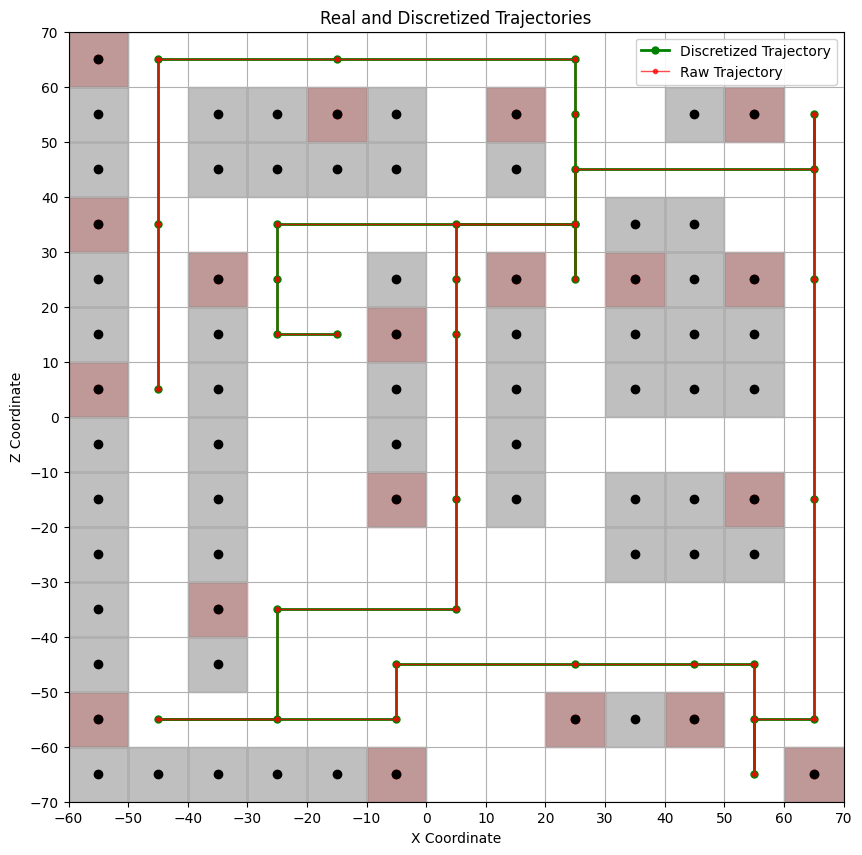

NN path distance:  740.0


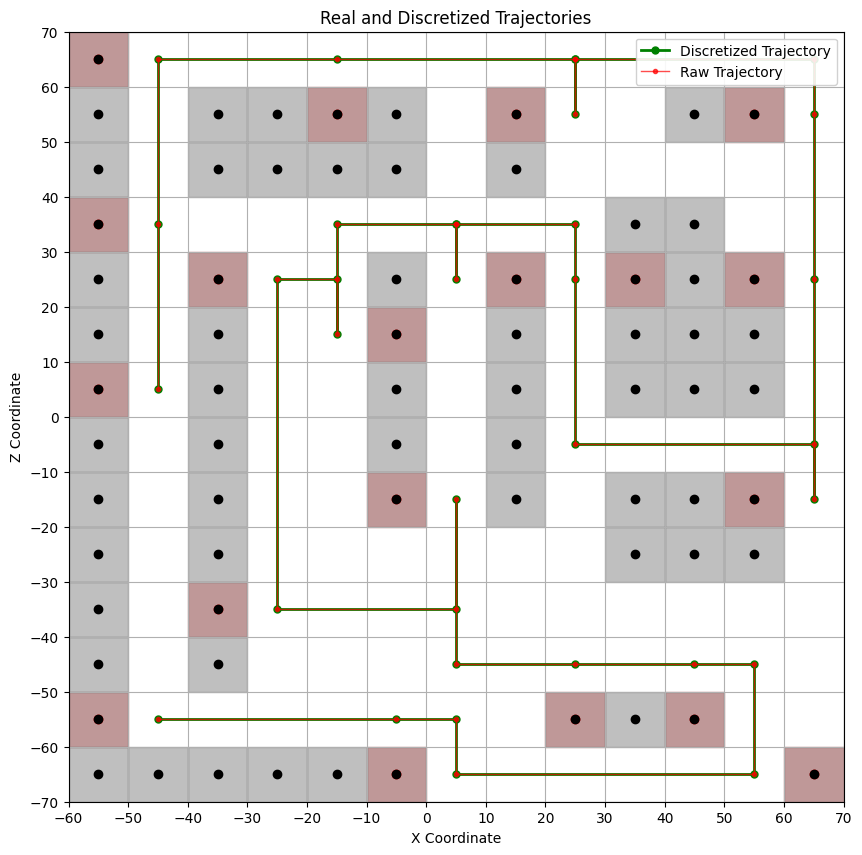

LK path distance:  780.0


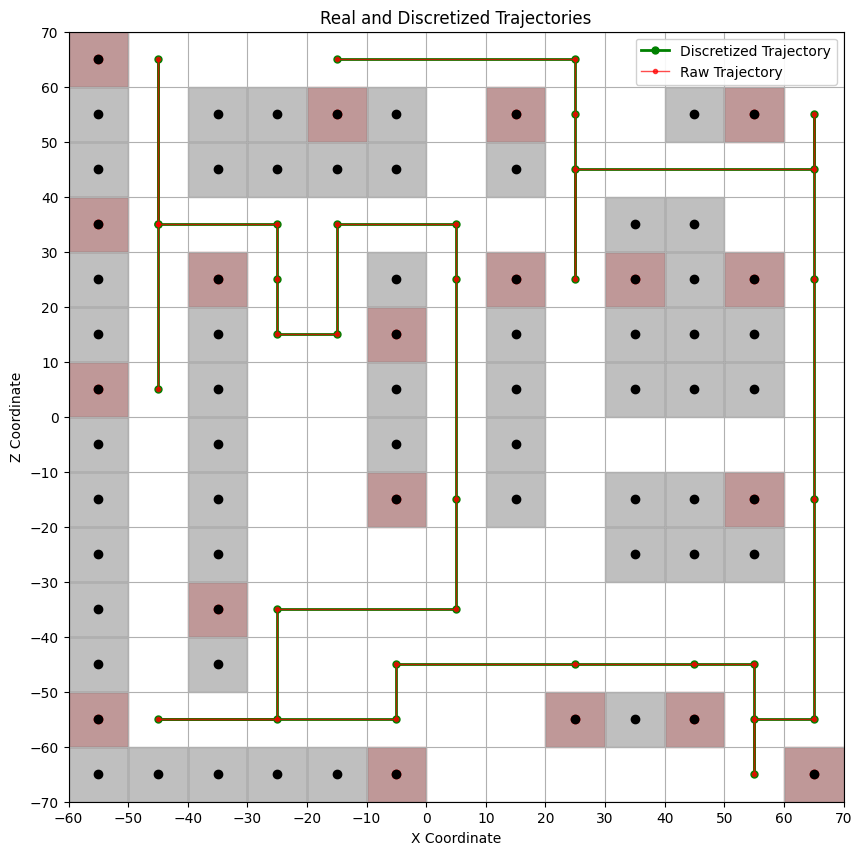

CH (cheapest insertion) path distance:  730.0


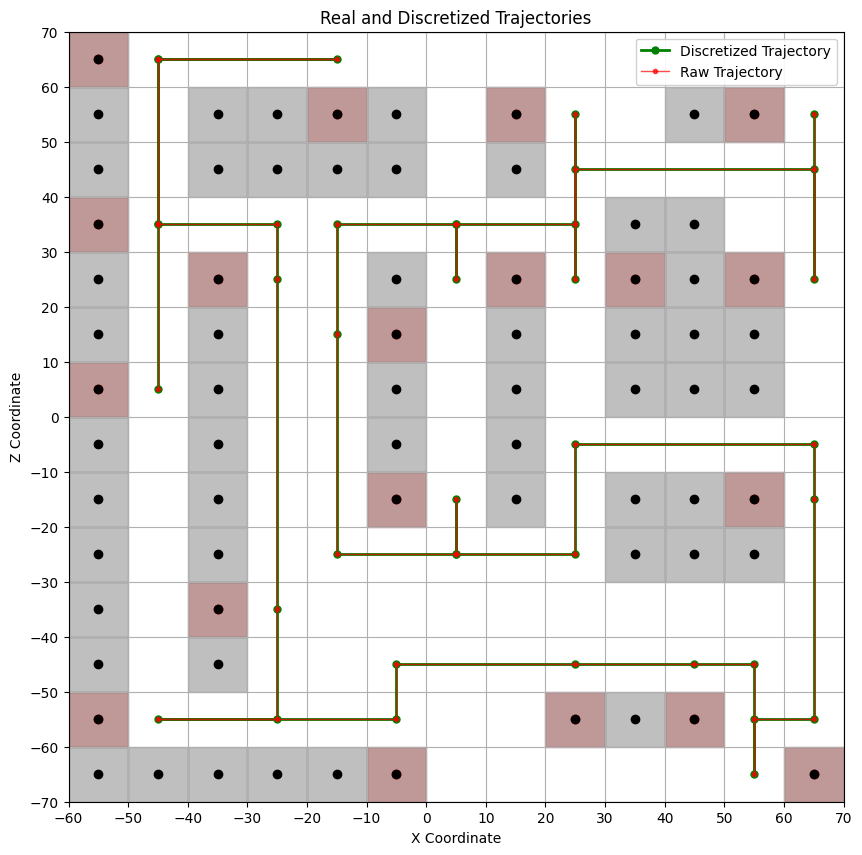

CH (largest interior angle) path distance:  880.0


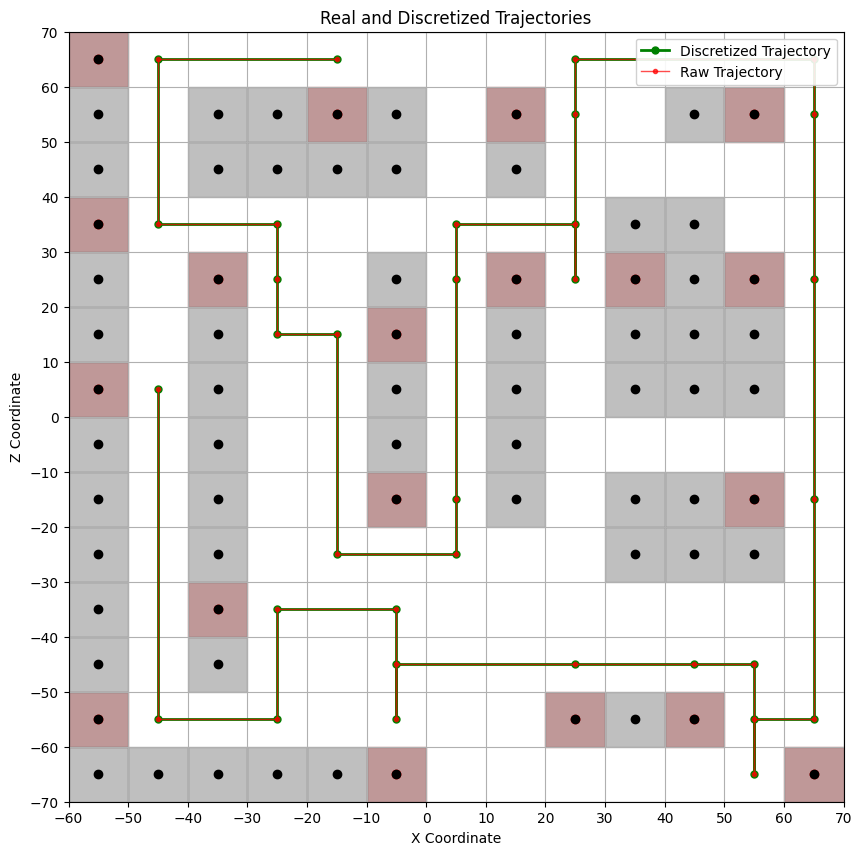

NN Reverse path distance:  710.0


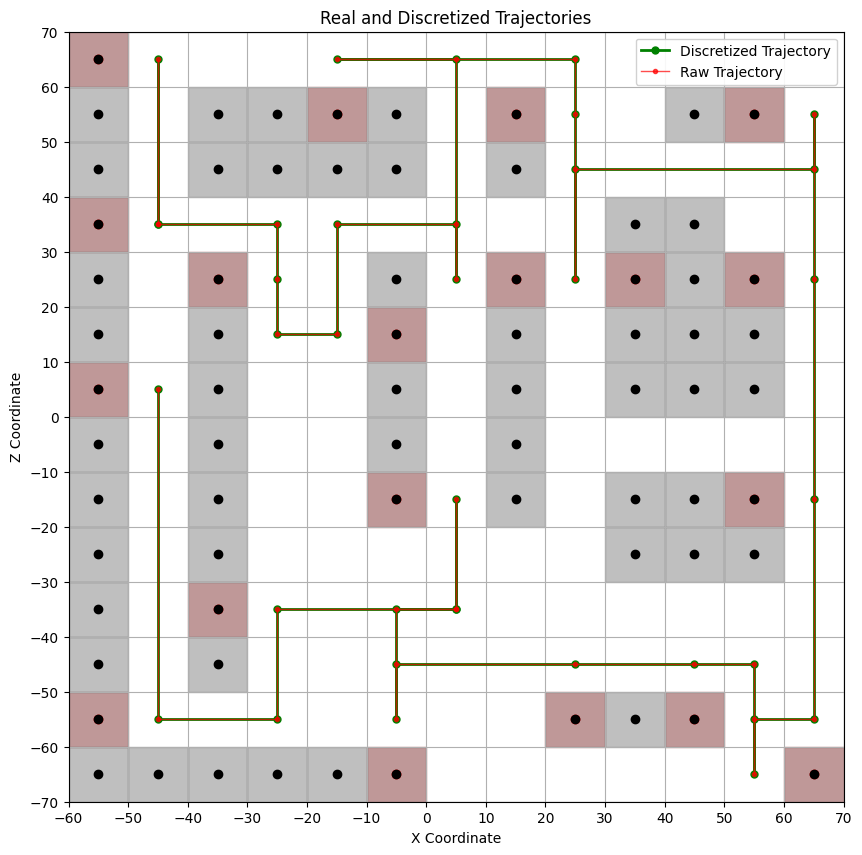

CH (cheapest insertion) counterclockwise path distance:  790.0


In [ ]:
nn_solution = []
nn_solution.append((-45, 5))
nn_solution.append((-45, 35))
nn_solution.append((-45, 65))
nn_solution.append((-15, 65))
nn_solution.append((25, 65))
nn_solution.append((25, 55))
nn_solution.append((25, 25))
nn_solution.append((25, 35))
nn_solution.append((5, 35))
nn_solution.append((5, 25))
nn_solution.append((5, 15))
nn_solution.append((5, -15))
nn_solution.append((5, -35))
nn_solution.append((-25, -35))
nn_solution.append((-25, -55))
nn_solution.append((-45, -55))
nn_solution.append((-5, -55))
nn_solution.append((-5, -45))
nn_solution.append((25, -45))
nn_solution.append((45, -45))
nn_solution.append((55, -45))
nn_solution.append((55, -65))
nn_solution.append((55, -55))
nn_solution.append((65, -55))
nn_solution.append((65, -15))
nn_solution.append((65, 25))
nn_solution.append((65, 55))
nn_solution.append((65, 45))
nn_solution.append((25, 45))
nn_solution.append((25, 35))
nn_solution.append((-25, 35))
nn_solution.append((-25, 25))
nn_solution.append((-25, 15))
nn_solution.append((-15, 15))
graph_data(nn_solution)
print('NN path distance: ', distance(nn_solution))


lk_solution = []
lk_solution.append((-45, 5))
lk_solution.append((-45, 35))
lk_solution.append((-45, 65))
lk_solution.append((-15, 65))
lk_solution.append((25, 65))
lk_solution.append((25, 55))
lk_solution.append((25, 65))
lk_solution.append((65, 65))
lk_solution.append((65, 55))
lk_solution.append((65, 25))
lk_solution.append((65, -15))
lk_solution.append((65, -5))
lk_solution.append((25, -5))
lk_solution.append((25, 25))
lk_solution.append((25, 35))
lk_solution.append((5, 35))
lk_solution.append((5, 25))
lk_solution.append((5, 35))
lk_solution.append((-15, 35))
lk_solution.append((-15, 15))
lk_solution.append((-15, 25))
lk_solution.append((-25, 25))
lk_solution.append((-25, -35))
lk_solution.append((5, -35))
lk_solution.append((5, -15))
lk_solution.append((5, -45))
lk_solution.append((25, -45))
lk_solution.append((45, -45))
lk_solution.append((55, -45))
lk_solution.append((55, -65))
lk_solution.append((5, -65))
lk_solution.append((5, -55))
lk_solution.append((-5, -55))
lk_solution.append((-45, -55))
graph_data(lk_solution)
print('LK path distance: ', distance(lk_solution))


ch_cheapest_insertion = []
ch_cheapest_insertion.append((-45, 5))
ch_cheapest_insertion.append((-45, 35))
ch_cheapest_insertion.append((-45, 65))
ch_cheapest_insertion.append((-45, 35))
ch_cheapest_insertion.append((-25, 35))
ch_cheapest_insertion.append((-25, 25))
ch_cheapest_insertion.append((-25, 15))
ch_cheapest_insertion.append((-15, 15))
ch_cheapest_insertion.append((-15, 35))
ch_cheapest_insertion.append((5, 35))
ch_cheapest_insertion.append((5, 25))
ch_cheapest_insertion.append((5, -15))
ch_cheapest_insertion.append((5, -35))
ch_cheapest_insertion.append((-25, -35))
ch_cheapest_insertion.append((-25, -55))
ch_cheapest_insertion.append((-45, -55))
ch_cheapest_insertion.append((-5, -55))
ch_cheapest_insertion.append((-5, -45))
ch_cheapest_insertion.append((25, -45))
ch_cheapest_insertion.append((45, -45))
ch_cheapest_insertion.append((55, -45))
ch_cheapest_insertion.append((55, -65))
ch_cheapest_insertion.append((55, -55))
ch_cheapest_insertion.append((65, -55))
ch_cheapest_insertion.append((65, -15))
ch_cheapest_insertion.append((65, 25))
ch_cheapest_insertion.append((65, 55))
ch_cheapest_insertion.append((65, 45))
ch_cheapest_insertion.append((25, 45))
ch_cheapest_insertion.append((25, 25))
ch_cheapest_insertion.append((25, 55))
ch_cheapest_insertion.append((25, 65))
ch_cheapest_insertion.append((-15, 65))
graph_data(ch_cheapest_insertion)
print('CH (cheapest insertion) path distance: ', distance(ch_cheapest_insertion))


ch_largest_angle = []
ch_largest_angle.append((-45, 5))
ch_largest_angle.append((-45, 35))
ch_largest_angle.append((-45, 65))
ch_largest_angle.append((-15, 65))
ch_largest_angle.append((-45, 65))
ch_largest_angle.append((-45, 35))
ch_largest_angle.append((-25, 35))
ch_largest_angle.append((-25, 25))
ch_largest_angle.append((-25, -35))
ch_largest_angle.append((-25, -55))
ch_largest_angle.append((-45, -55))
ch_largest_angle.append((-5, -55))
ch_largest_angle.append((-5, -45))
ch_largest_angle.append((25, -45))
ch_largest_angle.append((45, -45))
ch_largest_angle.append((55, -45))
ch_largest_angle.append((55, -65))
ch_largest_angle.append((55, -55))
ch_largest_angle.append((65, -55))
ch_largest_angle.append((65, -15))
ch_largest_angle.append((65, -5))
ch_largest_angle.append((25, -5))
ch_largest_angle.append((25, -25))
ch_largest_angle.append((5, -25))
ch_largest_angle.append((5, -15))
ch_largest_angle.append((5, -25))
ch_largest_angle.append((-15, -25))
ch_largest_angle.append((-15, 15))
ch_largest_angle.append((-15, 35))
ch_largest_angle.append((5, 35))
ch_largest_angle.append((5, 25))
ch_largest_angle.append((5, 35))
ch_largest_angle.append((25, 35))
ch_largest_angle.append((25, 55))
ch_largest_angle.append((25, 25))
ch_largest_angle.append((25, 45))
ch_largest_angle.append((65, 45))
ch_largest_angle.append((65, 25))
ch_largest_angle.append((65, 55))
graph_data(ch_largest_angle)
print('CH (largest interior angle) path distance: ', distance(ch_largest_angle))


nn_reverse = []
nn_reverse.append((-45, 5))
nn_reverse.append((-45, -55))
nn_reverse.append((-25, -55))
nn_reverse.append((-25, -35))
nn_reverse.append((-5, -35))
nn_reverse.append((-5, -55))
nn_reverse.append((-5, -45))
nn_reverse.append((25, -45))
nn_reverse.append((45, -45))
nn_reverse.append((55, -45))
nn_reverse.append((55, -65))
nn_reverse.append((55, -55))
nn_reverse.append((65, -55))
nn_reverse.append((65, -15))
nn_reverse.append((65, 25))
nn_reverse.append((65, 55))
nn_reverse.append((65, 65))
nn_reverse.append((25, 65))
nn_reverse.append((25, 55))
nn_reverse.append((25, 25))
nn_reverse.append((25, 35))
nn_reverse.append((5, 35))
nn_reverse.append((5, 25))
nn_reverse.append((5, -15))
nn_reverse.append((5, -25))
nn_reverse.append((-15, -25))
nn_reverse.append((-15, 15))
nn_reverse.append((-25, 15))
nn_reverse.append((-25, 25))
nn_reverse.append((-25, 35))
nn_reverse.append((-45, 35))
nn_reverse.append((-45, 65))
nn_reverse.append((-15, 65))
graph_data(nn_reverse)
print('NN Reverse path distance: ', distance(nn_reverse))


ch_cheapest_insertion_counterclockwise = []
ch_cheapest_insertion_counterclockwise.append((-45, 5))
ch_cheapest_insertion_counterclockwise.append((-45, -55))
ch_cheapest_insertion_counterclockwise.append((-25, -55))
ch_cheapest_insertion_counterclockwise.append((-25, -35))
ch_cheapest_insertion_counterclockwise.append((5, -35))
ch_cheapest_insertion_counterclockwise.append((5, -15))
ch_cheapest_insertion_counterclockwise.append((5, -35))
ch_cheapest_insertion_counterclockwise.append((-5, -35))
ch_cheapest_insertion_counterclockwise.append((-5, -55))
ch_cheapest_insertion_counterclockwise.append((-5, -45))
ch_cheapest_insertion_counterclockwise.append((25, -45))
ch_cheapest_insertion_counterclockwise.append((45, -45))
ch_cheapest_insertion_counterclockwise.append((55, -45))
ch_cheapest_insertion_counterclockwise.append((55, -65))
ch_cheapest_insertion_counterclockwise.append((55, -55))
ch_cheapest_insertion_counterclockwise.append((65, -55))
ch_cheapest_insertion_counterclockwise.append((65, -15))
ch_cheapest_insertion_counterclockwise.append((65, 25))
ch_cheapest_insertion_counterclockwise.append((65, 55))
ch_cheapest_insertion_counterclockwise.append((65, 45))
ch_cheapest_insertion_counterclockwise.append((25, 45))
ch_cheapest_insertion_counterclockwise.append((25, 25))
ch_cheapest_insertion_counterclockwise.append((25, 55))
ch_cheapest_insertion_counterclockwise.append((25, 65))
ch_cheapest_insertion_counterclockwise.append((-15, 65))
ch_cheapest_insertion_counterclockwise.append((5, 65))
ch_cheapest_insertion_counterclockwise.append((5, 25))
ch_cheapest_insertion_counterclockwise.append((5, 35))
ch_cheapest_insertion_counterclockwise.append((-15, 35))
ch_cheapest_insertion_counterclockwise.append((-15, 15))
ch_cheapest_insertion_counterclockwise.append((-25, 15))
ch_cheapest_insertion_counterclockwise.append((-25, 25))
ch_cheapest_insertion_counterclockwise.append((-25, 35))
ch_cheapest_insertion_counterclockwise.append((-45, 35))
ch_cheapest_insertion_counterclockwise.append((-45, 65))
ch_cheapest_insertion_counterclockwise.append((-45, 35))
graph_data(ch_cheapest_insertion_counterclockwise)
print('CH (cheapest insertion) counterclockwise path distance: ', distance(ch_cheapest_insertion_counterclockwise))

# **Full NN and GO Solutions**

In [ ]:
optimal_solution = []
optimal_solution.append((-45, 5))
optimal_solution.append((-45, 35))
optimal_solution.append((-25, 35))
optimal_solution.append((-25, 25))
optimal_solution.append((-25, 15))
optimal_solution.append((-15, 15))
optimal_solution.append((-15, 25))
optimal_solution.append((-15, 35))
optimal_solution.append((5, 35))
optimal_solution.append((5, 25))
optimal_solution.append((5, -15))
optimal_solution.append((5, -35))
optimal_solution.append((-25, -35))
optimal_solution.append((-25, -55))
optimal_solution.append((-45, -55))
optimal_solution.append((-5, -55))
optimal_solution.append((-5, -45))
optimal_solution.append((25, -45))
optimal_solution.append((45, -45))
optimal_solution.append((55, -45))
optimal_solution.append((55, -65))
optimal_solution.append((55, -55))
optimal_solution.append((65, -55))
optimal_solution.append((65, 55))
optimal_solution.append((65, 45))
optimal_solution.append((25, 45))
optimal_solution.append((25, 25))
optimal_solution.append((25, 55))
optimal_solution.append((25, 65))
optimal_solution.append((-45, 65))

optimal_solution2 = []
optimal_solution2.append((-45, 5))
optimal_solution2.append((-45, 35))
optimal_solution2.append((-45, 65))
optimal_solution2.append((-25, 65))
optimal_solution2.append((25, 65))
optimal_solution2.append((25, 55))
optimal_solution2.append((25, 25))
optimal_solution2.append((25, 45))
optimal_solution2.append((65, 45))
optimal_solution2.append((65, 55))
optimal_solution2.append((65, 25))
optimal_solution2.append((65, -15))
optimal_solution2.append((65, -45))
optimal_solution2.append((55, -45))
optimal_solution2.append((55, -65))
optimal_solution2.append((55, -45))
optimal_solution2.append((45, -45))
optimal_solution2.append((25, -45))
optimal_solution2.append((-5, -45))
optimal_solution2.append((-5, -55))
optimal_solution2.append((-45, -55))
optimal_solution2.append((-25, -55))
optimal_solution2.append((-25, -35))
optimal_solution2.append((5, -35))
optimal_solution2.append((5, -15))
optimal_solution2.append((5, 25))
optimal_solution2.append((5, 35))
optimal_solution2.append((-15, 35))
optimal_solution2.append((-15, 15))
optimal_solution2.append((-25, 15))
optimal_solution2.append((-25, 25))
print(distance(optimal_solution2))

optimal_solution3 = []
optimal_solution3.append((-45, 5))
optimal_solution3.append((-45, 35))
optimal_solution3.append((-45, 65))
optimal_solution3.append((-25, 65))
optimal_solution3.append((25, 65))
optimal_solution3.append((25, 55))
optimal_solution3.append((25, 25))
optimal_solution3.append((25, 45))
optimal_solution3.append((65, 45))
optimal_solution3.append((65, 55))
optimal_solution3.append((65, 25))
optimal_solution3.append((65, -15))
optimal_solution3.append((65, -45))
optimal_solution3.append((55, -45))
optimal_solution3.append((55, -65))
optimal_solution3.append((55, -45))
optimal_solution3.append((45, -45))
optimal_solution3.append((25, -45))
optimal_solution3.append((-5, -45))
optimal_solution3.append((-5, -55))
optimal_solution3.append((-45, -55))
optimal_solution3.append((-25, -55))
optimal_solution3.append((-25, -35))
optimal_solution3.append((5, -35))
optimal_solution3.append((5, -15))
optimal_solution3.append((5, 25))
optimal_solution3.append((5, 35))
optimal_solution3.append((-25, 35))
optimal_solution3.append((-25, 25))
optimal_solution3.append((-15, 25))
optimal_solution3.append((-15, 15))
print(distance(optimal_solution3))

optimal_solution4 = []
optimal_solution4.append((-45, 5))
optimal_solution4.append((-45, 35))
optimal_solution4.append((-45, 65))
optimal_solution4.append((-25, 65))
optimal_solution4.append((25, 65))
optimal_solution4.append((25, 55))
optimal_solution4.append((25, 25))
optimal_solution4.append((25, 35))
optimal_solution4.append((5, 35))
optimal_solution4.append((5, 25))
optimal_solution4.append((5, -15))
optimal_solution4.append((5, -25))
optimal_solution4.append((-15, -25))
optimal_solution4.append((-15, 15))
optimal_solution4.append((-25, 15))
optimal_solution4.append((-25, 25))
optimal_solution4.append((-25, -35))
optimal_solution4.append((-25, -55))
optimal_solution4.append((-45, -55))
optimal_solution4.append((-5, -55))
optimal_solution4.append((-5, -45))
optimal_solution4.append((25, -45))
optimal_solution4.append((45, -45))
optimal_solution4.append((55, -45))
optimal_solution4.append((55, -65))
optimal_solution4.append((55, -55))
optimal_solution4.append((65, -55))
optimal_solution4.append((65, -15))
optimal_solution4.append((65, 25))
optimal_solution4.append((65, 55))
print(distance(optimal_solution4))

optimal_solution5 = []
optimal_solution5.append((-45, 5))
optimal_solution5.append((-45, 35))
optimal_solution5.append((-45, 65))
optimal_solution5.append((-25, 65))
optimal_solution5.append((25, 65))
optimal_solution5.append((25, 55))
optimal_solution5.append((25, 25))
optimal_solution5.append((25, 35))
optimal_solution5.append((5, 35))
optimal_solution5.append((5, 25))
optimal_solution5.append((5, 35))
optimal_solution5.append((-25, 35))
optimal_solution5.append((-25, 25))
optimal_solution5.append((-25, 15))
optimal_solution5.append((-15, 15))
optimal_solution5.append((-15, -25))
optimal_solution5.append((5, -25))
optimal_solution5.append((5, -15))
optimal_solution5.append((5, -35))
optimal_solution5.append((-25, -35))
optimal_solution5.append((-25, -55))
optimal_solution5.append((-45, -55))
optimal_solution5.append((-5, -55))
optimal_solution5.append((-5, -45))
optimal_solution5.append((25, -45))
optimal_solution5.append((45, -45))
optimal_solution5.append((55, -45))
optimal_solution5.append((55, -65))
optimal_solution5.append((55, -55))
optimal_solution5.append((65, -55))
optimal_solution5.append((65, -15))
optimal_solution5.append((65, 25))
optimal_solution5.append((65, 55))
print(distance(optimal_solution5))

optimal_solution6 = []
optimal_solution6.append((-45, 5))
optimal_solution6.append((-45, 35))
optimal_solution6.append((-45, 65))
optimal_solution6.append((-25, 65))
optimal_solution6.append((25, 65))
optimal_solution6.append((25, 55))
optimal_solution6.append((25, 25))
optimal_solution6.append((25, 35))
optimal_solution6.append((-15, 35))
optimal_solution6.append((-15, 15))
optimal_solution6.append((-25, 15))
optimal_solution6.append((-25, 25))
optimal_solution6.append((-25, 35))
optimal_solution6.append((5, 35))
optimal_solution6.append((5, 25))
optimal_solution6.append((5, -15))
optimal_solution6.append((5, -35))
optimal_solution6.append((-25, -35))
optimal_solution6.append((-25, -55))
optimal_solution6.append((-45, -55))
optimal_solution6.append((-5, -55))
optimal_solution6.append((-5, -45))
optimal_solution6.append((25, -45))
optimal_solution6.append((45, -45))
optimal_solution6.append((55, -45))
optimal_solution6.append((55, -65))
optimal_solution6.append((55, -55))
optimal_solution6.append((65, -55))
optimal_solution6.append((65, -15))
optimal_solution6.append((65, 25))
optimal_solution6.append((65, 55))
print(distance(optimal_solution6))

optimal_solution7 = []
optimal_solution7.append((-45, 5))
optimal_solution7.append((-45, 35))
optimal_solution7.append((-45, 65))
optimal_solution7.append((-25, 65))
optimal_solution7.append((25, 65))
optimal_solution7.append((25, 55))
optimal_solution7.append((25, 25))
optimal_solution7.append((25, 35))
optimal_solution7.append((-25, 35))
optimal_solution7.append((-25, 25))
optimal_solution7.append((-25, 25))
optimal_solution7.append((-25, 15))
optimal_solution7.append((-15, 15))
optimal_solution7.append((-15, 35))
optimal_solution7.append((5, 35))
optimal_solution7.append((5, 25))
optimal_solution7.append((5, -15))
optimal_solution7.append((5, -35))
optimal_solution7.append((-25, -35))
optimal_solution7.append((-25, -55))
optimal_solution7.append((-45, -55))
optimal_solution7.append((-5, -55))
optimal_solution7.append((-5, -45))
optimal_solution7.append((25, -45))
optimal_solution7.append((45, -45))
optimal_solution7.append((55, -45))
optimal_solution7.append((55, -65))
optimal_solution7.append((55, -55))
optimal_solution7.append((65, -55))
optimal_solution7.append((65, -15))
optimal_solution7.append((65, 25))
optimal_solution7.append((65, 55))
print(distance(optimal_solution7))

optimal_solution8 = []
optimal_solution8.append((-45, 5))
optimal_solution8.append((-45, 35))
optimal_solution8.append((-15, 35))
optimal_solution8.append((-15, 15))
optimal_solution8.append((-25, 15))
optimal_solution8.append((-25, 25))
optimal_solution8.append((-25, 35))
optimal_solution8.append((-45, 35))
optimal_solution8.append((-45, 65))
optimal_solution8.append((-15, 65))
optimal_solution8.append((25, 65))
optimal_solution8.append((25, 55))
optimal_solution8.append((25, 25))
optimal_solution8.append((25, 35))
optimal_solution8.append((5, 35))
optimal_solution8.append((5, 25))
optimal_solution8.append((5, -15))
optimal_solution8.append((5, -35))
optimal_solution8.append((-25, -35))
optimal_solution8.append((-25, -55))
optimal_solution8.append((-45, -55))
optimal_solution8.append((-5, -55))
optimal_solution8.append((-5, -45))
optimal_solution8.append((25, -45))
optimal_solution8.append((45, -45))
optimal_solution8.append((55, -45))
optimal_solution8.append((55, -65))
optimal_solution8.append((55, -55))
optimal_solution8.append((65, -55))
optimal_solution8.append((65, -15))
optimal_solution8.append((65, 25))
optimal_solution8.append((65, 55))
print(distance(optimal_solution8))

optimal_solution9 = []
optimal_solution9.append((-45, 5))
optimal_solution9.append((-45, 5))
optimal_solution9.append((-45, 35))
optimal_solution9.append((-25, 35))
optimal_solution9.append((-25, 25))
optimal_solution9.append((-25, 15))
optimal_solution9.append((-15, 15))
optimal_solution9.append((-15, 35))
optimal_solution9.append((-45, 35))
optimal_solution9.append((-45, 65))
optimal_solution9.append((-15, 65))
optimal_solution9.append((25, 65))
optimal_solution9.append((25, 55))
optimal_solution9.append((25, 25))
optimal_solution9.append((25, 35))
optimal_solution9.append((5, 35))
optimal_solution9.append((5, 25))
optimal_solution9.append((5, -15))
optimal_solution9.append((5, -35))
optimal_solution9.append((-25, -35))
optimal_solution9.append((-25, -55))
optimal_solution9.append((-45, -55))
optimal_solution9.append((-5, -55))
optimal_solution9.append((-5, -45))
optimal_solution9.append((25, -45))
optimal_solution9.append((45, -45))
optimal_solution9.append((55, -45))
optimal_solution9.append((55, -65))
optimal_solution9.append((55, -55))
optimal_solution9.append((65, -55))
optimal_solution9.append((65, -15))
optimal_solution9.append((65, 25))
optimal_solution9.append((65, 55))
print(distance(optimal_solution9))

optimal_solution10 = []
optimal_solution10.append((-45, 5))
optimal_solution10.append((-45, 35))
optimal_solution10.append((-15, 35))
optimal_solution10.append((-15, 15))
optimal_solution10.append((-25, 15))
optimal_solution10.append((-25, 25))
optimal_solution10.append((-25, 35))
optimal_solution10.append((-25, 65))
optimal_solution10.append((-45, 65))
optimal_solution10.append((-15, 65))
optimal_solution10.append((25, 65))
optimal_solution10.append((25, 55))
optimal_solution10.append((25, 25))
optimal_solution10.append((25, 35))
optimal_solution10.append((5, 35))
optimal_solution10.append((5, 25))
optimal_solution10.append((5, -15))
optimal_solution10.append((5, -35))
optimal_solution10.append((-25, -35))
optimal_solution10.append((-25, -55))
optimal_solution10.append((-45, -55))
optimal_solution10.append((-5, -55))
optimal_solution10.append((-5, -45))
optimal_solution10.append((25, -45))
optimal_solution10.append((45, -45))
optimal_solution10.append((55, -45))
optimal_solution10.append((55, -65))
optimal_solution10.append((55, -55))
optimal_solution10.append((65, -55))
optimal_solution10.append((65, -15))
optimal_solution10.append((65, 25))
optimal_solution10.append((65, 55))
print(distance(optimal_solution10))

optimal_solution11 = []
optimal_solution11.append((-45, 5))
optimal_solution11.append((-45, 35))
optimal_solution11.append((-25, 35))
optimal_solution11.append((-25, 25))
optimal_solution11.append((-25, 15))
optimal_solution11.append((-15, 15))
optimal_solution11.append((-15, 35))
optimal_solution11.append((-45, 35))
optimal_solution11.append((-45, 65))
optimal_solution11.append((-15, 65))
optimal_solution11.append((25, 65))
optimal_solution11.append((25, 55))
optimal_solution11.append((25, 25))
optimal_solution11.append((25, 35))
optimal_solution11.append((5, 35))
optimal_solution11.append((5, 25))
optimal_solution11.append((5, -15))
optimal_solution11.append((5, -35))
optimal_solution11.append((-25, -35))
optimal_solution11.append((-25, -55))
optimal_solution11.append((-45, -55))
optimal_solution11.append((-5, -55))
optimal_solution11.append((-5, -45))
optimal_solution11.append((25, -45))
optimal_solution11.append((45, -45))
optimal_solution11.append((55, -45))
optimal_solution11.append((55, -65))
optimal_solution11.append((55, -55))
optimal_solution11.append((65, -55))
optimal_solution11.append((65, -15))
optimal_solution11.append((65, 25))
optimal_solution11.append((65, 55))
print(distance(optimal_solution11))

optimal_solution12 = []
optimal_solution12.append((-45, 5))
optimal_solution12.append((-45, 35))
optimal_solution12.append((-45, 65))
optimal_solution12.append((-15, 65))
optimal_solution12.append((25, 65))
optimal_solution12.append((25, 55))
optimal_solution12.append((25, 25))
optimal_solution12.append((25, 35))
optimal_solution12.append((5, 35))
optimal_solution12.append((5, 25))
optimal_solution12.append((5, 35))
optimal_solution12.append((-15, 35))
optimal_solution12.append((-15, 15))
optimal_solution12.append((-25, 15))
optimal_solution12.append((-25, 25))
optimal_solution12.append((-25, -35))
optimal_solution12.append((-25, -55))
optimal_solution12.append((-45, -55))
optimal_solution12.append((-5, -55))
optimal_solution12.append((-5, -35))
optimal_solution12.append((5, -35))
optimal_solution12.append((5, -15))
optimal_solution12.append((5, -45))
optimal_solution12.append((25, -45))
optimal_solution12.append((45, -45))
optimal_solution12.append((55, -45))
optimal_solution12.append((55, -65))
optimal_solution12.append((55, -55))
optimal_solution12.append((65, -55))
optimal_solution12.append((65, -15))
optimal_solution12.append((65, 25))
optimal_solution12.append((65, 55))
print(distance(optimal_solution12))

optimal_solution13 = []
optimal_solution13.append((-45, 5))
optimal_solution13.append((-45, 35))
optimal_solution13.append((-45, 65))
optimal_solution13.append((-15, 65))
optimal_solution13.append((25, 65))
optimal_solution13.append((25, 55))
optimal_solution13.append((25, 25))
optimal_solution13.append((25, 35))
optimal_solution13.append((5, 35))
optimal_solution13.append((5, 25))
optimal_solution13.append((5, 35))
optimal_solution13.append((-25, 35))
optimal_solution13.append((-25, 25))
optimal_solution13.append((-25, 15))
optimal_solution13.append((-15, 15))
optimal_solution13.append((-15, -35))
optimal_solution13.append((-25, -35))
optimal_solution13.append((-25, -55))
optimal_solution13.append((-45, -55))
optimal_solution13.append((-5, -55))
optimal_solution13.append((-5, -35))
optimal_solution13.append((5, -35))
optimal_solution13.append((5, -15))
optimal_solution13.append((5, -45))
optimal_solution13.append((25, -45))
optimal_solution13.append((45, -45))
optimal_solution13.append((55, -45))
optimal_solution13.append((55, -65))
optimal_solution13.append((55, -55))
optimal_solution13.append((65, -55))
optimal_solution13.append((65, -15))
optimal_solution13.append((65, 25))
optimal_solution13.append((65, 55))
print(distance(optimal_solution13))

optimal_solution14 = []
optimal_solution14.append((-45, 5))
optimal_solution14.append((-45, -55))
optimal_solution14.append((-25, -55))
optimal_solution14.append((-25, -35))
optimal_solution14.append((-15, -35))
optimal_solution14.append((-15, 15))
optimal_solution14.append((-25, 15))
optimal_solution14.append((-25, 25))
optimal_solution14.append((-25, 35))
optimal_solution14.append((-45, 35))
optimal_solution14.append((-45, 65))
optimal_solution14.append((-15, 65))
optimal_solution14.append((25, 65))
optimal_solution14.append((25, 55))
optimal_solution14.append((25, 25))
optimal_solution14.append((25, 35))
optimal_solution14.append((5, 35))
optimal_solution14.append((5, 25))
optimal_solution14.append((5, -15))
optimal_solution14.append((5, -35))
optimal_solution14.append((-5, -35))
optimal_solution14.append((-5, -55))
optimal_solution14.append((-5, -45))
optimal_solution14.append((25, -45))
optimal_solution14.append((45, -45))
optimal_solution14.append((55, -45))
optimal_solution14.append((55, -65))
optimal_solution14.append((55, -55))
optimal_solution14.append((65, -55))
optimal_solution14.append((65, -15))
optimal_solution14.append((65, 25))
optimal_solution14.append((65, 55))
print(distance(optimal_solution14))

optimal_solution15 = []
optimal_solution15.append((-45, 5))
optimal_solution15.append((-45, -55))
optimal_solution15.append((-5, -55))
optimal_solution15.append((-5, -35))
optimal_solution15.append((-25, -35))
optimal_solution15.append((-15, -35))
optimal_solution15.append((-15, 15))
optimal_solution15.append((-25, 15))
optimal_solution15.append((-25, 25))
optimal_solution15.append((-25, 35))
optimal_solution15.append((-45, 35))
optimal_solution15.append((-45, 65))
optimal_solution15.append((-15, 65))
optimal_solution15.append((25, 65))
optimal_solution15.append((25, 55))
optimal_solution15.append((25, 25))
optimal_solution15.append((25, 25))
optimal_solution15.append((25, 35))
optimal_solution15.append((5, 35))
optimal_solution15.append((5, 25))
optimal_solution15.append((5, 25))
optimal_solution15.append((5, -15))
optimal_solution15.append((5, -45))
optimal_solution15.append((25, -45))
optimal_solution15.append((45, -45))
optimal_solution15.append((55, -45))
optimal_solution15.append((55, -65))
optimal_solution15.append((55, -55))
optimal_solution15.append((65, -55))
optimal_solution15.append((65, -15))
optimal_solution15.append((65, 25))
optimal_solution15.append((65, 55))
print(distance(optimal_solution15))

optimal_solutions = [optimal_solution, optimal_solution2, optimal_solution3, optimal_solution4, optimal_solution5, optimal_solution6,
                     optimal_solution7, optimal_solution8, optimal_solution9, optimal_solution10, optimal_solution11, optimal_solution12,
                     optimal_solution13, optimal_solution14, optimal_solution15]

700.0
700.0
700.0
700.0
700.0
700.0
700.0
700.0
700.0
700.0
700.0
700.0
700.0
700.0


In [ ]:
#Path distance = 720
nearest_neighbors1 = [(-45, 5), (-45, 35), (-25, 35), (-25, 25), (-25, 15), (-15, 15), (-15, 35), (5, 35), (5, 25), (5, -15), (5, -35), (-25, -35), (-25, -55), (-45, -55),
                      (-5, -55), (-5, -45), (25, -45), (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 65), (25, 65), (25, 55),
                      (25, 25), (25, 65), (-15, 65), (-45, 65)]

#Path distance = 740
nearest_neighbors2 = [(-45, 5), (-45, 35), (-45, 65), (-15, 65), (25, 65), (25, 55), (25, 25), (25, 35), (5, 35), (5, 25), (5, -15), (5, -35), (-25, -35), (-25, -55),
                      (-45, -55), (-5, -55), (-5, -45), (25, -45), (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 45), (25, 45),
                      (25, 35), (-15, 35), (-15, 15), (-25, 15), (-25, 25)]

nearest_neighbors3 = [(-45, 5), (-45, 35), (-45, 65), (-15, 65), (25, 65), (25, 55), (25, 25), (25, 35), (5, 35), (5, 25), (5, -15), (5, -35), (-25, -35), (-25, -55),
                      (-45, -55), (-5, -55), (-5, -45), (25, -45), (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 45), (25, 45),
                      (25, 35), (-25, 35), (-25, 25), (-25, 15), (-15, 15)]

nearest_neighbors4 = [(-45, 5), (-45, 35), (-25, 35), (-25, 25), (-25, 15), (-15, 15), (-15, 35), (5, 35), (5, 25), (5, -15), (5, -35), (-5, -35), (-5, -55), (-45, -55),
                      (-25, -55), (-25, -35), (5, -35), (5, -45), (25, -45), (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 65),
                      (25, 65), (25, 55), (25, 25), (25, 65), (-15, 65), (-45, 65)]

nearest_neighbors5 = [(-45, 5), (-45, 35), (-45, 65), (-15, 65), (25, 65), (25, 55), (25, 25), (25, 35), (5, 35), (5, 25), (5, -15), (5, -35), (-5, -35), (-5, -55), (-45, -55),
                      (-25, -55), (-25, -35), (-25, 25), (-15, 25), (-15, 15), (-15, -45), (25, -45), (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55)]

#Path distance = 760
nearest_neighbors6 = [(-45, 5), (-45, 35), (-45, 65), (-15, 65), (25, 65), (25, 55), (25, 25), (25, 35), (5, 35), (5, 25), (5, -15), (5, -35), (-5, -35), (-5, -55), (-45, -55),
                      (-25, -55), (-25, -35), (-25, -5), (-15, -5), (-15, 15), (-25, 15), (-25, 25), (-25, -35), (25, -35), (25, -45), (45, -45), (55, -45), (55, -65), (55, -55),
                      (65, -55), (65, -15), (65, 25), (65, 55)]

nearest_neighbors7 = [(-45, 5), (-45, 35), (-45, 65), (-15, 65), (25, 65), (25, 55), (25, 25), (25, 35), (5, 35), (5, 25), (5, -15), (5, -35), (-5, -35), (-5, -55), (-45, -55),
                      (-25, -55), (-25, -35), (5, -35), (5, -45), (25, -45), (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 45), (25, 45),
                      (25, 35), (-15, 35), (-15, 15), (-25, 15), (-25, 25)]

nearest_neighbors8 = [(-45, 5), (-45, 35), (-45, 65), (-15, 65), (25, 65), (25, 55), (25, 25), (25, 35), (5, 35), (5, 25), (5, -15), (5, -35), (-5, -35), (-5, -55), (-45, -55),
                      (-25, -55), (-25, -35), (5, -35), (5, -45), (25, -45), (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 45), (25, 45),
                      (25, 35), (-25, 35), (-25, 25), (-25, 15), (-15, 15)]

nearest_neighbors9 = [(-45, 5), (-45, 35), (-45, 65), (-15, 65), (25, 65), (25, 55), (25, 25), (25, 35), (5, 35), (5, 25), (5, -15), (5, -45), (25, -45), (45, -45), (55, -45),
                      (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 45), (25, 45), (25, 35), (-15, 35), (-15, 15), (-25, 15), (-25, 25), (-25, -35),
                      (-5, -35), (-5, -55), (-45, -55)]

nearest_neighbors10 = [(-45, 5), (-45, 35), (-45, 65), (-15, 65), (25, 65), (25, 55), (25, 25), (25, 35), (5, 35), (5, 25), (5, -15), (5, -35), (-5, -35), (-5, -55), (-5, -45), (25, -45),
                       (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 45), (25, 45), (25, 35), (-15, 35), (-15, 15), (-25, 15), (-25, 25),
                       (-25, -35), (-25, -55), (-45, -55)]

nearest_neighbors11 = [(-45, 5), (-45, 35), (-25, 35), (-25, 25), (-25, 15), (-15, 15), (-15, 35), (5, 35), (5, 25), (5, -15), (5, -35), (-5, -35), (-5, -55), (-5, -35), (-25, -35), (-25, -55),
                       (-45, -55), (-5, -55), (-5, -45), (25, -45), (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 65), (25, 65), (25, 55), (25, 25),
                       (25, 65), (-15, 65), (-45, 65)]

nearest_neighbors12 = [(-45, 5), (-45, 35), (-45, 65), (-15, 65), (25, 65), (25, 55), (25, 25), (25, 35), (5, 35), (5, 25), (5, -15), (5, -35), (-5, -35), (-5, -55), (-5, -45), (25, -45),
                       (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 45), (25, 45), (25, 35), (-25, 35), (-25, 25), (-25, 15), (-15, 15), (-15, -35),
                       (-25, -35), (-25, -55), (-45, -55)]

nearest_neighbors13 = [(-45, 5), (-45, 35), (-45, 65), (-15, 65), (25, 65), (25, 55), (25, 25), (25, 35), (5, 35), (5, 25), (5, -15), (5, -45), (25, -45), (45, -45), (55, -45),
                       (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 45), (25, 45), (25, 35), (-15, 35), (-15, 15), (-25, 15), (-25, 25), (-25, -35),
                       (-25, -55), (-45, -55), (-5, -55)]

nearest_neighbors14 = [(-45, 5), (-45, 35), (-45, 65), (-15, 65), (25, 65), (25, 55), (25, 25), (25, 35), (5, 35), (5, 25), (5, -15), (5, -45), (25, -45), (45, -45), (55, -45),
                       (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 45), (25, 45), (25, 35), (-25, 35), (-25, 25), (-25, 15), (-15, 15), (-15, -35),
                       (-25, -35), (-25, -55), (-5, -55), (-45, -55)]

nearest_neighbors15 = [(-45, 5), (-45, 35), (-45, 65), (-15, 65), (25, 65), (25, 55), (25, 25), (25, 35), (5, 35), (5, 25), (5, -15), (5, -45), (25, -45), (45, -45), (55, -45),
                       (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 45), (25, 45), (25, 35), (-25, 35), (-25, 25), (-25, 15), (-15, 15), (-15, -35),
                       (-25, -35), (-25, -55), (-45, -55), (-5, -55)]

nearest_neighbors16 = [(-45, 5), (-45, 35), (-25, 35), (-25, 25), (-25, 15), (-15, 15), (-15, 35), (5, 35), (5, 25), (5, 35), (25, 35), (25, 25), (25, 55), (25, 65), (-15, 65),
                       (-45, 65), (-45, -55), (-5, -55), (-5, -35), (-25, -35), (5, -35), (5, -15), (5, -45), (25, -45), (45, -45), (55, -45), (55, -65), (55, -55),
                       (65, -55), (65, -15), (65, 25), (65, 55)]

nearest_neighbors17 = [(-45, 5), (-45, 35), (-25, 35), (-25, 25), (-25, 15), (-15, 15), (-15, 35), (5, 35), (5, 25), (5, -15), (5, -35), (-25, -35), (-25, -55), (-5, -55), (-45, -55),
                       (-5, -55), (-5, -45), (25, -45), (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 65), (25, 65), (25, 55), (25, 25),
                       (25, 65), (-15, 65), (-45, 65)]

#Path distance = 770
nearest_neighbors18 = [(-45, 5), (-45, 35), (-45, 65), (-15, 65), (25, 65), (25, 55), (25, 25), (25, 35), (5, 35), (5, 25), (5, -15), (5, -35), (-5, -35), (-5, -55), (-45, -55),
                       (-25, -55), (-25, -35), (-25, -5), (-15, -5), (-15, 15), (-25, 15), (-25, 25), (-25, 35), (25, 35), (25, 45), (65, 45), (65, 55), (65, 25), (65, -15),
                       (65, -45), (45, -45), (25, -45), (55, -45), (55, -65)]

#Path distance = 780
nearest_neighbors19 = [(-45, 5), (-45, 35), (-45, 65), (-15, 65), (25, 65), (25, 55), (25, 25), (25, 35), (5, 35), (5, 25), (5, -15), (5, -35), (-5, -35), (-5, -55), (-25, -55),
                       (-25, -35), (-25, -55), (-45, -55), (-5, -55), (-5, -45), (25, -45), (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55),
                       (65, 45), (25, 45), (25, 35), (-15, 35), (-15, 15), (-25, 15), (-25, 25)]

nearest_neighbors20 = [(-45, 5), (-45, 35), (-45, 65), (-15, 65), (25, 65), (25, 55), (25, 25), (25, 35), (5, 35), (5, 25), (5, -15), (5, -35), (-5, -35), (-5, -55), (-25, -55),
                       (-25, -35), (-25, -55), (-45, -55), (-5, -55), (-5, -45), (25, -45), (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55),
                       (65, 45), (25, 45), (25, 35), (-25, 35), (-25, 25), (-25, 15), (-15, 15)]

nearest_neighbors21 = [(-45, 5), (-45, 35), (-45, 65), (-15, 65), (25, 65), (25, 55), (25, 25), (25, 35), (5, 35), (5, 25), (5, -15), (5, -35), (-25, -35), (-25, -55), (-5, -55), (-45, -55),
                       (-5, -55), (-5, -45), (25, -45), (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 45), (25, 45), (25, 35), (-25, 35),
                       (-25, 25), (-25, 15), (-15, 15)]

nearest_neighbors22 = [(-45, 5), (-45, 35), (-45, 65), (-15, 65), (25, 65), (25, 55), (25, 25), (25, 35), (5, 35), (5, 25), (5, -15), (5, -35), (-25, -35), (-25, -55), (-5, -55), (-45, -55),
                       (-5, -55), (-5, -45), (25, -45), (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 45), (25, 45), (25, 35), (-15, 35),
                       (-15, 15), (-25, 15), (-25, 25)]

#Path distance = 800
nearest_neighbors23 = [(-45, 5), (-45, 35), (-25, 35), (-25, 25), (-25, 15), (-15, 15), (-15, 35), (5, 35), (5, 25), (5, -15), (5, -45), (25, -45), (45, -45), (55, -45), (55, -65),
                       (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 65), (25, 65), (25, 55), (25, 25), (25, 65), (-15, 65), (-45, 65), (-45, 35), (-25, 35), (-25, -35),
                       (-25, -55), (-5, -55), (-45, -55)]

nearest_neighbors24 = [(-45, 5), (-45, 35), (-25, 35), (-25, 25), (-25, 15), (-15, 15), (-15, 35), (5, 35), (5, 25), (5, -15), (5, -35), (-25, -35), (-25, -55), (-5, -55), (-5, -45),
                       (25, -45), (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 65), (25, 65), (25, 55), (25, 25), (25, 65), (-15, 65),
                       (-45, 65), (-45, -55)]

nearest_neighbors25 = [(-45, 5), (-45, 35), (-45, 65), (-15, 65), (25, 65), (25, 55), (25, 25), (25, 35), (5, 35), (5, 25), (5, -15), (5, -35), (-25, -35), (-25, -55), (-5, -55), (-5, -45),
                       (25, -45), (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 45), (25, 45), (25, 35), (-15, 35), (-15, 15), (-25, 15),
                       (-25, 25), (-25, -55), (-45, -55)]

nearest_neighbors26 = [(-45, 5), (-45, 35), (-25, 35), (-25, 25), (-25, 15), (-15, 15), (-15, 35), (5, 35), (5, 25), (5, -15), (5, -45), (25, -45), (45, -45), (55, -45), (55, -65),
                       (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 65), (25, 65), (25, 55), (25, 25), (25, 65), (-15, 65), (-45, 65), (-45, -55), (-25, -55), (-25, -35),
                       (-25, -55), (-5, -55)]

nearest_neighbors27 = [(-45, 5), (-45, 35), (-45, 65), (-15, 65), (25, 65), (25, 55), (25, 25), (25, 35), (5, 35), (5, 25), (5, -15), (5, -35), (-25, -35), (-25, -55), (-5, -55),
                       (-5, -45), (25, -45), (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 45), (25, 45), (25, 35), (-25, 35), (-25, 25),
                       (-25, 15), (-15, 15), (-15, -55), (-45, -55)]

nearest_neighbors28 = [(-45, 5), (-45, 35), (-25, 35), (-25, 25), (-25, 15), (-15, 15), (-15, 35), (5, 35), (5, 25), (5, -15), (5, -45), (25, -45), (45, -45), (55, -45), (55, -65),
                       (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 65), (25, 65), (25, 55), (25, 25), (25, 65), (-15, 65), (-45, 65), (-45, -55), (-5, -55),
                       (-25, -55), (-25, -35)]

nearest_neighbors29 = [(-45, 5), (-45, 35), (-25, 35), (-25, 25), (-25, 15), (-15, 15), (-15, 35), (5, 35), (5, 25), (5, -15), (5, -45), (25, -45), (45, -45), (55, -45), (55, -65),
                       (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 65), (25, 65), (25, 55), (25, 25), (25, 65), (-15, 65), (-45, 65), (-45, 35), (-25, 35), (-25, -35),
                       (-25, -55), (-45, -55), (-5, -55)]

nearest_neighbors30 = [(-45, 5), (-45, 35), (-25, 35), (-25, 25), (-25, 15), (-15, 15), (-15, 35), (5, 35), (5, 25), (5, -15), (5, -35), (-5, -35), (-5, -55), (-5, -45), (25, -45),
                       (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 65), (25, 65), (25, 55), (25, 25), (25, 65), (-15, 65), (-45, 65),
                       (-45, -55), (-25, -55), (-25, -35)]

nearest_neighbors31 = [(-45, 5), (-45, 35), (-25, 35), (-25, 25), (-25, 15), (-15, 15), (-15, 35), (5, 35), (5, 25), (5, -15), (5, -35), (-5, -35), (-5, -55), (-5, -45), (25, -45),
                       (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 65), (25, 65), (25, 55), (25, 25), (25, 65), (-15, 65), (-45, 65),
                       (-45, 35), (-25, 35), (-25, -35), (-25, -55), (-45, -55)]

#Path distance = 810
nearest_neighbors32 = [(-45, 5), (-45, 35), (-25, 35), (-25, 25), (-25, 15), (-15, 15), (-15, 35), (5, 35), (5, 25), (5, 35), (25, 35), (25, 25), (25, 55), (25, 65), (-15, 65),
                       (-45, 65), (65, 65), (65, 55), (65, 25), (65, -15), (65, -45), (45, -45), (25, -45), (-5, -45), (-5, -55), (-45, -55), (-25, -55), (-25, -35), (5, -35),
                       (5, -15), (5, -65), (55, -65)]

#Path distance = 830
nearest_neighbors33 = [(-45, 5), (-45, 35), (-25, 35), (-25, 25), (-25, 15), (-15, 15), (-15, 35), (5, 35), (5, 25), (5, 35), (25, 35), (25, 25), (25, 55), (25, 65), (-15, 65),
                       (-45, 65), (-45, -55), (-25, -55), (-25, -35), (-25, -55), (-5, -55), (-5, -45), (25, -45), (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15),
                       (65, 25), (65, 55), (65, 45), (25, 45), (25, 35), (5, 35), (5, -15)]

nearest_neighbors34 = [(-45, 5), (-45, 35), (-25, 35), (-25, 25), (-25, 15), (-15, 15), (-15, 35), (5, 35), (5, 25), (5, 35), (25, 35), (25, 25), (25, 55), (25, 65), (-15, 65),
                       (-45, 65), (-45, 35), (-25, 35), (-25, -35), (-25, -55), (-45, -55), (-5, -55), (-5, -45), (25, -45), (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15),
                       (65, 25), (65, 55), (65, 45), (25, 45), (25, 35), (5, 35), (5, -15)]

#Path distance = 840
nearest_neighbors35 = [(-45, 5), (-45, 35), (-25, 35), (-25, 25), (-25, 15), (-15, 15), (-15, 35), (5, 35), (5, 25), (5, 35), (25, 35), (25, 25), (25, 55), (25, 65), (-15, 65),
                       (-45, 65), (-45, -55), (-5, -55), (-5, -45), (25, -45), (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 45), (25, 45), (25, 35),
                        (5, 35), (5, -15), (5, -35), (-25, -35)]

#Path distance = 850
nearest_neighbors36 = [(-45, 5), (-45, 35), (-25, 35), (-25, 25), (-25, 15), (-15, 15), (-15, 35), (5, 35), (5, 25), (5, 35), (25, 35), (25, 25), (25, 55), (25, 65), (-15, 65),
                       (-45, 65), (65, 65), (65, 55), (65, 25), (65, -15), (65, -45), (45, -45), (25, -45), (-5, -45), (-5, -55), (-25, -55), (-25, -35), (-25, -55), (-45, -55), (-5, -55),
                       (-5, -35), (5, -35),  (5, -15), (5, -65), (55, -65)]

#Path distance = 870
nearest_neighbors37 = [(-45, 5), (-45, 35), (-25, 35), (-25, 25), (-25, 15), (-15, 15), (-15, 35), (5, 35), (5, 25), (5, 35), (25, 35), (25, 25), (25, 55), (25, 65), (-15, 65),
                       (-45, 65), (-45, 35), (-25, 35), (-25, -35), (-25, -55), (-5, -55), (-45, -55), (-5, -55), (-5, -45), (25, -45), (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15),
                       (65, 25), (65, 55), (65, 45), (25, 45), (25, 35), (5, 35), (5, -15)]

#Path distance = 880
nearest_neighbors38 = [(-45, 5), (-45, 35), (-25, 35), (-25, 25), (-25, 15), (-15, 15), (-15, 35), (5, 35), (5, 25), (5, 35), (25, 35), (25, 25), (25, 55), (25, 65), (-15, 65), (-45, 65),
                       (-45, 35), (-25, 35), (-25, -35), (-25, -55), (-5, -55), (-5, -45), (25, -45), (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55),
                       (65, 45), (25, 45), (25, 35), (5, 35), (5, -15), (5, -55), (-45, -55)]

#Path distance = 710
nearest_neighbors_reverse1 = [(-45, 5), (-45, -55), (-25, -55), (-25, -35), (-25, -55), (-5, -55), (-5, -45), (25, -45), (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15),
                              (65, 25), (65, 55), (65, 65), (25, 65), (25, 55), (25, 25), (25, 35), (5, 35), (5, 25), (5, -15), (5, -25), (-15, -25), (-15, 15), (-25, 15), (-25, 25),
                              (-25, 35), (-45, 35), (-45, 65), (-15, 65)]

nearest_neighbors_reverse2 = [(-45, 5), (-45, -55), (-5, -55), (-5, -45), (25, -45), (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 65), (25, 65),
                              (25, 55), (25, 25), (25, 35), (5, 35), (5, 25), (5, -15), (5, -35), (-25, -35), (-25, -5), (-15, -5), (-15, 15), (-25, 15), (-25, 25), (-25, 35), (-45, 35),
                              (-45, 65), (-15, 65)]

#Path distance = 730
nearest_neighbors_reverse3 = [(-45, 5), (-45, -55), (-5, -55), (-5, -45), (25, -45), (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55), (65, 65), (25, 65),
                              (25, 55), (25, 25), (25, 35), (5, 35), (5, 25), (5, -15), (5, -35), (-25, -35), (-25, 25), (-15, 25), (-15, 15), (-15, 35), (-45, 35), (-45, 65), (-15, 65)]


#Path distance = 740
nearest_neighbors_reverse4 = [(-45, 5), (-45, -55), (-5, -55), (-25, -55), (-25, -35), (5, -35), (5, -15), (5, 25), (5, 35), (25, 35), (25, 25), (25, 55), (25, 65), (-15, 65), (-45, 65),
                              (-45, 35), (-25, 35), (-25, 25), (-25, 15), (-15, 15), (-15, -45), (25, -45), (45, -45), (55, -45), (55, -65), (55, -55), (65, -55), (65, -15), (65, 25), (65, 55)]

nn_solutions = [
    nearest_neighbors1, nearest_neighbors2, nearest_neighbors3, nearest_neighbors4, nearest_neighbors5,
    nearest_neighbors6, nearest_neighbors7, nearest_neighbors8, nearest_neighbors9, nearest_neighbors10,
    nearest_neighbors11, nearest_neighbors12, nearest_neighbors13, nearest_neighbors14, nearest_neighbors15,
    nearest_neighbors16, nearest_neighbors17, nearest_neighbors18, nearest_neighbors19, nearest_neighbors20,
    nearest_neighbors21, nearest_neighbors22, nearest_neighbors23, nearest_neighbors24, nearest_neighbors25,
    nearest_neighbors26, nearest_neighbors27, nearest_neighbors28, nearest_neighbors29, nearest_neighbors30,
    nearest_neighbors31, nearest_neighbors32, nearest_neighbors33, nearest_neighbors34, nearest_neighbors35,
    nearest_neighbors36, nearest_neighbors37, nearest_neighbors38, nearest_neighbors_reverse1, nearest_neighbors_reverse2,
    nearest_neighbors_reverse3, nearest_neighbors_reverse4
]

"""
nn_near_optimal = []
nn_normal = []
nn_normal_index = []
for nn in nn_solutions:
    min_frechet = float('inf')
    for go in optimal_solutions:
        frechet_dist = frechet(nn, go)
        if frechet_dist < min_frechet:
            min_frechet = frechet_dist
    print(min_frechet)
    if(min_frechet < 70):
        nn_near_optimal.append(nn)
    else:
        nn_normal.append(nn)
        index = nn_solutions.index(nn)+1
        nn_normal_index.append(index)
nn_solutions = nn_normal

print(nn_normal_index)
"""

"\nnn_near_optimal = []\nnn_normal = []\nnn_normal_index = []\nfor nn in nn_solutions:\n    min_frechet = float('inf')\n    for go in optimal_solutions:\n        frechet_dist = frechet(nn, go)\n        if frechet_dist < min_frechet:\n            min_frechet = frechet_dist\n    print(min_frechet)\n    if(min_frechet < 70):\n        nn_near_optimal.append(nn)\n    else:\n        nn_normal.append(nn)\n        index = nn_solutions.index(nn)+1\n        nn_normal_index.append(index)\nnn_solutions = nn_normal\n\nprint(nn_normal_index)\n"

In [ ]:
optimal_visited1 = [2, 3, 6, 10, 12, 11, 5, 1, 7, 16, 17, 18, 15, 14, 19, 13, 9, 8, 4]
optimal_visited2 = [2, 3, 4, 8, 9, 13, 19, 14, 15, 18, 17, 16, 7, 1, 5, 11, 12, 10, 6]
optimal_visited3 = [2, 3, 4, 8, 9, 13, 19, 14, 15, 18, 17, 16, 7, 1, 5, 11, 12, 6, 10]
optimal_visited4 = [2, 3, 4, 8, 9, 13, 12, 11, 10, 6, 5, 1, 7, 16, 17, 18, 15, 14, 19]
optimal_visited5 = [2, 3, 4, 8, 9, 13, 12, 6, 10, 11, 5, 1, 7, 16, 17, 18, 15, 14, 19]
optimal_visited6 = [2, 3, 4, 8, 9, 13, 10, 6, 12, 11, 5, 1, 7, 16, 17, 18, 15, 14, 19]
optimal_visited7 = [2, 3, 4, 8, 9, 13, 6, 10, 12, 11, 5, 1, 7, 16, 17, 18, 15, 14, 19]
optimal_visited8 = [2, 10, 6, 3, 4, 8, 9, 13, 12, 11, 5, 1, 7, 16, 17, 18, 15, 14, 19]
optimal_visited9 = [2, 6, 10, 3, 4, 8, 9, 13, 12, 11, 5, 1, 7, 16, 17, 18, 15, 14, 19]
optimal_visited10 = [2, 3, 10, 6, 4, 8, 9, 13, 12, 11, 5, 1, 7, 16, 17, 18, 15, 14, 19]
optimal_visited11 = [2, 3, 6, 10, 4, 8, 9, 13, 12, 11, 5, 1, 7, 16, 17, 18, 15, 14, 19]
optimal_visited12 = [2, 3, 4, 8, 9, 13, 12, 10, 6, 5, 1, 7, 11, 16, 17, 18, 15, 14, 19]
optimal_visited13 = [2, 3, 4, 8, 9, 13, 12, 6, 10, 5, 1, 7, 11, 16, 17, 18, 15, 14, 19]
optimal_visited14 = [2, 1, 5, 10, 6, 3, 4, 8, 9, 13, 12, 11, 7, 16, 17, 18, 15, 14, 19]
optimal_visited15 = [2, 1, 7, 5, 10, 6, 3, 4, 8, 9, 13, 12, 11, 16, 17, 18, 15, 14, 19]

optimal_visited_lists = [optimal_visited1, optimal_visited2, optimal_visited3, optimal_visited4, optimal_visited5, optimal_visited6, optimal_visited7, optimal_visited8,
                         optimal_visited9, optimal_visited10, optimal_visited11, optimal_visited12, optimal_visited13, optimal_visited14, optimal_visited15]

In [ ]:
nn_visited1 = [2, 3, 6, 10, 12, 11, 5, 1, 7, 16, 17, 18, 15, 14, 19, 9, 13, 8, 4]
nn_visited2 = [2, 3, 4, 8, 9, 13, 12, 11, 5, 1, 7, 16, 17, 18, 15, 14, 19, 10, 6]
nn_visited3 = [2, 3, 4, 8, 9, 13, 12, 11, 5, 1, 7, 16, 17, 18, 15, 14, 19, 6, 10]
nn_visited4 = [2, 3, 6, 10, 12, 11, 7, 1, 5, 16, 17, 18, 15, 14, 19, 9, 13, 8, 4]
nn_visited5 = [2, 3, 4, 8, 9, 13, 12, 11, 7, 1, 5, 6, 10, 16, 17, 18 ,15, 14, 19]
nn_visited6 = [2, 3, 4, 8, 9, 13, 12, 11, 7, 1, 5, 10, 6, 16, 17, 18, 15, 14, 19]
nn_visited7 = [2, 3, 4, 8, 9, 13, 12, 11, 7, 1, 5, 16, 17, 18, 15, 14, 19, 10, 6]
nn_visited8 = [2, 3, 4, 8, 9, 13, 12, 11, 7, 1, 5, 16, 17, 18, 15, 14, 19, 6, 10]
nn_visited9 = [2, 3, 4, 8, 9, 13, 12, 11, 16, 17, 18, 15, 14, 19, 10, 6, 5, 7, 1]
nn_visited10 = [2, 3, 4, 8, 9, 13, 12, 11, 7, 16, 17, 18, 15, 14, 19, 10, 6, 5, 1]
nn_visited11 = [2, 3, 6, 10, 12, 11, 7, 5, 1, 16, 17, 18, 15, 14, 19, 9, 13, 8, 4]
nn_visited12 = [2, 3, 4, 8, 9, 13, 12, 11, 7, 16, 17, 18, 15, 14, 19, 6, 10, 5, 1]
nn_visited13 = [2, 3, 4, 8, 9, 13, 12, 11, 16, 17, 18, 15, 14, 19, 10, 6, 5, 1, 7]
nn_visited14 = [2, 3, 4, 8, 9, 13, 12, 11, 16, 17, 18, 15, 14, 19, 10, 6, 5, 7, 1]
nn_visited15 = [2, 3, 4, 8, 9, 13, 12, 11, 16, 17, 18, 15, 14, 19, 6, 10, 5, 1, 7]
nn_visited16 = [2, 3, 6, 10, 12, 13, 9, 8, 4, 1, 7, 5, 11, 16, 17, 18, 15, 14, 19]
nn_visited17 = [2, 3, 6, 10, 12, 11, 5, 7, 1, 16, 17, 18, 15, 14, 19, 9, 13, 8, 4]
nn_visited18 = [2, 3, 4, 8, 9, 13, 12, 11, 7, 1, 5, 10, 6, 19, 14, 15, 17, 16, 18]
nn_visited19 = [2, 3, 4, 8, 9, 13, 12, 11, 7, 5, 1, 16, 17, 18, 15, 14, 19, 10, 6]
nn_visited20 = [2, 3, 4, 8, 9, 13, 12, 11, 7, 5, 1, 16, 17, 18, 15, 14, 19, 6, 10]
nn_visited21 = [2, 3, 4, 8, 9, 13, 12, 11, 5, 7, 1, 16, 17, 18, 15, 14, 19, 6, 10]
nn_visited22 = [2, 3, 4, 8, 9, 13, 12, 11, 5, 7, 1, 16, 17, 18, 15, 14, 19, 10, 6]
nn_visited23 = [2, 3, 6, 10, 12, 11, 16, 17, 18, 15, 14, 19, 9, 13, 8, 4, 5, 7, 1]
nn_visited24 = [2, 3, 6, 10, 12, 11, 5, 7, 16, 17, 18, 15, 14, 19, 9, 13, 8, 4, 1]
nn_visited25 = [2, 3, 4, 8, 9, 13, 12, 11, 5, 7, 16, 17, 18, 15, 14, 19, 10, 6, 1]
nn_visited26 = [2, 3, 6, 10, 12, 11, 16, 17, 18, 15, 14, 19, 9, 13, 8, 4, 1, 5, 7]
nn_visited27 = [2, 3, 4, 8, 9, 13, 12, 11, 5, 7, 16, 17, 18, 15, 14, 19, 6, 10, 1]
nn_visited28 = [2, 3, 6, 10, 12, 11, 16, 17, 18, 15, 14, 19, 9, 13, 8, 4, 1, 7, 5]
nn_visited29 = [2, 3, 6, 10, 12, 11, 16, 17, 18, 15, 14, 19, 9, 13, 8, 4, 5, 1, 7]
nn_visited30 = [2, 3, 6, 10, 12, 11, 7, 16, 17, 18, 15, 14, 19, 9, 13, 8, 4, 1, 5]
nn_visited31 = [2, 3, 6, 10, 12, 11, 7, 16, 17, 18, 15, 14, 19, 9, 13, 8, 4, 5, 1]
nn_visited32 = [2, 3, 6, 10, 12, 13, 9, 8, 4, 19, 14, 15, 17, 16, 7, 1, 5, 11, 18]
nn_visited33 = [2, 3, 6, 10, 12, 13, 9, 8, 4, 1, 5, 7, 16, 17, 18, 15, 14, 19, 11]
nn_visited34 = [2, 3, 6, 10, 12, 13, 9, 8, 4, 5, 1, 7, 16, 17, 18, 15, 14, 19, 11]
nn_visited35 = [2, 3, 6, 10, 12, 13, 9, 8, 4, 1, 7, 16, 17, 18, 15, 14, 19, 11, 5]
nn_visited36 = [2, 3, 6, 10, 12, 13, 9, 8, 4, 19, 14, 15, 17, 16, 7, 5, 1, 11, 18]
nn_visited37 = [2, 3, 6, 10, 12, 13, 9, 8, 4, 5, 7, 1, 16, 17, 18, 15, 14, 19, 11]
nn_visited38 = [2, 3, 6, 10, 12, 13, 9, 8, 4, 5, 7, 16, 17, 18, 15, 14, 19, 11, 1]

nn_reverse_visited1 = [2, 1, 5, 7, 16, 17, 18, 15, 14, 19, 9, 13, 12, 11, 10, 6, 3, 4, 8]
nn_reverse_visited2 = [2, 1, 7, 16, 17, 18, 15, 14, 19, 9, 13, 12, 11, 5, 10, 6, 3, 4, 8]
nn_reverse_visited3 = [2, 1, 7, 16, 17, 18, 15, 14, 19, 9, 13, 12, 11, 5, 6, 10, 3, 4, 8]
nn_reverse_visited4 = [2, 1, 7, 5, 11, 12, 13, 9, 8, 4, 3, 6, 10, 16, 17, 18, 15, 14, 19]


nn_visited_list = [nn_visited1, nn_visited2, nn_visited3, nn_visited4, nn_visited5, nn_visited6, nn_visited7, nn_visited8,nn_visited9, nn_visited10, nn_visited11,
                   nn_visited12, nn_visited13, nn_visited14, nn_visited15, nn_visited16, nn_visited17, nn_visited18, nn_visited19, nn_visited20, nn_visited21,
                   nn_visited22, nn_visited23, nn_visited24, nn_visited25, nn_visited26, nn_visited27, nn_visited28, nn_visited29, nn_visited30, nn_visited31,
                   nn_visited32, nn_visited33, nn_visited34, nn_visited35, nn_visited36, nn_visited37, nn_visited38, nn_reverse_visited1, nn_reverse_visited2,
                   nn_reverse_visited3, nn_reverse_visited4]

"""
nn_visited_list = [nn_visited9, nn_visited10, nn_visited12, nn_visited13, nn_visited14, nn_visited15, nn_visited18,
                   nn_visited23, nn_visited24, nn_visited25, nn_visited26, nn_visited27, nn_visited28, nn_visited29,
                   nn_visited30, nn_visited31, nn_visited32, nn_visited33, nn_visited34, nn_visited35, nn_visited36,
                   nn_visited37, nn_visited38, nn_reverse_visited2, nn_reverse_visited3]
"""

'\nnn_visited_list = [nn_visited9, nn_visited10, nn_visited12, nn_visited13, nn_visited14, nn_visited15, nn_visited18,\n                   nn_visited23, nn_visited24, nn_visited25, nn_visited26, nn_visited27, nn_visited28, nn_visited29,\n                   nn_visited30, nn_visited31, nn_visited32, nn_visited33, nn_visited34, nn_visited35, nn_visited36,\n                   nn_visited37, nn_visited38, nn_reverse_visited2, nn_reverse_visited3]\n'

In [ ]:
#toString function for an array
def arrToString(arr):
      newString = ''
      for i in range(len(arr)-1):
          newString += str(arr[i]) + ' -> '
      newString += str(arr[-1])
      return newString

# **Compare NN and GO Solution**

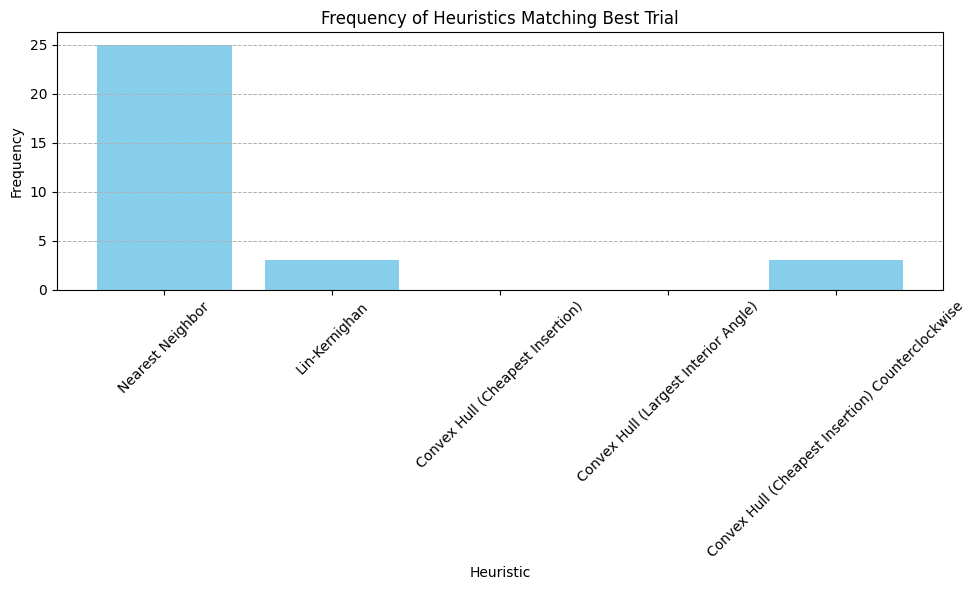

In [ ]:
#Finds the most similar heuristic for participants' best solution
def most_similar_heuristic():
    files = [f for f in listdir('OnlineNavigation/Navigation') if isfile(join('OnlineNavigation/Navigation', f))]

    nn_count, lk_count, ch_cheapest_insertion_count, ch_largest_angle_count, ch_cheapest_insertion_counterclockwise_count = 0, 0, 0, 0, 0
    for file in files:
        trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = trials(f'OnlineNavigation/Navigation/{file}')
        trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = convert_to_discrete(trial1), convert_to_discrete(trial2), convert_to_discrete(trial3), convert_to_discrete(trial4), convert_to_discrete(trial5), convert_to_discrete(trial6), convert_to_discrete(trial7), convert_to_discrete(trial8)
        trials_list = [trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8]
        best = best_trial(trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8)
        best_index = trials_list.index(best)

        frechet_nn = float('inf')
        nn = []
        for solution in nn_solutions:
            if frechet(best, solution) < frechet_nn:
                frechet_nn = frechet(best, solution)
                nn = solution

        frechet_lk = frechet(best, lk_solution)
        frechet_ch_cheapest_insertion = frechet(best, ch_cheapest_insertion)
        frechet_ch_largest_angle = frechet(best, ch_largest_angle)
        frechet_ch_counterclockwise = frechet(best, ch_cheapest_insertion_counterclockwise)

        frechet_dists = [frechet_nn, frechet_lk, frechet_ch_cheapest_insertion, frechet_ch_largest_angle, frechet_ch_counterclockwise]
        if(frechet_nn == min(frechet_dists)):
            nn_count += 1
        elif(frechet_lk == min(frechet_dists)):
            lk_count += 1
        elif(frechet_ch_cheapest_insertion == min(frechet_dists)):
            ch_cheapest_insertion_count += 1
        elif(frechet_ch_largest_angle == min(frechet_dists)):
            ch_largest_angle_count += 1
        elif(frechet_ch_counterclockwise == min(frechet_dists)):
            ch_cheapest_insertion_counterclockwise_count += 1

    heuristics = ['Nearest Neighbor', 'Lin-Kernighan', 'Convex Hull (Cheapest Insertion)', 'Convex Hull (Largest Interior Angle)', 'Convex Hull (Cheapest Insertion) Counterclockwise']
    counts = [nn_count, lk_count, ch_cheapest_insertion_count, ch_largest_angle_count, ch_cheapest_insertion_counterclockwise_count]

    plt.figure(figsize=(10, 6))
    bars = plt.bar(heuristics, counts, color=['skyblue'])
    plt.xlabel('Heuristic')
    plt.ylabel('Frequency')
    plt.title('Frequency of Heuristics Matching Best Trial')
    plt.xticks(rotation=45)
    plt.grid(axis='y', linestyle='--', linewidth=0.7)  # Added grid lines here
    plt.tight_layout()
    plt.show()

most_similar_heuristic()

In [ ]:
#Graph frechet distances of heuristics against each other
def graph_frechet_heuristics_all(nn_solution, lk_solution, ch_cheapest_insertion, ch_largest_angle, nn_reverse, ch_counterclockwise):
    files = [f for f in listdir('OnlineNavigation/Navigation') if isfile(join('OnlineNavigation/Navigation', f))]

    x = list(range(1, 9))  # Trials 1 to 8
    num_trials = 8

    # Initialize a dictionary to hold Frechet distances per trial for each heuristic
    heuristics = {
        'Nearest Neighbor': {
            'solution': nn_solution,
            'frechet_distances': [[] for _ in range(num_trials)],
            'color': 'blue'
        },
        'Lin-Kernighan': {
            'solution': lk_solution,
            'frechet_distances': [[] for _ in range(num_trials)],
            'color': 'green'
        },
        'Convex Hull + Cheapest Insertion': {
            'solution': ch_cheapest_insertion,
            'frechet_distances': [[] for _ in range(num_trials)],
            'color': 'red'
        },
        'Convex Hull + Largest Angle': {
            'solution': ch_largest_angle,
            'frechet_distances': [[] for _ in range(num_trials)],
            'color': 'purple'
        },
        'Nearest Neighbor Reverse': {
            'solution': nn_reverse,
            'frechet_distances': [[] for _ in range(num_trials)],
            'color': 'orange'
        },
        'Convex Hull + Cheapest Insertion Counterclockwise': {
            'solution': ch_counterclockwise,
            'frechet_distances': [[] for _ in range(num_trials)],
            'color': 'Black'
        }
    }

    for file in files:
        # Assuming the 'trials' function returns a list of trials for a participant
        trial_data = trials(f'OnlineNavigation/Navigation/{file}')
        trials_converted = [convert_to_discrete(trial) for trial in trial_data]

        for heuristic_name, heuristic_info in heuristics.items():
            heuristic_solution = heuristic_info['solution']
            for i, participant_trial in enumerate(trials_converted):
                frechet_distance = frechet(participant_trial, heuristic_solution)
                heuristic_info['frechet_distances'][i].append(frechet_distance)

    plt.figure(figsize=(10, 10))

    for heuristic_name, heuristic_info in heuristics.items():
        # Calculate average Frechet distances and standard errors per trial
        averages = []
        standard_errors = []
        for trial_distances in heuristic_info['frechet_distances']:
            avg = np.mean(trial_distances)
            se = np.std(trial_distances) / math.sqrt(len(trial_distances))
            averages.append(avg)
            standard_errors.append(se)

        # Plot the averages with error bars
        plt.errorbar(
            x,
            averages,
            yerr=standard_errors,
            fmt='o-',
            label=heuristic_name,
            color=heuristic_info['color'],
            capsize=5
        )

    plt.xlabel('Trial')
    plt.ylabel('Average Frechet Distance')
    plt.title('Average Frechet Distance per Trial for Different Heuristics')
    plt.xticks(x)
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


#graph_frechet_heuristics_all(nn_solution, lk_solution, ch_cheapest_insertion, ch_largest_angle, nn_reverse, ch_cheapest_insertion_counterclockwise)

In [ ]:
#Graph what trial participants' best solution belongs to
def best_trial_middle_or_end():
    files = [f for f in listdir('OnlineNavigation/Navigation') if isfile(join('OnlineNavigation/Navigation', f))]

    # Initialize counts
    first_two_rounds = 0
    second_two_rounds = 0
    third_two_rounds = 0
    last_two_rounds = 0

    for file in files:
        # Load participant's trials
        trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = trials(f'OnlineNavigation/Navigation/{file}')
        trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = convert_to_discrete(trial1), convert_to_discrete(trial2), convert_to_discrete(trial3), convert_to_discrete(trial4), convert_to_discrete(trial5), convert_to_discrete(trial6), convert_to_discrete(trial7), convert_to_discrete(trial8)

        # Use best_trial to get the best trial
        best = best_trial(trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8)

        # Create a list of trials for easy indexing
        trials_list = [trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8]

        # Find the index of the best trial
        try:
            best_trial_index = trials_list.index(best)
        except ValueError:
            print(f"Best trial not found in participant {file}. Skipping...")
            continue  # Skip to the next participant if best trial is not found

        # Determine which group the best trial belongs to
        if best_trial_index in [0, 1]:  # Trials 1 and 2
            first_two_rounds += 1
        elif best_trial_index in [2, 3]:  # Trials 3 to 4
            second_two_rounds += 1
        elif best_trial_index in [4, 5]:  # Trials 3 to 4
            third_two_rounds += 1
        elif best_trial_index in [6, 7]:  # Trials 7 and 8
            last_two_rounds += 1

    # Prepare data for the bar plot
    groups = ['First 2 Rounds', 'Third or Fourth Round', 'Fifth and Sixth Rounds', 'Last 2 Rounds']
    counts = [first_two_rounds, second_two_rounds, third_two_rounds, last_two_rounds]

    # Plot the bar graph
    plt.figure(figsize=(8, 6))
    bars = plt.bar(groups, counts, color=['skyblue', 'lightgreen', 'salmon', 'mediumpurple'])
    plt.xlabel('Trial Groups')
    plt.ylabel('Number of Participants')
    plt.title('Frequency of Best Trial Occurring in Beginning, Middle, or End')
    plt.grid(axis='y', linestyle='--', linewidth=0.7)
    plt.ylim(0, max(counts) + 1)  # Add a little space at the top

    # Annotate the bars with counts
    for bar, count in zip(bars, counts):
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2.0, yval + 0.1, str(count), ha='center', va='bottom')

    plt.tight_layout()
    plt.show()

#best_trial_middle_or_end()

In [ ]:
def best_trial_middle_or_end_spatial():
    # Adjust the path if necessary
    navigation_path = 'OnlineNavigation/Navigation'
    files = [f for f in listdir(navigation_path) if isfile(join(navigation_path, f))]

    # Read the 'sub_sum.csv' to get participant spatial groups
    sub_sum_df = pd.read_csv('/content/drive/MyDrive/trajectory_analysis/OnlineNavigation/sub_sum.csv')  # Adjust the path if necessary

    # Create a mapping from participant IDs to 'Spatial Group'
    participant_group_mapping = dict(zip(sub_sum_df['ID'], sub_sum_df['Spatial Group']))

    # Define trial groups
    groups = ['First 2 Rounds', 'Third or Fourth Round', 'Fifth and Sixth Rounds', 'Last 2 Rounds']

    # Initialize counts for both spatial groups
    counts = {
        'High Spatial': {group: 0 for group in groups},
        'Low Spatial': {group: 0 for group in groups}
    }

    for file in files:
        # Extract the participant ID from the file name
        participant_id = file.replace('participant_', '').replace('.csv', '')

        # Get the participant's spatial group
        spatial_group = participant_group_mapping.get(participant_id)

        if spatial_group not in ['High Spatial', 'Low Spatial']:
            print(f"Participant ID {participant_id} has an unrecognized spatial group.")
            continue  # Skip if spatial group is not recognized

        # Load participant's trials
        trial_data = trials(join(navigation_path, file))
        trials_converted = [convert_to_discrete(trial) for trial in trial_data]

        # Use best_trial to get the best trial
        best = best_trial(*trials_converted)

        # Find the index of the best trial
        try:
            best_trial_index = trials_converted.index(best)
        except ValueError:
            print(f"Best trial not found in participant {participant_id}. Skipping...")
            continue  # Skip to the next participant if best trial is not found

        # Determine which group the best trial belongs to
        if best_trial_index in [0, 1]:  # Trials 1 and 2
            counts[spatial_group]['First 2 Rounds'] += 1
        elif best_trial_index in [2, 3]:  # Trials 3 and 4
            counts[spatial_group]['Third or Fourth Round'] += 1
        elif best_trial_index in [4, 5]:  # Trials 5 and 6
            counts[spatial_group]['Fifth and Sixth Rounds'] += 1
        elif best_trial_index in [6, 7]:  # Trials 7 and 8
            counts[spatial_group]['Last 2 Rounds'] += 1

    # Prepare data for the bar plot
    labels = groups
    high_counts = [counts['High Spatial'][group] for group in groups]
    low_counts = [counts['Low Spatial'][group] for group in groups]

    x = np.arange(len(labels))  # label locations
    width = 0.35  # width of the bars

    fig, ax = plt.subplots(figsize=(8, 6))

    rects1 = ax.bar(x - width/2, high_counts, width, label='High Spatial', color='dodgerblue')
    rects2 = ax.bar(x + width/2, low_counts, width, label='Low Spatial', color='salmon')

    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_ylabel('Number of Participants')
    ax.set_xlabel('Trial Groups')
    ax.set_title('Frequency of Best Trial Occurring in Different Trial Groups by Spatial Ability')
    ax.set_xticks(x)
    ax.set_xticklabels(labels)
    ax.legend()

    # Function to add counts on top of bars
    def autolabel(rects):
        for rect in rects:
            height = rect.get_height()
            ax.annotate(f'{int(height)}',
                        xy=(rect.get_x() + rect.get_width()/2, height),
                        xytext=(0, 3),  # 3 points vertical offset
                        textcoords="offset points",
                        ha='center', va='bottom')

    autolabel(rects1)
    autolabel(rects2)

    ax.set_ylim(0, max(high_counts + low_counts) + 1)

    fig.tight_layout()

    plt.show()

# Call the function
#best_trial_middle_or_end_spatial()


Frequency of Optimal Solutions Matching Best Trials:
Optimal Solution 2: 7
Optimal Solution 3: 8
Optimal Solution 4: 12
Optimal Solution 5: 4
Optimal Solution 6: 4
Optimal Solution 7: 3
Optimal Solution 8: 3
Optimal Solution 9: 3
Optimal Solution 10: 3
Optimal Solution 11: 3
Optimal Solution 12: 3
Optimal Solution 13: 4
Optimal Solution 14: 5
Optimal Solution 15: 7
Optimal Solution 16: 6


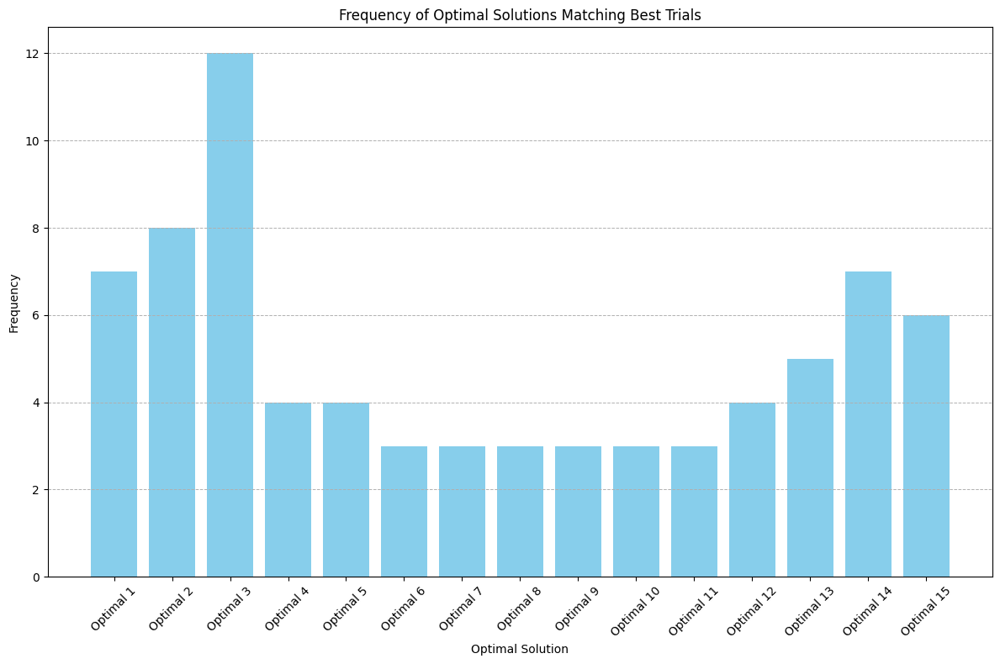

In [ ]:
#Distribution of most similar optimal solutions
def most_similar_optimal_solution():
    # Define all optimal solutions
    optimal_solutions = [optimal_solution, optimal_solution2, optimal_solution3, optimal_solution4, optimal_solution5, optimal_solution6,
                         optimal_solution7, optimal_solution8, optimal_solution9, optimal_solution10, optimal_solution11, optimal_solution12,
                         optimal_solution13, optimal_solution14, optimal_solution15]

    # Initialize counts for each optimal solution
    optimal_counts = [0] * len(optimal_solutions)

    # Directory containing navigation files
    navigation_dir = 'OnlineNavigation/Navigation'

    # List all files in the directory
    files = [f for f in listdir(navigation_dir) if isfile(join(navigation_dir, f))]

    for file in files:
        filepath = join(navigation_dir, file)

        # Load and process trials
        trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = trials(filepath)
        trial1 = convert_to_discrete(trial1)
        trial2 = convert_to_discrete(trial2)
        trial3 = convert_to_discrete(trial3)
        trial4 = convert_to_discrete(trial4)
        trial5 = convert_to_discrete(trial5)
        trial6 = convert_to_discrete(trial6)
        trial7 = convert_to_discrete(trial7)
        trial8 = convert_to_discrete(trial8)

        # Determine the best trial
        best = best_trial(trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8)

        # Compute Frechet distances to all optimal solutions
        frechet_dists = [frechet(best, opt_sol) for opt_sol in optimal_solutions]

        # Find the minimum distance
        min_dist = min(frechet_dists)

        # Find all optimal solutions that have this minimum distance
        min_indices = [i for i, dist in enumerate(frechet_dists) if dist == min_dist]

        # Increment counts for the optimal solution(s) with the minimum distance
        for idx in min_indices:
            optimal_counts[idx] += 1

    # Print counts for each optimal solution
    print("\nFrequency of Optimal Solutions Matching Best Trials:")
    for idx, count in enumerate(optimal_counts, start=2):
        print(f"Optimal Solution {idx}: {count}")

    # Plot the frequencies
    optimal_labels = [f'Optimal {i}' for i in range(1, 1 + len(optimal_solutions))]
    plt.figure(figsize=(12, 8))
    bars = plt.bar(optimal_labels, optimal_counts, color='skyblue')
    plt.xlabel('Optimal Solution')
    plt.ylabel('Frequency')
    plt.title('Frequency of Optimal Solutions Matching Best Trials')
    plt.xticks(rotation=45)
    plt.grid(axis='y', linestyle='--', linewidth=0.7)
    plt.tight_layout()
    plt.show()

# Run the function
most_similar_optimal_solution()


Result: NN was a better match.
Result: Optimal Solution was a better match.
Result: NN was a better match.
Result: NN was a better match.
Result: Optimal Solution was a better match.
Result: Optimal Solution was a better match.
Result: NN was a better match.
Result: Optimal Solution was a better match.
Result: NN was a better match.
Result: NN was a better match.
Result: Optimal Solution was a better match.
Result: Optimal Solution was a better match.


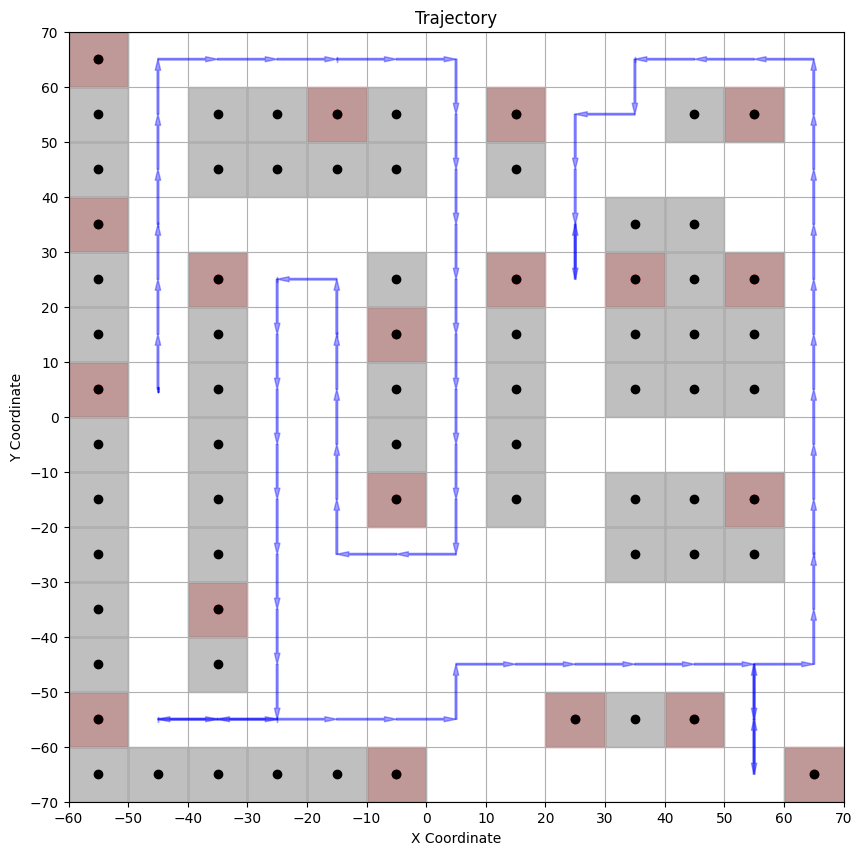

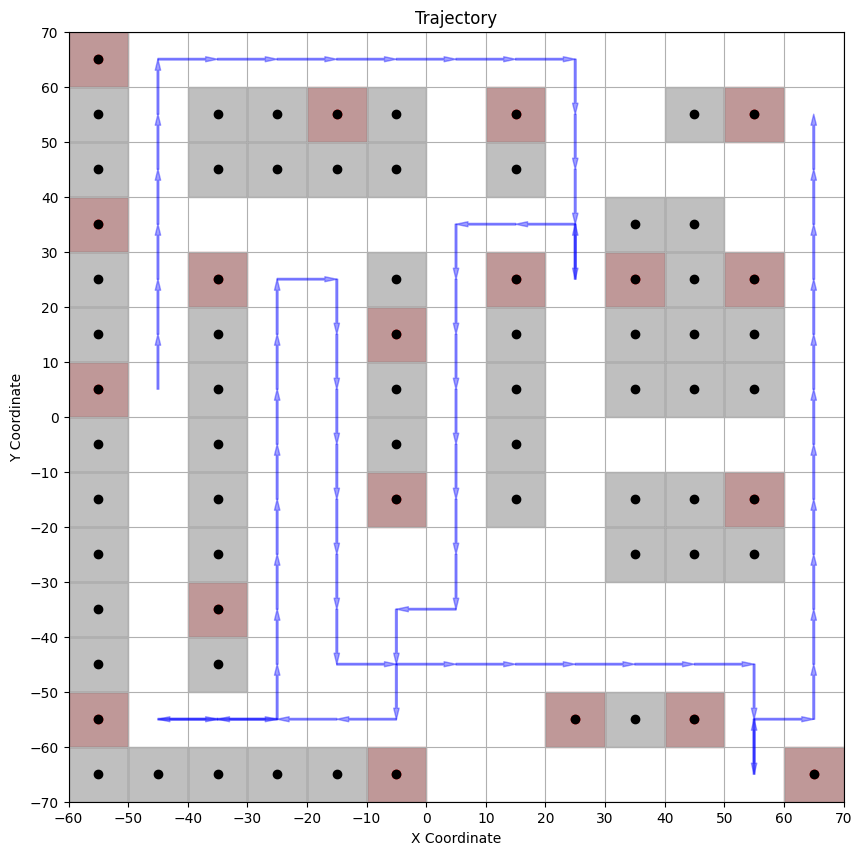

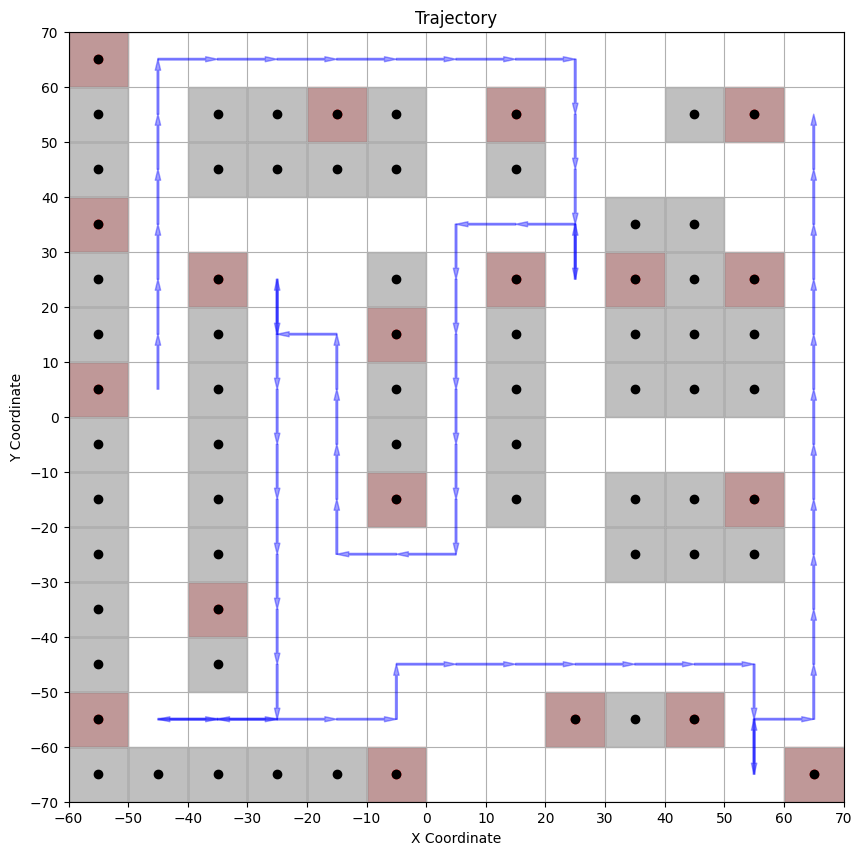

Result: Tie.


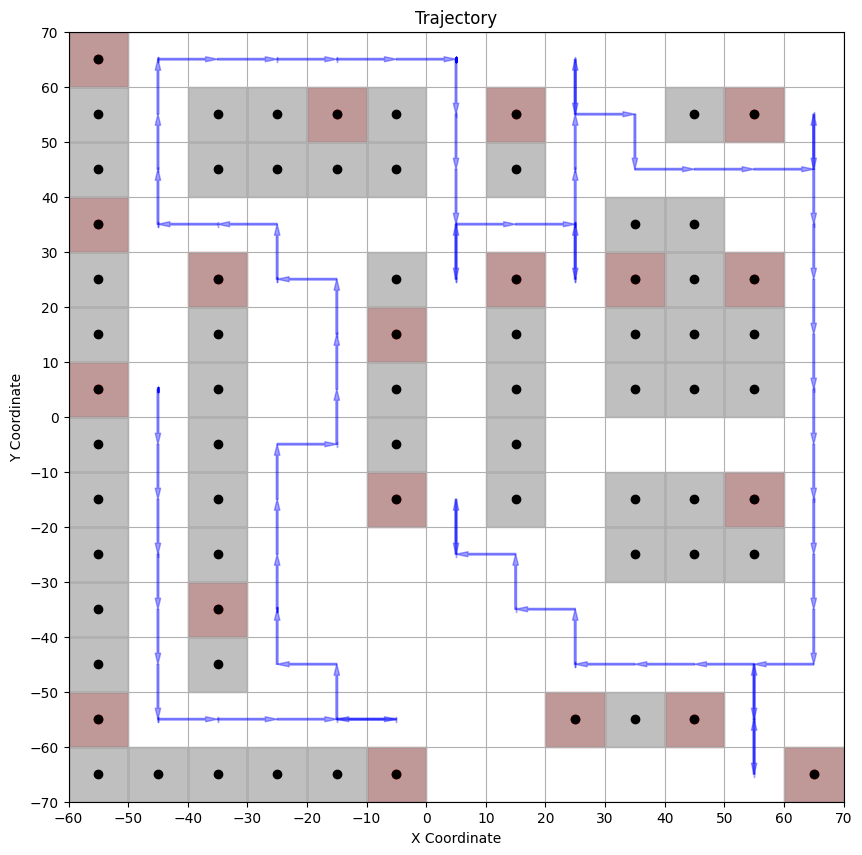

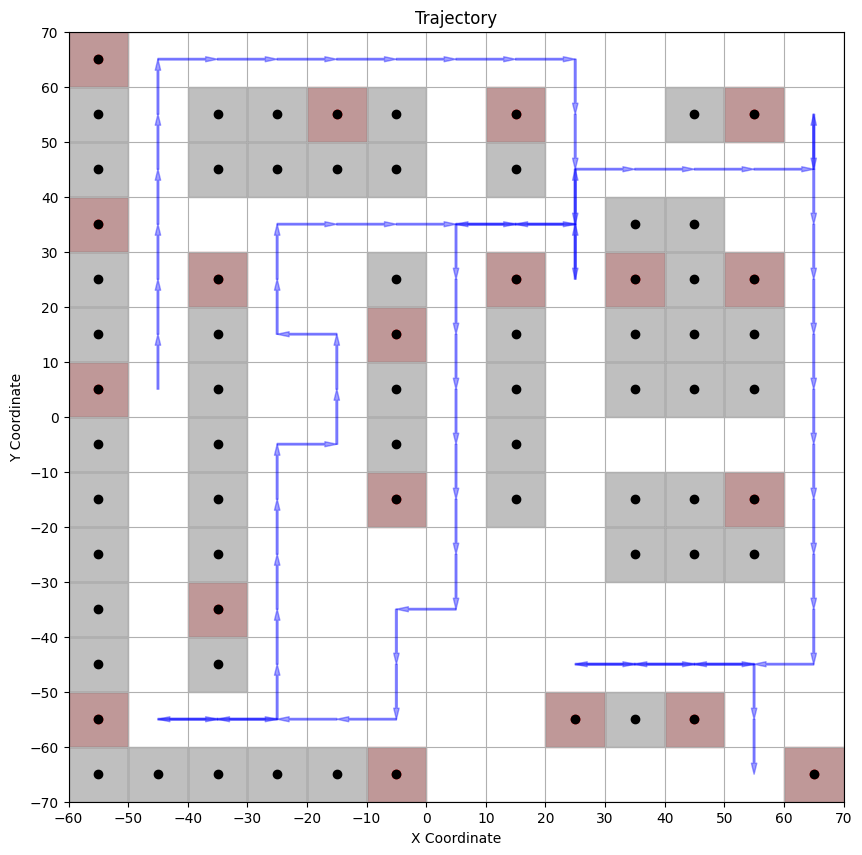

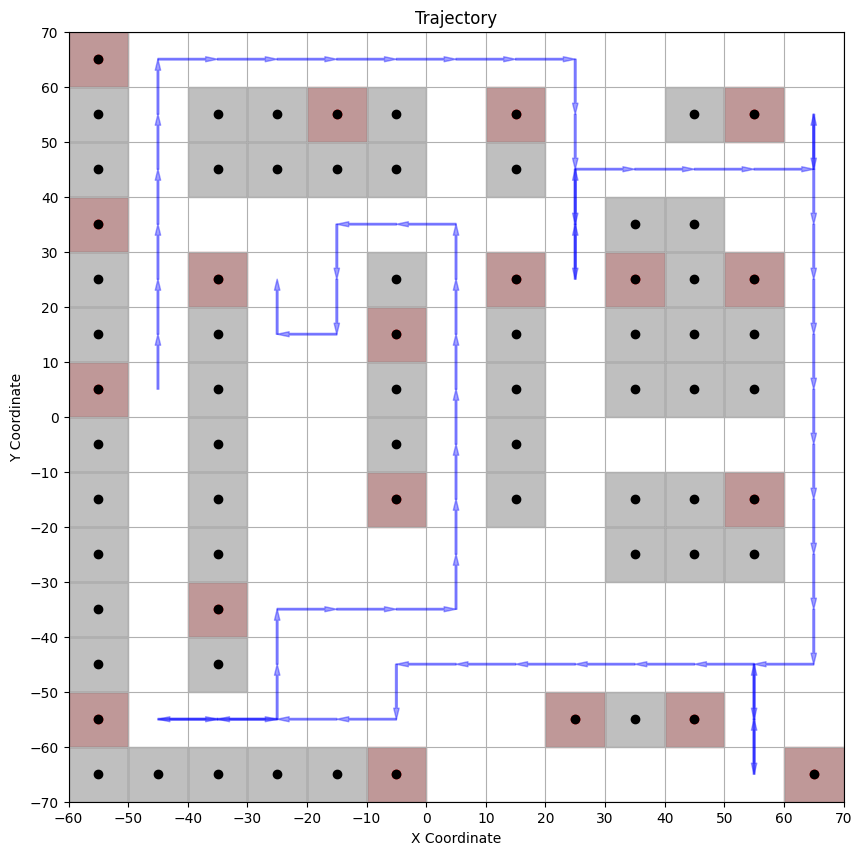

Result: Tie.
Result: Optimal Solution was a better match.
Result: Optimal Solution was a better match.
Result: Optimal Solution was a better match.
Result: NN was a better match.


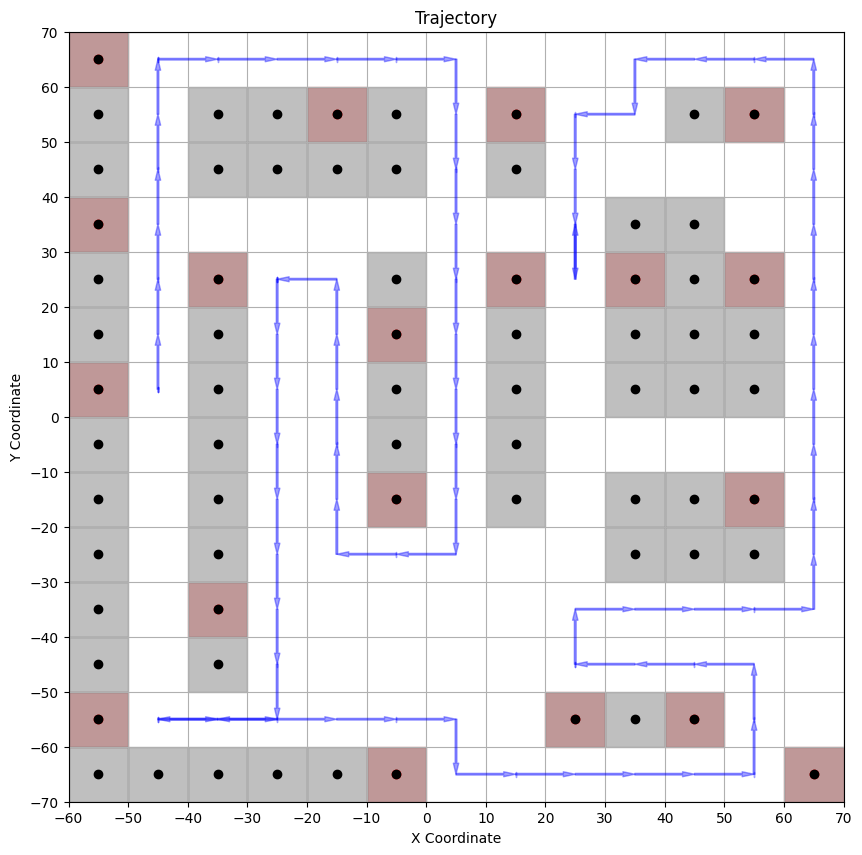

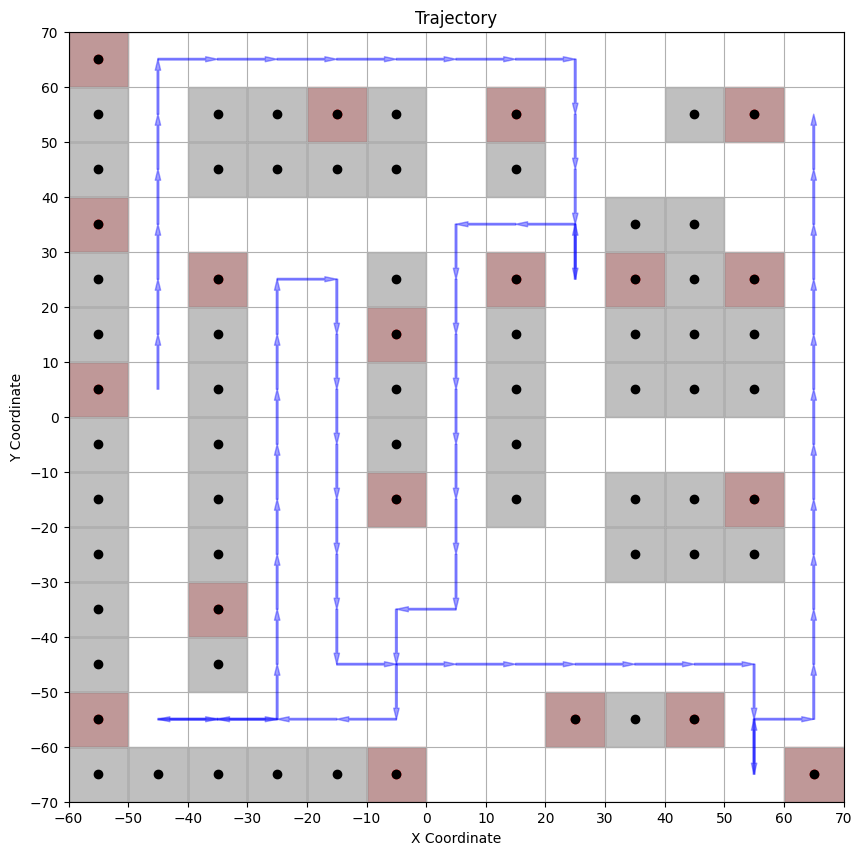

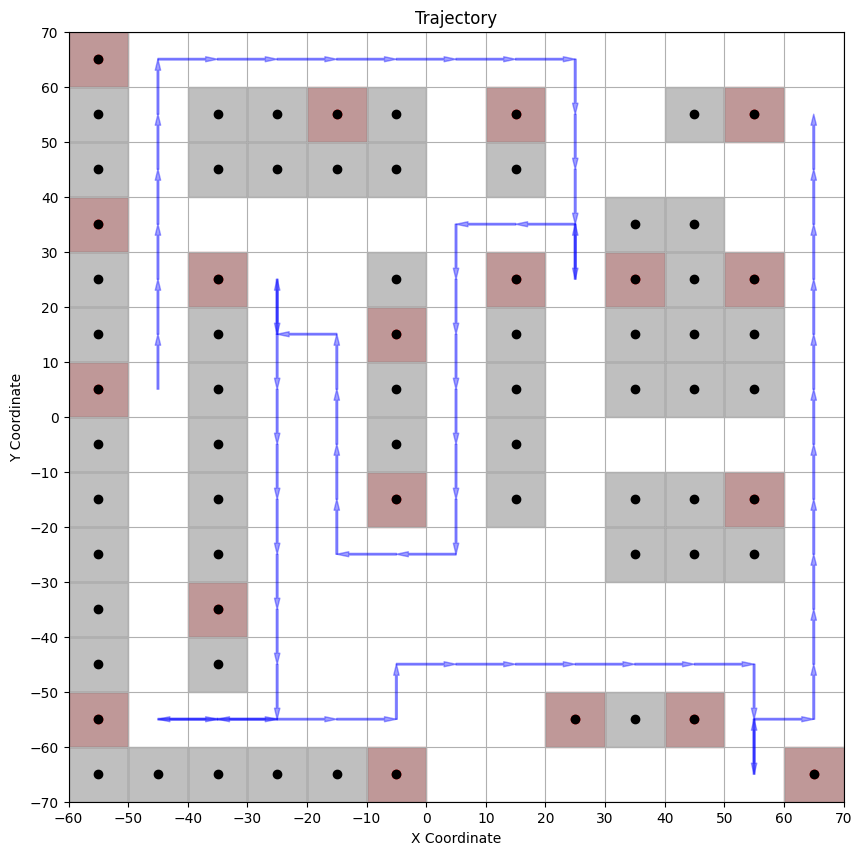

Result: Tie.
Result: Optimal Solution was a better match.
Result: NN was a better match.
Result: Optimal Solution was a better match.


In [ ]:
#Finds if NN or GO is a better match for each participant
def heuristic_vs_optimal():

    optimal_solutions = [
        optimal_solution, optimal_solution2, optimal_solution3, optimal_solution4, optimal_solution5, optimal_solution6,
        optimal_solution7, optimal_solution8, optimal_solution9, optimal_solution10, optimal_solution11, optimal_solution12,
        optimal_solution13, optimal_solution14, optimal_solution15
    ]

    nn_better = 0
    optimal_better = 0
    ties = 0  # Optional: Count ties if needed

    # Directory containing navigation files
    navigation_dir = 'OnlineNavigation/Navigation'

    # List all files in the directory
    files = [f for f in listdir(navigation_dir) if isfile(join(navigation_dir, f))]

    # Process each participant's file
    for file in files:
        filepath = join(navigation_dir, file)

        # Load and process trials
        trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = trials(filepath)
        trial1 = convert_to_discrete(trial1)
        trial2 = convert_to_discrete(trial2)
        trial3 = convert_to_discrete(trial3)
        trial4 = convert_to_discrete(trial4)
        trial5 = convert_to_discrete(trial5)
        trial6 = convert_to_discrete(trial6)
        trial7 = convert_to_discrete(trial7)
        trial8 = convert_to_discrete(trial8)

        # Determine the best trial
        best = best_trial(trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8)

        # Compute Frechet distances to all heuristic solutions
        frechet_dists_heuristics = [frechet(best, heuristic) for heuristic in nn_solutions]

        # Find the minimum distance among heuristics
        min_heuristic_dist = min(frechet_dists_heuristics)
        best_heuristic_index = frechet_dists_heuristics.index(min_heuristic_dist)
        best_heuristic = nn_solutions[best_heuristic_index]

        # Compute Frechet distances to all optimal solutions
        frechet_dists_optimal = [frechet(best, optimal) for optimal in optimal_solutions]

        # Find the minimum distance among optimal solutions
        min_optimal_dist = min(frechet_dists_optimal)
        best_optimal_index = frechet_dists_optimal.index(min_optimal_dist)
        best_optimal = optimal_solutions[best_optimal_index]

        # Compare the two minimum distances
        if min_heuristic_dist < min_optimal_dist:
            nn_better += 1
            print("Result: NN was a better match.")
        elif min_optimal_dist < min_heuristic_dist:
            optimal_better += 1
            print("Result: Optimal Solution was a better match.")
        else:
            ties += 1
            graph_data_normal(best)
            graph_data_normal(best_heuristic)
            graph_data_normal(best_optimal)
            print("Result: Tie.")

    # Prepare data for plotting
    labels = ['NN', 'GO']
    counts = [nn_better, optimal_better]
    if ties > 0:
        labels.append('Tie')
        counts.append(ties)

    # Plot the bar graph
    plt.figure(figsize=(8, 6))
    bars = plt.bar(labels, counts, color=['skyblue', 'salmon', 'gray'][:len(labels)])
    plt.xlabel('Solution Type')
    plt.ylabel('Number of Participants')
    plt.title('Best Matching Solution Type')
    plt.xticks()
    plt.yticks()

    # Add counts above the bars
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2.0, height, f'{height}', ha='center', va='bottom')

    plt.grid(axis='y', linestyle='--', linewidth=0.7)
    plt.tight_layout()
    plt.show()

# Run the comparison function
heuristic_vs_optimal()

42
Tie


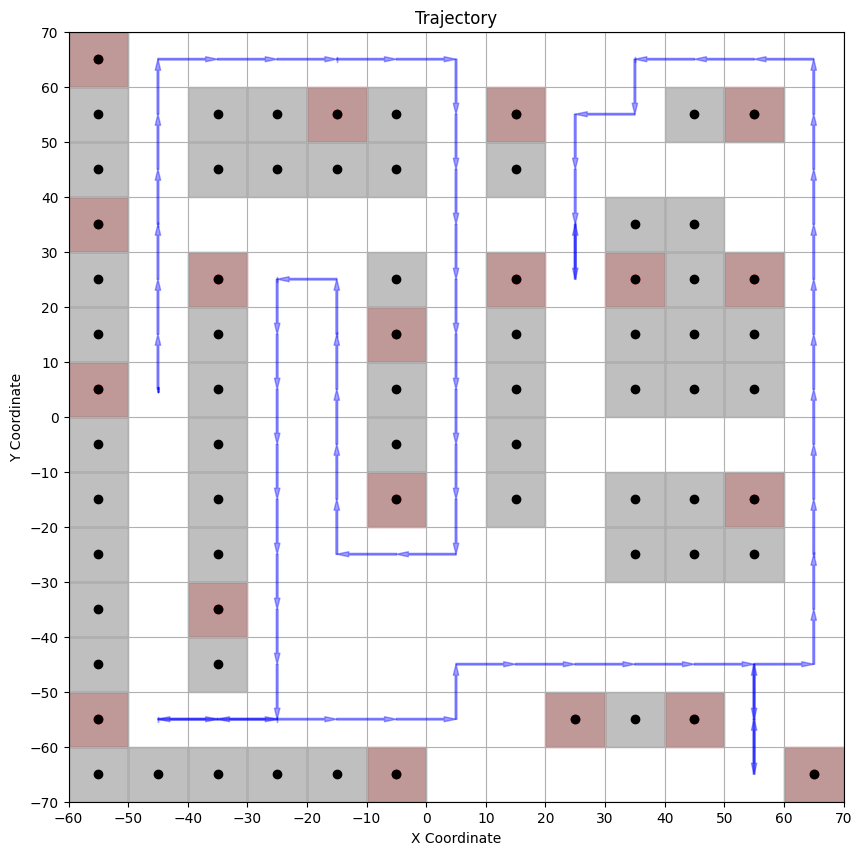

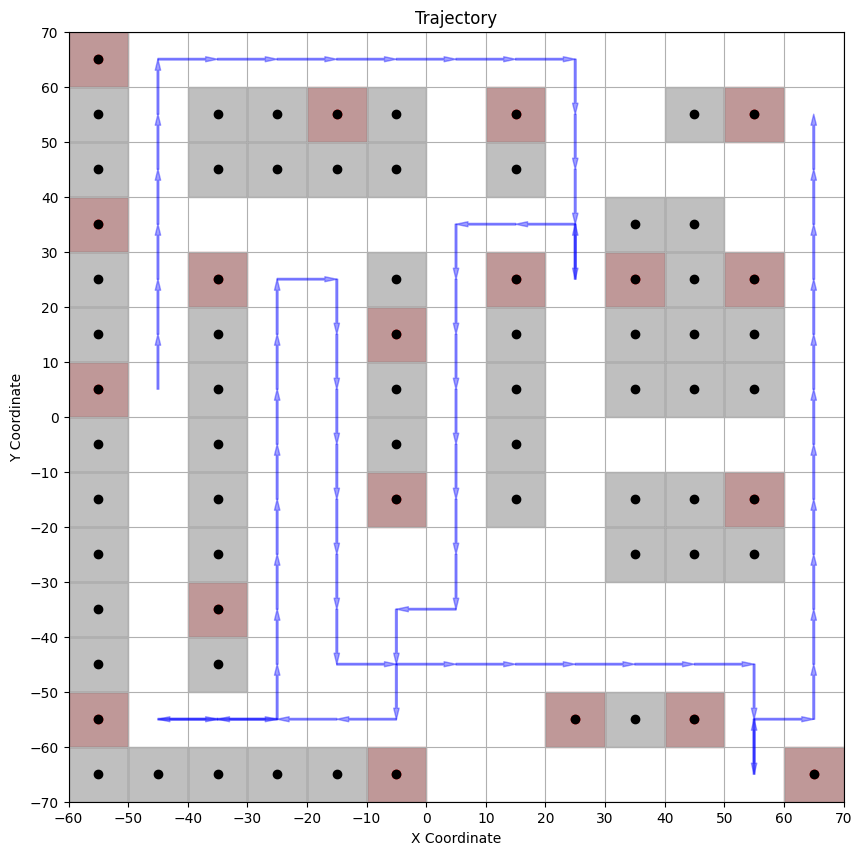

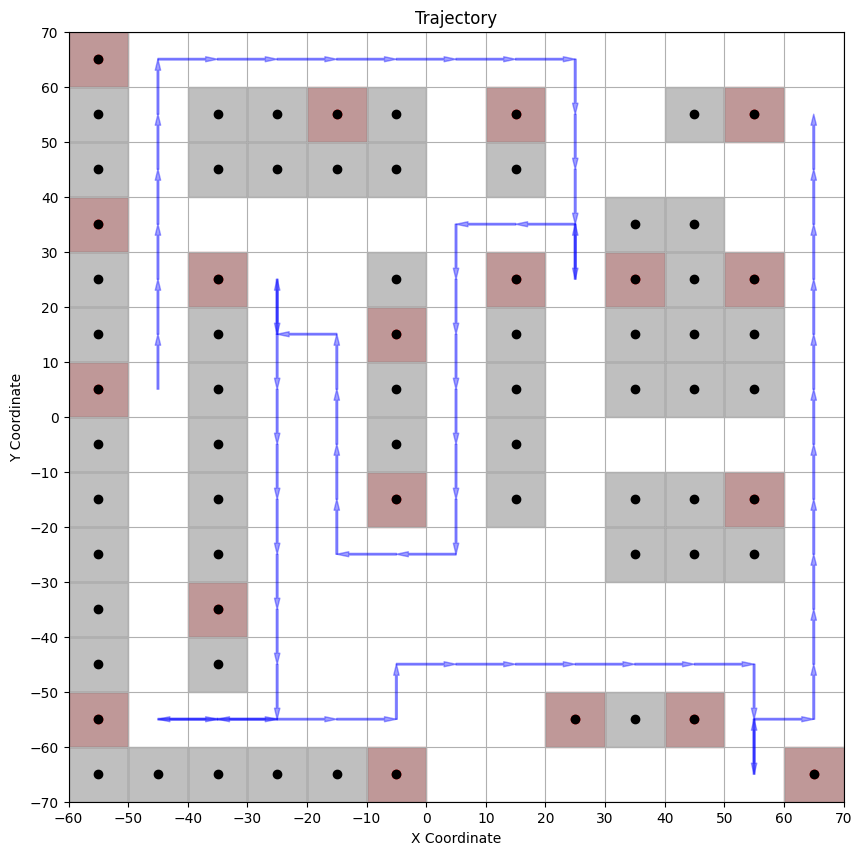

Tie


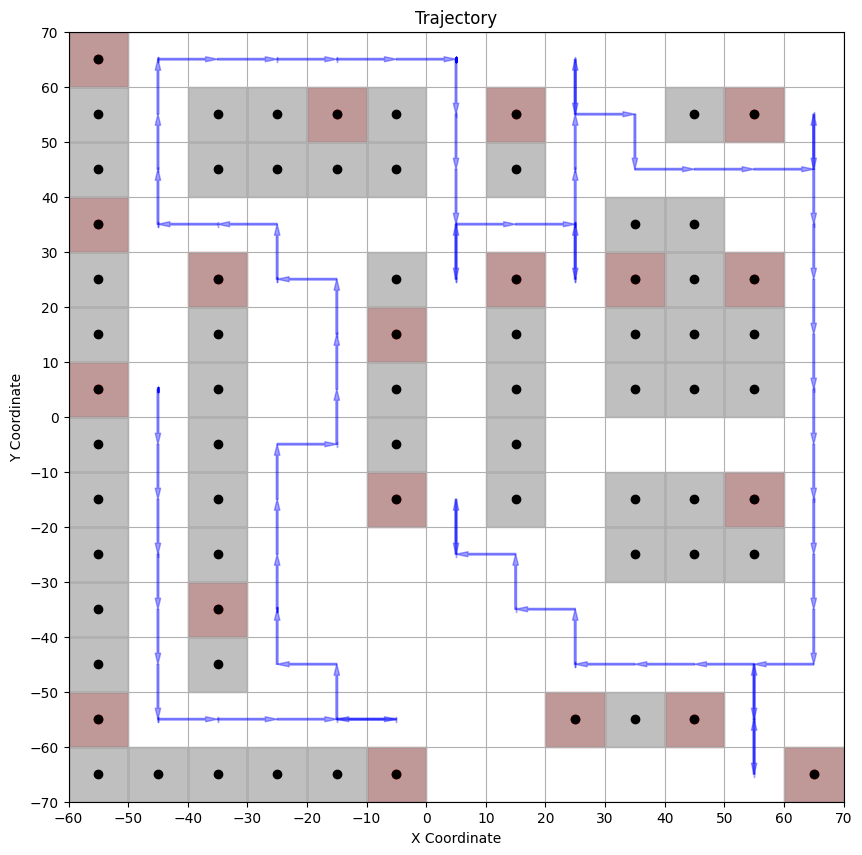

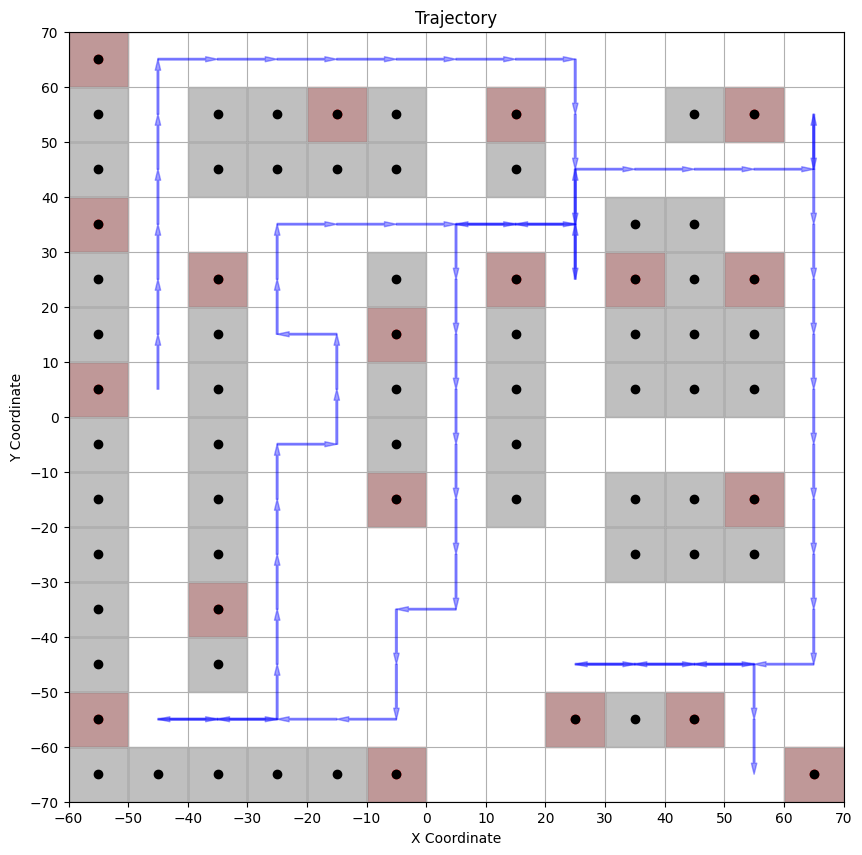

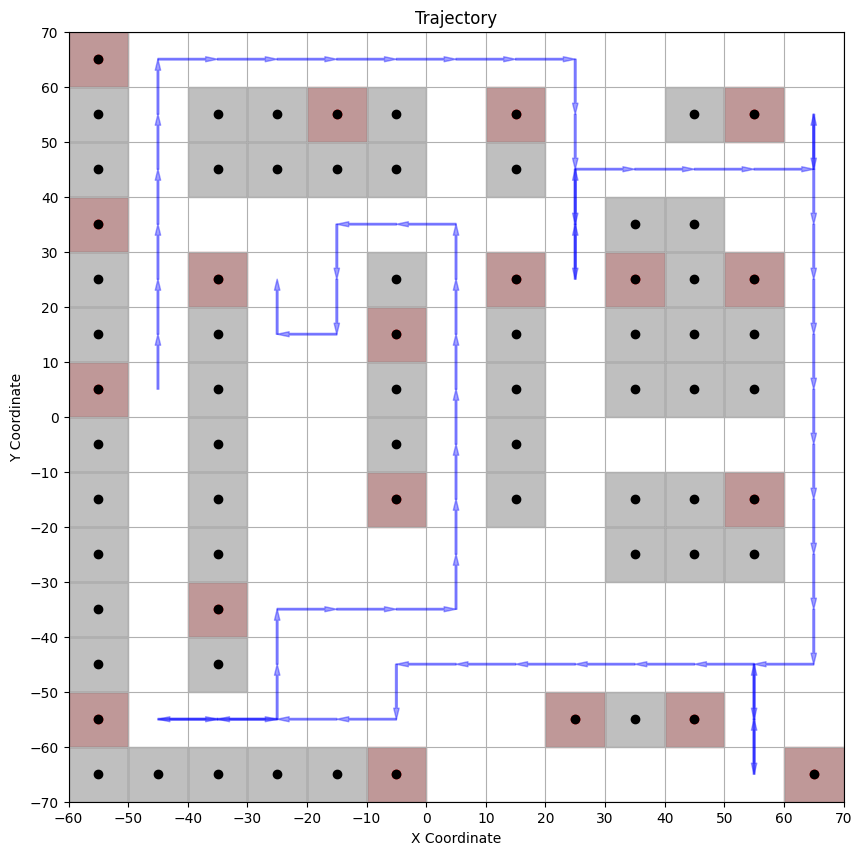

Tie


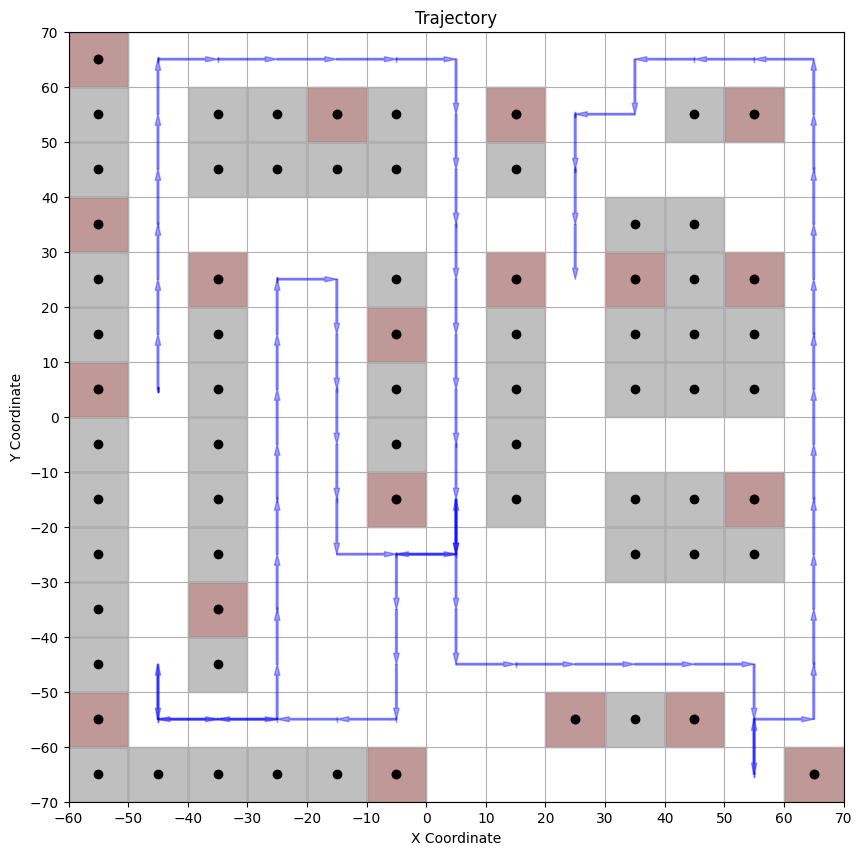

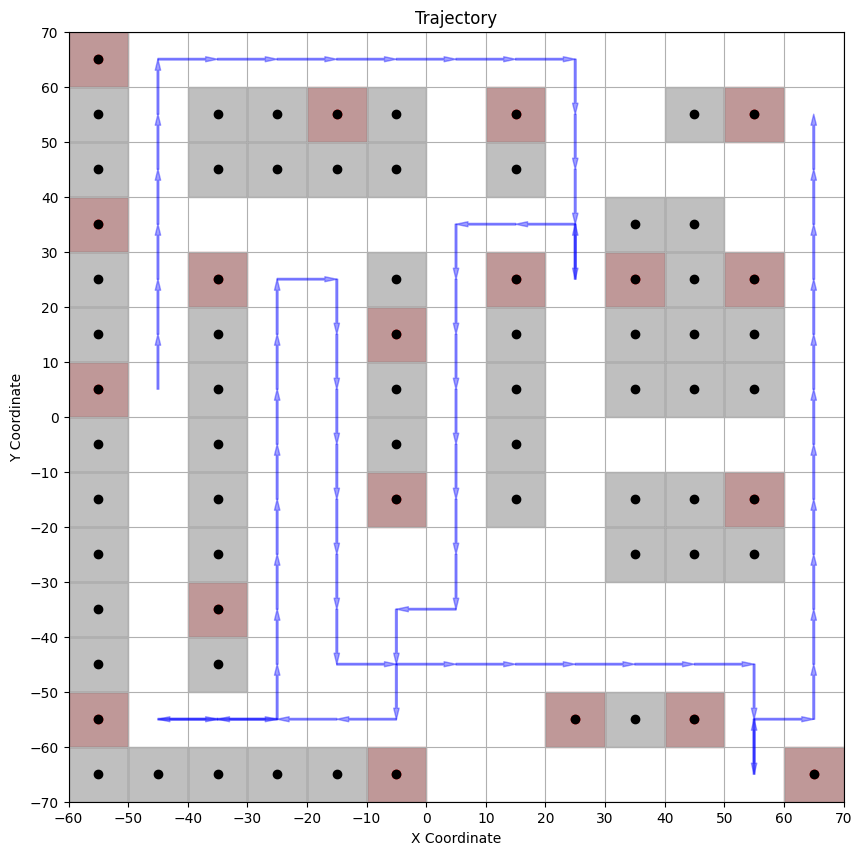

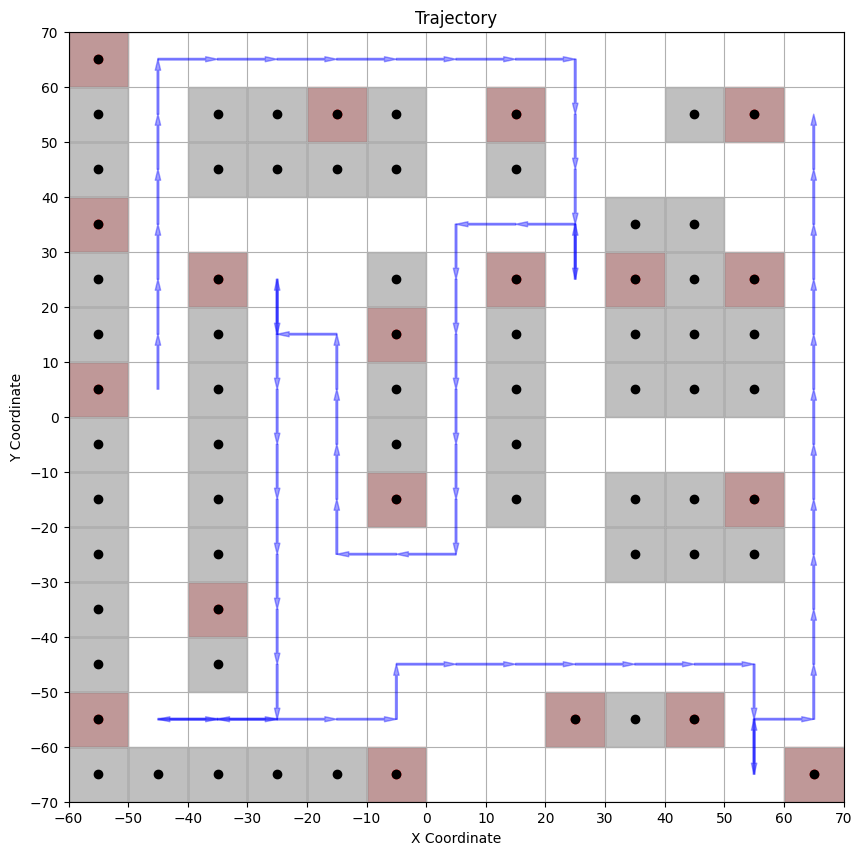

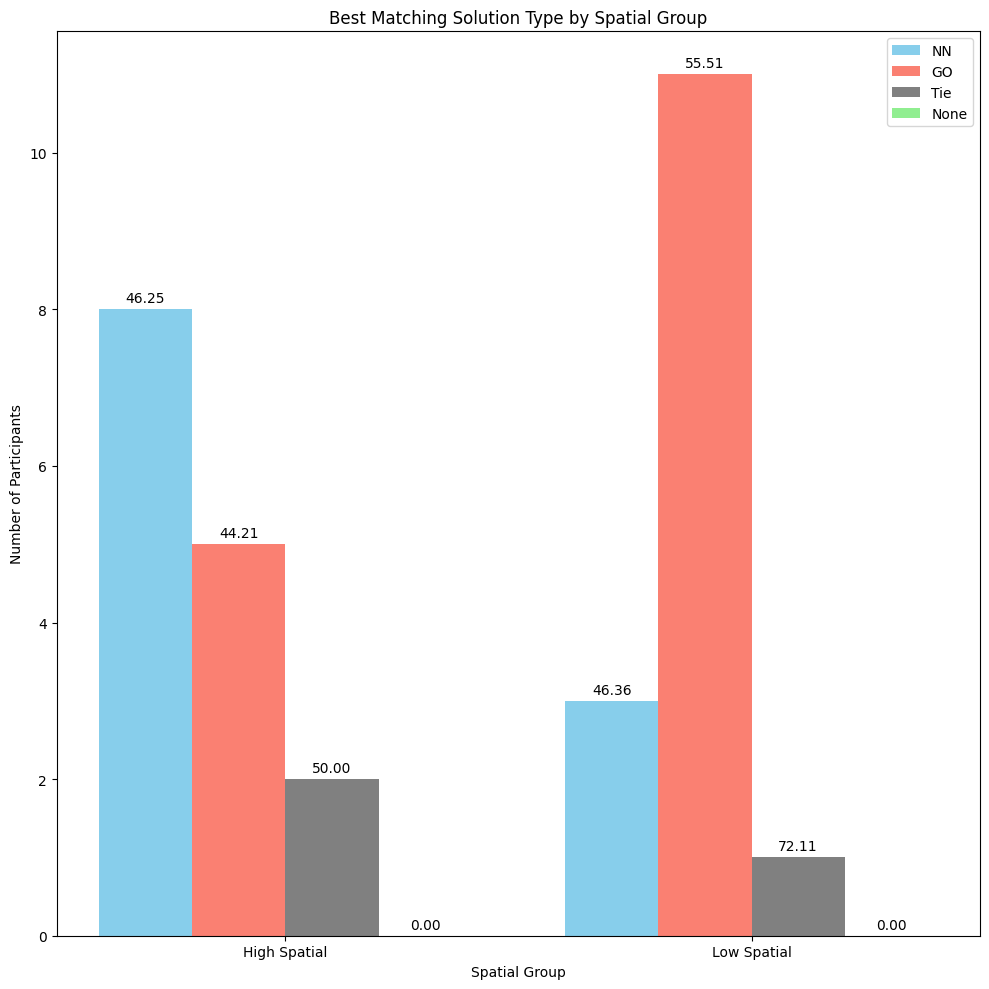

In [ ]:
def heuristic_vs_optimal_by_spatial_group():
    # Load the spatial group classification
    spatial_group_df = pd.read_csv('/content/drive/MyDrive/trajectory_analysis/OnlineNavigation/sub_sum.csv')

    print(len(nn_solutions))

    # Initialize dictionaries to store counts for each spatial group
    results = {
        'High Spatial': {'NN': {'total_distance': 0, 'count': 0},
                         'GO': {'total_distance': 0, 'count': 0},
                         'Tie': {'total_distance': 0, 'count': 0},
                         'None': {'total_distance': 0, 'count': 0}},
        'Low Spatial': {'NN': {'total_distance': 0, 'count': 0},
                        'GO': {'total_distance': 0, 'count': 0},
                        'Tie': {'total_distance': 0, 'count': 0},
                        'None': {'total_distance': 0, 'count': 0}}
    }

    # List of optimal solutions
    optimal_solutions = [
        optimal_solution, optimal_solution2, optimal_solution3, optimal_solution4, optimal_solution5,
        optimal_solution6, optimal_solution7, optimal_solution8, optimal_solution9, optimal_solution10,
        optimal_solution11, optimal_solution12, optimal_solution13, optimal_solution14, optimal_solution15
    ]

    # Directory containing navigation files
    navigation_dir = 'OnlineNavigation/Navigation'

    # List all files in the directory
    files = [f for f in listdir(navigation_dir) if isfile(join(navigation_dir, f))]

    # Process each participant's file
    for file in files:
        participant_id = file.replace("participant_", "").replace(".csv", "")
        filepath = join(navigation_dir, file)

        # Check if participant_id is in spatial_group_df
        if not spatial_group_df['ID'].astype(str).str.contains(participant_id).any():
            continue

        # Find spatial group for the current participant
        spatial_group = spatial_group_df.loc[spatial_group_df['ID'].astype(str) == participant_id, 'Spatial Group'].values[0]

        # Load and process trials
        trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = trials(filepath)
        trial1 = convert_to_discrete(trial1)
        trial2 = convert_to_discrete(trial2)
        trial3 = convert_to_discrete(trial3)
        trial4 = convert_to_discrete(trial4)
        trial5 = convert_to_discrete(trial5)
        trial6 = convert_to_discrete(trial6)
        trial7 = convert_to_discrete(trial7)
        trial8 = convert_to_discrete(trial8)

        # Determine the best trial
        best = best_trial(trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8)

        # Compute Frechet distances to all heuristic solutions
        frechet_dists_heuristics = [frechet(best, heuristic) for heuristic in nn_solutions]
        best_heuristic = nn_solutions[frechet_dists_heuristics.index(min(frechet_dists_heuristics))]
        min_heuristic_dist = min(frechet_dists_heuristics)

        # Compute Frechet distances to all optimal solutions
        frechet_dists_optimal = [frechet(best, optimal) for optimal in optimal_solutions]
        best_optimal = optimal_solutions[frechet_dists_optimal.index(min(frechet_dists_optimal))]
        min_optimal_dist = min(frechet_dists_optimal)


        # Compare the two minimum distances and update sums and counts
        if min_heuristic_dist > 80 and min_optimal_dist > 80:
            print('None')
            results[spatial_group]['None']['count'] += 1
            results[spatial_group]['None']['total_distance'] += min(min_heuristic_dist, min_optimal_dist)
            graph_data_normal(best)
            graph_data_normal(best_heuristic)
            graph_data_normal(best_optimal)
        elif min_heuristic_dist < min_optimal_dist:
            results[spatial_group]['NN']['total_distance'] += min_heuristic_dist
            results[spatial_group]['NN']['count'] += 1
        elif min_optimal_dist < min_heuristic_dist:
            results[spatial_group]['GO']['total_distance'] += min_optimal_dist
            results[spatial_group]['GO']['count'] += 1
        else:
            print('Tie')
            results[spatial_group]['Tie']['total_distance'] += min_heuristic_dist
            results[spatial_group]['Tie']['count'] += 1
            graph_data_normal(best)
            graph_data_normal(best_heuristic)
            graph_data_normal(best_optimal)

    # Prepare data for plotting
    spatial_groups = ['High Spatial', 'Low Spatial']

    # Calculate frequencies for the y-axis
    nn_counts = [results[group]['NN']['count'] for group in spatial_groups]
    go_counts = [results[group]['GO']['count'] for group in spatial_groups]
    tie_counts = [results[group]['Tie']['count'] for group in spatial_groups]
    none_counts = [results[group]['None']['count'] for group in spatial_groups]

    # Calculate mean Fréchet distances for annotations (excluding 'None')
    mean_nn = [results[group]['NN']['total_distance'] / results[group]['NN']['count'] if results[group]['NN']['count'] > 0 else 0 for group in spatial_groups]
    mean_go = [results[group]['GO']['total_distance'] / results[group]['GO']['count'] if results[group]['GO']['count'] > 0 else 0 for group in spatial_groups]
    mean_tie = [results[group]['Tie']['total_distance'] / results[group]['Tie']['count'] if results[group]['Tie']['count'] > 0 else 0 for group in spatial_groups]
    mean_none = [results[group]['None']['total_distance'] / results[group]['None']['count'] if results[group]['None']['count'] > 0 else 0 for group in spatial_groups]


    x = np.arange(len(spatial_groups))
    width = 0.2

    # Plotting the grouped bar chart
    plt.figure(figsize=(10, 10))
    rects1 = plt.bar(x - 1.5 * width, nn_counts, width, label='NN', color='skyblue')
    rects2 = plt.bar(x - 0.5 * width, go_counts, width, label='GO', color='salmon')
    rects3 = plt.bar(x + 0.5 * width, tie_counts, width, label='Tie', color='gray')
    rects4 = plt.bar(x + 1.5 * width, none_counts, width, label='None', color='lightgreen')

    plt.xlabel('Spatial Group')
    plt.ylabel('Number of Participants')
    plt.title('Best Matching Solution Type by Spatial Group')
    plt.xticks(x, spatial_groups)
    plt.legend()

    # Add mean Fréchet distances above bars for NN, GO, and Tie
    def autolabel(rects, means):
        for rect, mean in zip(rects, means):
            plt.annotate(f'{mean:.2f}',
                         xy=(rect.get_x() + rect.get_width() / 2, rect.get_height()),
                         xytext=(0, 3),
                         textcoords="offset points",
                         ha='center', va='bottom')

    autolabel(rects1, mean_nn)
    autolabel(rects2, mean_go)
    autolabel(rects3, mean_tie)
    autolabel(rects4, mean_none)

    plt.tight_layout()
    plt.show()

heuristic_vs_optimal_by_spatial_group()

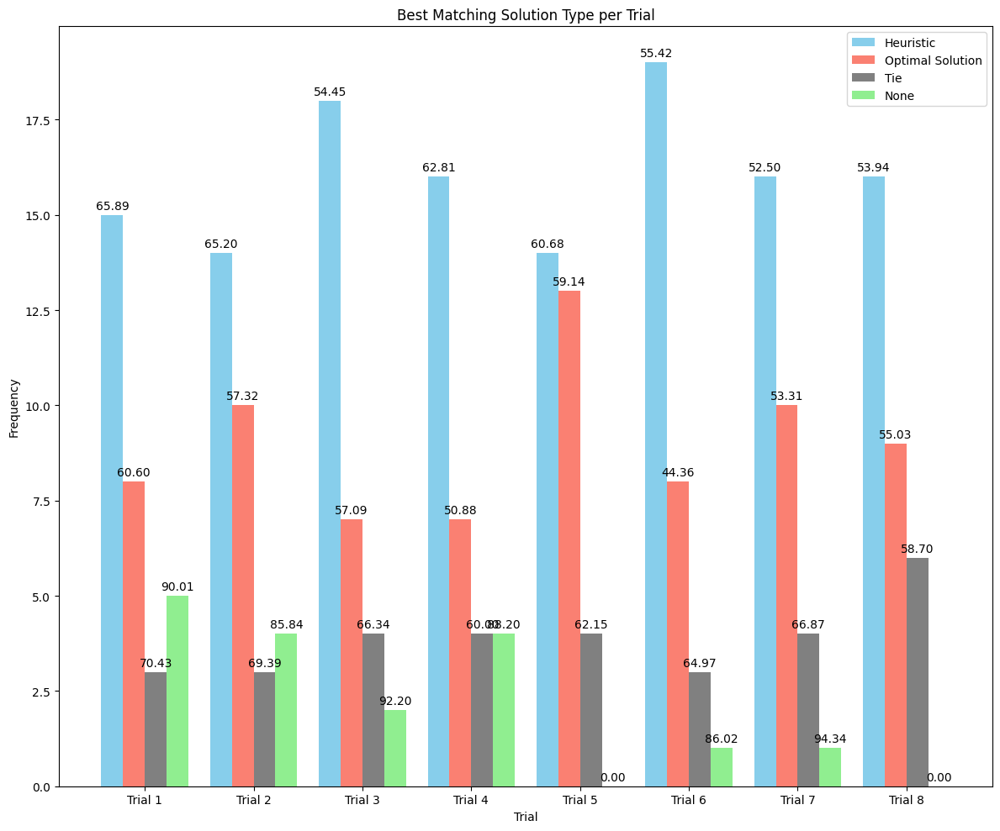

In [ ]:
#Finds if NN or GO is a better match for each participant for each trial
def heuristic_vs_optimal_trials():

    optimal_solutions = [
        optimal_solution, optimal_solution2, optimal_solution3, optimal_solution4,
        optimal_solution5, optimal_solution6, optimal_solution7, optimal_solution8,
        optimal_solution9, optimal_solution10, optimal_solution11, optimal_solution12,
        optimal_solution13, optimal_solution14, optimal_solution15
    ]

    # Directory containing navigation files
    navigation_dir = 'OnlineNavigation/Navigation'

    # List all files in the directory
    files = [f for f in listdir(navigation_dir) if isfile(join(navigation_dir, f))]

    # Initialize counts for each trial
    trials_nn_better = [0] * 8
    trials_optimal_better = [0] * 8
    trials_ties = [0] * 8
    trials_none = [0] * 8
    nn_distances = [0] * 8
    go_distances = [0] * 8
    tie_distances = [0] * 8
    none_distances = [0] * 8

    # Process each participant's file
    for file in files:
        filepath = join(navigation_dir, file)
        trials_list = trials(filepath)
        discrete_trials = [convert_to_discrete(trial) for trial in trials_list]

        # Analyze each trial separately
        for trial_index, trial in enumerate(discrete_trials):
            frechet_dists_heuristics = [frechet(trial, heuristic) for heuristic in nn_solutions]
            min_heuristic_dist = min(frechet_dists_heuristics)

            frechet_dists_optimal = [frechet(trial, optimal) for optimal in optimal_solutions]
            min_optimal_dist = min(frechet_dists_optimal)

            if min_heuristic_dist > 80 and min_optimal_dist > 80:
                trials_none[trial_index] += 1
                none_distances[trial_index] += min(min_heuristic_dist, min_optimal_dist)
            elif min_heuristic_dist < min_optimal_dist:
                trials_nn_better[trial_index] += 1
                nn_distances[trial_index] += min_heuristic_dist
            elif min_optimal_dist < min_heuristic_dist:
                trials_optimal_better[trial_index] += 1
                go_distances[trial_index] += min_optimal_dist
            else:
                trials_ties[trial_index] += 1
                tie_distances[trial_index] += min_heuristic_dist

    # Calculate mean Fréchet distances for annotations
    mean_nn = [nn_distances[i] / trials_nn_better[i] if trials_nn_better[i] > 0 else 0 for i in range(8)]
    mean_go = [go_distances[i] / trials_optimal_better[i] if trials_optimal_better[i] > 0 else 0 for i in range(8)]
    mean_tie = [tie_distances[i] / trials_ties[i] if trials_ties[i] > 0 else 0 for i in range(8)]
    mean_none = [none_distances[i] / trials_none[i] if trials_none[i] > 0 else 0 for i in range(8)]

    # Plotting the results
    trial_nums = [f'Trial {i + 1}' for i in range(8)]
    bar_width = 0.2
    x_indexes = range(len(trial_nums))

    plt.figure(figsize=(12, 10))

    # Plot bars for each category
    rects1 = plt.bar([x - 1.5 * bar_width for x in x_indexes], trials_nn_better, width=bar_width, color='skyblue', label='Heuristic')
    rects2 = plt.bar([x - 0.5 * bar_width for x in x_indexes], trials_optimal_better, width=bar_width, color='salmon', label='Optimal Solution')
    rects3 = plt.bar([x + 0.5 * bar_width for x in x_indexes], trials_ties, width=bar_width, color='gray', label='Tie')
    rects4 = plt.bar([x + 1.5 * bar_width for x in x_indexes], trials_none, width=bar_width, color='lightgreen', label='None')

    # Label the axes and title
    plt.xlabel('Trial')
    plt.ylabel('Frequency')
    plt.title('Best Matching Solution Type per Trial')
    plt.xticks(x_indexes, trial_nums)
    plt.legend()

    # Function to add mean Fréchet distances above bars
    def autolabel(rects, means):
        for rect, mean in zip(rects, means):
            plt.annotate(f'{mean:.2f}',
                         xy=(rect.get_x() + rect.get_width() / 2, rect.get_height()),
                         xytext=(0, 3),
                         textcoords="offset points",
                         ha='center', va='bottom')

    # Add mean distances above bars for each category
    autolabel(rects1, mean_nn)
    autolabel(rects2, mean_go)
    autolabel(rects3, mean_tie)
    autolabel(rects4, mean_none)

    plt.tight_layout()
    plt.show()

# Run the comparison function
heuristic_vs_optimal_trials()

# **Convergence Analysis**

In [ ]:
#Finds mean Frechet distance between each trial and all other trials for every participant
def convergence():
    # Directory containing navigation files
    navigation_dir = 'OnlineNavigation/Navigation'

    # List all files in the directory
    participant_files = [f for f in listdir(navigation_dir) if isfile(join(navigation_dir, f))]

    # Initialize a list to hold mean Frechet distances per participant
    # Each sublist will contain 8 mean distances corresponding to 8 trials
    all_participants_mean_distances = []

    # Iterate through each participant's file
    for file in participant_files:
        filepath = join(navigation_dir, file)

        try:
            # Load and process trials
            trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = trials(filepath)
            trials_converted = [
                convert_to_discrete(trial1),
                convert_to_discrete(trial2),
                convert_to_discrete(trial3),
                convert_to_discrete(trial4),
                convert_to_discrete(trial5),
                convert_to_discrete(trial6),
                convert_to_discrete(trial7),
                convert_to_discrete(trial8)
            ]

            # Compute mean Frechet distances for each trial
            participant_mean_distances = []
            for i in range(8):
                distances = []
                for j in range(8):
                    if i != j:
                        dist = frechet(trials_converted[i], trials_converted[j])
                        distances.append(dist)
                mean_distance = np.mean(distances)
                participant_mean_distances.append(mean_distance)

            all_participants_mean_distances.append(participant_mean_distances)

        except Exception as e:
            print(f"Error processing file {file}: {e}")
            continue

    # Convert the list to a NumPy array for easier manipulation
    all_participants_mean_distances = np.array(all_participants_mean_distances)

    # Number of participants processed
    num_participants = all_participants_mean_distances.shape[0]
    print(f"Processed {num_participants} participants.")

    # Calculate the mean and standard error across all participants for each trial
    mean_frechet_distances = np.mean(all_participants_mean_distances, axis=0)
    standard_error = np.std(all_participants_mean_distances, axis=0, ddof=1) / np.sqrt(num_participants)

    # Plotting
    plt.figure(figsize=(12, 8))

    # Plot each participant's mean distances in blue
    for participant_idx in range(num_participants):
        plt.plot(range(1, 9), all_participants_mean_distances[participant_idx], color='blue', alpha=0.5)

    # Plot the aggregated mean with black error bars
    plt.errorbar(range(1, 9), mean_frechet_distances, yerr=standard_error, color='red',
                 ecolor='black', elinewidth=2, capsize=4, linewidth=2, label='Mean Across Participants')

    # Customizing the plot
    plt.xlabel('Trial Number')
    plt.ylabel('Mean Frechet Distance')
    plt.title('Convergence of Trials: Mean Frechet Distance per Trial')
    plt.xticks(range(1, 9), [f'Trial {i}' for i in range(1, 9)])
    plt.yticks()
    plt.grid(axis='y', linestyle='--')
    plt.tight_layout()
    plt.show()

#convergence()

# **Revisiting Index and Move Modification Quality**

In [ ]:
def optimal_path_distance():
    files = [f for f in listdir('OnlineNavigation/BuildingVisitedOrder') if isfile(join('OnlineNavigation/BuildingVisitedOrder', f))]
    distance1, distance2, distance3, distance4, distance5, distance6, distance7, distance8 = 0, 0, 0, 0, 0, 0, 0, 0
    diff1, diff2, diff3, diff4, diff5, diff6, diff7, diff8 = [], [], [], [], [], [], [], []
    counter = 1

    for file in files:
        print(file)
        print(counter)

        counter += 1

        trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = visited_buildings(f'OnlineNavigation/BuildingVisitedOrder/{file}', f'OnlineNavigation/RandomizedBuildings/{file}')
        trial1_real, trial2_real, trial3_real, trial4_real, trial5_real, trial6_real, trial7_real, trial8_real = trials(f'OnlineNavigation/Navigation/{file}')
        trial1_real, trial2_real, trial3_real, trial4_real, trial5_real, trial6_real, trial7_real, trial8_real = convert_to_discrete(trial1_real), convert_to_discrete(trial2_real), convert_to_discrete(trial3_real), convert_to_discrete(trial4_real), convert_to_discrete(trial5_real), convert_to_discrete(trial6_real), convert_to_discrete(trial7_real), convert_to_discrete(trial8_real)

        for i in range(len(trial1)-1):
            distance1 += distance_matrix[trial1[i]-1][trial1[i+1]-1]

        for i in range(len(trial2)-1):
            distance2 += distance_matrix[trial2[i]-1][trial2[i+1]-1]

        for i in range(len(trial3)-1):
            distance3 += distance_matrix[trial3[i]-1][trial3[i+1]-1]

        for i in range(len(trial4)-1):
            distance4 += distance_matrix[trial4[i]-1][trial4[i+1]-1]

        for i in range(len(trial5)-1):
            distance5 += distance_matrix[trial5[i]-1][trial5[i+1]-1]

        for i in range(len(trial6)-1):
            distance6 += distance_matrix[trial6[i]-1][trial6[i+1]-1]

        for i in range(len(trial7)-1):
            distance7 += distance_matrix[trial7[i]-1][trial7[i+1]-1]

        for i in range(len(trial8)-1):
            distance8 += distance_matrix[trial8[i]-1][trial8[i+1]-1]

        diff1.append(distance(trial1_real) - distance1)
        diff2.append(distance(trial2_real) - distance2)
        diff3.append(distance(trial3_real) - distance3)
        diff4.append(distance(trial4_real) - distance4)
        diff5.append(distance(trial5_real) - distance5)
        diff6.append(distance(trial6_real) - distance6)
        diff7.append(distance(trial7_real) - distance7)
        diff8.append(distance(trial8_real) - distance8)

        print('index 1')
        print(distance(trial1_real) - distance1)

        print('index 2')
        print(distance(trial2_real) - distance2)

        print('index 3')
        print(distance(trial3_real) - distance3)

        print('index 4')
        print(distance(trial4_real) - distance4)

        print('index 5')
        print(distance(trial5_real) - distance5)

        print('index 6')
        print(distance(trial6_real) - distance6)

        print('index 7')
        print(distance(trial7_real) - distance7)

        print('index 8')
        print(distance(trial8_real) - distance8)

        print()

        distance1, distance2, distance3, distance4, distance5, distance6, distance7, distance8 = 0, 0, 0, 0, 0, 0, 0, 0

    arrays = [diff1, diff2, diff3, diff4, diff5, diff6, diff7, diff8]
    # Plot each trial
    plt.figure(figsize=(10, 10))
    cmap = plt.get_cmap('viridis')
    for trial_num, arr in enumerate(arrays):
        x = np.full(len(arr), trial_num + 1)  # X values are the trial numbers (1-based)
        y = arr
        colors = np.linspace(0, 1, len(arr))  # Color by position in the array
        plt.scatter(x, y, c=colors, cmap=cmap, s=100, edgecolor='k', label=f'Trial {trial_num + 1}')


    # Label the axes
    plt.xlabel('Trial number')
    plt.ylabel('Revisiting Index')
    plt.xticks(ticks=np.arange(1, 9), labels=[f'Trial {i}' for i in range(1, 9)])  # Set x-axis labels to trial numbers


In [ ]:
#optimal_path_distance()

In [ ]:
#Plots the revisiting order for all participants for all 8 trials
def revisiting_index_line():
    files = [f for f in listdir('OnlineNavigation/BuildingVisitedOrder') if isfile(join('OnlineNavigation/BuildingVisitedOrder', f))]
    distance1, distance2, distance3, distance4, distance5, distance6, distance7, distance8 = 0, 0, 0, 0, 0, 0, 0, 0
    diff1, diff2, diff3, diff4, diff5, diff6, diff7, diff8 = 0, 0, 0, 0, 0, 0, 0, 0
    mean1, mean2, mean3, mean4, mean5, mean6, mean7, mean8 = [], [], [], [], [], [], [], []

    plt.figure(figsize=(10, 10))
    plt.title('Revisiting Index for Every Participant')
    plt.xlabel('Trial number')
    plt.ylabel('Revisiting Index')
    plt.xticks(ticks=np.arange(1, 9), labels=[f'Trial {i}' for i in range(1, 9)])  # Set x-axis labels to trial numbers

    for file in files:
        trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = visited_buildings(f'OnlineNavigation/BuildingVisitedOrder/{file}', f'OnlineNavigation/RandomizedBuildings/{file}')
        trial1_real, trial2_real, trial3_real, trial4_real, trial5_real, trial6_real, trial7_real, trial8_real = trials(f'OnlineNavigation/Navigation/{file}')
        trial1_real, trial2_real, trial3_real, trial4_real, trial5_real, trial6_real, trial7_real, trial8_real = convert_to_discrete(trial1_real), convert_to_discrete(trial2_real), convert_to_discrete(trial3_real), convert_to_discrete(trial4_real), convert_to_discrete(trial5_real), convert_to_discrete(trial6_real), convert_to_discrete(trial7_real), convert_to_discrete(trial8_real)

        for i in range(len(trial1)-1):
            distance1 += distance_matrix[trial1[i]-1][trial1[i+1]-1]

        for i in range(len(trial2)-1):
            distance2 += distance_matrix[trial2[i]-1][trial2[i+1]-1]

        for i in range(len(trial3)-1):
            distance3 += distance_matrix[trial3[i]-1][trial3[i+1]-1]

        for i in range(len(trial4)-1):
            distance4 += distance_matrix[trial4[i]-1][trial4[i+1]-1]

        for i in range(len(trial5)-1):
            distance5 += distance_matrix[trial5[i]-1][trial5[i+1]-1]

        for i in range(len(trial6)-1):
            distance6 += distance_matrix[trial6[i]-1][trial6[i+1]-1]

        for i in range(len(trial7)-1):
            distance7 += distance_matrix[trial7[i]-1][trial7[i+1]-1]

        for i in range(len(trial8)-1):
            distance8 += distance_matrix[trial8[i]-1][trial8[i+1]-1]

        diff1 = distance(trial1_real) - distance1
        diff2 = distance(trial2_real) - distance2
        diff3 = distance(trial3_real) - distance3
        diff4 = distance(trial4_real) - distance4
        diff5 = distance(trial5_real) - distance5
        diff6 = distance(trial6_real) - distance6
        diff7 = distance(trial7_real) - distance7
        diff8 = distance(trial8_real) - distance8

        mean1.append(diff1)
        mean2.append(diff2)
        mean3.append(diff3)
        mean4.append(diff4)
        mean5.append(diff5)
        mean6.append(diff6)
        mean7.append(diff7)
        mean8.append(diff8)

        x = [1, 2, 3, 4, 5, 6, 7, 8]
        y = [diff1, diff2, diff3, diff4, diff5, diff6, diff7, diff8]
        plt.plot(x, y, 'bo-', alpha = 0.2)

        distance1, distance2, distance3, distance4, distance5, distance6, distance7, distance8 = 0, 0, 0, 0, 0, 0, 0, 0

    x = [1, 2, 3, 4, 5, 6, 7, 8]
    y_mean = [np.mean(mean1), np.mean(mean2), np.mean(mean3), np.mean(mean4), np.mean(mean5), np.mean(mean6), np.mean(mean7), np.mean(mean8)]
    plt.plot(x, y_mean, 'ro-')

In [ ]:
#revisiting_index_line()

In [ ]:
#Graphs boxplot for each trial of the revisiting index using the visiting order
def revisiting_index_boxplot():
    files = [f for f in listdir('OnlineNavigation/BuildingVisitedOrder') if isfile(join('OnlineNavigation/BuildingVisitedOrder', f))]
    distance1, distance2, distance3, distance4, distance5, distance6, distance7, distance8 = 0, 0, 0, 0, 0, 0, 0, 0
    diff1, diff2, diff3, diff4, diff5, diff6, diff7, diff8 = 0, 0, 0, 0, 0, 0, 0, 0
    mean1, mean2, mean3, mean4, mean5, mean6, mean7, mean8 = [], [], [], [], [], [], [], []

    x = [1, 2, 3, 4, 5, 6, 7, 8]

    for file in files:
        trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = visited_buildings(f'OnlineNavigation/BuildingVisitedOrder/{file}', f'OnlineNavigation/RandomizedBuildings/{file}')
        trial1_real, trial2_real, trial3_real, trial4_real, trial5_real, trial6_real, trial7_real, trial8_real = trials(f'OnlineNavigation/Navigation/{file}')
        trial1_real, trial2_real, trial3_real, trial4_real, trial5_real, trial6_real, trial7_real, trial8_real = convert_to_discrete(trial1_real), convert_to_discrete(trial2_real), convert_to_discrete(trial3_real), convert_to_discrete(trial4_real), convert_to_discrete(trial5_real), convert_to_discrete(trial6_real), convert_to_discrete(trial7_real), convert_to_discrete(trial8_real)

        for i in range(len(trial1)-1):
            distance1 += distance_matrix[trial1[i]-1][trial1[i+1]-1]

        for i in range(len(trial2)-1):
            distance2 += distance_matrix[trial2[i]-1][trial2[i+1]-1]

        for i in range(len(trial3)-1):
            distance3 += distance_matrix[trial3[i]-1][trial3[i+1]-1]

        for i in range(len(trial4)-1):
            distance4 += distance_matrix[trial4[i]-1][trial4[i+1]-1]

        for i in range(len(trial5)-1):
            distance5 += distance_matrix[trial5[i]-1][trial5[i+1]-1]

        for i in range(len(trial6)-1):
            distance6 += distance_matrix[trial6[i]-1][trial6[i+1]-1]

        for i in range(len(trial7)-1):
            distance7 += distance_matrix[trial7[i]-1][trial7[i+1]-1]

        for i in range(len(trial8)-1):
            distance8 += distance_matrix[trial8[i]-1][trial8[i+1]-1]

        diff1 = distance(trial1_real) - distance1
        diff2 = distance(trial2_real) - distance2
        diff3 = distance(trial3_real) - distance3
        diff4 = distance(trial4_real) - distance4
        diff5 = distance(trial5_real) - distance5
        diff6 = distance(trial6_real) - distance6
        diff7 = distance(trial7_real) - distance7
        diff8 = distance(trial8_real) - distance8

        mean1.append(diff1)
        mean2.append(diff2)
        mean3.append(diff3)
        mean4.append(diff4)
        mean5.append(diff5)
        mean6.append(diff6)
        mean7.append(diff7)
        mean8.append(diff8)

        distance1, distance2, distance3, distance4, distance5, distance6, distance7, distance8 = 0, 0, 0, 0, 0, 0, 0, 0


    plt.xlabel('Trial')
    plt.ylabel('Revisiting Index')
    plt.title('Boxplot of revisiting index for each trial')
    plt.boxplot([mean1, mean2, mean3, mean4, mean5, mean6, mean7, mean8])


    # Calculate the mean of each boxplot
    boxplot_means = [np.mean(mean) for mean in [mean1, mean2, mean3, mean4, mean5, mean6, mean7, mean8]]

    # Add horizon line for each boxplot mean
    for i, mean in enumerate(boxplot_means, start=1):
        plt.hlines(mean, i-0.5, i+0.5, colors='green', linestyles='dashed', label='Boxplot mean' if i == 1 else '')


    x = np.random.normal(1, 0.04, size=len(mean1))
    plt.plot(x, mean1, 'r.', alpha=0.2)

    x = np.random.normal(2, 0.04, size=len(mean2))
    plt.plot(x, mean2, 'r.', alpha=0.2)

    x = np.random.normal(3, 0.04, size=len(mean3))
    plt.plot(x, mean3, 'r.', alpha=0.2)

    x = np.random.normal(4, 0.04, size=len(mean4))
    plt.plot(x, mean4, 'r.', alpha=0.2)

    x = np.random.normal(5, 0.04, size=len(mean5))
    plt.plot(x, mean5, 'r.', alpha=0.2)

    x = np.random.normal(6, 0.04, size=len(mean6))
    plt.plot(x, mean6, 'r.', alpha=0.2)

    x = np.random.normal(7, 0.04, size=len(mean7))
    plt.plot(x, mean7, 'r.', alpha=0.2)

    x = np.random.normal(8, 0.04, size=len(mean8))
    plt.plot(x, mean8, 'r.', alpha=0.2)

    means = [np.mean(mean1), np.mean(mean2), np.mean(mean3), np.mean(mean4), np.mean(mean5), np.mean(mean6), np.mean(mean7), np.mean(mean8)]
    print(means)
    plt.axhline(y=np.mean(means), color='b', linestyle='-', label="Overall mean")

    plt.legend()
    plt.show()

In [ ]:
#revisiting_index_boxplot()

In [ ]:
#Return array based on sequence of visited buildings
def get_edges(trial):
    edges = []
    for i in range(len(trial)-1):
        edges.append((trial[i], trial[i+1]))
    return edges

In [ ]:
#Calculates the move quality
def move_quality(trial1, trial2, optimal_solution):
    good = 0
    bad = 0
    for point in trial2:
        if point in optimal_solution and point not in trial1: #optimal edge added
            good += 1
        elif point in optimal_solution and point in trial1:
            good += 1

    for point in trial1:
        if point in optimal_solution and point not in trial2: #optimal edge removed
            bad += 1

    quality = (good - bad)/18
    return quality

In [ ]:
#Graph move qualities for each participant
def graph_move_qualities(optimal_solution):
    files = [f for f in listdir('OnlineNavigation/BuildingVisitedOrder') if isfile(join('OnlineNavigation/BuildingVisitedOrder', f))]

    data = []
    mean_qualities = []
    for file in files:
        move_qualities = []

        trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = visited_buildings(f'OnlineNavigation/BuildingVisitedOrder/{file}', f'OnlineNavigation/RandomizedBuildings/{file}')

        trial1edges, trial2edges, trial3edges, trial4edges, trial5edges, trial6edges, trial7edges, trial8edges = get_edges(trial1), get_edges(trial2), get_edges(trial3), get_edges(trial4), get_edges(trial5), get_edges(trial6), get_edges(trial7), get_edges(trial8)

        quality1 = move_quality(trial1edges, trial2edges, optimal_solution)
        move_qualities.append(quality1)

        quality2 = move_quality(trial2edges, trial3edges, optimal_solution)
        move_qualities.append(quality2)

        quality3 = move_quality(trial3edges, trial4edges, optimal_solution)
        move_qualities.append(quality3)

        quality4 = move_quality(trial4edges, trial5edges, optimal_solution)
        move_qualities.append(quality4)

        quality5 = move_quality(trial5edges, trial6edges, optimal_solution)
        move_qualities.append(quality5)

        quality6 = move_quality(trial6edges, trial7edges, optimal_solution)
        move_qualities.append(quality6)

        quality7 = move_quality(trial7edges, trial8edges, optimal_solution)
        move_qualities.append(quality7)

        data.append(move_qualities)

        mean_quality = np.mean([quality1, quality2, quality3, quality4, quality5, quality6, quality7])
        mean_qualities.append(mean_quality)
        #x = [1, 2, 3, 4, 5, 6, 7]

        """
        plt.plot(x, move_qualities, 'b.', alpha=0.2)
        plt.ylabel('Variance of Frechet Distance of Last 3 trials')
        plt.plot(x, move_qualities)
        plt.ylim(-1, 1)
        plt.xlabel('Trial i and Trial i+1')
        plt.ylabel('Move Quality between Trial i and Trial i+1')
        plt.title('Move Quality across trials')
        plt.grid(True)
        """
    plt.ylim(-1, 1)
    plt.boxplot(data)
    plt.axhline(y=np.mean(mean_qualities), color='b', linestyle='-', label="mean")
    plt.legend()
    for i in range(1, len(data)+1):
        x = np.random.normal(i, 0.04, size=len(move_qualities))
        plt.plot(x, data[i-1], 'r.', alpha=0.2)
    plt.xlabel('Participant')
    plt.ylabel('Move Modification Quality')
    plt.title('Move Modification Quality for all participants')
    fig = plt.figure(figsize =(15, 15))
    plt.show()

    print(scipy.stats.ttest_1samp(mean_qualities, 0))

In [ ]:
#Graph move quality for each trial
def graph_trial_move_quality(optimal_solution):
    files = [f for f in listdir('OnlineNavigation/BuildingVisitedOrder') if isfile(join('OnlineNavigation/BuildingVisitedOrder', f))]

    mean_quality = 0
    data = []
    trial2_qualities, trial3_qualities, trial4_qualities, trial5_qualities, trial6_qualities, trial7_qualities, trial8_qualities = [], [], [], [], [], [], []
    for file in files:
        trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = visited_buildings(f'OnlineNavigation/BuildingVisitedOrder/{file}', f'OnlineNavigation/RandomizedBuildings/{file}')

        trial1edges, trial2edges, trial3edges, trial4edges, trial5edges, trial6edges, trial7edges, trial8edges = get_edges(trial1), get_edges(trial2), get_edges(trial3), get_edges(trial4), get_edges(trial5), get_edges(trial6), get_edges(trial7), get_edges(trial8)

        quality1 = move_quality(trial1edges, trial2edges, optimal_solution)
        trial2_qualities.append(quality1)

        quality2 = move_quality(trial2edges, trial3edges, optimal_solution)
        trial3_qualities.append(quality2)

        quality3 = move_quality(trial3edges, trial4edges, optimal_solution)
        trial4_qualities.append(quality3)

        quality4 = move_quality(trial4edges, trial5edges, optimal_solution)
        trial5_qualities.append(quality4)

        quality5 = move_quality(trial5edges, trial6edges, optimal_solution)
        trial6_qualities.append(quality5)

        quality6 = move_quality(trial6edges, trial7edges, optimal_solution)
        trial7_qualities.append(quality6)

        quality7 = move_quality(trial7edges, trial8edges, optimal_solution)
        trial8_qualities.append(quality7)

    total_mean = np.mean([trial2_qualities, trial3_qualities, trial4_qualities, trial5_qualities, trial6_qualities, trial7_qualities, trial8_qualities])
    x_vals = [1, 2, 3, 4, 5, 6, 7]

    """
    plt.plot(x, move_qualities, 'b.', alpha=0.2)
    plt.ylabel('Variance of Frechet Distance of Last 3 trials')
    plt.plot(x, move_qualities)
    plt.ylim(-1, 1)
    plt.xlabel('Trial i and Trial i+1')
    plt.ylabel('Move Quality between Trial i and Trial i+1')
    plt.title('Move Quality across trials')
    plt.grid(True)
    """
    plt.ylim(-1, 1)
    plt.boxplot([trial2_qualities, trial3_qualities, trial4_qualities, trial5_qualities, trial6_qualities, trial7_qualities, trial8_qualities])
    plt.axhline(y=total_mean, color='b', linestyle='-', label="mean")
    plt.legend()

    x = np.random.normal(1, 0.04, size=len(trial2_qualities))
    plt.plot(x, trial2_qualities, 'r.', alpha=0.2)

    x = np.random.normal(2, 0.04, size=len(trial2_qualities))
    plt.plot(x, trial3_qualities, 'r.', alpha=0.2)

    x = np.random.normal(3, 0.04, size=len(trial2_qualities))
    plt.plot(x, trial4_qualities, 'r.', alpha=0.2)

    x = np.random.normal(4, 0.04, size=len(trial2_qualities))
    plt.plot(x, trial5_qualities, 'r.', alpha=0.2)

    x = np.random.normal(5, 0.04, size=len(trial2_qualities))
    plt.plot(x, trial6_qualities, 'r.', alpha=0.2)

    x = np.random.normal(6, 0.04, size=len(trial2_qualities))
    plt.plot(x, trial7_qualities, 'r.', alpha=0.2)

    x = np.random.normal(7, 0.04, size=len(trial2_qualities))
    plt.plot(x, trial8_qualities, 'r.', alpha=0.2)

    means = [np.mean(trial2_qualities), np.mean(trial3_qualities), np.mean(trial4_qualities), np.mean(trial5_qualities), np.mean(trial6_qualities), np.mean(trial7_qualities), np.mean(trial8_qualities)]
    """
    for i in range(1, len(data)+1):
        x = np.random.normal(i, 0.04, size=len(move_qualities))
        plt.plot(x, data[i-1], 'r.', alpha=0.2)
    """
    plt.xlabel('Trial i to Trial i+1')
    plt.ylabel('Move Modification Quality')
    plt.title('Move Modification Quality for all trials')
    fig = plt.figure(figsize =(15, 15))
    plt.show()

    print(scipy.stats.ttest_1samp(means, 0))

In [ ]:
def graph_move_qualities_separate():
    # Assume heuristic_solutions and optimal_solutions are defined elsewhere and contain trajectories
    heuristic_solutions = [nn_solution, lk_solution, ch_cheapest_insertion, ch_largest_angle, nn_reverse, ch_cheapest_insertion_counterclockwise]
    optimal_solutions = [optimal_solution, optimal_solution2, optimal_solution3, optimal_solution4,
                         optimal_solution5, optimal_solution6, optimal_solution7, optimal_solution8,
                         optimal_solution9, optimal_solution10, optimal_solution11, optimal_solution12,
                         optimal_solution13, optimal_solution14, optimal_solution15]

    # These contain the sequences of visited buildings (node IDs)
    heuristic_solutions_visited = [
        nn_visited,
        lk_visited,
        ch_cheapest_visited,
        ch_angle_visited,
        nn_reverse_visited,
        ch_counterclockwise_cheapest_visited
    ]

    optimal_solutions_visited = [
        optimal_visited1, optimal_visited2, optimal_visited3, optimal_visited4,
        optimal_visited5, optimal_visited6, optimal_visited7, optimal_visited8,
        optimal_visited9, optimal_visited10, optimal_visited11, optimal_visited12,
        optimal_visited13, optimal_visited14, optimal_visited15
    ]

    sub_sum = pd.read_csv('/content/drive/MyDrive/trajectory_analysis/OnlineNavigation/sub_sum.csv')
    valid_ids = set(sub_sum['ID'].astype(str))

    # Get edges for each heuristic solution using the sequences of visited buildings
    heuristic_edges_list = [get_edges(solution) for solution in heuristic_solutions_visited]

    # Get edges for each optimal solution using the sequences of visited buildings
    optimal_edges_list = [get_edges(solution) for solution in optimal_solutions_visited]

    # Now proceed with your existing code
    files = [f for f in listdir('OnlineNavigation/BuildingVisitedOrder') if isfile(join('OnlineNavigation/BuildingVisitedOrder', f))]

    data_heuristic = []
    data_optimal = []
    mean_qualities_heuristic = []
    mean_qualities_optimal = []

    for file in files:
        participant_id = file.replace("participant_", "").replace(".csv", "")

        if participant_id not in valid_ids:
            continue

        move_qualities_heuristic = []
        move_qualities_optimal = []

        # Load participant's trials
        trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = trials(f'OnlineNavigation/Navigation/{file}')
        visited1, visited2, visited3, visited4, visited5, visited6, visited7, visited8 = visited_buildings(f'OnlineNavigation/BuildingVisitedOrder/{file}', f'OnlineNavigation/RandomizedBuildings/{file}')
        # Get edges for participant's trials
        trial_edges = [get_edges(visited_order) for visited_order in [visited1, visited2, visited3, visited4, visited5, visited6, visited7, visited8]]

        # Find the best trial based on your criteria (e.g., minimal total distance)
        best = best_trial(trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8)

        # Calculate Frechet distances between the participant's best trial and heuristic trajectories
        frechet_dists_heuristic = [frechet(best, heuristic) for heuristic in heuristic_solutions]
        min_heuristic_dist = min(frechet_dists_heuristic)
        best_heuristic_index = frechet_dists_heuristic.index(min_heuristic_dist)
        best_heuristic_edges = heuristic_edges_list[best_heuristic_index]

        # Calculate Frechet distances between the participant's best trial and optimal trajectories
        frechet_dists_optimal = [frechet(best, optimal) for optimal in optimal_solutions]
        min_optimal_dist = min(frechet_dists_optimal)
        best_optimal_index = frechet_dists_optimal.index(min_optimal_dist)
        best_optimal_edges = optimal_edges_list[best_optimal_index]

        # Compute move qualities using the best matching heuristic solution
        for i in range(len(trial_edges) - 1):
            quality = move_quality(trial_edges[i], trial_edges[i+1], best_heuristic_edges)
            move_qualities_heuristic.append(quality)

        # Compute move qualities using the best matching optimal solution
        for i in range(len(trial_edges) - 1):
            quality = move_quality(trial_edges[i], trial_edges[i+1], best_optimal_edges)
            move_qualities_optimal.append(quality)

        data_heuristic.append(move_qualities_heuristic)
        data_optimal.append(move_qualities_optimal)
        mean_qualities_heuristic.append(np.mean(move_qualities_heuristic))
        mean_qualities_optimal.append(np.mean(move_qualities_optimal))

    # Plotting code for heuristic
    plt.figure(figsize=(10, 10))
    plt.boxplot(data_heuristic)
    plt.axhline(y=np.mean(mean_qualities_heuristic), color='b', linestyle='-', label="Overall Mean (Heuristic)")
    plt.legend()
    for i in range(1, len(data_heuristic)+1):
        x = np.random.normal(i, 0.04, size=len(data_heuristic[i-1]))
        plt.plot(x, data_heuristic[i-1], 'r.', alpha=0.2)
    plt.ylim(-1.1, 1.1)
    plt.xlabel('Participant')
    plt.ylabel('Move Modification Quality')
    plt.title('Move Modification Quality for All Participants (Heuristic)')
    plt.show()

    # Plotting code for optimal
    plt.figure(figsize=(10, 10))
    plt.boxplot(data_optimal)
    plt.axhline(y=np.mean(mean_qualities_optimal), color='g', linestyle='-', label="Overall Mean (Optimal)")
    plt.legend()
    for i in range(1, len(data_optimal)+1):
        x = np.random.normal(i, 0.04, size=len(data_optimal[i-1]))
        plt.plot(x, data_optimal[i-1], 'r.', alpha=0.2)
    plt.ylim(-1.1, 1.1)
    plt.xlabel('Participant')
    plt.ylabel('Move Modification Quality')
    plt.title('Move Modification Quality for All Participants (Optimal)')
    plt.show()

    # Statistical tests
    print(scipy.stats.ttest_1samp(mean_qualities_heuristic, 0))
    print(scipy.stats.ttest_1samp(mean_qualities_optimal, 0))

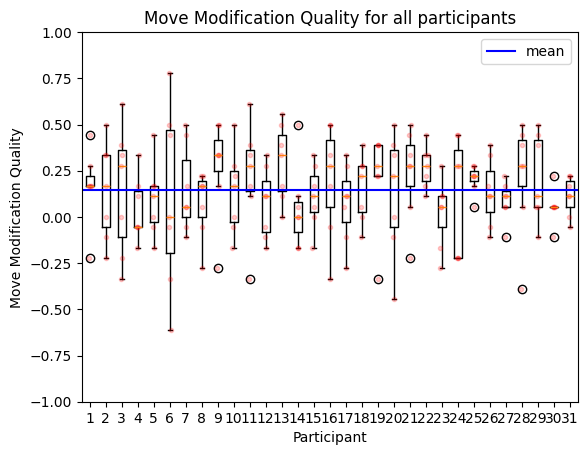

<Figure size 1500x1500 with 0 Axes>

TtestResult(statistic=11.039078841469165, pvalue=4.358952457216254e-12, df=30)


In [ ]:
graph_move_qualities(get_edges(optimal_visited1))

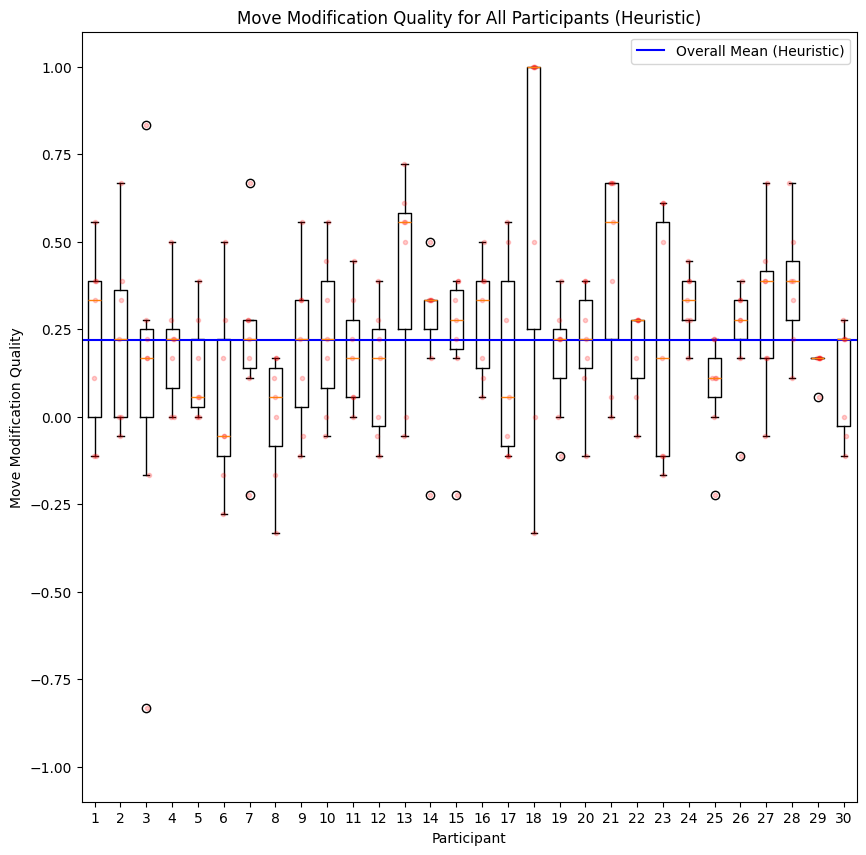

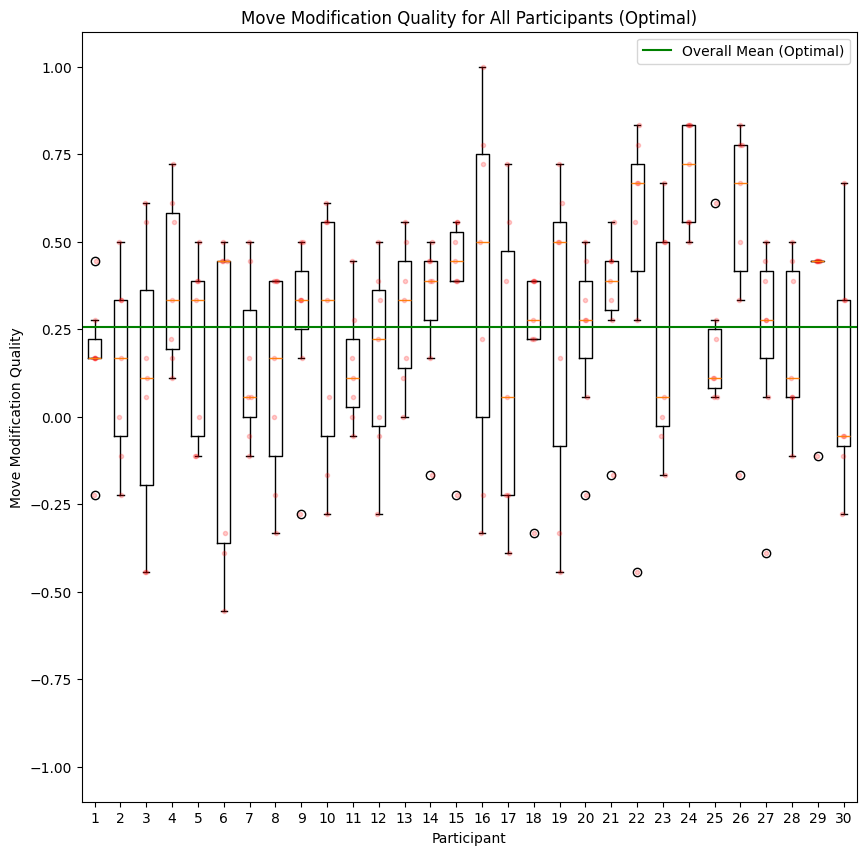

TtestResult(statistic=9.99077121433719, pvalue=6.739542942447965e-11, df=29)
TtestResult(statistic=10.052313742977855, pvalue=5.862278946967936e-11, df=29)


In [ ]:
graph_move_qualities_separate()

# **Comparing Heuristics to Optimal Solutions**

In [ ]:
def graph_data_three(trajectory1, trajectory2, trajectory3):
    # Convert trajectories to discrete if needed
    discrete_trajectory1 = convert_to_discrete(trajectory1)
    discrete_trajectory2 = convert_to_discrete(trajectory2)
    discrete_trajectory3 = convert_to_discrete(trajectory3)

    # Extract raw route data
    raw_x1, raw_z1 = zip(*trajectory1)
    raw_x2, raw_z2 = zip(*trajectory2)
    raw_x3, raw_z3 = zip(*trajectory3)

    # Extract discretized route data
    discrete_x1, discrete_z1 = zip(*discrete_trajectory1)
    discrete_x2, discrete_z2 = zip(*discrete_trajectory2)
    discrete_x3, discrete_z3 = zip(*discrete_trajectory3)

    plt.figure(figsize=(10, 10))

    # Grid limits
    x_min, x_max = -60, 70
    y_min, y_max = -70, 70
    grid_size = 10

    plt.xlim(x_min, x_max)
    plt.ylim(y_min, y_max)

    plt.xticks(range(x_min, x_max + 1, grid_size))
    plt.yticks(range(y_min, y_max + 1, grid_size))
    plt.grid(True)

    # Center of shop coordinates
    building_coords = {
        1: (-55, -55), 2: (-55, 5), 3: (-55, 35), 4: (-55, 65),
        5: (-35, -35), 6: (-35, 25), 7: (-5, -65), 8: (-15, 55),
        9: (15, 55), 10: (-5, 15), 11: (-5, -15), 12: (15, 25),
        13: (35, 25), 14: (55, 25), 15: (55, -15), 16: (25, -55),
        17: (45, -55), 18: (65, -65), 19: (55, 55)
    }

    # Shade the grid cells with buildings and place red dots at the center
    for coord in building_coords.values():
        x_center, y_center = coord
        x = x_center - grid_size / 2
        y = y_center - grid_size / 2
        plt.fill_betweenx([y, y + grid_size], x, x + grid_size, color='red', alpha=0.3)
        plt.plot(x_center, y_center, 'ro')

    # Plot the three trajectories with dotted lines
    plt.plot(discrete_x1, discrete_z1, 'ko--', label='Optimal Solution (Black)', linewidth=2, markersize=8, alpha=0.3)
    plt.plot(discrete_x2, discrete_z2, 'go:', label='NN (Green)', linewidth=2, markersize=8, alpha=0.3)
    plt.plot(discrete_x3, discrete_z3, 'ro:', label='NN Reverse (Red)', linewidth=2, markersize=8, alpha=0.3)

    # Read and plot walls data
    walls_data = pd.read_csv("/content/drive/MyDrive/trajectory_analysis/OnlineNavigation/walls.csv")
    x_origins = walls_data['X_origin']
    z_origins = walls_data['Z_origin']

    for x_origin, z_origin in zip(x_origins, z_origins):
        x_center = round((x_origin // grid_size) * grid_size + grid_size / 2)
        y_center = round((z_origin // grid_size) * grid_size + grid_size / 2)
        x = x_center - grid_size / 2
        y = y_center - grid_size / 2
        plt.fill_betweenx([y, y + grid_size], x, x + grid_size, color='gray', alpha=0.5)
        plt.plot(x_origin, z_origin, 'ko')

    # Labels, title, and legend
    plt.xlabel('X Coordinate')
    plt.ylabel('Y Coordinate')
    plt.title('Comparison of NN and Optimal Solution with Dotted Lines')
    plt.legend(loc='upper right', bbox_to_anchor=(1, 1), framealpha=0.9, fontsize='medium')

    # Display the plot
    plt.show()

In [ ]:
def graph_data_two(trajectory1, trajectory2):
    # Convert trajectories to discrete if needed
    discrete_trajectory1 = convert_to_discrete(trajectory1)
    discrete_trajectory2 = convert_to_discrete(trajectory2)

    # Extract discretized route data
    discrete_x1, discrete_z1 = zip(*discrete_trajectory1)
    discrete_x2, discrete_z2 = zip(*discrete_trajectory2)

    plt.figure(figsize=(10, 10))

    # Grid limits
    x_min, x_max = -60, 70
    y_min, y_max = -70, 70
    grid_size = 10

    plt.xlim(x_min, x_max)
    plt.ylim(y_min, y_max)

    plt.xticks(range(x_min, x_max + 1, grid_size))
    plt.yticks(range(y_min, y_max + 1, grid_size))
    plt.grid(True)

    # Center of shop coordinates
    building_coords = {
        1: (-55, -55), 2: (-55, 5), 3: (-55, 35), 4: (-55, 65),
        5: (-35, -35), 6: (-35, 25), 7: (-5, -65), 8: (-15, 55),
        9: (15, 55), 10: (-5, 15), 11: (-5, -15), 12: (15, 25),
        13: (35, 25), 14: (55, 25), 15: (55, -15), 16: (25, -55),
        17: (45, -55), 18: (65, -65), 19: (55, 55)
    }

    # Shade the grid cells with buildings and place red dots at the center
    for coord in building_coords.values():
        x_center, y_center = coord
        x = x_center - grid_size / 2
        y = y_center - grid_size / 2
        plt.fill_betweenx([y, y + grid_size], x, x + grid_size, color='red', alpha=0.3)
        plt.plot(x_center, y_center, 'ro')

    # Plot the three trajectories with dotted lines
    plt.plot(discrete_x1, discrete_z1, 'bo-', label='Optimal Solution (Blue)', linewidth=2, markersize=8, alpha=0.3)
    plt.plot(discrete_x2, discrete_z2, 'ro:', label='NN (Red)', linewidth=2, markersize=8, alpha=0.5)

    # Read and plot walls data
    walls_data = pd.read_csv("/content/drive/MyDrive/trajectory_analysis/OnlineNavigation/walls.csv")
    x_origins = walls_data['X_origin']
    z_origins = walls_data['Z_origin']

    for x_origin, z_origin in zip(x_origins, z_origins):
        x_center = round((x_origin // grid_size) * grid_size + grid_size / 2)
        y_center = round((z_origin // grid_size) * grid_size + grid_size / 2)
        x = x_center - grid_size / 2
        y = y_center - grid_size / 2
        plt.fill_betweenx([y, y + grid_size], x, x + grid_size, color='gray', alpha=0.5)
        plt.plot(x_origin, z_origin, 'ko')

    # Labels, title, and legend
    plt.xlabel('X Coordinate')
    plt.ylabel('Y Coordinate')
    plt.title('Comparison of NN and Optimal Solution with Dotted Lines')
    plt.legend(loc='upper right', bbox_to_anchor=(1, 1), framealpha=0.9, fontsize='medium')

    # Display the plot
    plt.show()

In [ ]:
#Plot of GOO and NN solutions
def compare_nn_optimal():
    optimal_solutions = [optimal_solution, optimal_solution2, optimal_solution3, optimal_solution4, optimal_solution5,
                         optimal_solution6, optimal_solution7, optimal_solution8, optimal_solution9, optimal_solution10,
                         optimal_solution11, optimal_solution12, optimal_solution13, optimal_solution14, optimal_solution15]
    for solution in optimal_solutions:
        frechet_nn = frechet(solution, nn_solution)
        frechet_nn_reverse = frechet(solution, nn_reverse)
        if frechet_nn < frechet_nn_reverse:
            print(frechet_nn)
            graph_data_normal(solution)
            graph_data_normal(nn_solution)
            graph_data_two(solution, nn_solution)
        else:
            print(frechet_nn_reverse)
            graph_data_normal(solution)
            graph_data_normal(nn_reverse)
            graph_data_two(solution, nn_reverse)

58.309518948453004


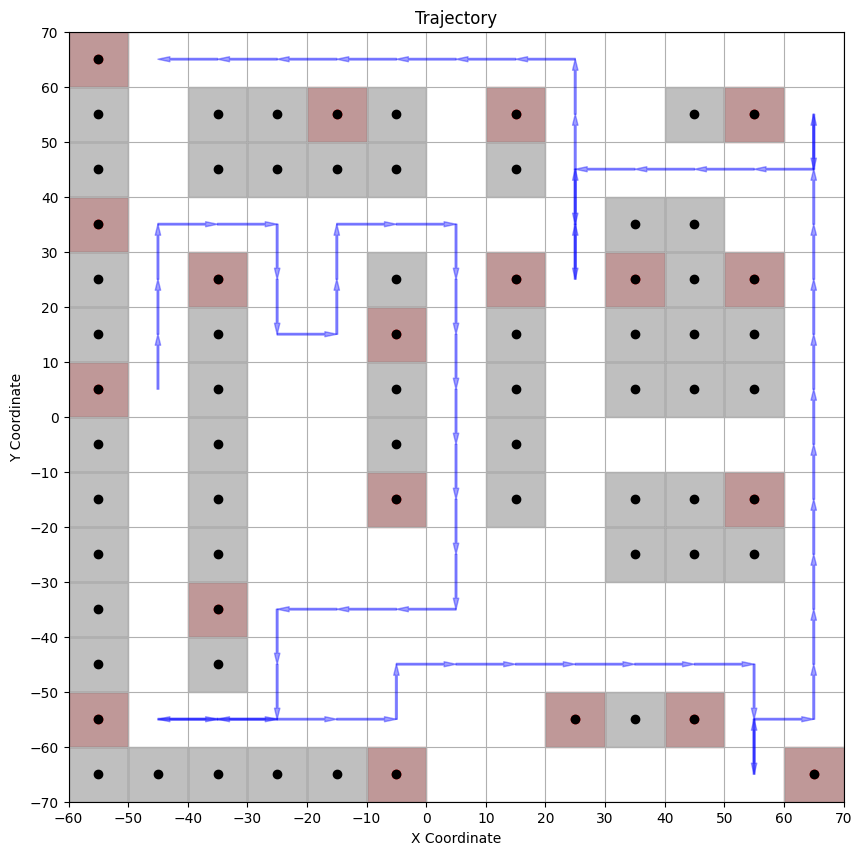

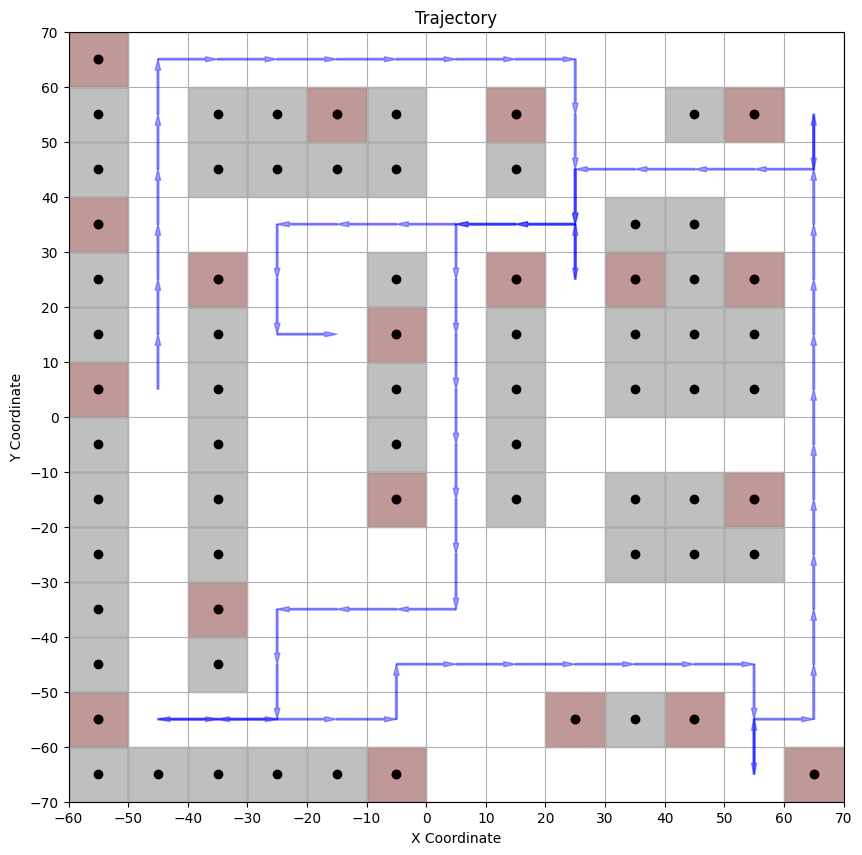

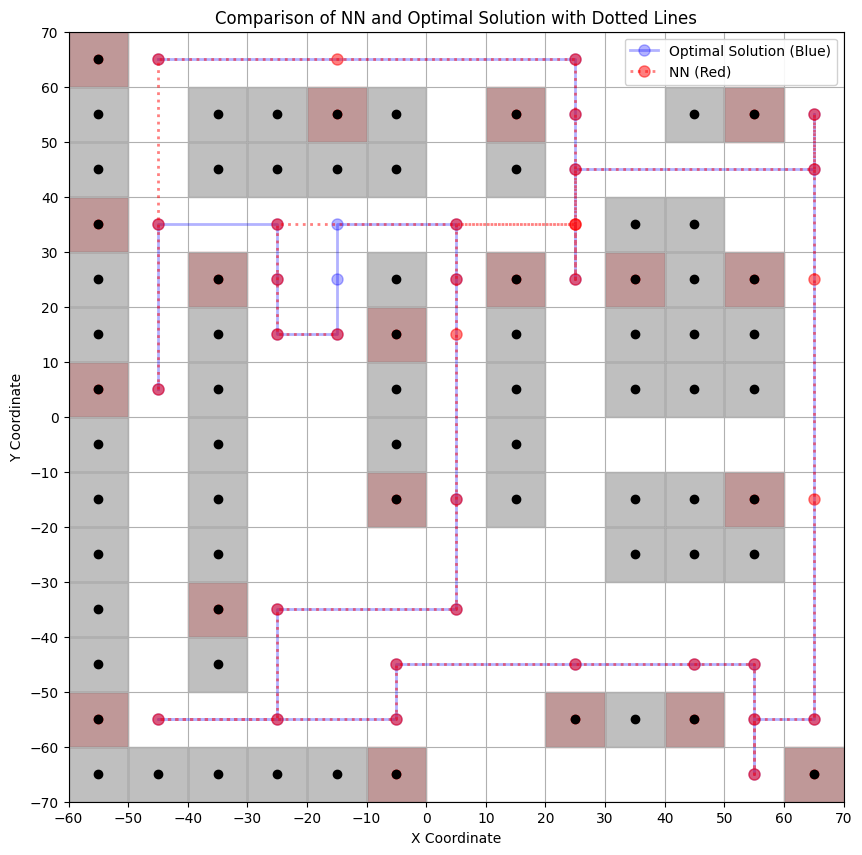

63.245553203367585


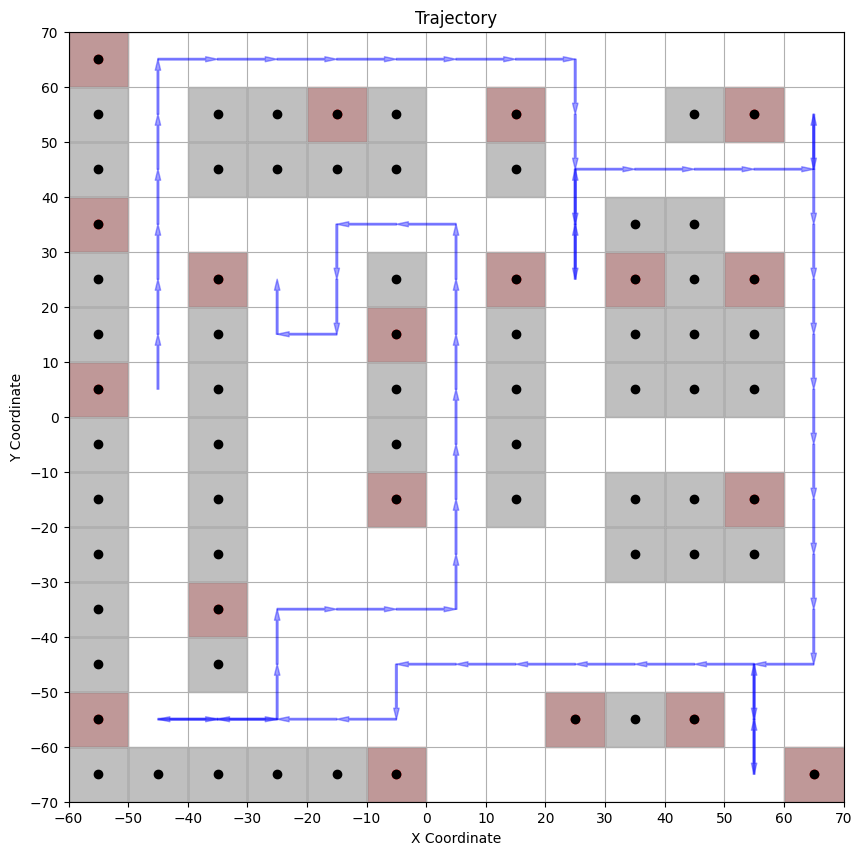

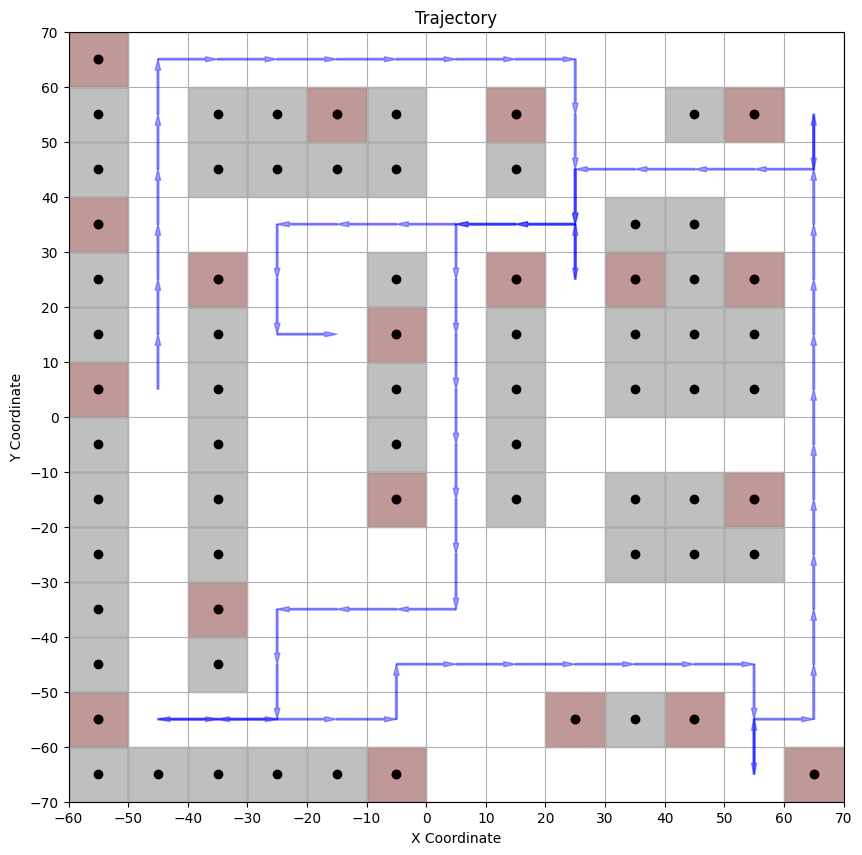

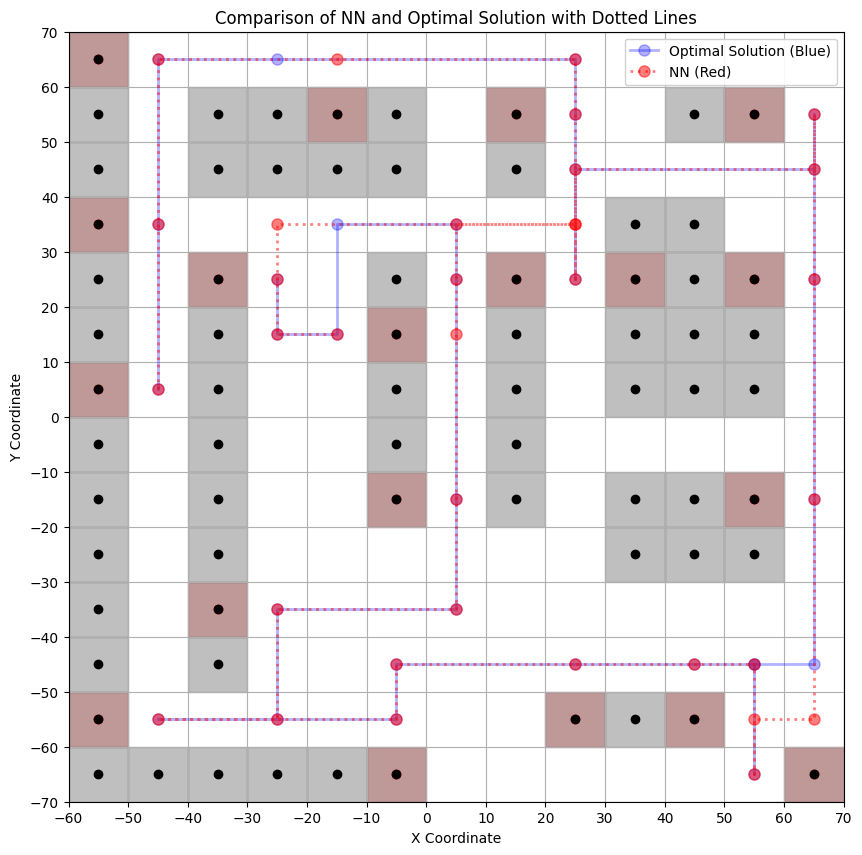

63.245553203367585


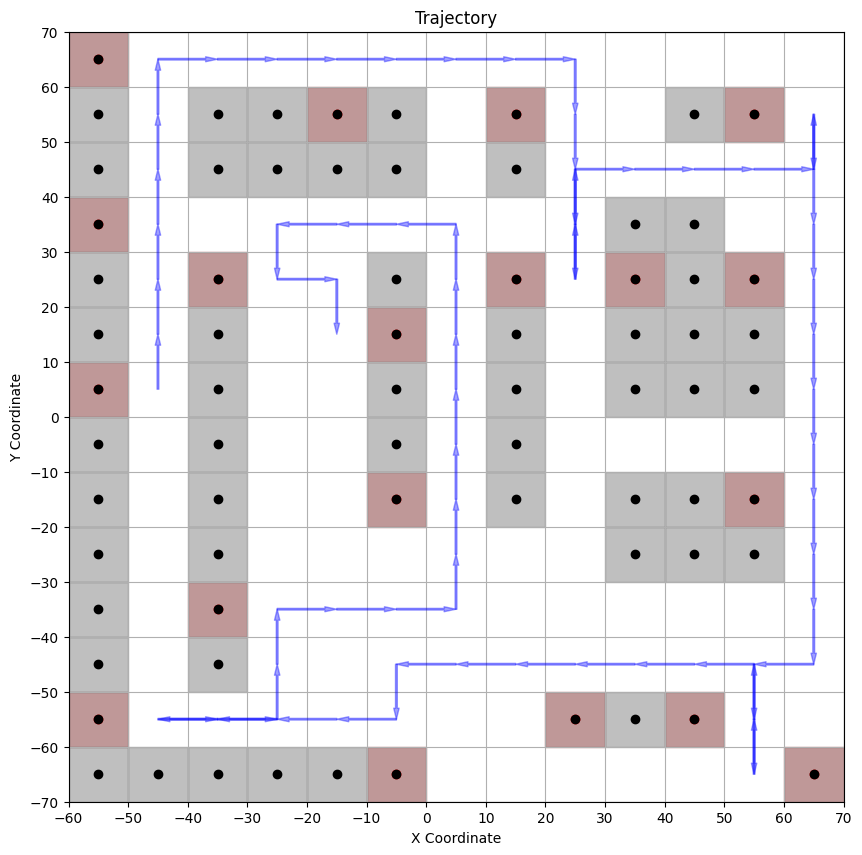

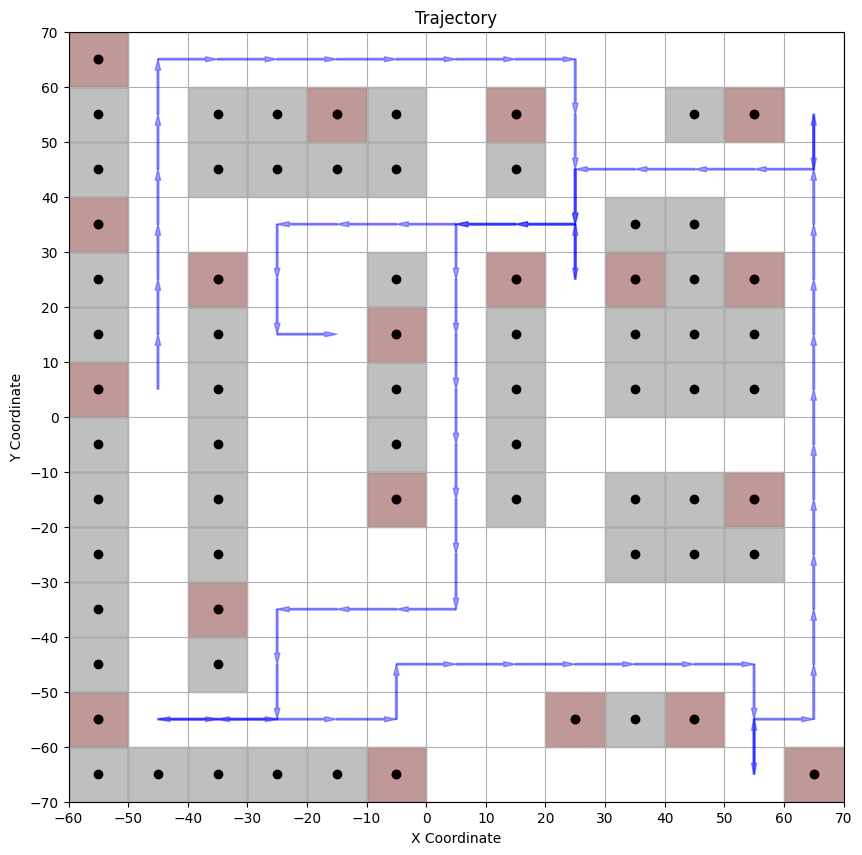

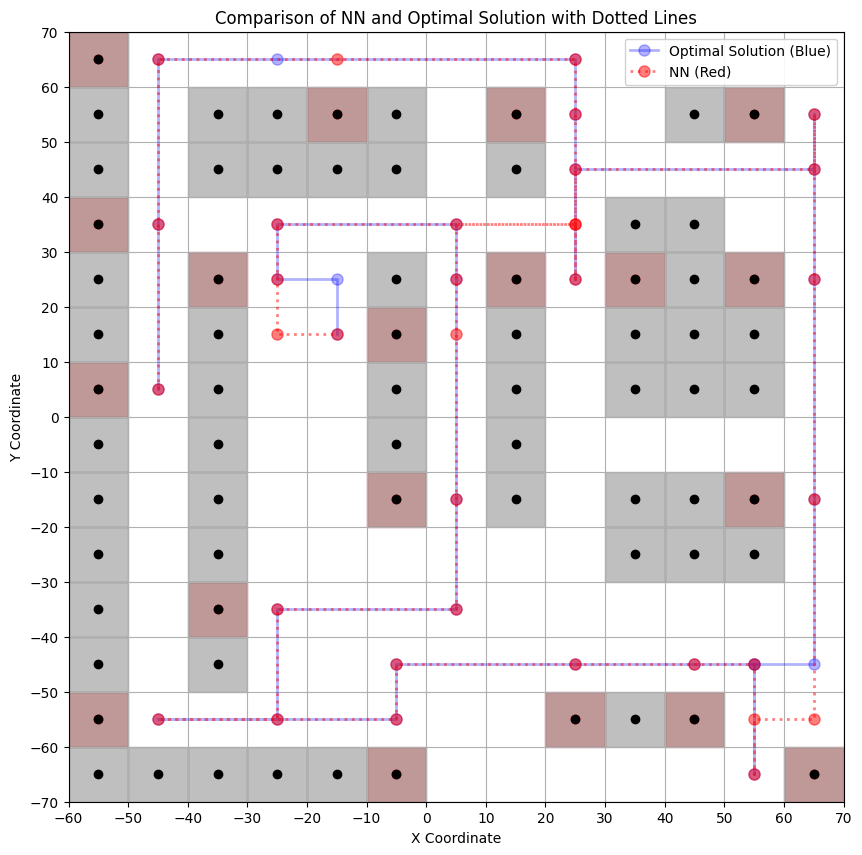

90.55385138137417


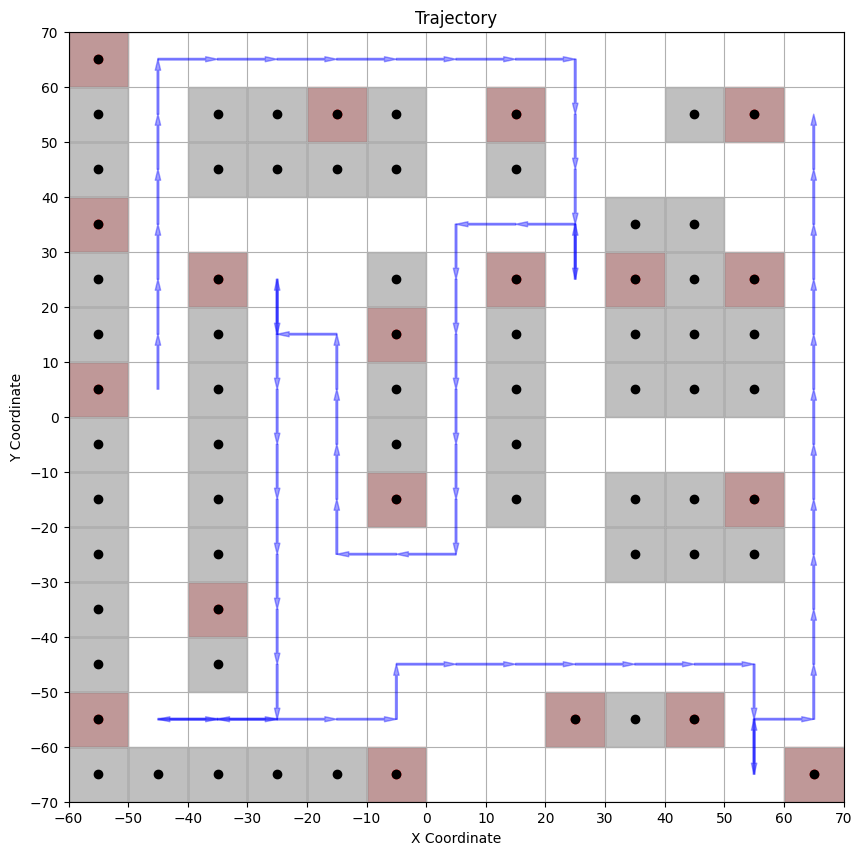

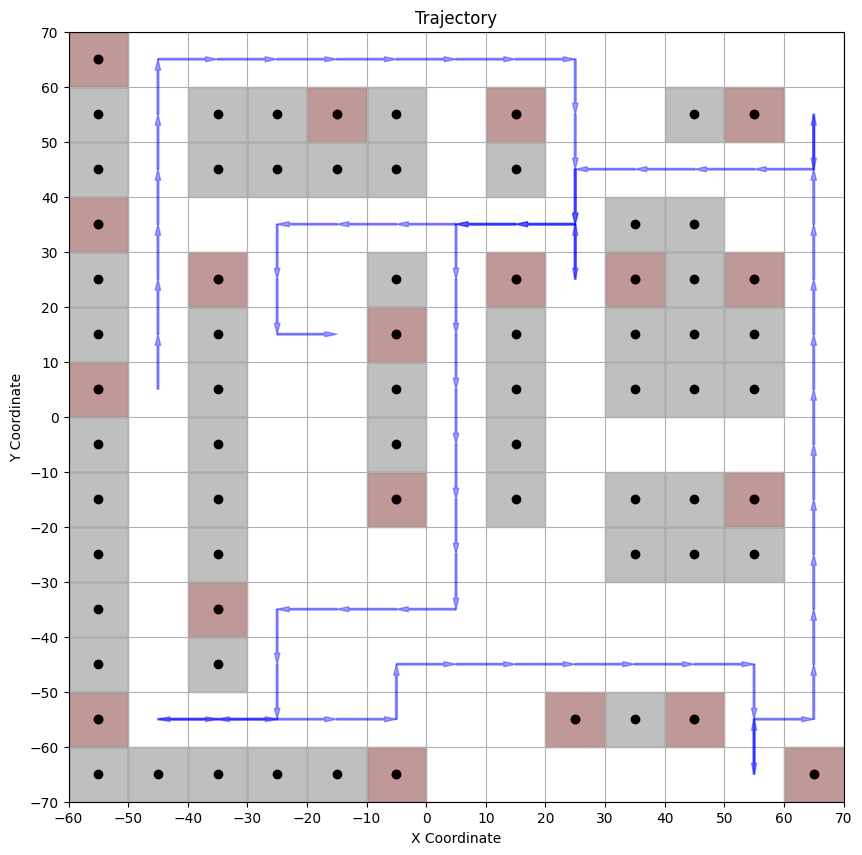

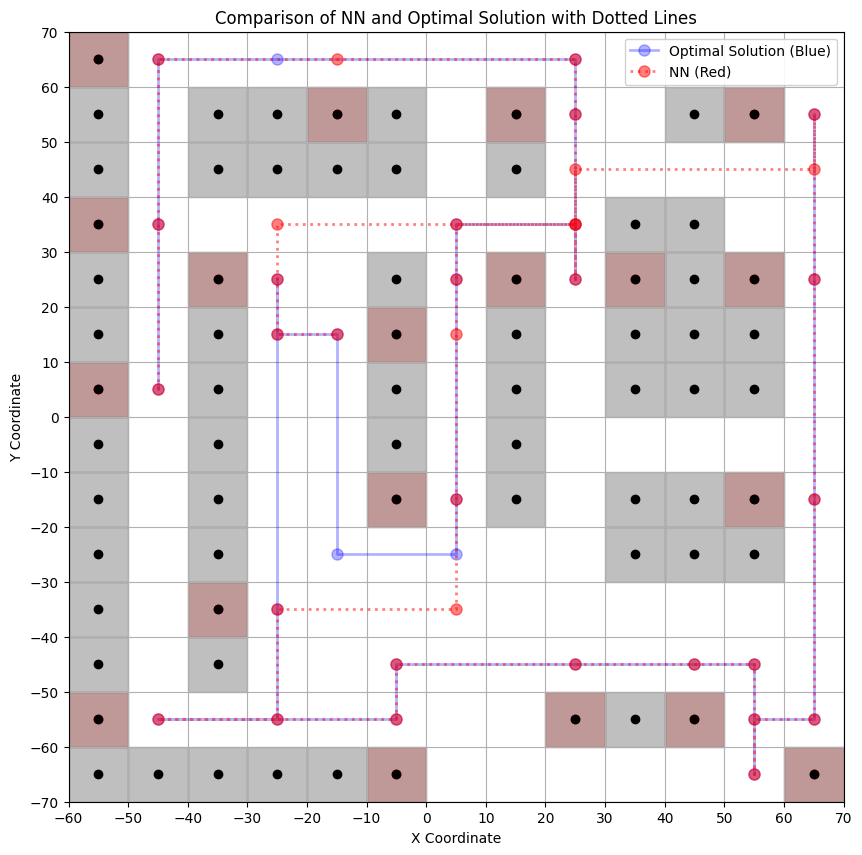

90.55385138137417


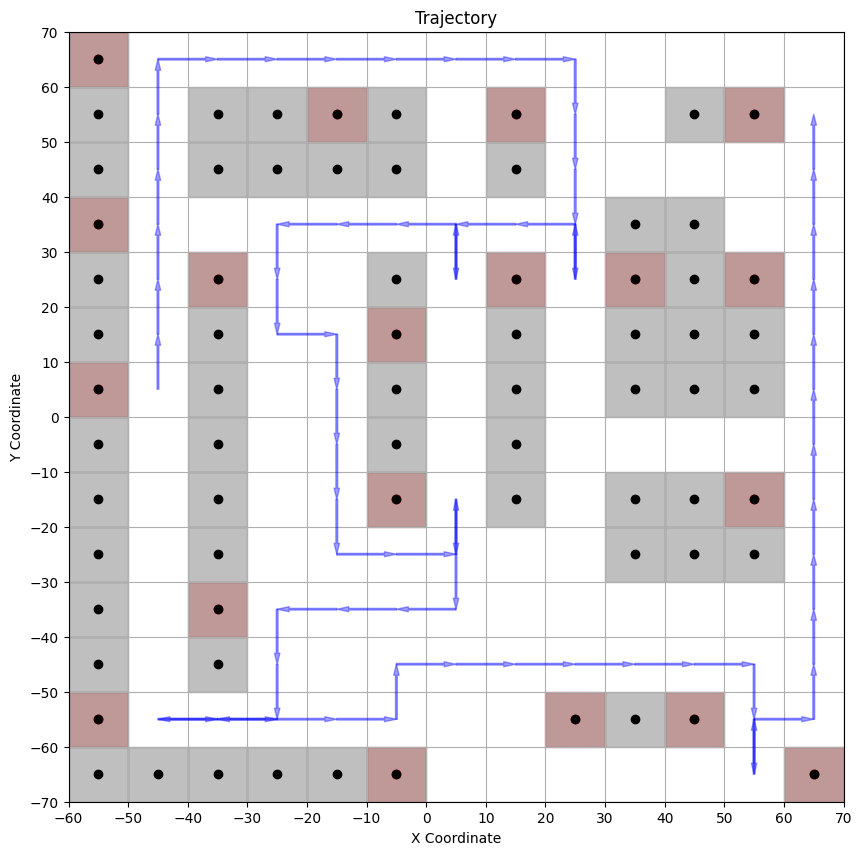

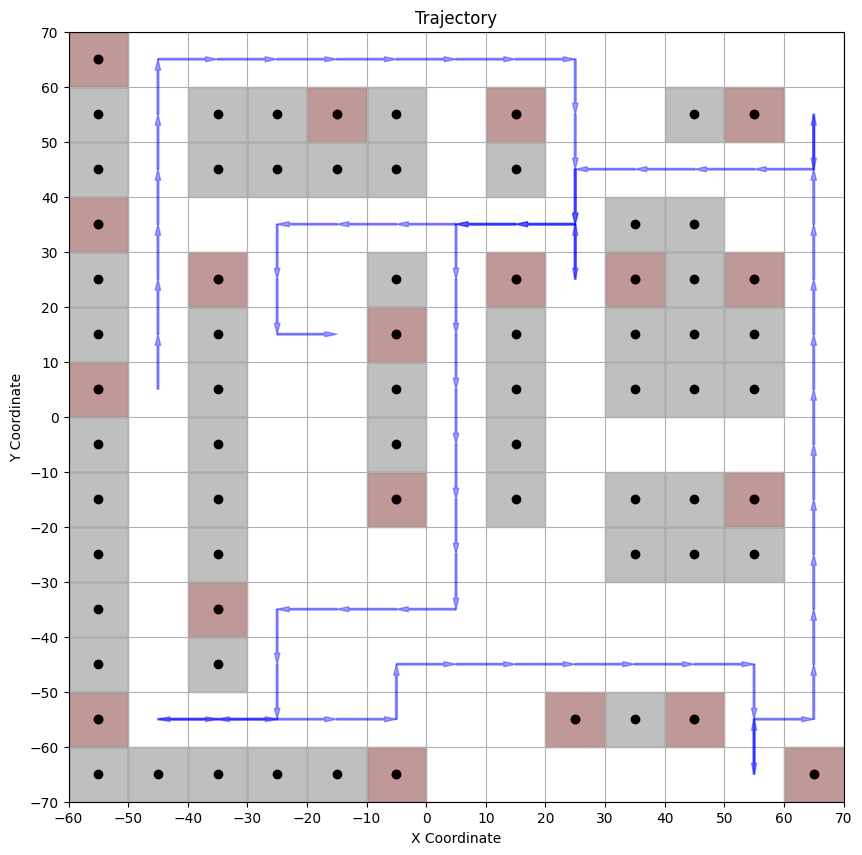

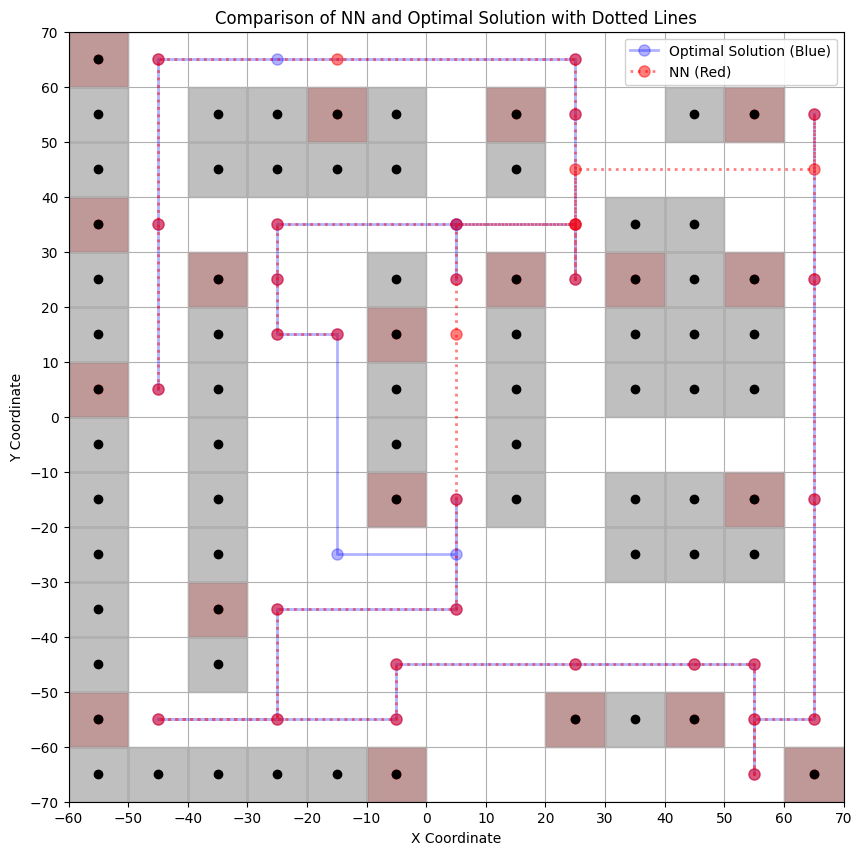

90.55385138137417


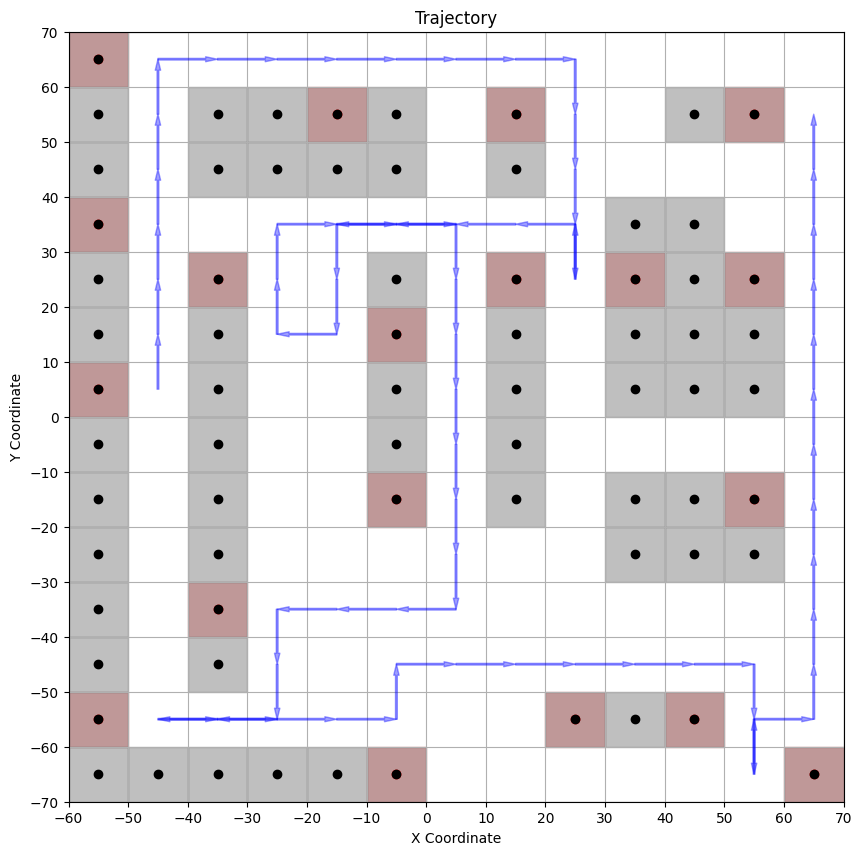

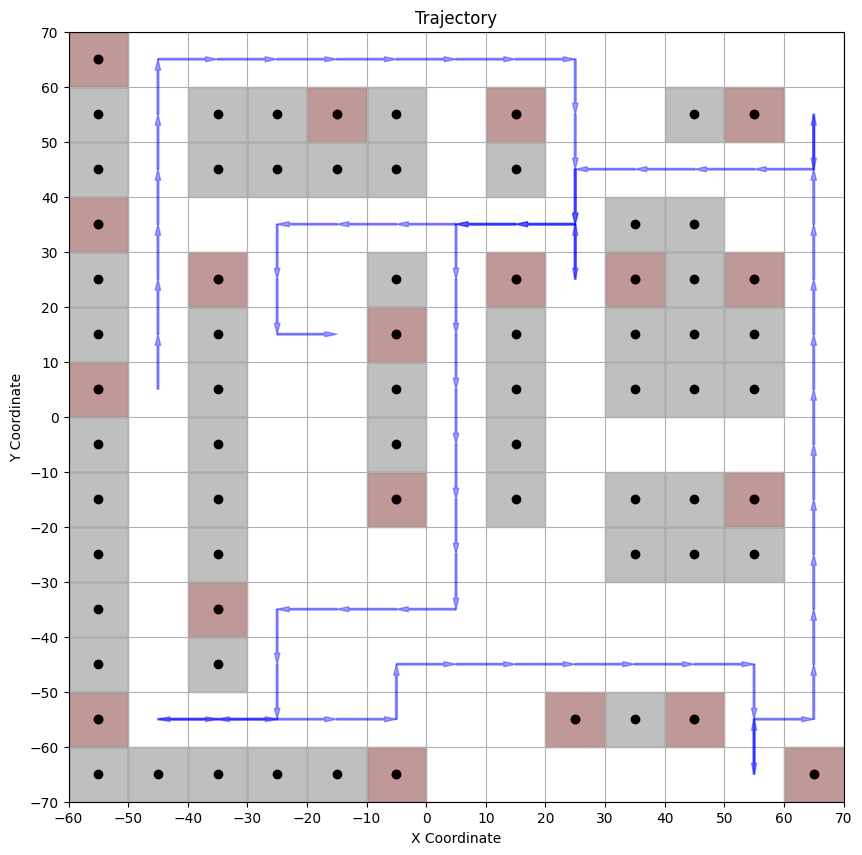

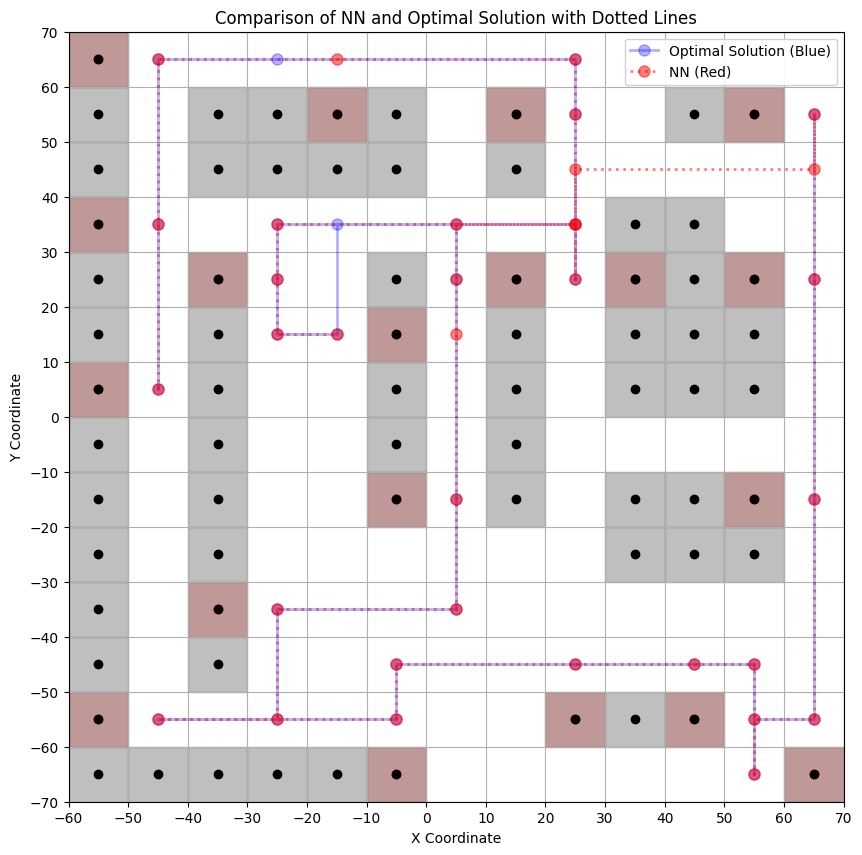

90.55385138137417


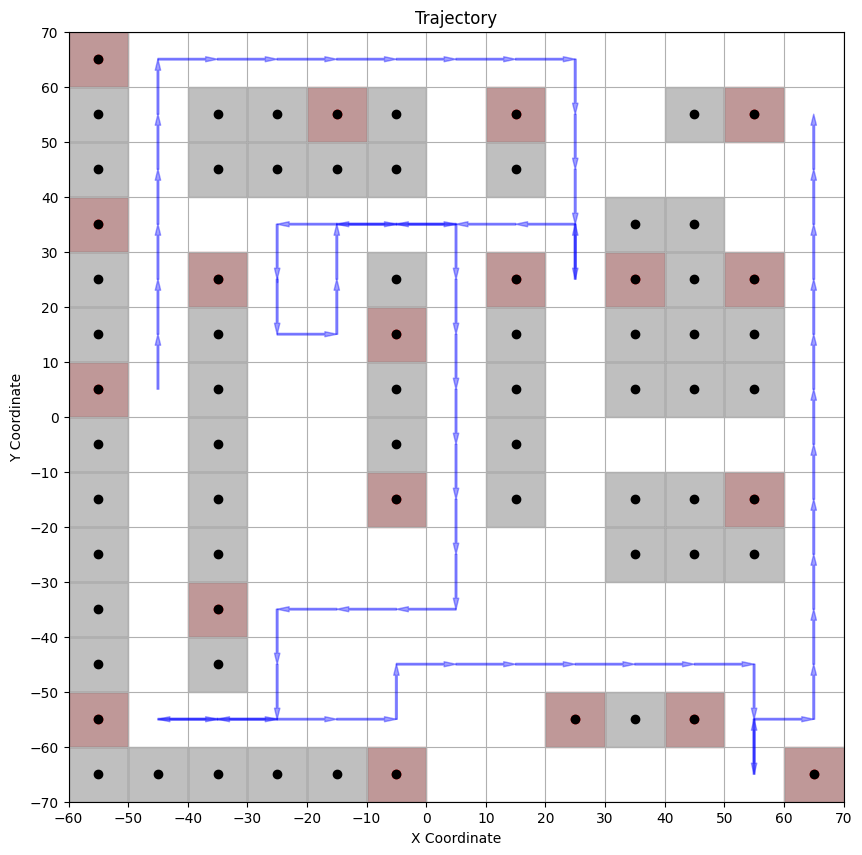

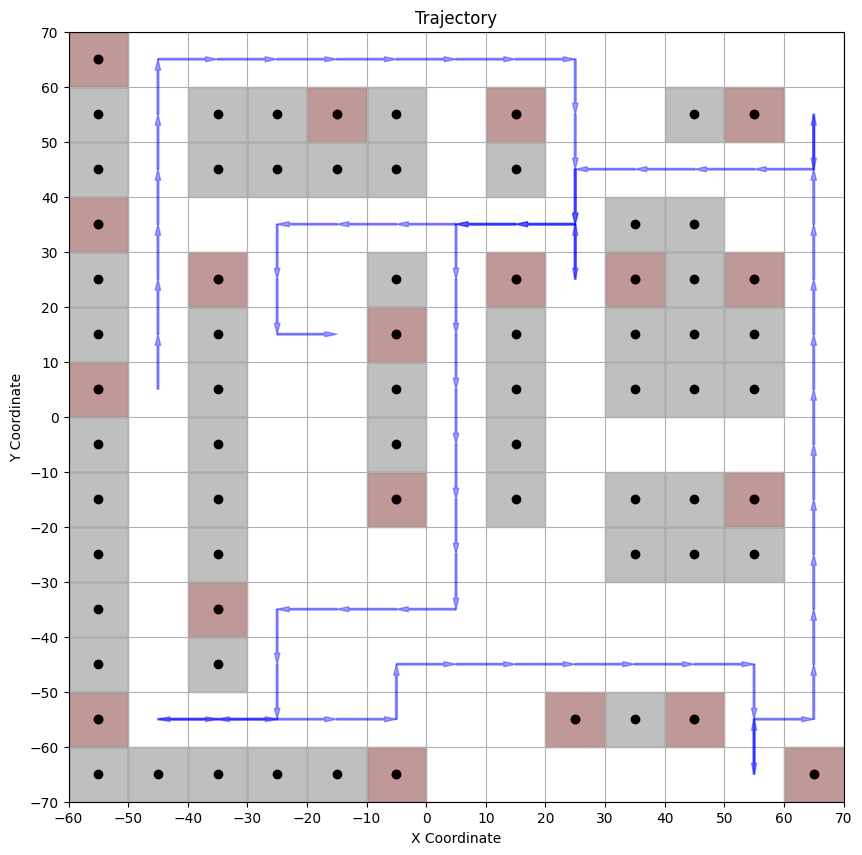

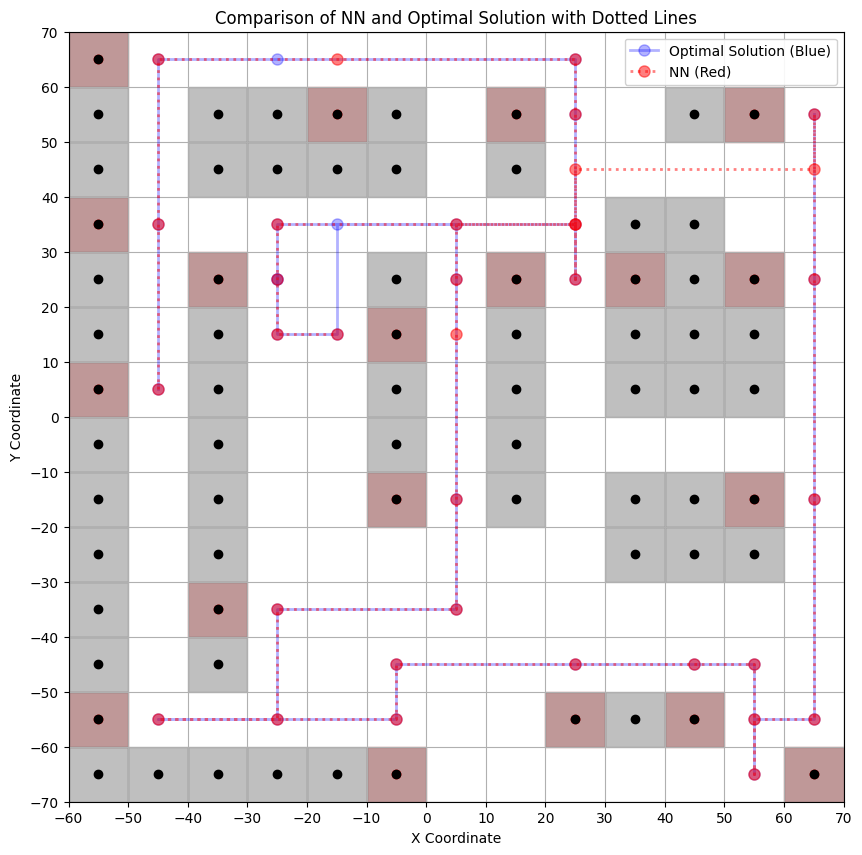

90.55385138137417


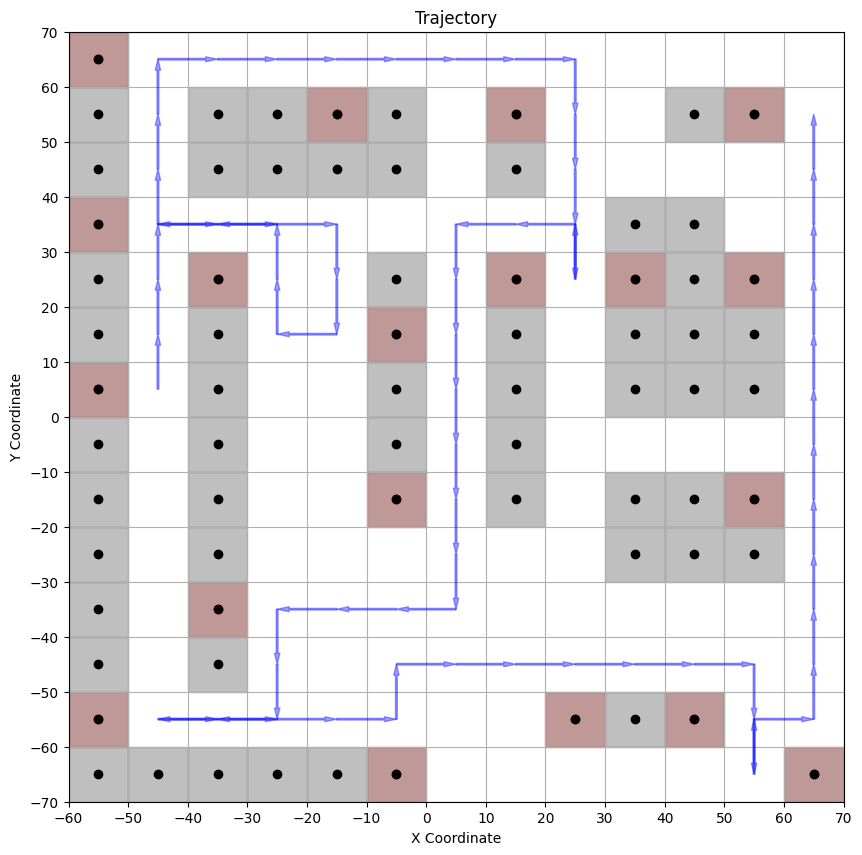

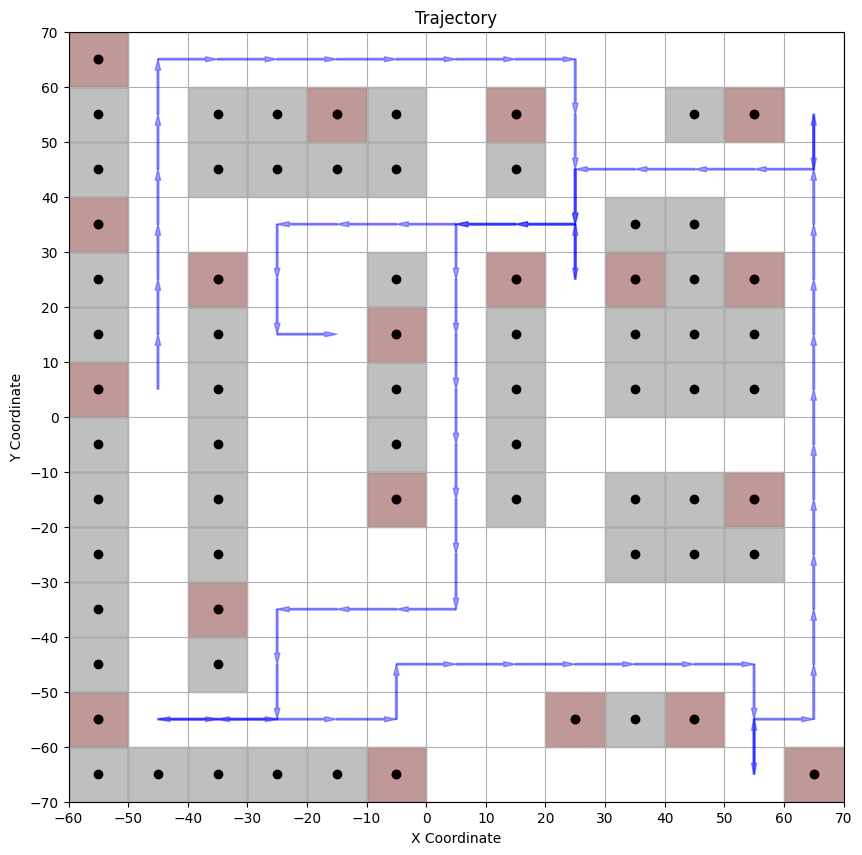

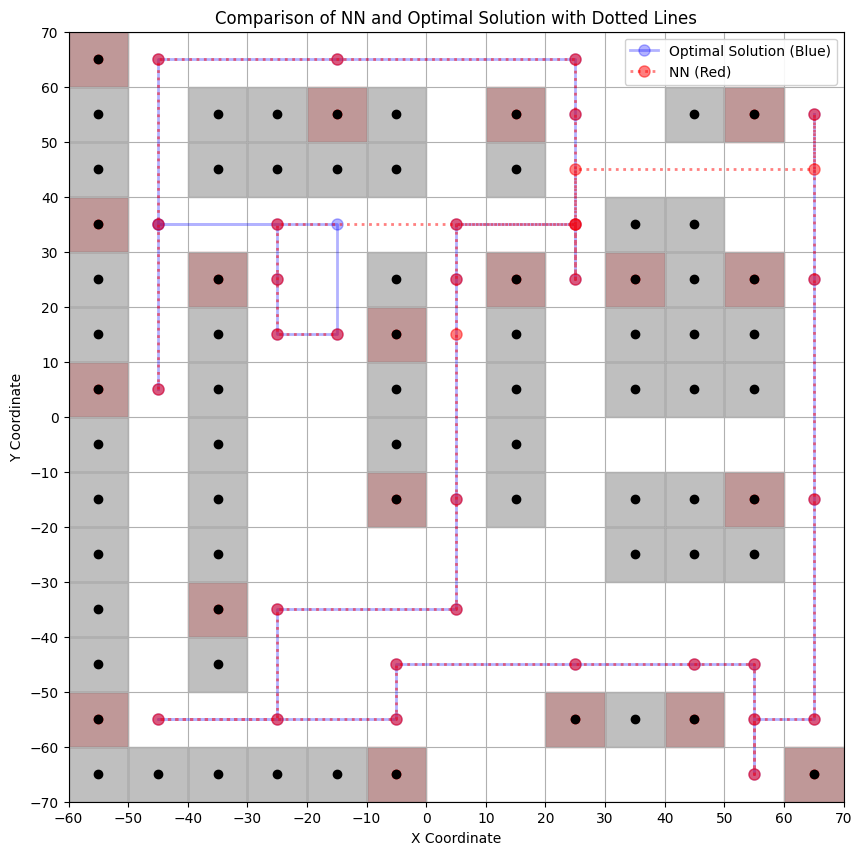

90.55385138137417


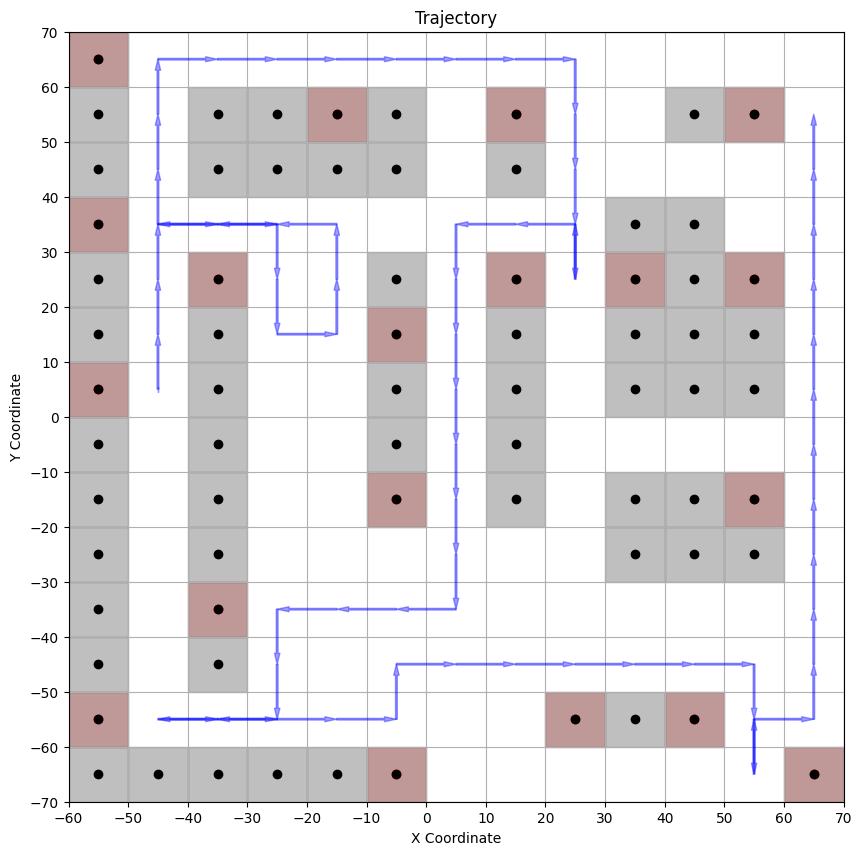

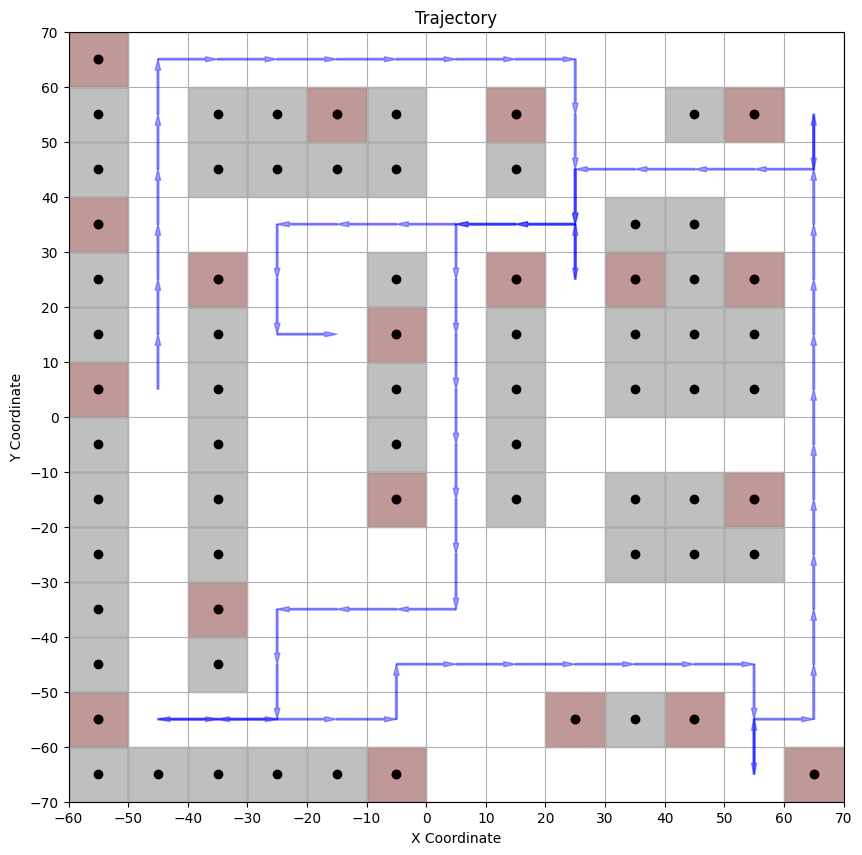

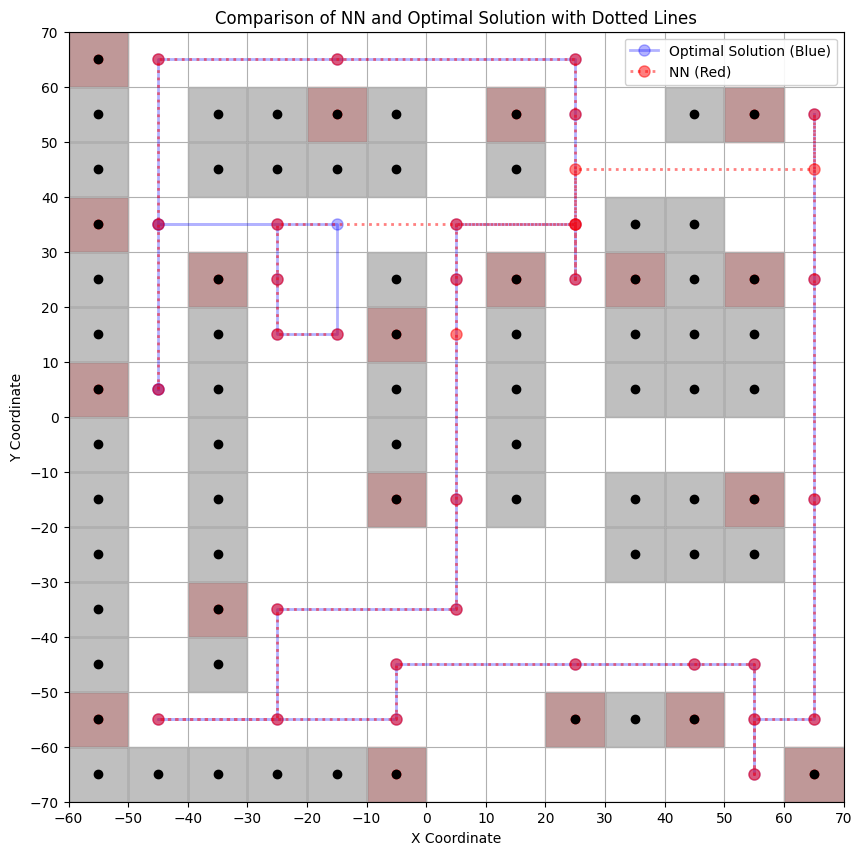

90.55385138137417


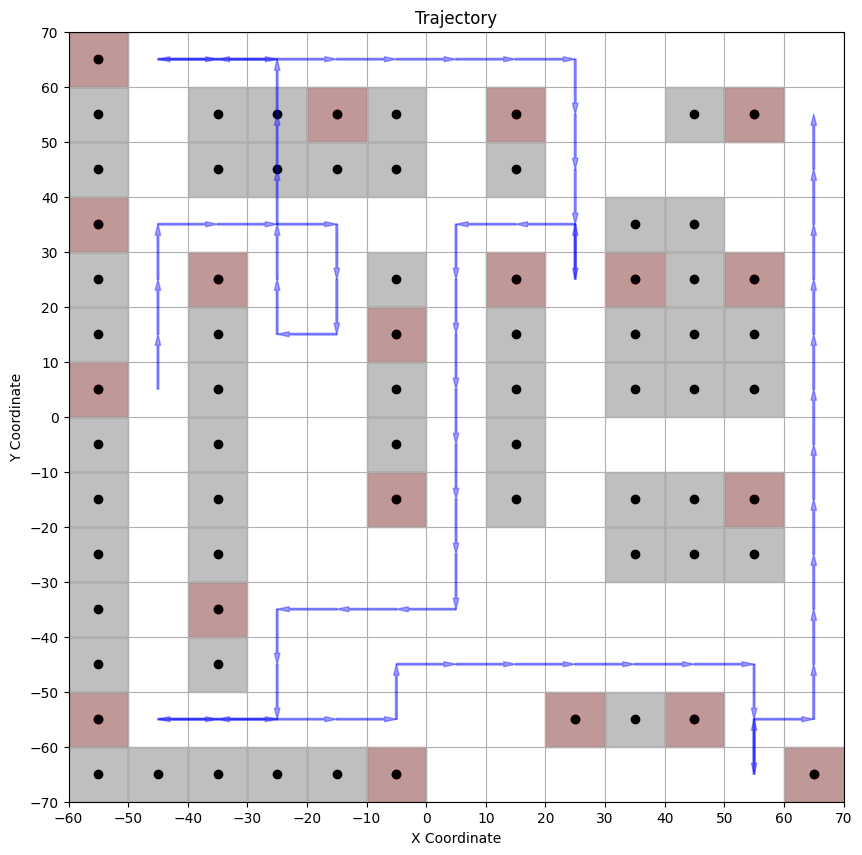

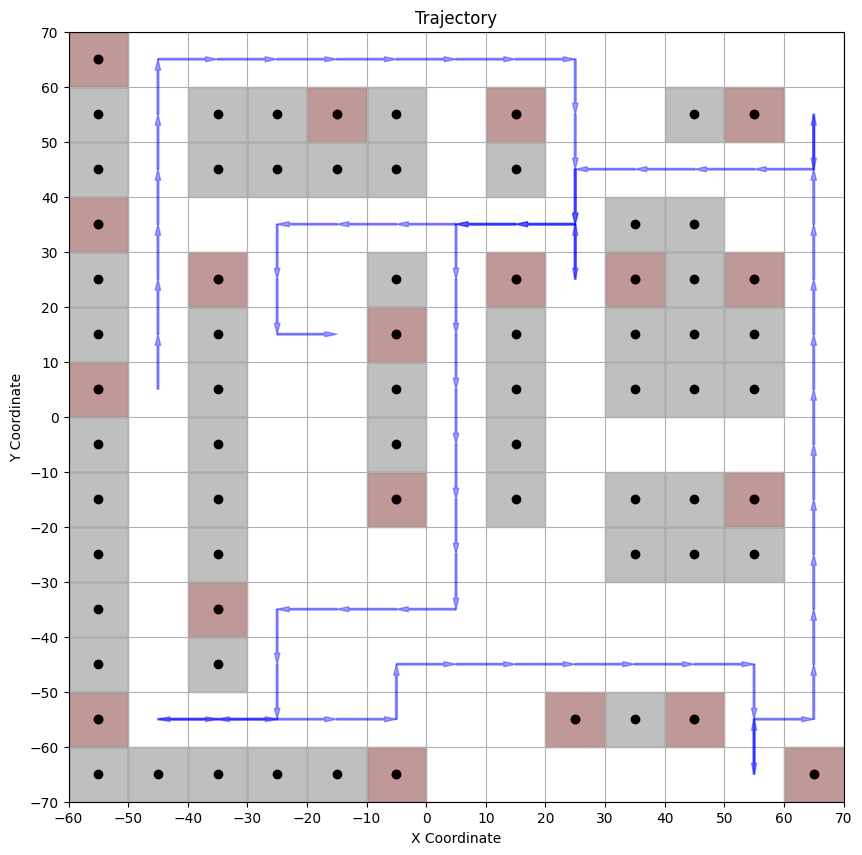

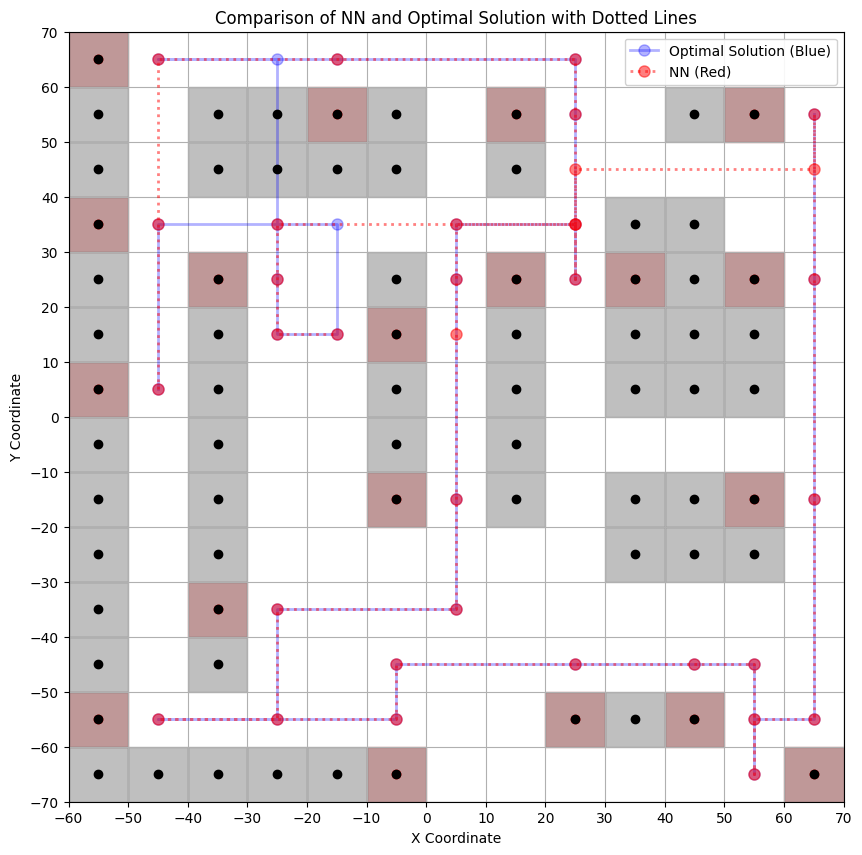

90.55385138137417


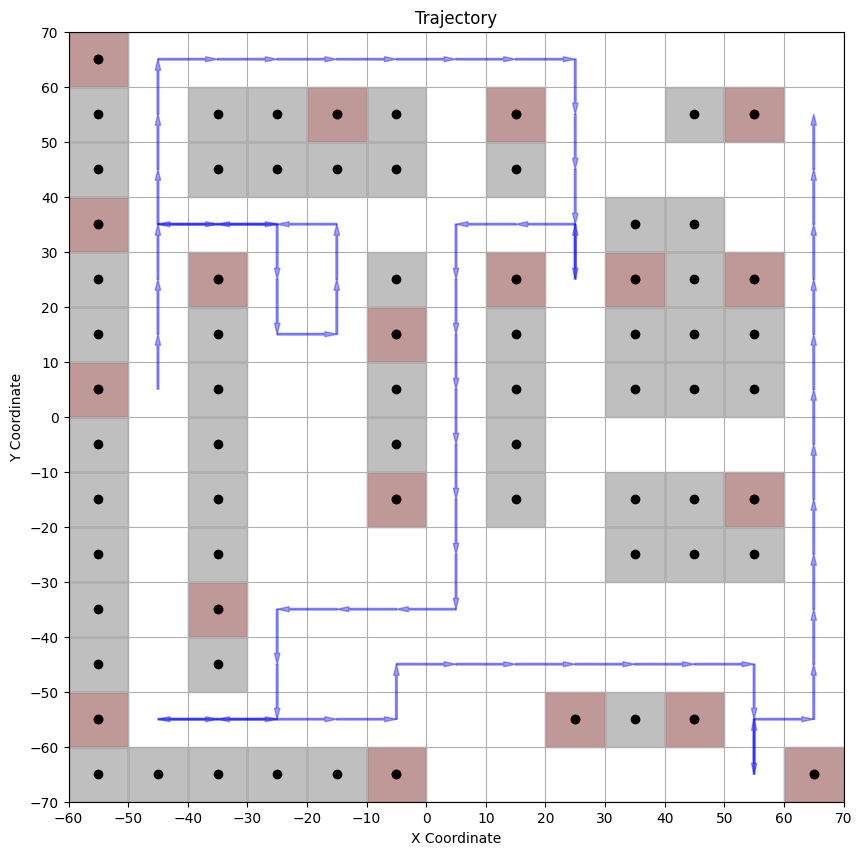

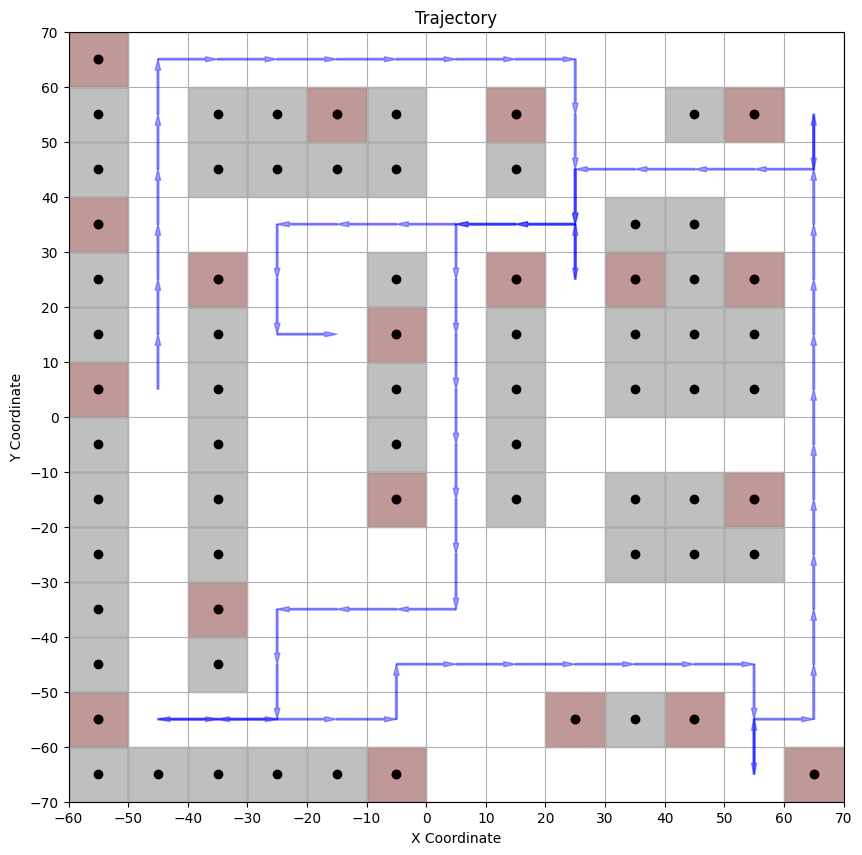

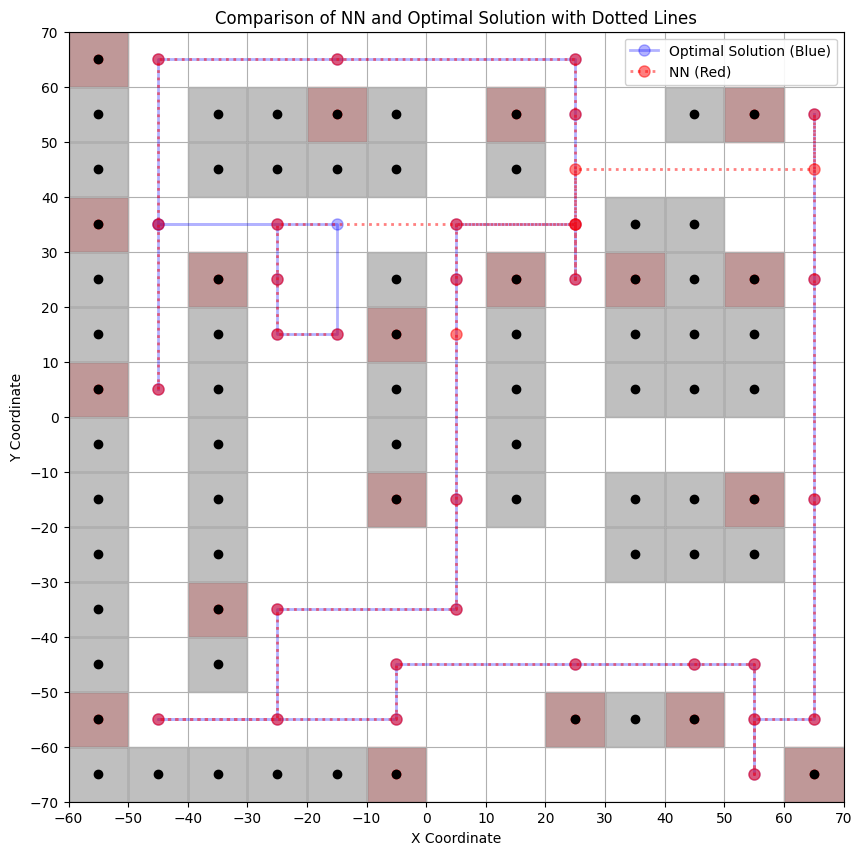

90.55385138137417


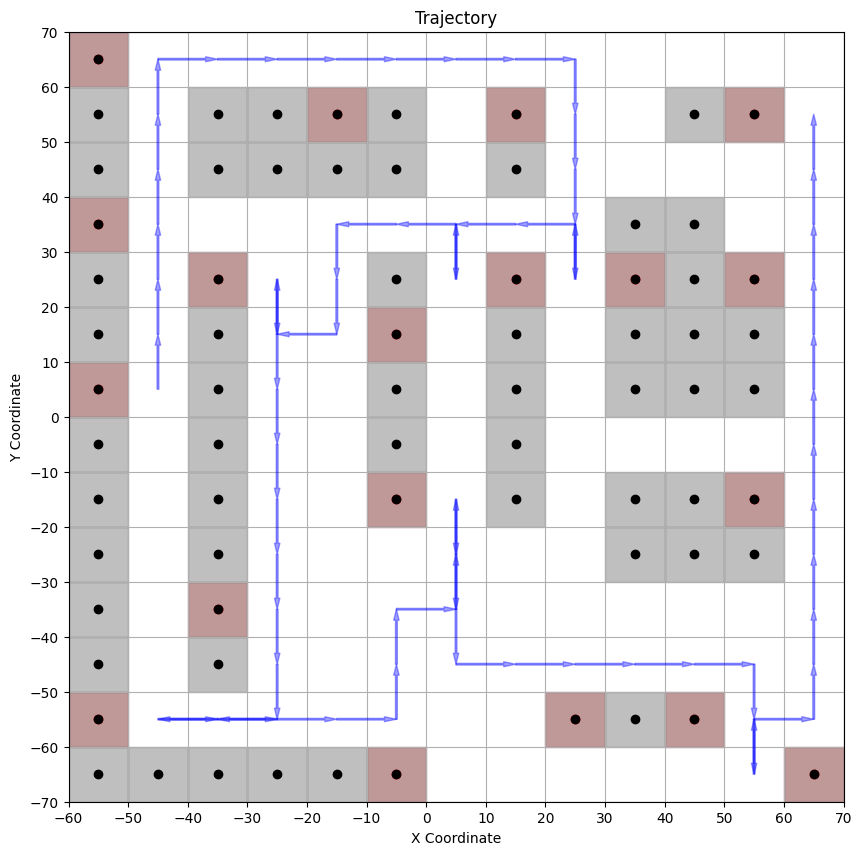

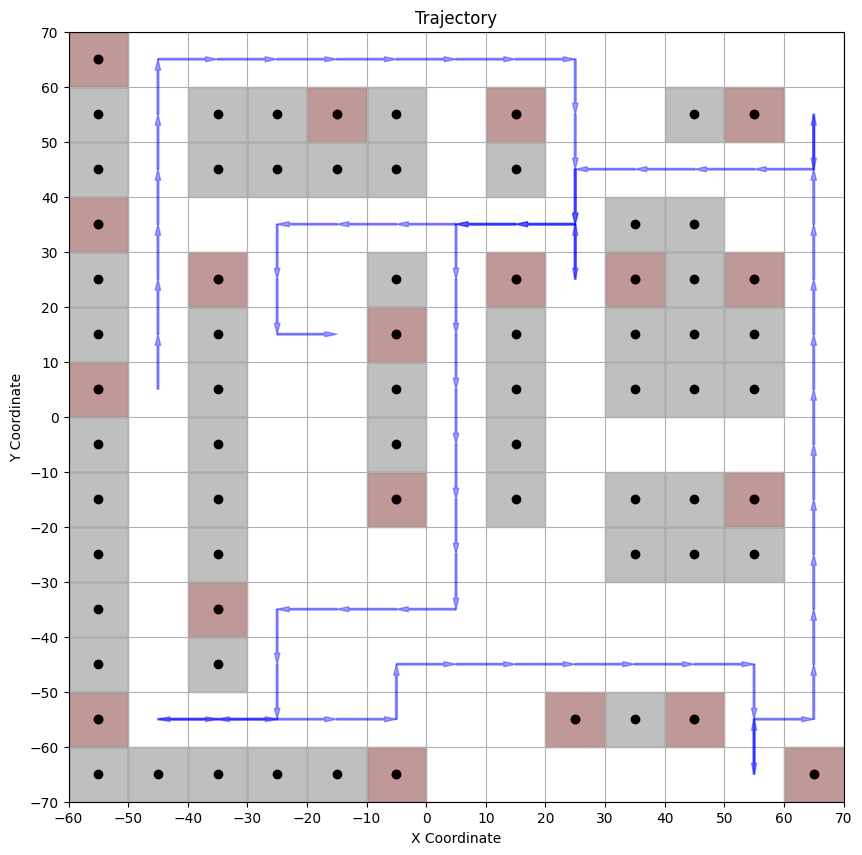

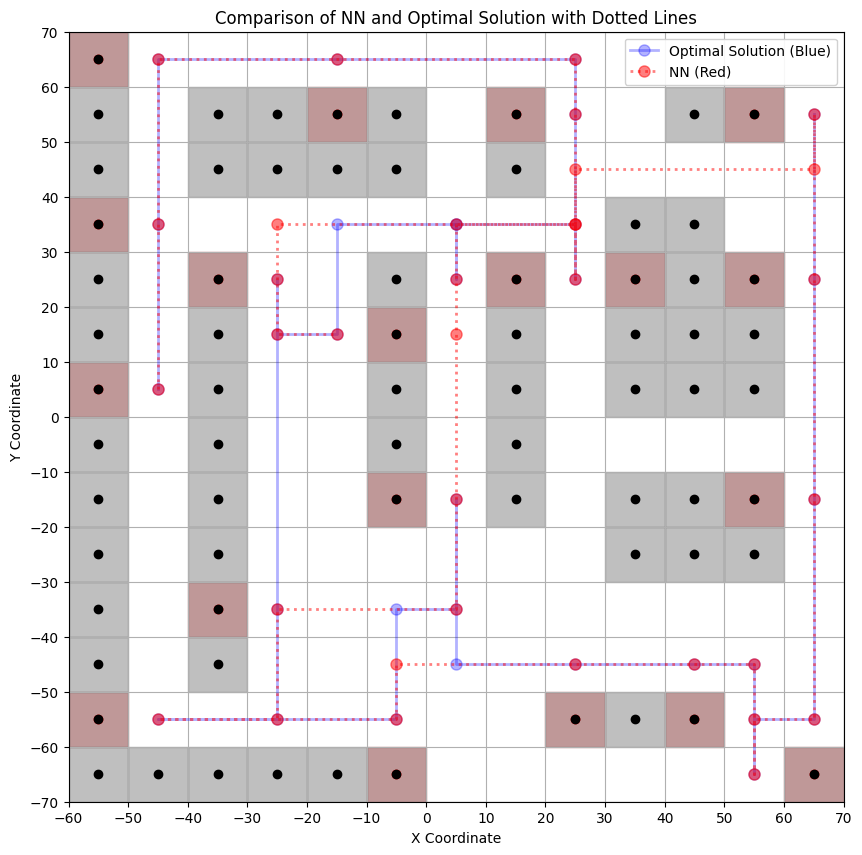

90.55385138137417


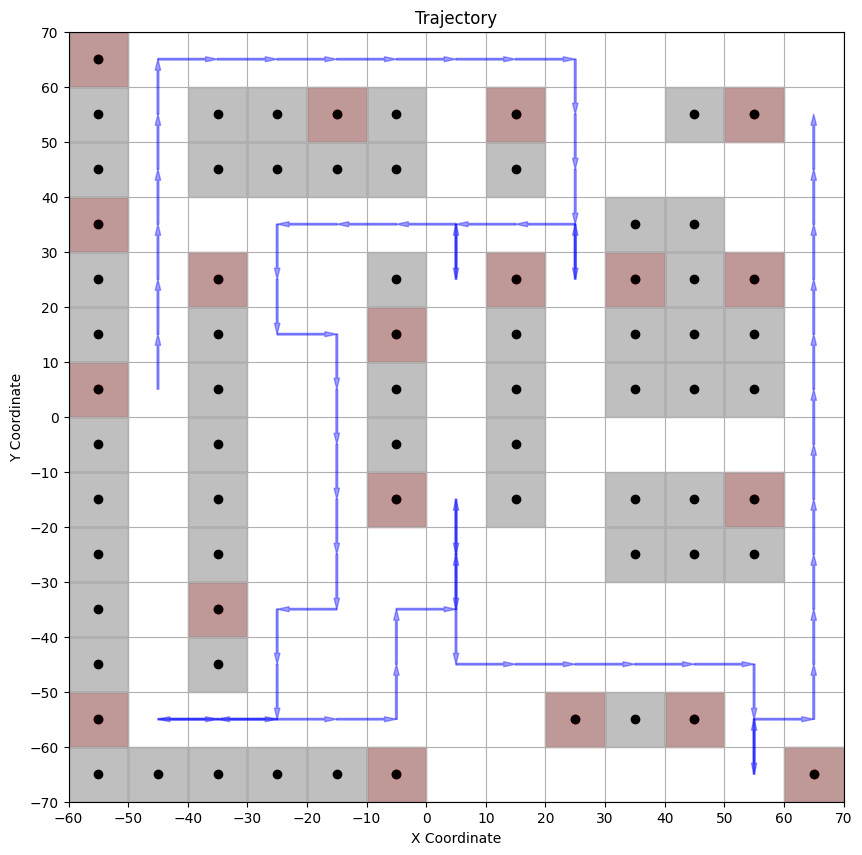

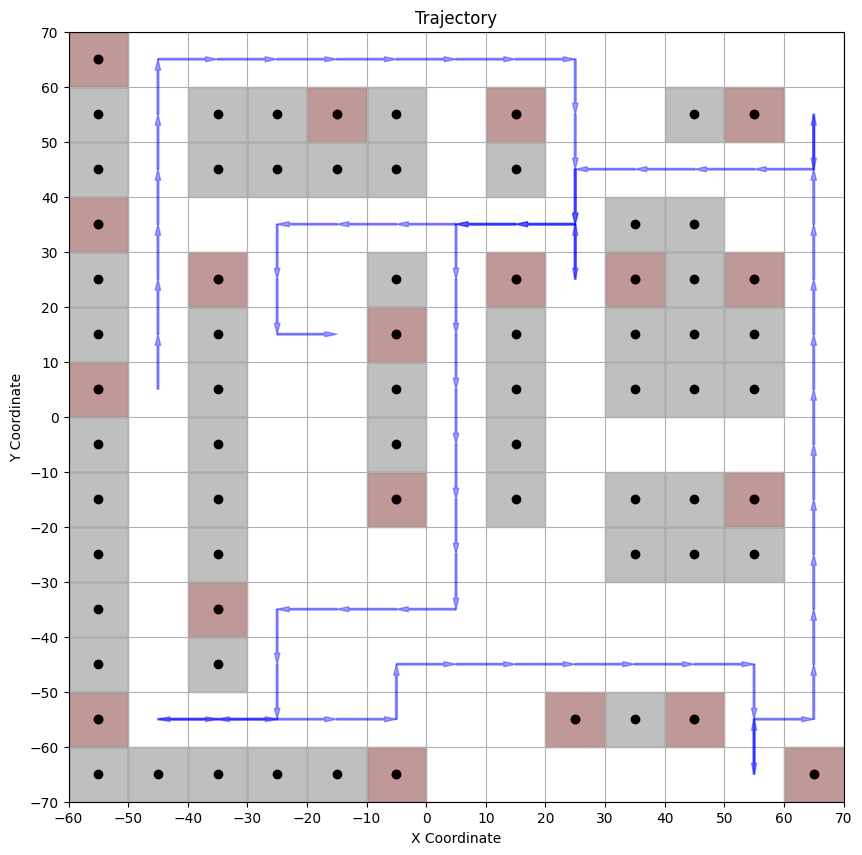

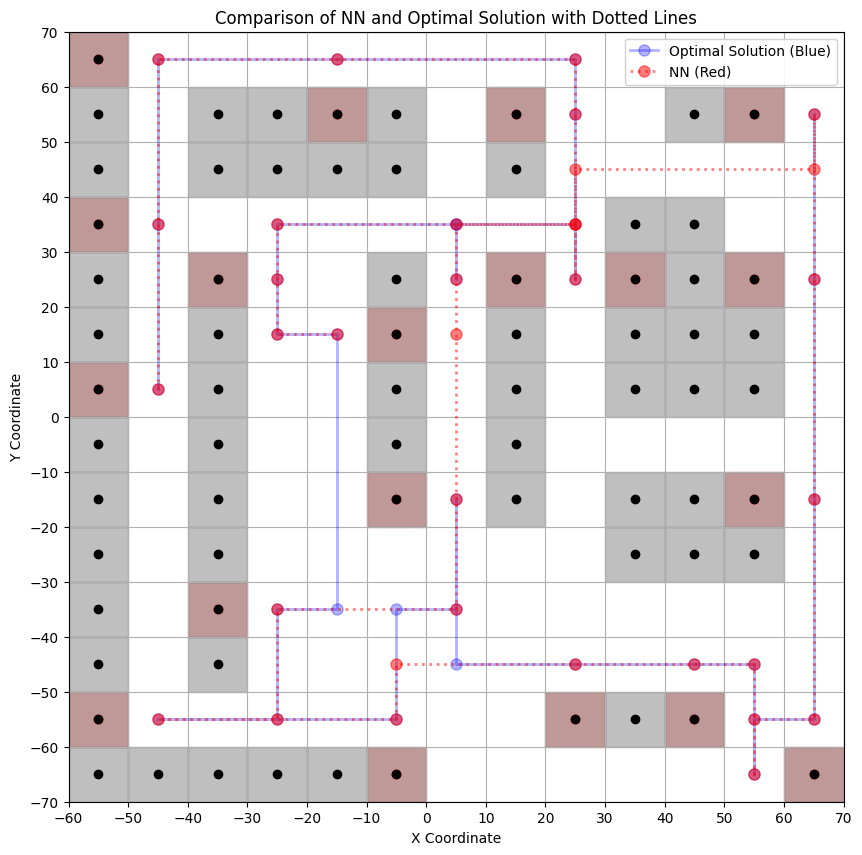

90.55385138137417


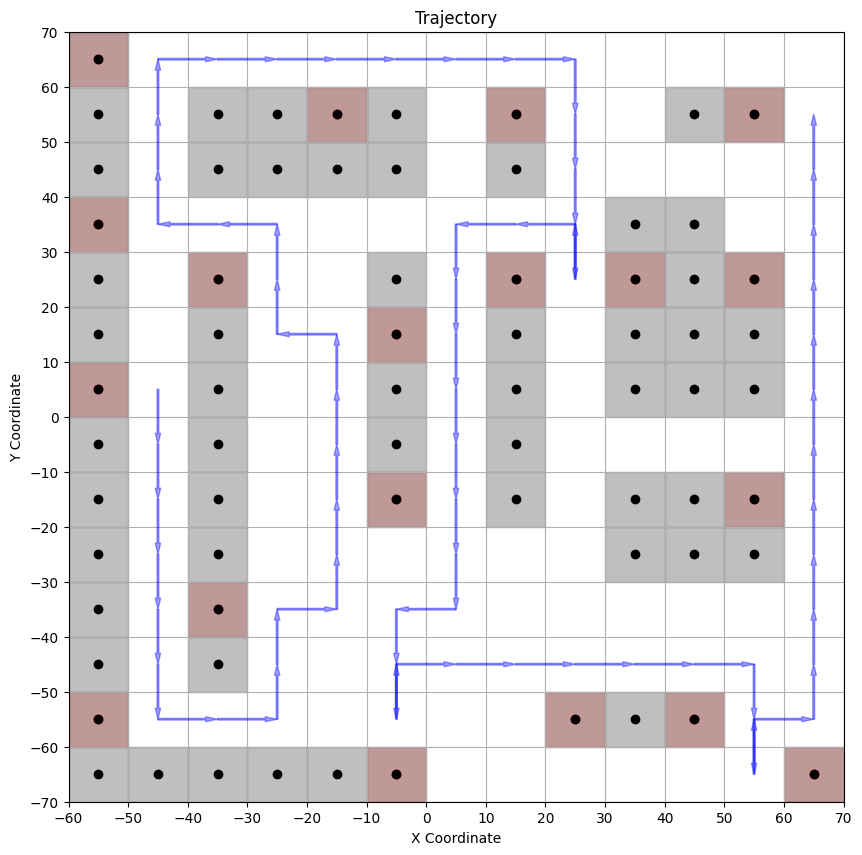

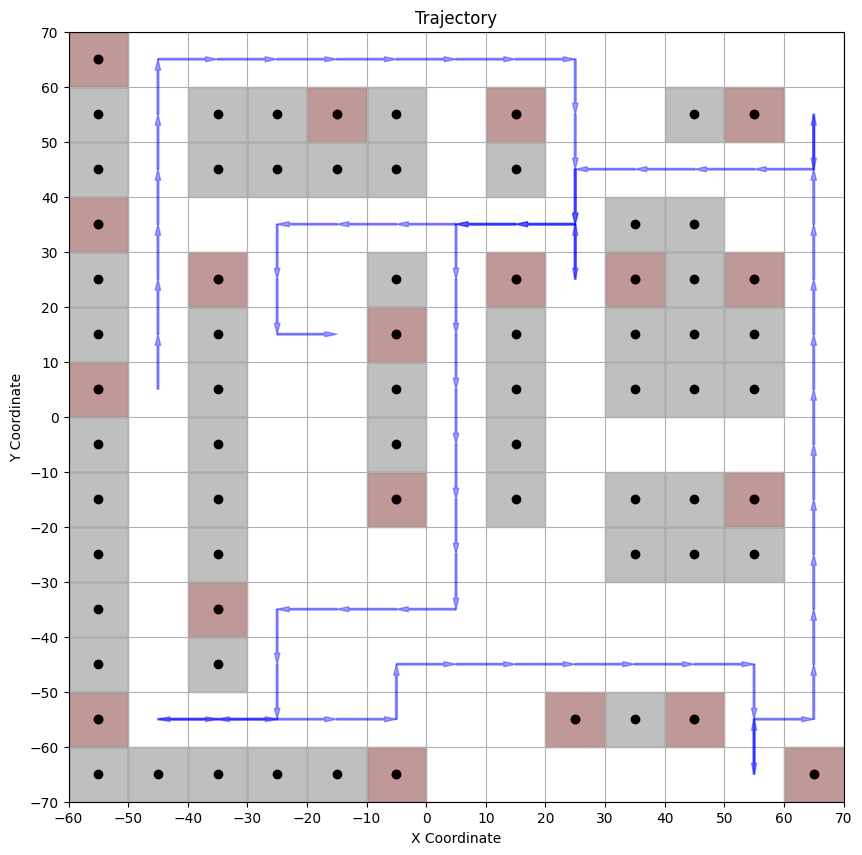

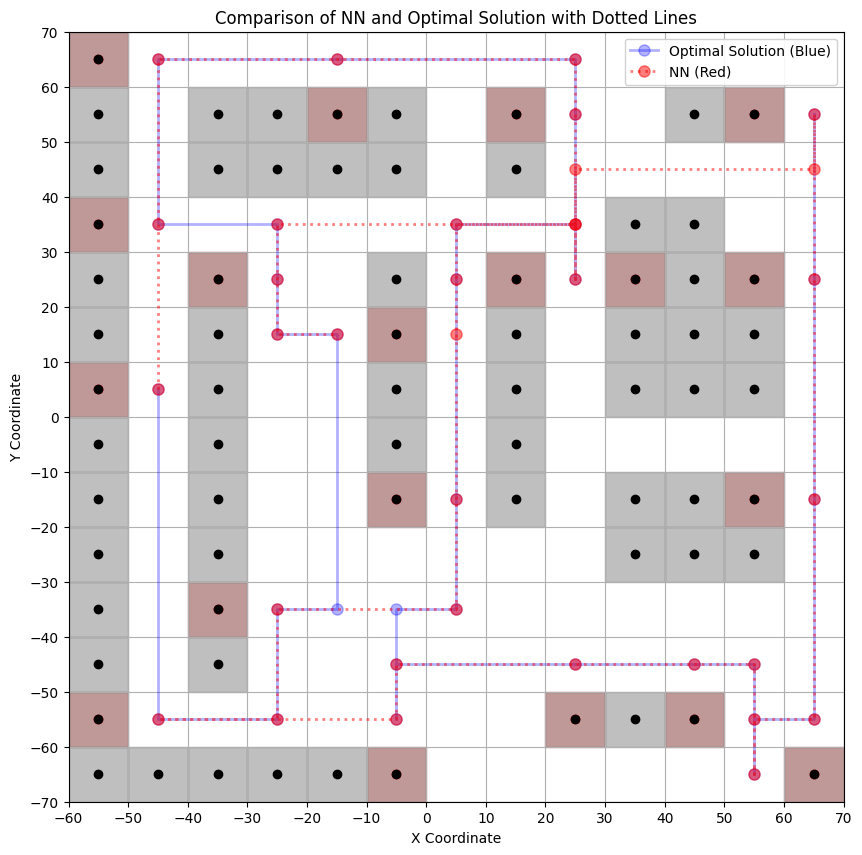

90.55385138137417


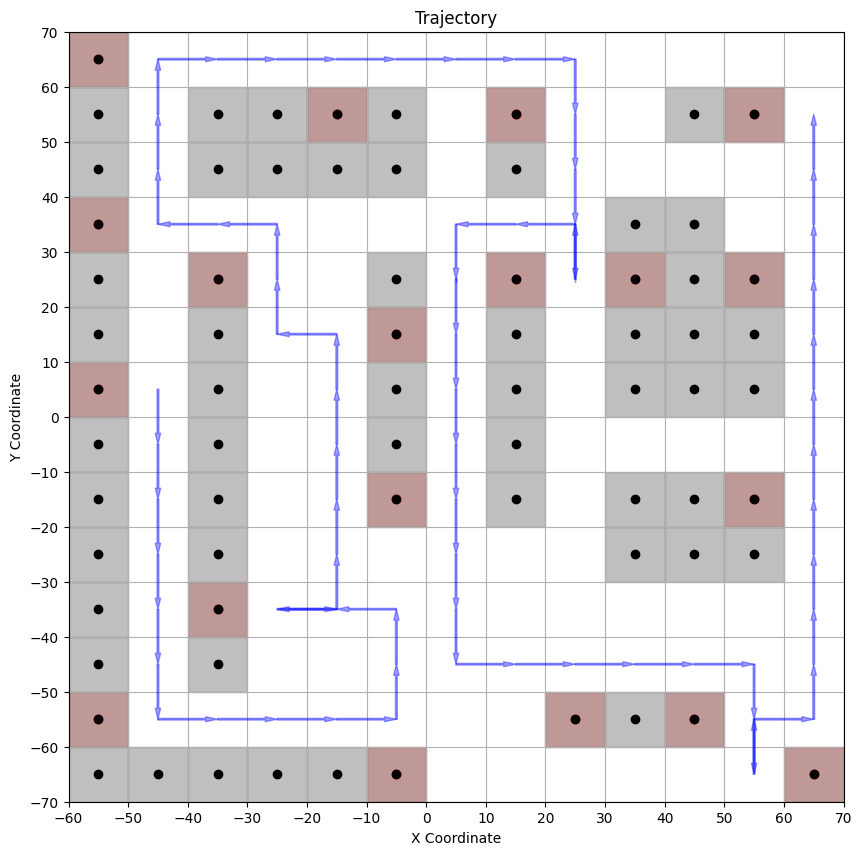

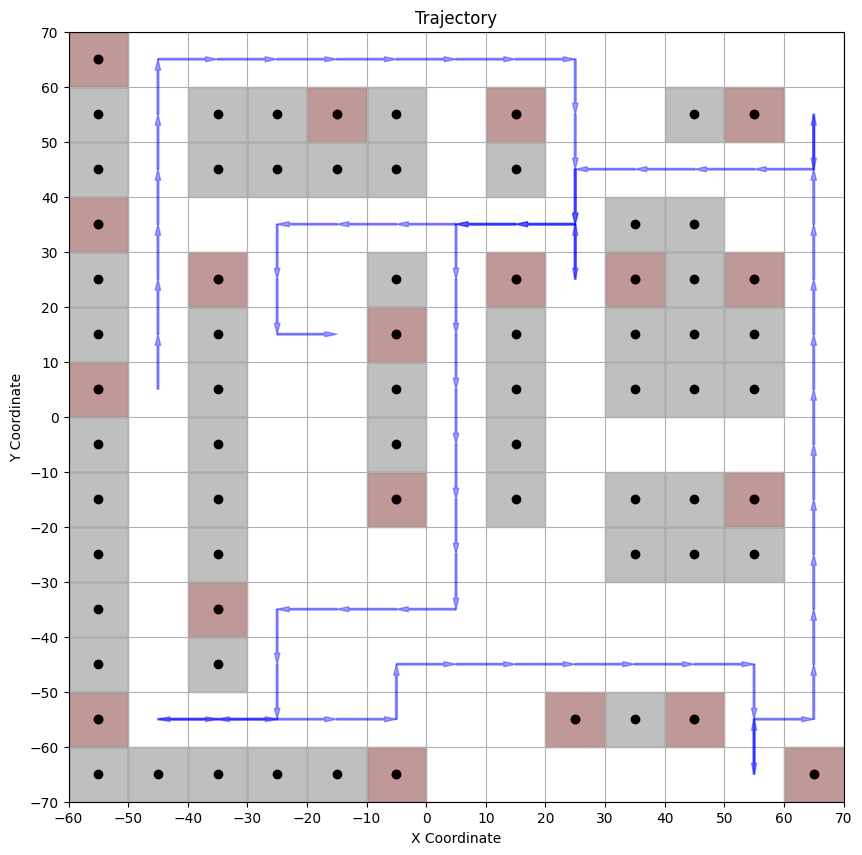

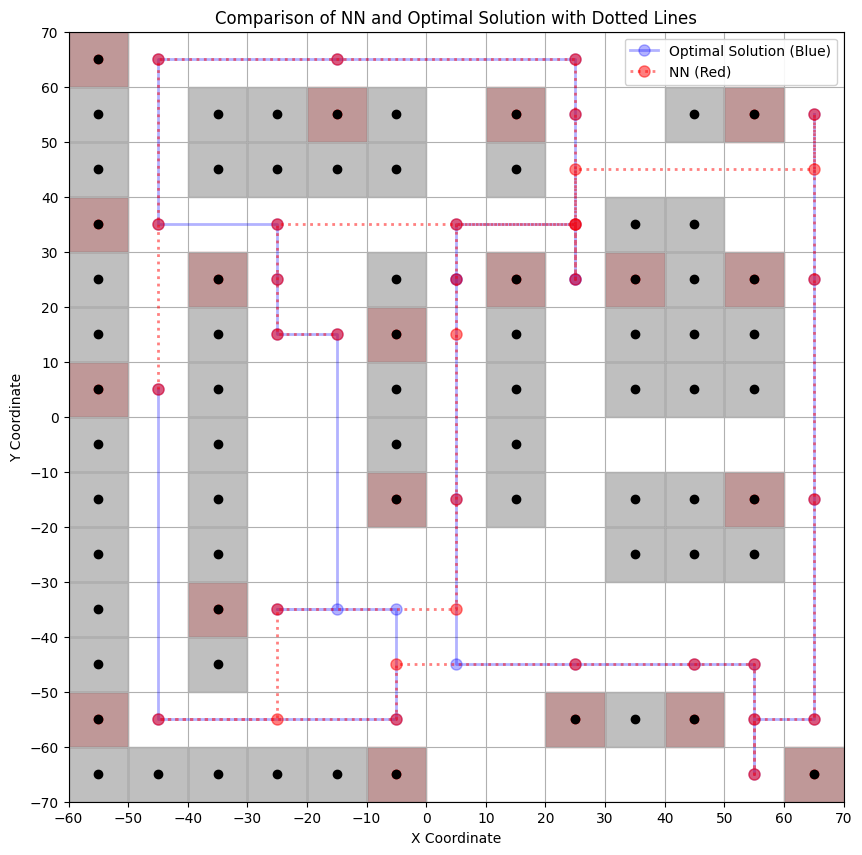

In [ ]:
compare_nn_optimal()

In [ ]:
#Matrix of Frechet similarity between NN and GO
def nn_optimal_matrix():
    optimal_solutions = [
        optimal_solution, optimal_solution2, optimal_solution3, optimal_solution4, optimal_solution5,
        optimal_solution6, optimal_solution7, optimal_solution8, optimal_solution9, optimal_solution10,
        optimal_solution11, optimal_solution12, optimal_solution13, optimal_solution14, optimal_solution15
    ]

    closest_frechet = []
    matrix = np.zeros((len(optimal_solutions), len(nn_solutions)))
    for i, solution in enumerate(optimal_solutions):
        min_frechet = float('inf')
        for j, solution_nn in enumerate(nn_solutions):
            matrix[i, j] = frechet(solution, solution_nn)
            if matrix[i, j] < min_frechet:
                min_frechet = frechet(solution, solution_nn)
            closest_frechet.append(min_frechet)

    # Flatten the matrix to get all the similarity values
    all_similarities = matrix.flatten()

    # Sort the similarities to get the most and least similar pairs
    sorted_similarities = sorted(all_similarities)

    # Plot the distribution
    plt.figure(figsize=(10, 10))
    plt.hist(closest_frechet, bins=20)
    plt.xlim(0, 180)
    plt.xlabel('Frechet Distance')
    plt.ylabel('Frequency')
    plt.title('Distribution of Nearest Neighbors Similarity to Optimal Solutions')
    plt.show()

    return matrix

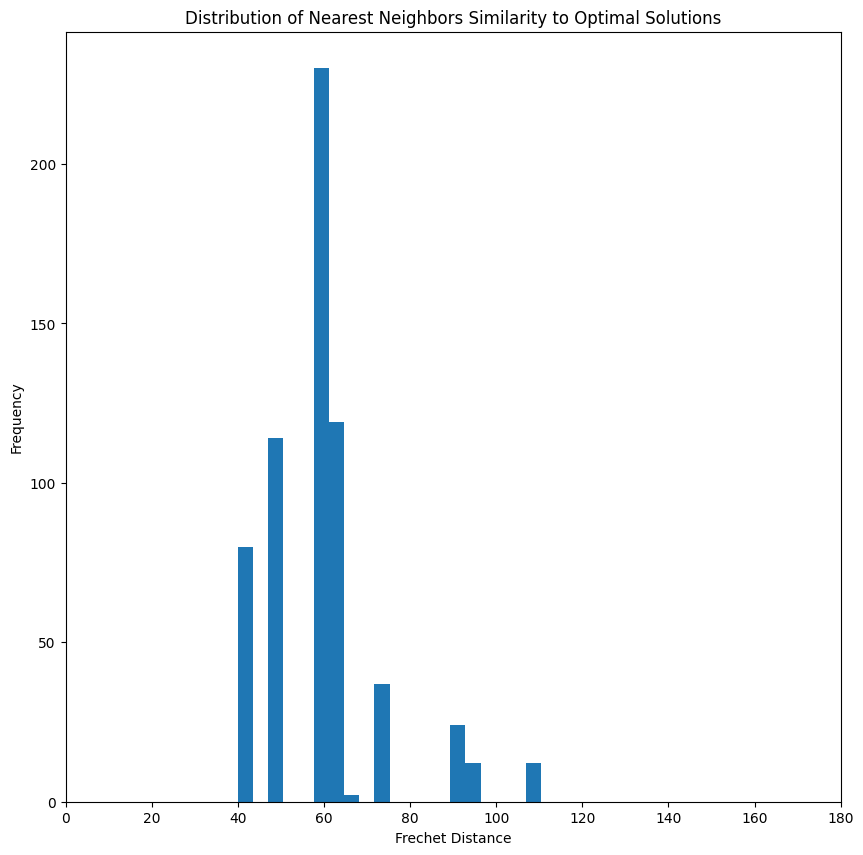

[[ 40.          58.30951895  58.30951895  40.         110.45361017 110.45361017  58.30951895  58.30951895 123.69316877 121.65525061  40.
  121.65525061 126.49110641 123.69316877 126.49110641 110.45361017  40.         164.01219467  58.30951895  58.30951895  58.30951895  58.30951895
  123.69316877 120.         121.65525061 126.49110641 123.69316877 111.80339887 126.49110641 111.80339887 121.65525061 164.01219467  94.33981132
   94.33981132 101.98039027 164.01219467  94.33981132 121.65525061  64.03124237  78.10249676  78.10249676 110.45361017]
 [ 67.08203932  63.2455532   63.2455532   67.08203932  94.86832981  94.86832981  63.2455532   63.2455532   82.46211251  82.46211251  67.08203932
   82.46211251  82.46211251  82.46211251  82.46211251  94.86832981  67.08203932 120.41594579  63.2455532   63.2455532   63.2455532   63.2455532
   82.46211251  82.46211251  82.46211251  82.46211251  82.46211251  72.80109889  82.46211251  72.80109889  82.46211251 120.41594579 102.95630141
   92.19544457 102.

In [ ]:
matrix = nn_optimal_matrix()
print(matrix)
print('Position of smallest Frechet dist: ', np.where(matrix == np.min(matrix)))

In [ ]:
#Distribution of NN similarity
def nn_distribution():
    frechet_list = []

    for i in range(len(nn_solutions)-1):
        for j in range(i+1, len(nn_solutions)):
            frechet_dist = frechet(nn_solutions[i], nn_solutions[j])
            frechet_list.append(frechet_dist)

    plt.figure(figsize=(10, 10))
    plt.hist(frechet_list, bins=20)
    plt.xlim(0, 180)
    plt.xlabel('Frechet Distance')
    plt.ylabel('Frequency')
    plt.title('Distribution of Nearest Neighbors Solution Similarity')
    plt.show()

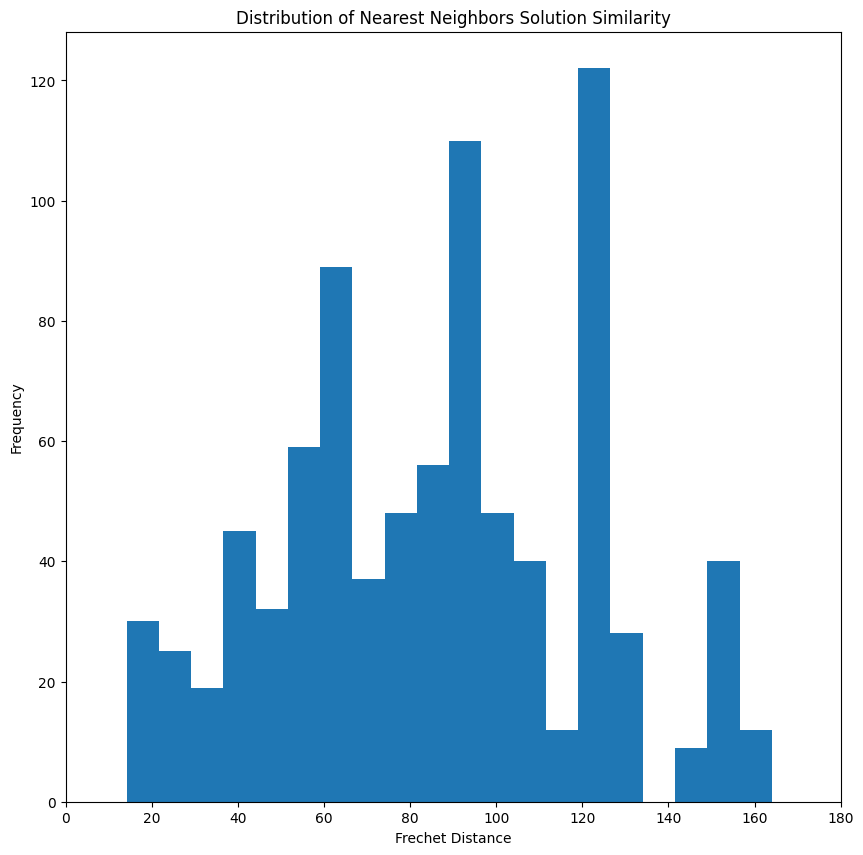

In [ ]:
nn_distribution()

In [ ]:
def optimal_distribution():
    optimal_solutions = [
        optimal_solution, optimal_solution2, optimal_solution3, optimal_solution4, optimal_solution5,
        optimal_solution6, optimal_solution7, optimal_solution8, optimal_solution9, optimal_solution10,
        optimal_solution11, optimal_solution12, optimal_solution13, optimal_solution14, optimal_solution15
    ]

    frechet_list = []

    for i in range(len(optimal_solutions)-1):
        for j in range(i+1, len(optimal_solutions)):
            frechet_dist = frechet(optimal_solutions[i], optimal_solutions[j])
            frechet_list.append(frechet_dist)

    plt.figure(figsize=(10, 10))
    plt.hist(frechet_list, bins=20)
    plt.xlim(0, 180)
    plt.xlabel('Frechet Distance')
    plt.ylabel('Frequency')
    plt.title('Distribution of Global Optimal Solution Similarity')
    plt.show()

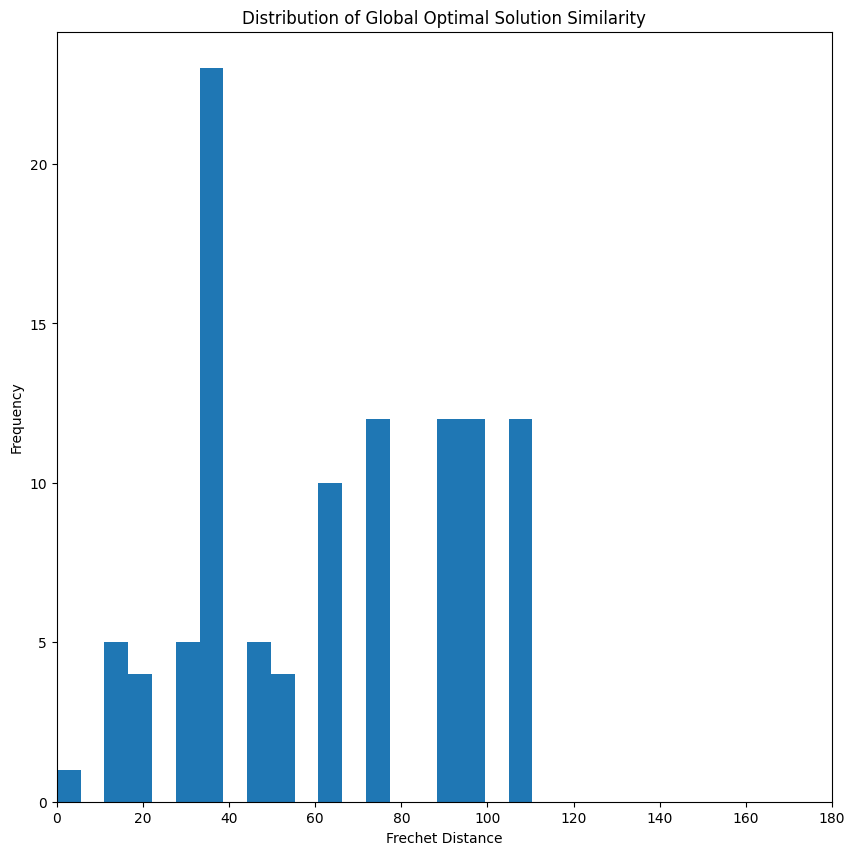

In [ ]:
optimal_distribution()

In [ ]:
def compare_nn_optimal():
    optimal_solutions = [
        optimal_solution, optimal_solution2, optimal_solution3, optimal_solution4, optimal_solution5,
        optimal_solution6, optimal_solution7, optimal_solution8, optimal_solution9, optimal_solution10,
        optimal_solution11, optimal_solution12, optimal_solution13, optimal_solution14, optimal_solution15
    ]

    frechet_list = []

    for optimal in optimal_solutions:
        for nn in nn_solutions:
            frechet_nn = frechet(optimal, nn)
            frechet_list.append(frechet_nn)

    plt.hist(frechet_list, bins=20)
    #plt.xlim(0, 180)
    plt.xlabel('Frechet Distance')
    plt.ylabel('Frequency')
    plt.title('Similarity between GO and NN')
    plt.show()

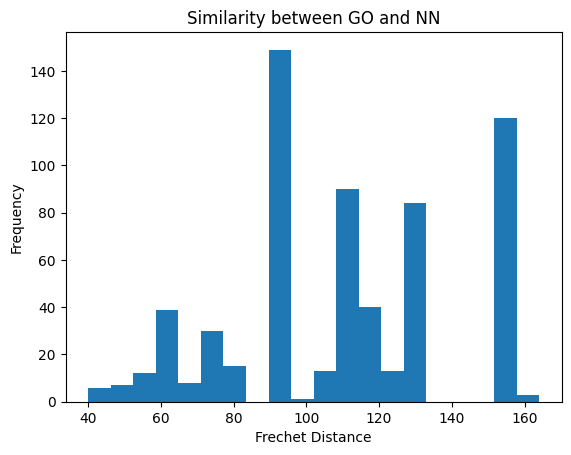

In [ ]:
compare_nn_optimal()

(0, 0)
40.0
700.0


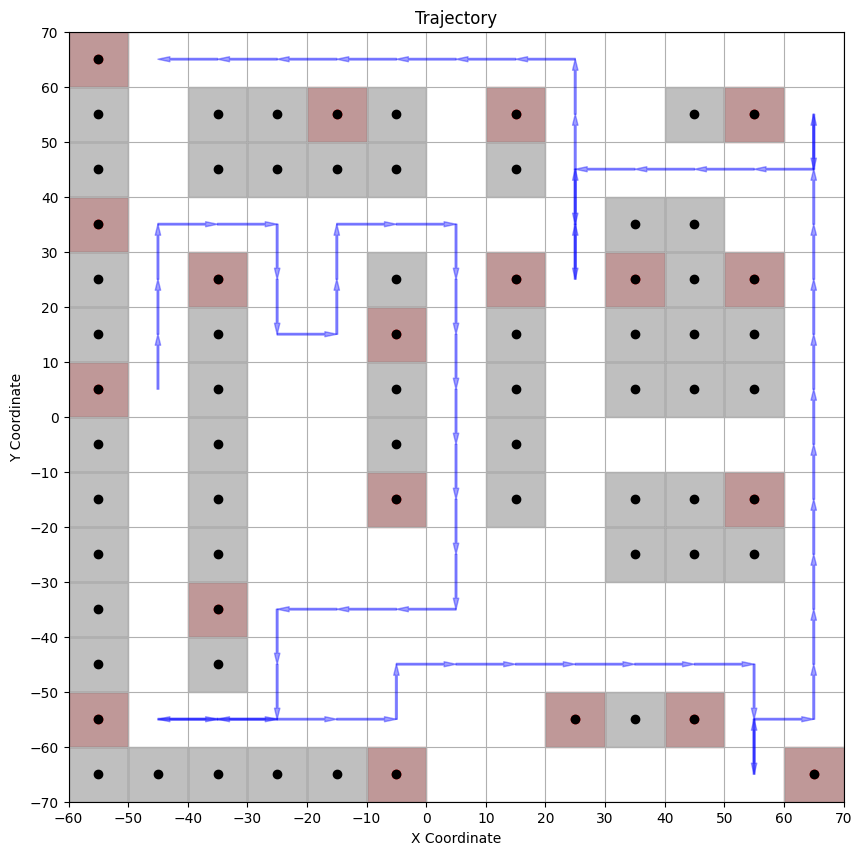

720.0


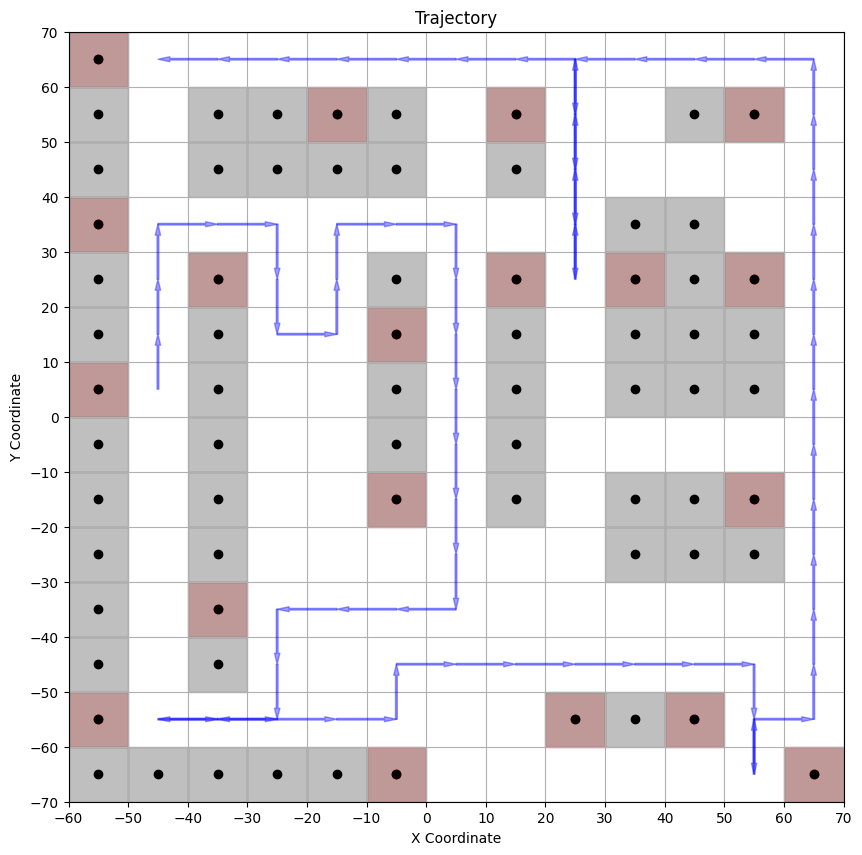


(0, 3)
40.0
700.0


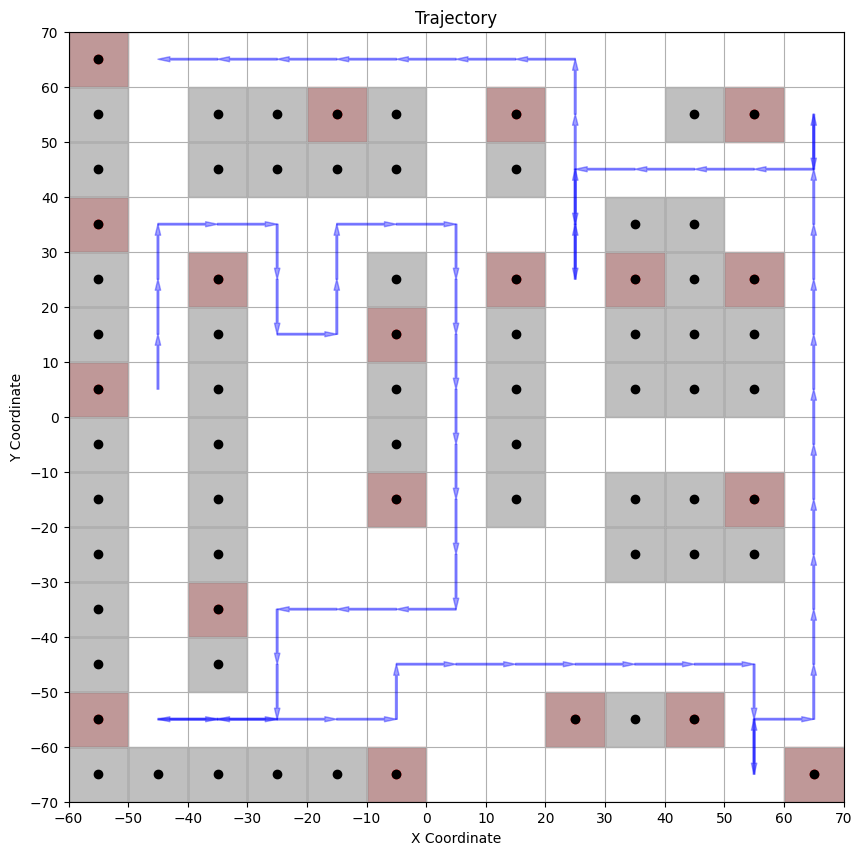

740.0


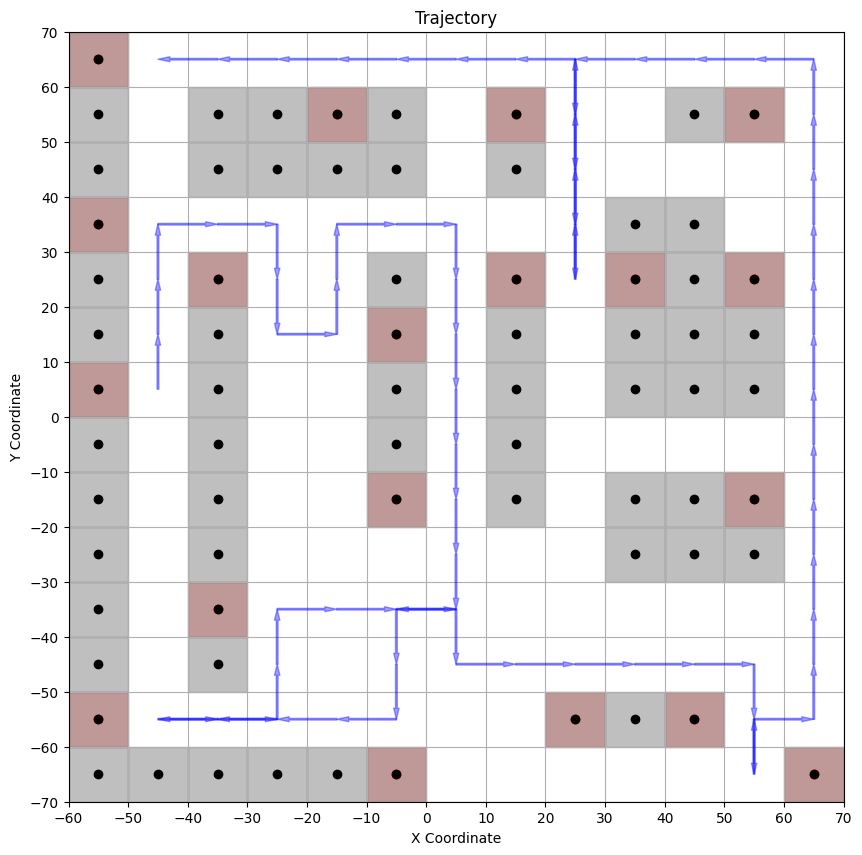


(0, 10)
40.0
700.0


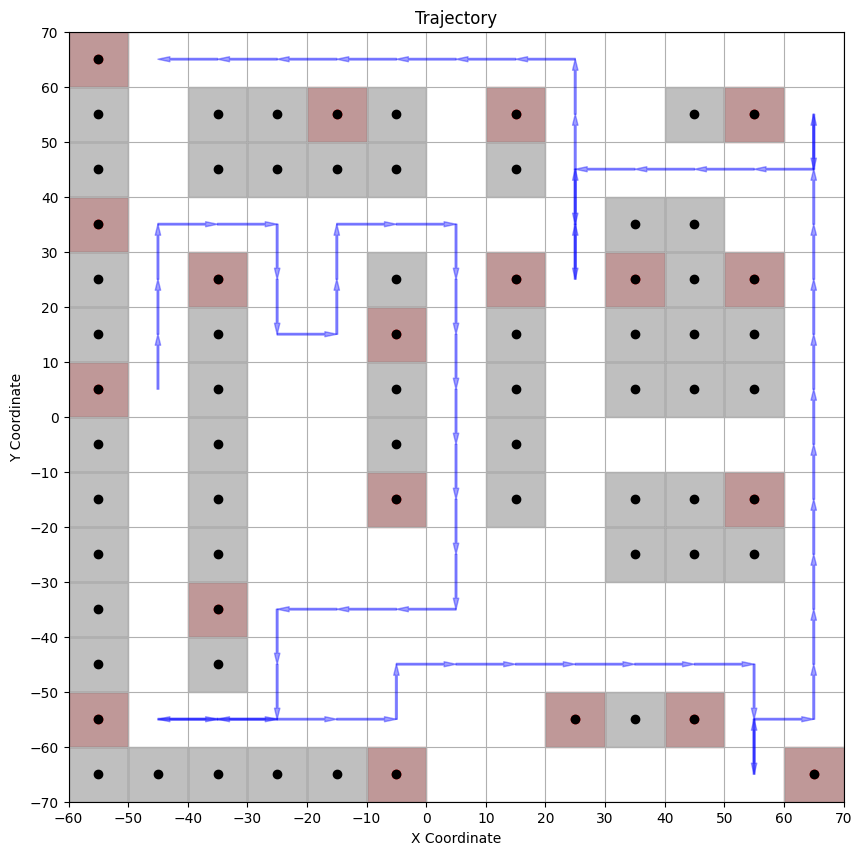

760.0


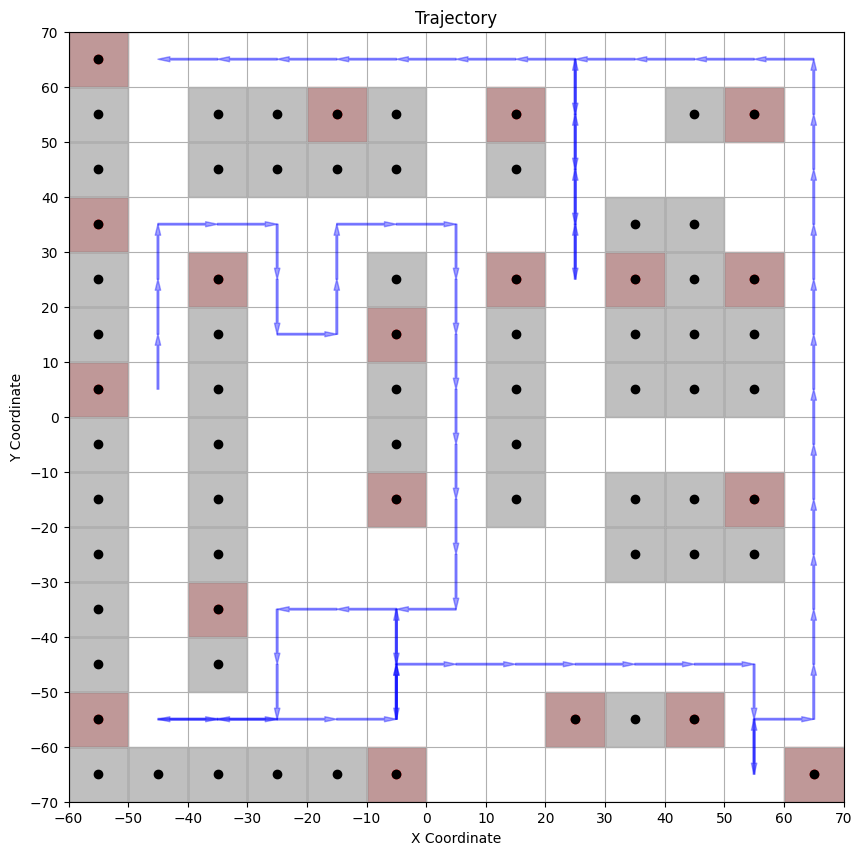


(0, 16)
40.0
700.0


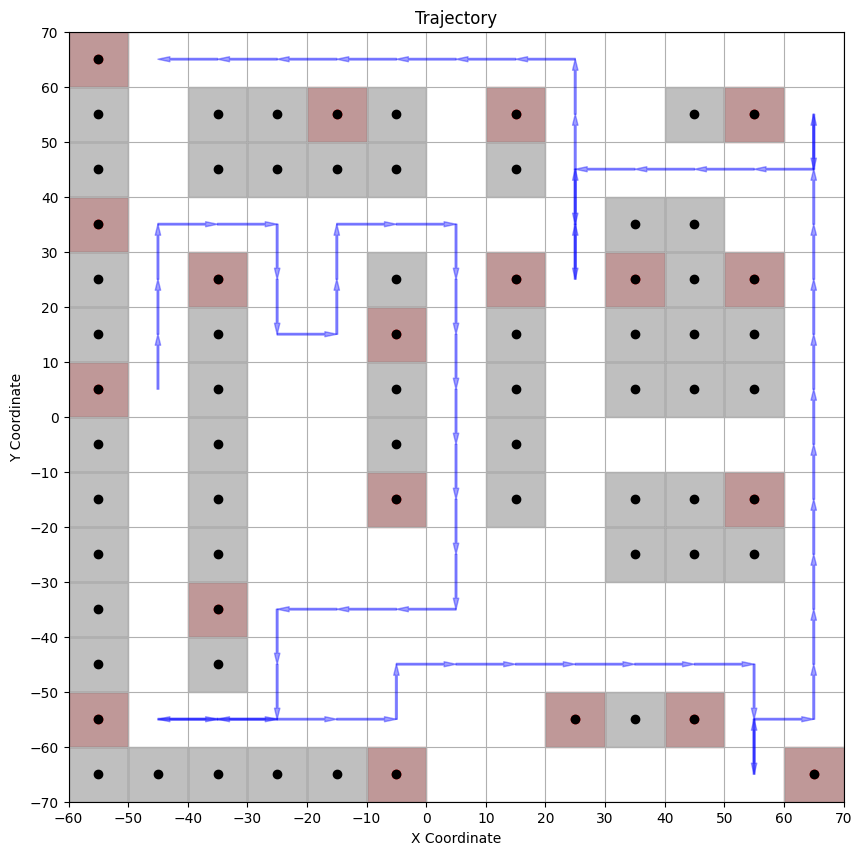

760.0


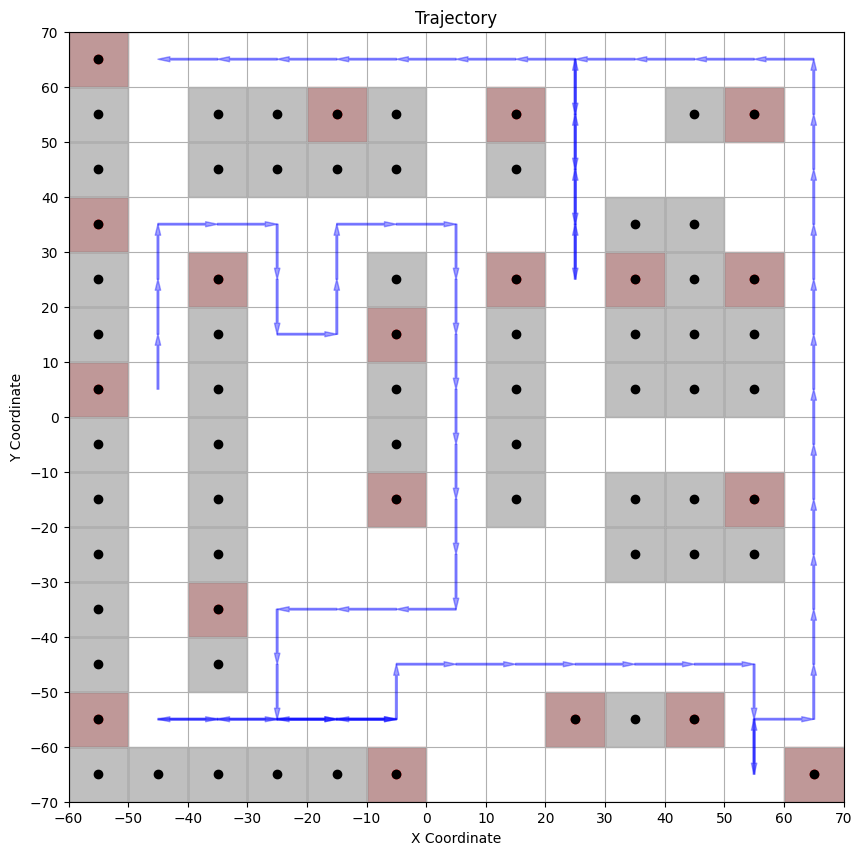

In [ ]:
optimal_solutions = [
    optimal_solution, optimal_solution2, optimal_solution3, optimal_solution4, optimal_solution5,
    optimal_solution6, optimal_solution7, optimal_solution8, optimal_solution9, optimal_solution10,
    optimal_solution11, optimal_solution12, optimal_solution13, optimal_solution14, optimal_solution15
]

"""
nn_solutions = [
    nearest_neighbors1, nearest_neighbors2, nearest_neighbors3, nearest_neighbors4, nearest_neighbors5,
    nearest_neighbors6, nearest_neighbors7, nearest_neighbors8, nearest_neighbors9, nearest_neighbors10,
    nearest_neighbors11, nearest_neighbors12, nearest_neighbors13, nearest_neighbors14, nearest_neighbors15,
    nearest_neighbors16, nearest_neighbors17, nearest_neighbors18, nearest_neighbors19, nearest_neighbors20,
    nearest_neighbors21, nearest_neighbors22, nearest_neighbors23, nearest_neighbors24, nearest_neighbors25,
    nearest_neighbors26, nearest_neighbors27, nearest_neighbors28, nearest_neighbors29, nearest_neighbors30,
    nearest_neighbors31, nearest_neighbors32, nearest_neighbors33, nearest_neighbors34, nearest_neighbors35,
    nearest_neighbors36, nearest_neighbors37, nearest_neighbors38, nearest_neighbors_reverse1, nearest_neighbors_reverse2,
    nearest_neighbors_reverse3, nearest_neighbors_reverse4
]

nn_visited_list = [
    nn_visited1, nn_visited2, nn_visited3, nn_visited4, nn_visited5, nn_visited6, nn_visited7, nn_visited8,nn_visited9, nn_visited10, nn_visited11,
    nn_visited12, nn_visited13, nn_visited14, nn_visited15, nn_visited16, nn_visited17, nn_visited18, nn_visited19, nn_visited20, nn_visited21,
    nn_visited22, nn_visited23, nn_visited24, nn_visited25, nn_visited26, nn_visited27, nn_visited28, nn_visited29, nn_visited30, nn_visited31,
    nn_visited32, nn_visited33, nn_visited34, nn_visited35, nn_visited36, nn_visited37, nn_visited38, nn_reverse_visited1, nn_reverse_visited2,
    nn_reverse_visited3, nn_reverse_visited4
]
"""

best_frechet = float('inf')
best_go = None
best_nn = None
best_solutions = []

for i in range(len(optimal_solutions)):
    for j in range(len(nn_solutions)):
        curr_frechet = frechet(optimal_solutions[i], nn_solutions[j])
        if curr_frechet < best_frechet:
            best_frechet = curr_frechet
            best_go = i
            best_nn = j
best_solutions.append((best_go, best_nn))
for i in range(len(optimal_solutions)):
    for j in range(len(nn_solutions)):
        curr_frechet = frechet(optimal_solutions[i], nn_solutions[j])
        if curr_frechet == best_frechet:
            if (i, j) not in best_solutions:
                best_solutions.append((i, j))


for solution in best_solutions:
    go_index, nn_index = solution
    print((go_index, nn_index))
    print(frechet(optimal_solutions[go_index], nn_solutions[nn_index]))
    print(distance(optimal_solutions[go_index]))
    graph_data_normal(optimal_solutions[go_index])
    print(distance(nn_solutions[nn_index]))
    graph_data_normal(nn_solutions[nn_index])
    print()

# **Tau Value**

In [ ]:
def kendalls_tau(order1, order2):
    n = len(order1)
    if n != len(order2):
        raise ValueError("Both lists must contain the same number of elements")

    # Create a mapping from element values to their ranks in order2
    rank2 = {value: idx for idx, value in enumerate(order2)}

    # Convert order1 according to order2 ranks
    order1_ranks = [rank2[value] for value in order1]

    # Count concordant and discordant pairs
    concordant = 0
    discordant = 0
    for i in range(n):
        for j in range(i + 1, n):
            if (order1_ranks[i] < order1_ranks[j] and order1[i] < order1[j]) or (order1_ranks[i] > order1_ranks[j] and order1[i] > order1[j]):
                concordant += 1
            elif (order1_ranks[i] < order1_ranks[j] and order1[i] > order1[j]) or (order1_ranks[i] > order1_ranks[j] and order1[i] < order1[j]):
                discordant += 1

    # Calculate Kendall's tau
    if n < 2:
      tau = 0
    else:
      tau = (concordant - discordant) / ((n * (n - 1)) / 2)
    return tau

In [ ]:
def plot_tau_values():
    files = [f for f in os.listdir('OnlineNavigation/Navigation') if os.path.isfile(os.path.join('OnlineNavigation/Navigation', f))]

    sub_sum_path = '/content/drive/MyDrive/trajectory_analysis/OnlineNavigation/sub_sum.csv'
    sub_sum_df = pd.read_csv(sub_sum_path)

    nn_list = []
    go_list = []

    for file in files:
        visited1, visited2, visited3, visited4, visited5, visited6, visited7, visited8 = visited_buildings(f'OnlineNavigation/BuildingVisitedOrder/{file}', f'OnlineNavigation/RandomizedBuildings/{file}')
        visited_list = [visited1, visited2, visited3, visited4, visited5, visited6, visited7, visited8]
        trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = trials(f'OnlineNavigation/Navigation/{file}')
        trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = convert_to_discrete(trial1), convert_to_discrete(trial2), convert_to_discrete(trial3), convert_to_discrete(trial4), convert_to_discrete(trial5), convert_to_discrete(trial6), convert_to_discrete(trial7), convert_to_discrete(trial8)
        trial_list = [trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8]
        best = best_trial(trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8)
        best_trial_index = trial_list.index(best)
        best_visited = visited_list[best_trial_index]

        for nn in nn_visited_list:
            print(best_visited, nn)
            tau_val = kendalls_tau(best_visited, nn)
            nn_list.append(tau_val)

        for go in optimal_solution_visited:
            print(best_visited, go)
            tau_val = kendalls_tau(best_visited, go)
            go_list.append(tau_val)

    plt.figure(figsize=(10, 10))
    plt.boxplot([nn_list, go_list], labels=['NN', 'GO'])
    plt.ylabel("Tau Value")
    plt.title("Comparison of Tau Values for NN and GO Solutions with Participant Solutions")
    plt.show()


[2, 1, 5, 7, 11, 16, 17, 18, 15, 14, 19, 9, 13, 12, 10, 6, 3, 4, 8] [2, 3, 6, 10, 12, 11, 5, 1, 7, 16, 17, 18, 15, 14, 19, 9, 13, 8, 4]
[2, 1, 5, 7, 11, 16, 17, 18, 15, 14, 19, 9, 13, 12, 10, 6, 3, 4, 8] [2, 3, 4, 8, 9, 13, 12, 11, 5, 1, 7, 16, 17, 18, 15, 14, 19, 10, 6]
[2, 1, 5, 7, 11, 16, 17, 18, 15, 14, 19, 9, 13, 12, 10, 6, 3, 4, 8] [2, 3, 4, 8, 9, 13, 12, 11, 5, 1, 7, 16, 17, 18, 15, 14, 19, 6, 10]
[2, 1, 5, 7, 11, 16, 17, 18, 15, 14, 19, 9, 13, 12, 10, 6, 3, 4, 8] [2, 3, 6, 10, 12, 11, 7, 1, 5, 16, 17, 18, 15, 14, 19, 9, 13, 8, 4]
[2, 1, 5, 7, 11, 16, 17, 18, 15, 14, 19, 9, 13, 12, 10, 6, 3, 4, 8] [2, 3, 4, 8, 9, 13, 12, 11, 7, 1, 5, 6, 10, 16, 17, 18, 15, 14, 19]
[2, 1, 5, 7, 11, 16, 17, 18, 15, 14, 19, 9, 13, 12, 10, 6, 3, 4, 8] [2, 3, 4, 8, 9, 13, 12, 11, 7, 1, 5, 10, 6, 16, 17, 18, 15, 14, 19]
[2, 1, 5, 7, 11, 16, 17, 18, 15, 14, 19, 9, 13, 12, 10, 6, 3, 4, 8] [2, 3, 4, 8, 9, 13, 12, 11, 7, 1, 5, 16, 17, 18, 15, 14, 19, 10, 6]
[2, 1, 5, 7, 11, 16, 17, 18, 15, 14, 19, 9, 13, 

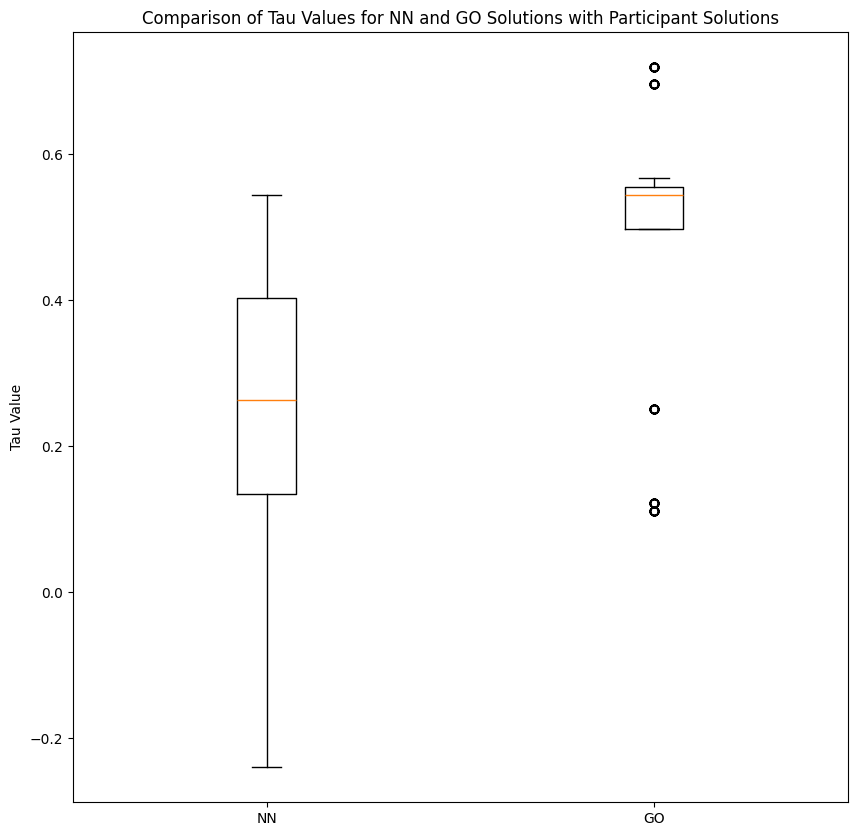

In [ ]:
plot_tau_values()

In [ ]:
def tau_barplot():
    files = [f for f in os.listdir('OnlineNavigation/Navigation') if os.path.isfile(os.path.join('OnlineNavigation/Navigation', f))]

    sub_sum_path = '/content/drive/MyDrive/trajectory_analysis/OnlineNavigation/sub_sum.csv'
    sub_sum_df = pd.read_csv(sub_sum_path)

    nn_count = 0
    go_count = 0
    tie_count = 0

    for file in files:
        visited1, visited2, visited3, visited4, visited5, visited6, visited7, visited8 = visited_buildings(f'OnlineNavigation/BuildingVisitedOrder/{file}', f'OnlineNavigation/RandomizedBuildings/{file}')
        visited_list = [visited1, visited2, visited3, visited4, visited5, visited6, visited7, visited8]
        trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = trials(f'OnlineNavigation/Navigation/{file}')
        trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = convert_to_discrete(trial1), convert_to_discrete(trial2), convert_to_discrete(trial3), convert_to_discrete(trial4), convert_to_discrete(trial5), convert_to_discrete(trial6), convert_to_discrete(trial7), convert_to_discrete(trial8)
        trial_list = [trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8]
        best = best_trial(trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8)
        best_trial_index = trial_list.index(best)
        best_visited = visited_list[best_trial_index]

        best_nn = 0
        best_go = 0
        for nn in nn_visited_list:
            tau_val = kendalls_tau(best_visited, nn)
            if tau_val > best_nn:
                best_nn = tau_val
        for go in optimal_solution_visited:
            tau_val = kendalls_tau(best_visited, go)
            if tau_val > best_go:
                best_go = tau_val
        if best_nn > best_go:
            nn_count += 1
        elif best_nn == best_go:
            tie_count += 1
        else:
            go_count += 1

    plt.figure(figsize=(10, 10))
    heuristics = ['NN', 'GO', 'Tie']
    counts = [nn_count, go_count, tie_count]
    bars = plt.bar(heuristics, counts,)
    plt.xlabel('Solution Type')
    plt.ylabel('Frequency')
    plt.title('Best Matching Solution Type for Best Participant Solutions')
    plt.grid(axis='y', linestyle='--', linewidth=0.7)  # Added grid lines here
    plt.tight_layout()
    plt.show()

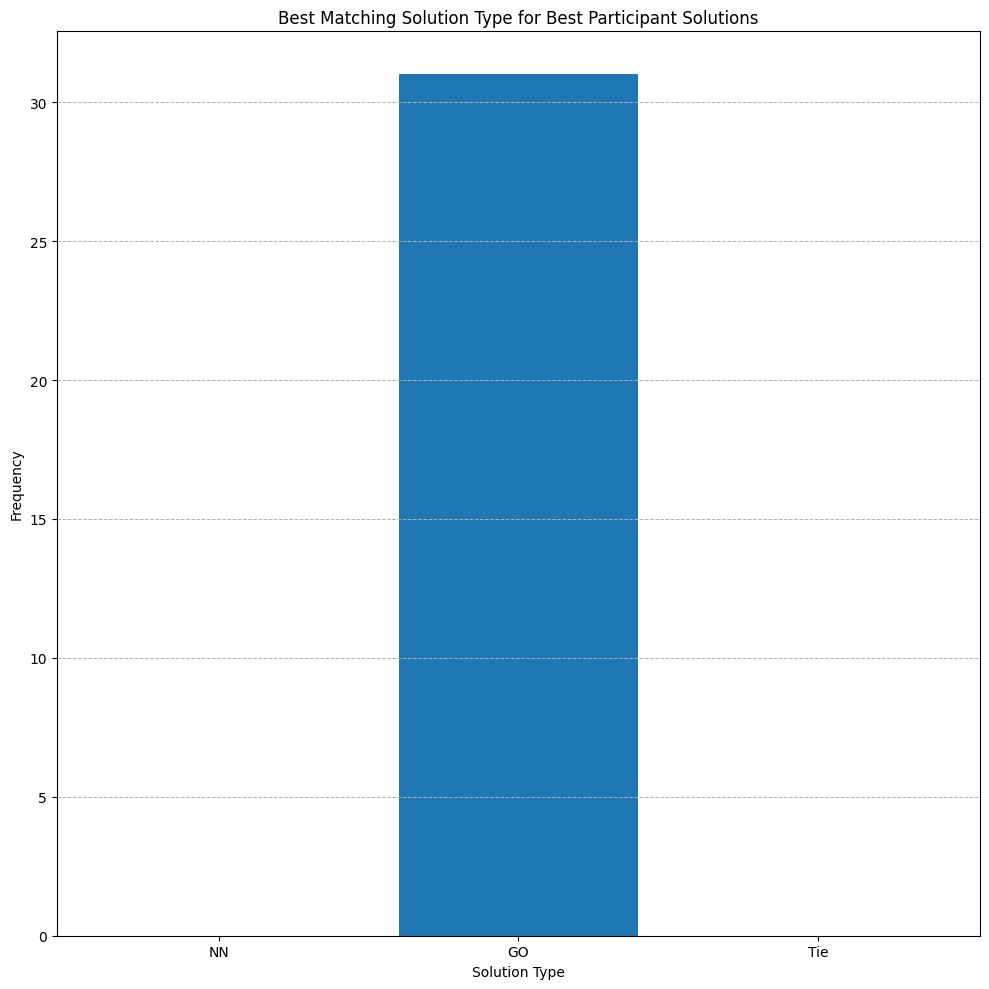

In [ ]:
tau_barplot()

In [ ]:
def tau_barplot_spatial():
    files = [f for f in os.listdir('OnlineNavigation/Navigation') if os.path.isfile(os.path.join('OnlineNavigation/Navigation', f))]
    sub_sum_path = '/content/drive/MyDrive/trajectory_analysis/OnlineNavigation/sub_sum.csv'
    sub_sum_df = pd.read_csv(sub_sum_path)

    nn_count_high_spatial = 0
    go_count_high_spatial = 0
    tie_count_high_spatial = 0
    nn_count_low_spatial = 0
    go_count_low_spatial = 0
    tie_count_low_spatial = 0

    for file in files:
        participant_id = file.replace("participant_", "").replace(".csv", "")

        # Check if participant_id is in spatial_group_df
        if not sub_sum_df['ID'].str.contains(participant_id).any():
            continue

        # Find spatial group for the current participant
        spatial_group = sub_sum_df.loc[sub_sum_df['ID'] == participant_id, 'Spatial Group'].values[0]

        visited1, visited2, visited3, visited4, visited5, visited6, visited7, visited8 = visited_buildings(f'OnlineNavigation/BuildingVisitedOrder/{file}', f'OnlineNavigation/RandomizedBuildings/{file}')
        visited_list = [visited1, visited2, visited3, visited4, visited5, visited6, visited7, visited8]
        trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = trials(f'OnlineNavigation/Navigation/{file}')
        trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = convert_to_discrete(trial1), convert_to_discrete(trial2), convert_to_discrete(trial3), convert_to_discrete(trial4), convert_to_discrete(trial5), convert_to_discrete(trial6), convert_to_discrete(trial7), convert_to_discrete(trial8)
        trial_list = [trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8]
        best = best_trial(trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8)
        best_trial_index = trial_list.index(best)
        best_visited = visited_list[best_trial_index]

        # Compute Kendall's tau for High Spatial group
        if spatial_group == 'High Spatial':
            best_nn_high_spatial = -1
            best_go_high_spatial = -1
            for nn in nn_visited_list:
                tau_val = kendalls_tau(best_visited, nn)
                if tau_val > best_nn_high_spatial:
                    best_nn_high_spatial = tau_val
            for go in optimal_solution_visited:
                tau_val = kendalls_tau(best_visited, go)
                if tau_val > best_go_high_spatial:
                    best_go_high_spatial = tau_val
            if best_nn_high_spatial > best_go_high_spatial:
                nn_count_high_spatial += 1
            elif best_go_high_spatial > best_nn_high_spatial:
                go_count_high_spatial += 1
            else:
                tie_count_high_spatial += 1

        # Compute Kendall's tau for Low Spatial group
        elif spatial_group == 'Low Spatial':
            best_nn_low_spatial = -1
            best_go_low_spatial = -1
            for nn in nn_visited_list:
                tau_val = kendalls_tau(best_visited, nn)
                if tau_val > best_nn_low_spatial:
                    best_nn_low_spatial = tau_val
            for go in optimal_solution_visited:
                tau_val = kendalls_tau(best_visited, go)
                if tau_val > best_go_low_spatial:
                    best_go_low_spatial = tau_val
            if best_nn_low_spatial > best_go_low_spatial:
                nn_count_low_spatial += 1
            elif best_go_low_spatial > best_nn_low_spatial:
                go_count_low_spatial += 1
            else:
                tie_count_low_spatial += 1

    # Prepare data for plotting
    nn_counts = [nn_count_high_spatial, nn_count_low_spatial]
    go_counts = [go_count_high_spatial, go_count_low_spatial]
    tie_counts = [tie_count_high_spatial, tie_count_low_spatial]
    labels = ['NN', 'GO', 'Tie']

    # Define the colors for high and low spatial groups
    colors = ['royalblue', 'salmon']  # Color for High Spatial (blue) and Low Spatial (orange)

    # Create bar plot with spatial group in the legend
    fig, ax = plt.subplots()
    bar1 = ax.bar(0, nn_counts[0], color=colors[0], label='High Spatial')
    bar2 = ax.bar(1, nn_counts[1], color=colors[1], label='Low Spatial')
    bar3 = ax.bar(2, go_counts[0], color=colors[0])
    bar4 = ax.bar(3, go_counts[1], color=colors[1])
    bar5 = ax.bar(4, tie_counts[0], color=colors[0])
    bar6 = ax.bar(5, tie_counts[1], color=colors[1])

    # Set labels and title
    ax.set_ylabel('Count')
    ax.set_title('Best Matching Solution Type by Spatial Group')
    ax.set_xticks([0.5, 2.5, 4.5])
    ax.set_xticklabels(labels)

    # Add legend and show plot
    ax.legend()
    plt.show()

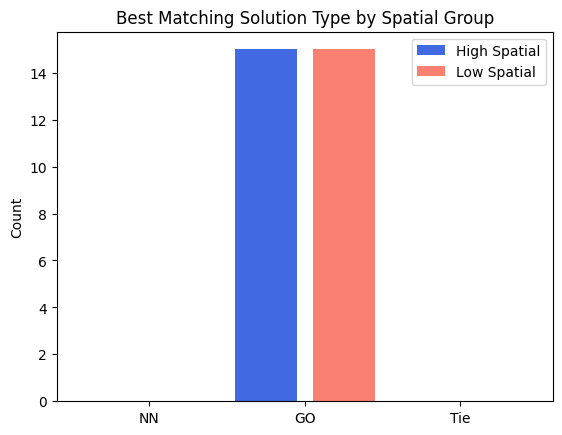

In [ ]:
tau_barplot_spatial()

# **Write TSP data to csv file**

In [ ]:
#Write TSP data into csv file for regression
def write_tsp_data():
    files = [f for f in os.listdir('OnlineNavigation/Navigation') if os.path.isfile(os.path.join('OnlineNavigation/Navigation', f))]

    optimal_solutions = [
        optimal_solution, optimal_solution2, optimal_solution3, optimal_solution4,
        optimal_solution5, optimal_solution6, optimal_solution7, optimal_solution8,
        optimal_solution9, optimal_solution10, optimal_solution11, optimal_solution12,
        optimal_solution13, optimal_solution14, optimal_solution15
    ]

    optimal_visited_list = [
        optimal_visited1, optimal_visited2, optimal_visited3, optimal_visited4, optimal_visited5, optimal_visited6, optimal_visited7, optimal_visited8,
        optimal_visited9, optimal_visited10, optimal_visited11, optimal_visited12, optimal_visited13, optimal_visited14, optimal_visited15
    ]

    sub_sum_path = '/content/drive/MyDrive/trajectory_analysis/OnlineNavigation/sub_sum.csv'
    sub_sum_df = pd.read_csv(sub_sum_path)
    participant_info = sub_sum_df.set_index('ID')[['map_score', 'Spatial Group']].to_dict('index')

    data_rows = []

    for file in files:
        participant_id = file.replace('participant_', '').replace('.csv', '')

        info = participant_info.get(participant_id)
        if info is None:
            continue

        map_score = info['map_score']

        visited1, visited2, visited3, visited4, visited5, visited6, visited7, visited8 = visited_buildings(f'OnlineNavigation/BuildingVisitedOrder/{file}', f'OnlineNavigation/RandomizedBuildings/{file}')
        visited_list = [visited1, visited2, visited3, visited4, visited5, visited6, visited7, visited8]
        trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = trials(f'OnlineNavigation/Navigation/{file}')
        trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8 = convert_to_discrete(trial1), convert_to_discrete(trial2), convert_to_discrete(trial3), convert_to_discrete(trial4), convert_to_discrete(trial5), convert_to_discrete(trial6), convert_to_discrete(trial7), convert_to_discrete(trial8)
        trial_list = [trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8]
        best = best_trial(trial1, trial2, trial3, trial4, trial5, trial6, trial7, trial8)
        best_trial_index = trial_list.index(best)
        best_visited = visited_list[best_trial_index]
        best_dist = distance(best)
        best_trial_num = 0
        if(best == trial1):
            best_trial_num = 1
        elif(best == trial2):
            best_trial_num = 2
        elif(best == trial3):
            best_trial_num = 3
        elif(best == trial4):
            best_trial_num = 4
        elif(best == trial5):
            best_trial_num = 5
        elif(best == trial6):
            best_trial_num = 6
        elif(best == trial7):
            best_trial_num = 7
        elif(best == trial8):
            best_trial_num = 8

        # Find the nearest neighbors solution with the lowest Fréchet distance
        frechet_nn = float('inf')
        frechet_nn_error = float('inf')
        matching_nn_solutions = []
        for i, solution in enumerate(nn_solutions):
            current_frechet = frechet(best, solution)
            if current_frechet < frechet_nn:
                frechet_nn = current_frechet
                frechet_nn_error = frechet(best, solution)
                matching_nn_solutions = [(solution, nn_visited_list[i], i+1)]
            elif current_frechet == frechet_nn:
                matching_nn_solutions.append((solution, nn_visited_list[i], i+1))

        # Find the optimal solution with the lowest Fréchet distance
        frechet_optimal = float('inf')
        frechet_optimal_error = float('inf')
        matching_optimal_solutions = []
        for i, solution in enumerate(optimal_solutions):
            current_frechet = frechet(best, solution)
            if current_frechet < frechet_optimal:
                frechet_optimal = current_frechet
                frechet_optimal_error = frechet(best, solution)
                matching_optimal_solutions = [(solution, optimal_visited_list[i], i+1)]
            elif current_frechet == frechet_optimal:
                matching_optimal_solutions.append((solution, optimal_visited_list[i], i+1))

        for matching_nn_solution in matching_nn_solutions:
            data_row1 = {
                'participantid': participant_id,
                'best_trial_num': best_trial_num,
                'best_trial_dist': best_dist,
                'strategy': 'NN',
                'frechet': frechet_nn,
                'building_order': arrToString(matching_nn_solution[1]),
                'solution_dist': distance(matching_nn_solution[0]),
                'strategyID': matching_nn_solution[2],
                'tau': kendalls_tau(best_visited, matching_nn_solution[1]),
                'map_score': map_score
            }
            data_rows.append(data_row1)

        for matching_optimal_solution in matching_optimal_solutions:
            data_row2 = {
                'participantid': participant_id,
                'best_trial_num': best_trial_num,
                'best_trial_dist': best_dist,
                'strategy': 'GO',
                'frechet': frechet_optimal,
                'building_order': arrToString(matching_optimal_solution[1]),
                'solution_dist': distance(matching_optimal_solution[0]),
                'strategyID': matching_optimal_solution[2],
                'tau': kendalls_tau(best_visited, matching_optimal_solution[1]),
                'map_score': map_score
            }
            data_rows.append(data_row2)

    df = pd.DataFrame(data_rows)

    # Write the DataFrame to 'tsp_data.csv'
    df.to_csv('/content/drive/MyDrive/trajectory_analysis/OnlineNavigation/tsp_data.csv', index=False)
    print("Data has been written to 'tsp_data.csv'.")

# Call the function to execute it
write_tsp_data()

Data has been written to 'tsp_data.csv'.


# **Regression Analysis**

Covariance between map_score and frechet for NN strategy: -2.454451791083983
Covariance between map_score and frechet for GO strategy: -0.22187299935907787
NN Strategy Regression Summary
                            OLS Regression Results                            
Dep. Variable:              map_score   R-squared:                       0.218
Model:                            OLS   Adj. R-squared:                  0.211
Method:                 Least Squares   F-statistic:                     29.87
Date:                Sun, 15 Dec 2024   Prob (F-statistic):           3.04e-07
Time:                        18:14:25   Log-Likelihood:               -0.61431
No. Observations:                 109   AIC:                             5.229
Df Residuals:                     107   BIC:                             10.61
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef  

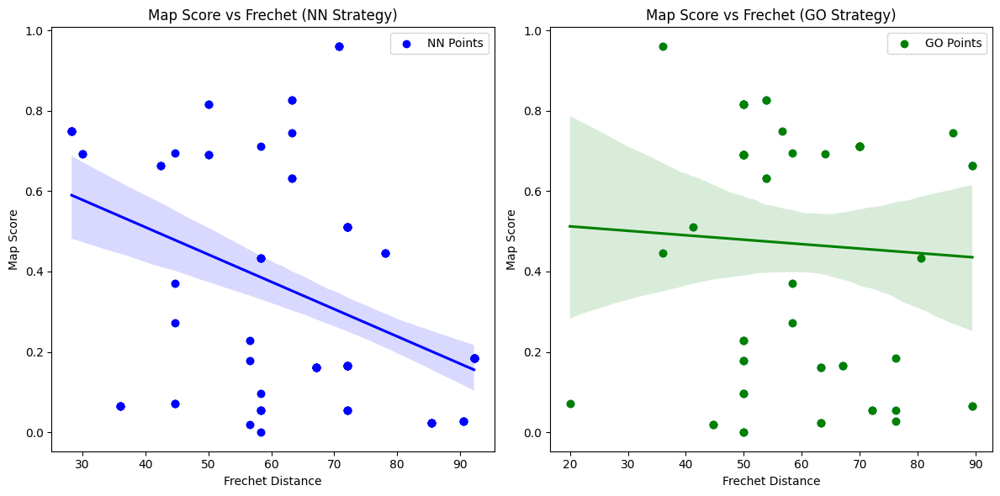

In [ ]:
# Load the data from the CSV file
df = pd.read_csv('/content/drive/MyDrive/trajectory_analysis/OnlineNavigation/tsp_data.csv')

# Separate NN and GO strategies for regression analysis
nn_data = df[df['strategy'] == 'NN'][['frechet', 'map_score']]
go_data = df[df['strategy'] == 'GO'][['frechet', 'map_score']]

covariance_nn = nn_data.cov().loc['frechet', 'map_score']
print("Covariance between map_score and frechet for NN strategy:", covariance_nn)

# Calculate covariance for GO strategy
covariance_go = go_data.cov().loc['frechet', 'map_score']
print("Covariance between map_score and frechet for GO strategy:", covariance_go)

# Perform regression for NN solutions
X_nn = sm.add_constant(nn_data['frechet'])
model_nn = sm.OLS(nn_data['map_score'], X_nn).fit()

# Perform regression for GO solutions
X_go = sm.add_constant(go_data['frechet'])
model_go = sm.OLS(go_data['map_score'], X_go).fit()

# Print regression summaries
print("NN Strategy Regression Summary")
print(model_nn.summary())
print("\nGO Strategy Regression Summary")
print(model_go.summary())

# Plotting all points and regression lines for visual inspection
plt.figure(figsize=(12, 6))

# Plot for NN strategy
plt.subplot(1, 2, 1)
sns.regplot(x=nn_data['frechet'], y=nn_data['map_score'], line_kws={"color": "blue"})
plt.scatter(nn_data['frechet'], nn_data['map_score'], color="blue", label="NN Points")
plt.title("Map Score vs Frechet (NN Strategy)")
plt.xlabel("Frechet Distance")
plt.ylabel("Map Score")
plt.legend()

# Plot for GO strategy
plt.subplot(1, 2, 2)
sns.regplot(x=go_data['frechet'], y=go_data['map_score'], line_kws={"color": "green"})
plt.scatter(go_data['frechet'], go_data['map_score'], color="green", label="GO Points")
plt.title("Map Score vs Frechet (GO Strategy)")
plt.xlabel("Frechet Distance")
plt.ylabel("Map Score")
plt.legend()

plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import statsmodels.formula.api as smf

# Load your data
df = pd.read_csv('/content/drive/MyDrive/trajectory_analysis/OnlineNavigation/tsp_data.csv')

# Specify and fit the mixed-effects model
model = smf.mixedlm("frechet ~ map_score * strategy", df, groups=df["participantid"], re_formula="1")
result = model.fit()

# Print the model summary
print(result.summary())


                Mixed Linear Model Regression Results
Model:                  MixedLM     Dependent Variable:     frechet  
No. Observations:       174         Method:                 REML     
No. Groups:             30          Scale:                  96.2100  
Min. group size:        2           Log-Likelihood:         -666.0814
Max. group size:        17          Converged:              Yes      
Mean group size:        5.8                                          
---------------------------------------------------------------------
                          Coef.  Std.Err.   z    P>|z|  [0.025 0.975]
---------------------------------------------------------------------
Intercept                 61.769    4.372 14.128 0.000  53.199 70.338
strategy[T.NN]             3.625    2.964  1.223 0.221  -2.183  9.434
map_score                 -4.214    8.801 -0.479 0.632 -21.463 13.034
map_score:strategy[T.NN]  -9.811    6.041 -1.624 0.104 -21.650  2.028
Group Var                161.145    

# **Main**

In [ ]:
import sys

def main():

    sys.setrecursionlimit(5000)

    optimal_solution = []
    optimal_solution.append((-45, 5))
    optimal_solution.append((-45, 35))
    optimal_solution.append((-25, 35))
    optimal_solution.append((-25, 15))
    optimal_solution.append((-15, 15))
    optimal_solution.append((-15, 25))
    optimal_solution.append((5, 25))
    optimal_solution.append((5, -35))
    optimal_solution.append((-25, -35))
    optimal_solution.append((-25, -55))
    optimal_solution.append((-45, -55))
    optimal_solution.append((-5, -55))
    optimal_solution.append((-5, -45))
    optimal_solution.append((55, -45))
    optimal_solution.append((55, -65))
    optimal_solution.append((55, -55))
    optimal_solution.append((65, -55))
    optimal_solution.append((65, 55))
    optimal_solution.append((65, 45))
    optimal_solution.append((25, 45))
    optimal_solution.append((25, 25))
    optimal_solution.append((25, 65))
    optimal_solution.append((-45, 65))

    nearest_neighbor_solution = []
    nearest_neighbor_solution.append((-45, 5))
    nearest_neighbor_solution.append((-45, 35))
    nearest_neighbor_solution.append((-45, 65))
    nearest_neighbor_solution.append((-15, 65))
    nearest_neighbor_solution.append((25, 65))
    nearest_neighbor_solution.append((25, 55))
    nearest_neighbor_solution.append((25, 25))
    nearest_neighbor_solution.append((25, 35))
    nearest_neighbor_solution.append((5, 35))
    nearest_neighbor_solution.append((5, 25))
    nearest_neighbor_solution.append((5, -15))
    nearest_neighbor_solution.append((5, -35))
    nearest_neighbor_solution.append((-25, -35))
    nearest_neighbor_solution.append((-25, -55))
    nearest_neighbor_solution.append((-5, -55))
    nearest_neighbor_solution.append((-5, -45))
    nearest_neighbor_solution.append((25, -45))
    nearest_neighbor_solution.append((45, -45))
    nearest_neighbor_solution.append((55, -45))
    nearest_neighbor_solution.append((55, -65))
    nearest_neighbor_solution.append((55, -55))
    nearest_neighbor_solution.append((65, -55))
    nearest_neighbor_solution.append((65, -5))
    nearest_neighbor_solution.append((65, 25))
    nearest_neighbor_solution.append((65, 55))
    nearest_neighbor_solution.append((65, 45))
    nearest_neighbor_solution.append((-25, 45))
    nearest_neighbor_solution.append((-25, 25))
    nearest_neighbor_solution.append((-25, -55))
    nearest_neighbor_solution.append((-45, -55))

if __name__=="__main__":
    main()